# Import AutoMPGModels.csv
# Display columns

In [2]:
%matplotlib notebook

import os
import io
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

# Predicting MPG (miles per gallon) ratings
# of cars based on
# Gallons per 100 miles, Cylinders, Displacement (100 cubic inches), Horsepower (100), Weight (1000 lbs)

df = pd.read_csv('AutoMPGModels.csv', header=0, error_bad_lines=False)

df.columns

b'Skipping line 394: expected 15 fields, saw 301\nSkipping line 395: expected 15 fields, saw 301\nSkipping line 396: expected 15 fields, saw 301\nSkipping line 397: expected 15 fields, saw 301\nSkipping line 398: expected 15 fields, saw 301\nSkipping line 399: expected 15 fields, saw 301\nSkipping line 400: expected 15 fields, saw 301\nSkipping line 401: expected 15 fields, saw 301\nSkipping line 402: expected 15 fields, saw 301\nSkipping line 404: expected 15 fields, saw 301\nSkipping line 405: expected 15 fields, saw 301\nSkipping line 415: expected 15 fields, saw 301\nSkipping line 425: expected 15 fields, saw 301\nSkipping line 435: expected 15 fields, saw 301\nSkipping line 445: expected 15 fields, saw 301\nSkipping line 455: expected 15 fields, saw 301\nSkipping line 465: expected 15 fields, saw 301\nSkipping line 476: expected 15 fields, saw 301\nSkipping line 477: expected 15 fields, saw 301\nSkipping line 478: expected 15 fields, saw 301\nSkipping line 479: expected 15 fields,

Index(['GallonsPer100Miles', 'GallonsPer100MilesTo1981', 'MPG', 'Cylinders',
       'Displacement100ci', 'Horsepower100', 'Weight1000lb', 'Seconds0to60',
       'Year', 'Year70To81', 'Origin', 'Origin.Eq.1', 'Origin.Eq.2',
       'Origin.Eq.3', 'Name'],
      dtype='object')

# Enumerate columns for convenience
# Drop unnecassary ones

In [3]:
# change column indexes to numeric
# for convenience
df.columns = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11 , 12, 13, 14]

# drop less important columns
df.drop(axis=1, columns=[1, 7, 8, 9, 10, 11, 12, 13, 14], inplace=True)

df.head()

,0,2,3,4,5,6
0,5.6,18.0,8.0,3.07,1.30,3.504
1,6.7,15.0,8.0,3.50,1.65,3.693
2,5.6,18.0,8.0,3.18,1.50,3.436
3,6.3,16.0,8.0,3.04,1.50,3.433
4,5.9,17.0,8.0,3.02,1.40,3.449


# Rename columns for Linear Regression

In [4]:
# rename column names for convenience
df.columns = ['x1', 'y', 'x2', 'x3', 'x4', 'x5']

df.head()

,x1,y,x2,x3,x4,x5
0,5.6,18.0,8.0,3.07,1.30,3.504
1,6.7,15.0,8.0,3.50,1.65,3.693
2,5.6,18.0,8.0,3.18,1.50,3.436
3,6.3,16.0,8.0,3.04,1.50,3.433
4,5.9,17.0,8.0,3.02,1.40,3.449


In [5]:
# drop rows with null values
df.dropna(axis=0, inplace=True)

df

,x1,y,x2,x3,x4,x5
0,5.6,18.0,8.0,3.07,1.30,3.504
1,6.7,15.0,8.0,3.50,1.65,3.693
2,5.6,18.0,8.0,3.18,1.50,3.436
3,6.3,16.0,8.0,3.04,1.50,3.433
4,5.9,17.0,8.0,3.02,1.40,3.449
...,...,...,...,...,...,...
387,3.7,27.0,4.0,1.40,0.86,2.790
388,2.3,44.0,4.0,0.97,0.52,2.130
389,3.1,32.0,4.0,1.35,0.84,2.295
390,3.6,28.0,4.0,1.20,0.79,2.625


# Many values are non-numeric
# Make them numeric

In [6]:
def make_numeric(column_series):
    column_series = pd.to_numeric(column_series)
    return column_series

df = df.apply(make_numeric, axis=1)

df['x1']

0      5.6
1      6.7
2      5.6
3      6.3
4      5.9
      ... 
387    3.7
388    2.3
389    3.1
390    3.6
391    3.2
Name: x1, Length: 392, dtype: float64

# Prepare for Linear Regression (Gradient Descent)

In [7]:
# initialize intercept (theta[0]) to 0
# initialize all slopes to 1
thetas = [0, 1, 1, 1, 1, 1]

# during each iteration
# store current parameters
# and sum of squared residuals
# for plotting
intercepts = []
x1s = []
x2s = []
x3s = []
x4s = []
x5s = []
x6s = []
sums_sq_error = []

# return the sum of derivative equations
# with respect to a parameter
# given the name of the parameter series
# and the predicted values series
# slope_param_name is ignored in case
# of intercept
def get_derivative_sum(intercept, slope_param_name, series_predicted):
    # if derivative with respect to intercept
    # no other parameter name required
    if intercept:
        return np.sum(-2 * (df['y'] - series_predicted))
    
    return np.sum(-2 * df[slope_param_name] * (df['y'] - h))

# Linear Regression using Gradient Descent
# Iterate 25000 times

In [8]:
count = 0
for i in range(25000):
    
    print("iteration number:", count)
    count += 1
    
    # append each parameter
    # to its corresponding list
    intercepts.append(thetas[0])
    x1s.append(thetas[1])
    x2s.append(thetas[2])
    x3s.append(thetas[3])
    x4s.append(thetas[4])
    x5s.append(thetas[5])
    
    # Series of predicted y values
    # for each row in df
    h = thetas[0] + sum([(thetas[j] * df['x' + str(j)]) for j in range(1, 6)])
    
    print('h: ', h)
    
    sum_sq_error = np.sum((h - df['y']) ** 2)
    sums_sq_error.append(sum_sq_error)
    print('sum_sq_error: ', sum_sq_error)

#     m = len(df)

#     J = (1/(2*m))*sq_error

#     print('J: ', J)


    # Gradient Descent
    
    # low learning rate
    # to avoid overshooting
    alpha = 0.000001
    
    # derivatives of the sum
    # of the squared residuals
    # with respect to theta[i]
    der_theta0 = get_derivative_sum(intercept=True, slope_param_name=None, series_predicted=h)
    der_theta1 = get_derivative_sum(intercept=False, slope_param_name='x1', series_predicted=h)
    der_theta2 = get_derivative_sum(intercept=False, slope_param_name='x2', series_predicted=h)
    der_theta3 = get_derivative_sum(intercept=False, slope_param_name='x3', series_predicted=h)
    der_theta4 = get_derivative_sum(intercept=False, slope_param_name='x4', series_predicted=h)
    der_theta5 = get_derivative_sum(intercept=False, slope_param_name='x5', series_predicted=h)

    # calculate step sizes
    step_size0 = der_theta0 * alpha
    step_size1 = der_theta1 * alpha
    step_size2 = der_theta2 * alpha
    step_size3 = der_theta3 * alpha
    step_size4 = der_theta4 * alpha
    step_size5 = der_theta5 * alpha
    
    # reduce each parameter
    # by its corresponding step size
    thetas[0] -= step_size0
    thetas[1] -= step_size1
    thetas[2] -= step_size2
    thetas[3] -= step_size3
    thetas[4] -= step_size4
    thetas[5] -= step_size5

    print ('thetas: ', thetas[0],thetas[1], thetas[2], thetas[3], thetas[4], thetas[5])

iteration number: 0
h:  0      21.474
1      23.543
2      21.716
3      22.273
4      21.769
        ...  
387    12.750
388     9.920
389    11.585
390    12.215
391    11.930
Length: 392, dtype: float64
sum_sq_error:  84578.779614
thetas:  0.005662744 1.0109134396 1.015967972 1.00156881215 1.0026057761 1.009114404122
iteration number: 1
h:  0      21.708662
1      23.792976
2      21.950736
3      22.515129
4      22.006617
         ...    
387    12.889781
388    10.036926
389    11.713591
390    12.351689
391    12.063252
Length: 392, dtype: float64
sum_sq_error:  84093.86901997053
thetas:  0.011185805009591725 1.0210929976952072 1.0311023886061157 1.0028239667257375 1.005051273682549 1.0177792039297808
iteration number: 2
h:  0      21.929660
1      24.028205
2      22.171772
3      22.743089
4      22.230374
         ...    
387    13.021541
388    10.147345
389    11.834842
390    12.480580
391    12.188955
Length: 392, dtype: float64
sum_sq_error:  83660.0820619529
thetas:  0.

iteration number: 45
h:  0      25.233997
1      27.453591
2      25.461485
3      26.118170
4      25.564618
         ...    
387    15.048781
388    11.942971
389    13.719362
390    14.484807
391    14.169001
Length: 392, dtype: float64
sum_sq_error:  79130.2830536255
thetas:  0.1883927504063701 1.1253733817415688 1.3060892274330675 0.9115277899235571 1.0375902073086334 1.1881736944728174
iteration number: 46
h:  0      25.249816
1      27.467405
2      25.476806
3      26.133389
4      25.580261
         ...    
387    15.060102
388    11.955647
389    13.730404
390    14.496579
391    14.181319
Length: 392, dtype: float64
sum_sq_error:  79095.91008451478
thetas:  0.19178915408436362 1.1245016003630737 1.308634815592768 0.9080790713772314 1.0376211450658066 1.1900484418759718
iteration number: 47
h:  0      25.264717
1      27.480229
2      25.491206
3      26.147656
4      25.594973
         ...    
387    15.070884
388    11.967885
389    13.740953
390    14.507827
391    14.1931

h:  0      25.489964
1      27.580938
2      25.693423
3      26.329533
4      25.805881
         ...    
387    15.292466
388    12.300195
389    13.973513
390    14.756677
391    14.474311
Length: 392, dtype: float64
sum_sq_error:  77641.08116741935
thetas:  0.3394243446610714 1.0619923184763298 1.3955334460550168 0.743585069518632 1.0338974007956827 1.259499936873294
iteration number: 92
h:  0      25.491009
1      27.578852
2      25.693937
3      26.329452
4      25.806545
         ...    
387    15.295105
388    12.305779
389    13.976600
390    14.759999
391    14.478435
Length: 392, dtype: float64
sum_sq_error:  77609.45297030149
thetas:  0.34264887425232005 1.0603992193725513 1.3972055061223845 0.7398570912805197 1.0337693822985097 1.2609036552308435
iteration number: 93
h:  0      25.491996
1      27.576704
2      25.694393
3      26.329310
4      25.807151
         ...    
387    15.297711
388    12.311335
389    13.979656
390    14.763287
391    14.482527
Length: 392, dtype

thetas:  0.5090711350080321 0.976475101340154 1.4812863771148592 0.5464213354240968 1.0268334224504372 1.3323532782775425
iteration number: 145
h:  0      25.508586
1      27.428876
2      25.683459
3      26.286495
4      25.803611
         ...    
387    15.412507
388    12.582004
389    14.119249
390    14.913858
391    14.675183
Length: 392, dtype: float64
sum_sq_error:  75955.30533059682
thetas:  0.5122518035646557 0.9748628118043298 1.4828738683907172 0.5427190470776984 1.026699586582664 1.3337114529451333
iteration number: 146
h:  0      25.508656
1      27.425791
2      25.683003
3      26.285425
4      25.803295
         ...    
387    15.414563
388    12.587058
389    14.121788
390    14.916601
391    14.678733
Length: 392, dtype: float64
sum_sq_error:  75924.5033188051
thetas:  0.5154317982096115 0.9732509449911514 1.4844606652022632 0.5390175767401075 1.0265658128059327 1.3350692534562039
iteration number: 147
h:  0      25.508725
1      27.422704
2      25.682545
3      26

iteration number: 204
h:  0      25.510588
1      27.246177
2      25.654629
3      26.221804
4      25.783024
         ...    
387    15.532170
388    12.877102
389    14.267104
390    15.073764
391    14.882299
Length: 392, dtype: float64
sum_sq_error:  74163.30591737753
thetas:  0.698747318513808 0.8806046461676045 1.5754551734345659 0.3257791730372301 1.0189396974937484 1.4132604625610734
iteration number: 205
h:  0      25.510603
1      27.243088
2      25.654125
3      26.220699
4      25.782660
         ...    
387    15.534181
388    12.882058
389    14.269586
390    15.076451
391    14.885779
Length: 392, dtype: float64
sum_sq_error:  74133.37259548303
thetas:  0.7018888200771934 0.8790226635956943 1.577007321347898 0.3221278977127403 1.0188106979031117 1.4145995399072928
iteration number: 206
h:  0      25.510618
1      27.240001
2      25.653621
3      26.219595
4      25.782296
         ...    
387    15.536191
388    12.887013
389    14.272068
390    15.079137
391    14.88

thetas:  0.8363679415383962 0.8114977159583521 1.6432348027905246 0.16593259962590245 1.0133456071844675 1.4719002309378315
iteration number: 249
h:  0      25.510934
1      27.107793
2      25.631767
3      26.172169
4      25.766467
         ...    
387    15.622233
388    13.098794
389    14.378180
390    15.194099
391    15.038072
Length: 392, dtype: float64
sum_sq_error:  72830.5601569483
thetas:  0.8394813359725164 0.8099389622346572 1.6447630872051844 0.16231892548781393 1.0132204132120286 1.4732263368364313
iteration number: 250
h:  0      25.510935
1      27.104732
2      25.631255
3      26.171068
4      25.766095
         ...    
387    15.624225
388    13.103689
389    14.380635
390    15.196760
391    15.041514
Length: 392, dtype: float64
sum_sq_error:  72801.27223956984
thetas:  0.8425940951309969 0.8083807331539358 1.646290834443419 0.15870610217823747 1.013095305398479 1.474552149996518
iteration number: 251
h:  0      25.510935
1      27.101671
2      25.630742
3      

iteration number: 294
h:  0      25.510672
1      26.970659
2      25.608561
3      26.122695
4      25.749584
         ...    
387    15.711493
388    13.317787
389    14.488020
390    15.313266
391    15.192183
Length: 392, dtype: float64
sum_sq_error:  71526.53828255154
thetas:  0.9789288375617832 0.7403353303154778 1.7129827739374408 0.0005814584738139043 1.007675521318852 1.5325991819243683
iteration number: 295
h:  0      25.510660
1      26.967626
2      25.608042
3      26.121598
4      25.749206
         ...    
387    15.713467
388    13.322623
389    14.490447
390    15.315901
391    15.195589
Length: 392, dtype: float64
sum_sq_error:  71497.88131334467
thetas:  0.9820131631718285 0.7388005236643175 1.714486541855843 -0.0029932646778263864 1.0075542673719295 1.5339118935173877
iteration number: 296
h:  0      25.510647
1      26.964594
2      25.607523
3      26.120500
4      25.748827
         ...    
387    15.715442
388    13.327458
389    14.492873
390    15.318536
391  

h:  0      25.509756
1      26.825768
2      25.583461
3      26.070121
4      25.731246
         ...    
387    15.805836
388    13.548451
389    14.603845
390    15.439113
391    15.354767
Length: 392, dtype: float64
sum_sq_error:  70166.51741590595
thetas:  1.1262700796482754 0.6672438038516287 1.7845703269820554 -0.170058076306703 1.0019509229651973 1.5952837707250431
iteration number: 343
h:  0      25.509730
1      26.822765
2      25.582935
3      26.069028
4      25.730861
         ...    
387    15.807792
388    13.553225
389    14.606244
390    15.441721
391    15.358134
Length: 392, dtype: float64
sum_sq_error:  70138.51790314005
thetas:  1.1293244032696919 0.6657335719199666 1.7860489168892475 -0.1735925652661094 1.0018337274763807 1.596582653613453
iteration number: 344
h:  0      25.509704
1      26.819762
2      25.582408
3      26.067935
4      25.730475
         ...    
387    15.809747
388    13.557997
389    14.608642
390    15.444328
391    15.361501
Length: 392, dt

iteration number: 386
h:  0      25.508356
1      26.694198
2      25.560151
3      26.022111
4      25.714149
         ...    
387    15.891538
388    13.757274
389    14.708822
390    15.553336
391    15.502188
Length: 392, dtype: float64
sum_sq_error:  68947.24780840542
thetas:  1.260074305754849 0.6012712949171373 1.849138440242338 -0.3247892340321016 0.9968734506086312 1.6521644088554828
iteration number: 387
h:  0      25.508318
1      26.691222
2      25.559618
3      26.021022
4      25.713757
         ...    
387    15.893477
388    13.761991
389    14.711195
390    15.555919
391    15.505520
Length: 392, dtype: float64
sum_sq_error:  68919.83719156885
thetas:  1.2631014204283304 0.5997832219041818 1.8505943039333854 -0.3282872076795222 0.996759927836893 1.6534507448547577
iteration number: 388
h:  0      25.508279
1      26.688246
2      25.559085
3      26.019933
4      25.713365
         ...    
387    15.895416
388    13.766707
389    14.713567
390    15.558502
391    15.5

iteration number: 439
h:  0      25.505976
1      26.537285
2      25.531707
3      25.964519
4      25.693201
         ...    
387    15.993790
388    14.005529
389    14.833772
390    15.689496
391    15.677738
Length: 392, dtype: float64
sum_sq_error:  67512.56611157997
thetas:  1.4196670438916883 0.5230876573917549 1.9255968368782752 -0.5090480042952202 0.9909705015778485 1.7199507137072958
iteration number: 440
h:  0      25.505924
1      26.534340
2      25.531166
3      25.963435
4      25.692803
         ...    
387    15.995709
388    14.010179
389    14.836113
390    15.692050
391    15.681030
Length: 392, dtype: float64
sum_sq_error:  67485.84779145439
thetas:  1.422661751811919 0.5216258164965918 1.927025767247005 -0.5125024540109808 0.9908613431079529 1.721222098782749
iteration number: 441
h:  0      25.505872
1      26.531397
2      25.530626
3      25.962351
4      25.692404
         ...    
387    15.997627
388    14.014828
389    14.838455
390    15.694603
391    15.6

thetas:  1.5360116977930616 0.46643748708703536 1.980953497665939 -0.6431682063291427 0.986773670109475 1.7693275241947504
iteration number: 479
h:  0      25.503693
1      26.419985
2      25.509985
3      25.921226
4      25.677147
         ...    
387    16.070258
388    14.190549
389    14.927001
390    15.791235
391    15.808781
Length: 392, dtype: float64
sum_sq_error:  66453.82093554268
thetas:  1.5389828130820866 0.4649946337733599 1.9823629124935398 -0.6465909473884203 0.9866676819719354 1.7705880197733914
iteration number: 480
h:  0      25.503630
1      26.417065
2      25.509439
3      25.920146
4      25.676743
         ...    
387    16.072162
388    14.195149
389    14.929320
390    15.793767
391    15.812041
Length: 392, dtype: float64
sum_sq_error:  66427.61305305501
thetas:  1.5419533262410325 0.463552263845397 1.9837718302682854 -0.6500128789323211 0.9865617746701585 1.7718482373751663
iteration number: 481
h:  0      25.503568
1      26.414146
2      25.508893
3    

iteration number: 526
h:  0      25.500488
1      26.283385
2      25.484193
3      25.870551
4      25.658022
         ...    
387    16.159343
388    14.405405
389    15.035383
390    15.909665
391    15.961182
Length: 392, dtype: float64
sum_sq_error:  65235.60178511992
thetas:  1.677948443987166 0.39772280888488626 2.048047602446791 -0.806549678599365 0.9817770315286408 1.8295188210668445
iteration number: 527
h:  0      25.500414
1      26.280493
2      25.483641
3      25.869476
4      25.657612
         ...    
387    16.161229
388    14.409947
389    15.037676
390    15.912172
391    15.964406
Length: 392, dtype: float64
sum_sq_error:  65209.980739404666
thetas:  1.6808908143832275 0.39630296414222865 2.0494333455635574 -0.8099337606756417 0.9816748980536708 1.8307660432769148
iteration number: 528
h:  0      25.500339
1      26.277602
2      25.483089
3      25.868400
4      25.657202
         ...    
387    16.163116
388    14.414488
389    15.039968
390    15.914678
391    1

iteration number: 574
h:  0      25.496648
1      26.145236
2      25.457566
3      25.819017
4      25.638211
         ...    
387    16.249477
388    14.622036
389    15.144790
390    16.029386
391    16.115090
Length: 392, dtype: float64
sum_sq_error:  64019.6009270373
thetas:  1.8185129461778027 0.3301033123297076 2.114014360877894 -0.9680849665385108 0.9769642025688253 1.889076315049859
iteration number: 575
h:  0      25.496562
1      26.142372
2      25.457009
3      25.817946
4      25.637795
         ...    
387    16.251346
388    14.626520
389    15.147056
390    16.031867
391    16.118278
Length: 392, dtype: float64
sum_sq_error:  63994.565121089414
thetas:  1.8214268906734616 0.32870608457120604 2.1153768097700736 -0.9714307909562051 0.9768658722011614 1.890310404848781
iteration number: 576
h:  0      25.496476
1      26.139509
2      25.456451
3      25.816875
4      25.637379
         ...    
387    16.253214
388    14.631002
389    15.149321
390    16.034348
391    16.

iteration number: 623
h:  0      25.492155
1      26.005610
2      25.430100
3      25.766639
4      25.617706
         ...    
387    16.340615
388    14.840304
389    15.255159
390    16.150333
391    16.270418
Length: 392, dtype: float64
sum_sq_error:  62806.89949849725
thetas:  1.9606062648850089 0.26218536622292976 2.1802112730827803 -1.1311012057002372 0.9722381458282857 1.9492278319729828
iteration number: 624
h:  0      25.492058
1      26.002776
2      25.429537
3      25.765573
4      25.617285
         ...    
387    16.342466
388    14.844729
389    15.257397
390    16.152788
391    16.273569
Length: 392, dtype: float64
sum_sq_error:  62782.4468076192
thetas:  1.9634915165509141 0.2608108297994471 2.1815503254198028 -1.1344083853095837 0.9721436453013754 1.9504486595339956
iteration number: 625
h:  0      25.491960
1      25.999941
2      25.428973
3      25.764507
4      25.616863
         ...    
387    16.344316
388    14.849152
389    15.259635
390    16.155243
391    1

iteration number: 677
h:  0      25.486553
1      25.853362
2      25.399514
3      25.709190
4      25.594795
         ...    
387    16.440041
388    15.077527
389    15.375268
390    16.282154
391    16.439530
Length: 392, dtype: float64
sum_sq_error:  61503.12697803535
thetas:  2.1155801108860346 0.18861312773721142 2.2518464375745673 -1.308570671353039 0.9672456420124779 2.014768835405457
iteration number: 678
h:  0      25.486442
1      25.850559
2      25.398945
3      25.708129
4      25.594367
         ...    
387    16.441872
388    15.081888
389    15.377477
390    16.284581
391    16.442641
Length: 392, dtype: float64
sum_sq_error:  61479.30058177151
thetas:  2.118434118004713 0.187263142172141 2.2531601464400826 -1.3118357375437493 0.9671553015097907 2.015975213714035
iteration number: 679
h:  0      25.486332
1      25.847756
2      25.398375
3      25.707068
4      25.593940
         ...    
387    16.443703
388    15.086247
389    15.379686
390    16.287007
391    16.44

thetas:  2.2377849138833996 0.13096829674791352 2.307917919114881 -1.448270576226545 0.9634297644541154 2.0664036789050284
iteration number: 721
h:  0      25.481497
1      25.730557
2      25.374358
3      25.662594
4      25.575892
         ...    
387    16.520276
388    15.268285
389    15.471970
390    16.388437
391    16.575744
Length: 392, dtype: float64
sum_sq_error:  60465.51213275342
thetas:  2.24061431990392 0.1296375250691606 2.309211771931836 -1.451502460137283 0.9633426916908051 2.067598674613995
iteration number: 722
h:  0      25.481377
1      25.727779
2      25.373784
3      25.661538
4      25.575460
         ...    
387    16.522092
388    15.272594
389    15.474156
390    16.390841
391    16.578823
Length: 392, dtype: float64
sum_sq_error:  60442.18371440798
thetas:  2.2434431567244184 0.12830719672395732 2.3105051663690417 -1.454733576060569 0.9632556944521696 2.0687934069020373
iteration number: 723
h:  0      25.481257
1      25.725001
2      25.373210
3      25

iteration number: 770
h:  0      25.475365
1      25.595103
2      25.346108
3      25.610932
4      25.554605
         ...    
387    16.608816
388    15.478076
389    15.578449
390    16.505620
391    16.725785
Length: 392, dtype: float64
sum_sq_error:  59335.47820193498
thetas:  2.3785605285866485 0.06496970765446657 2.3720520363788786 -1.6089272596797097 0.9591682289049862 2.1258319164776323
iteration number: 771
h:  0      25.475234
1      25.592353
2      25.345529
3      25.609880
4      25.554168
         ...    
387    16.610614
388    15.482329
389    15.580609
390    16.507999
391    16.728829
Length: 392, dtype: float64
sum_sq_error:  59312.69163959601
thetas:  2.3813616359250913 0.06366090990491592 2.373323156912683 -1.612120948573777 0.9590849064602611 2.1270138124921862
iteration number: 772
h:  0      25.475103
1      25.589604
2      25.344950
3      25.608829
4      25.553731
         ...    
387    16.612412
388    15.486581
389    15.582768
390    16.510377
391    1

iteration number: 811
h:  0      25.469838
1      25.482815
2      25.322289
3      25.567892
4      25.536608
         ...    
387    16.682247
388    15.651504
389    15.666572
390    16.602727
391    16.850008
Length: 392, dtype: float64
sum_sq_error:  58410.12671656738
thetas:  2.4929459632226374 0.011664451376268987 2.4237999383210744 -1.739247344880218 0.9558128505712042 2.174076645960047
iteration number: 812
h:  0      25.469698
1      25.480088
2      25.321706
3      25.566844
4      25.536167
         ...    
387    16.684031
388    15.655710
389    15.668710
390    16.605084
391    16.853023
Length: 392, dtype: float64
sum_sq_error:  58387.78348702459
thetas:  2.49572410956721 0.010373381915188993 2.4250526998062414 -1.7424100231560031 0.9557325642356098 2.1752479081288567
iteration number: 813
h:  0      25.469559
1      25.477362
2      25.321123
3      25.565796
4      25.535726
         ...    
387    16.685814
388    15.659915
389    15.670848
390    16.607442
391    1

thetas:  2.6256705868724537 -0.04982542119152691 2.4834334874850597 -1.8902094693333575 0.9520417857619617 2.230007017454842
iteration number: 860
h:  0      25.462772
1      25.349860
2      25.293617
3      25.516678
4      25.514889
         ...    
387    16.769233
388    15.856280
389    15.770744
390    16.717663
391    16.996907
Length: 392, dtype: float64
sum_sq_error:  57327.7944834364
thetas:  2.628422128296132 -0.05109606243739704 2.4846650726127804 -1.8933361932832027 0.951965009614628 2.2311659524690914
iteration number: 861
h:  0      25.462623
1      25.347161
2      25.293029
3      25.515636
4      25.514443
         ...    
387    16.770999
388    15.860431
389    15.772857
390    16.719996
391    16.999888
Length: 392, dtype: float64
sum_sq_error:  57305.96935580736
thetas:  2.631173118596661 -0.052366281803586615 2.485896220167085 -1.8964621721833834 0.9518883060923449 2.2323246320598047
iteration number: 862
h:  0      25.462473
1      25.344462
2      25.292442
3 

iteration number: 901
h:  0      25.456486
1      25.239644
2      25.269461
3      25.474017
4      25.496545
         ...    
387    16.841375
388    16.025564
389    15.856961
390    16.812908
391    17.118531
Length: 392, dtype: float64
sum_sq_error:  56441.472037286105
thetas:  2.7407622745709763 -0.10283083595428681 2.5347849841459142 -2.020892251026004 0.9488794832928443 2.2784630167323576
iteration number: 902
h:  0      25.456328
1      25.236968
2      25.268870
3      25.472978
4      25.496096
         ...    
387    16.843127
388    16.029669
389    15.859053
390    16.815221
391    17.121482
Length: 392, dtype: float64
sum_sq_error:  56420.0708234387
thetas:  2.743490778599355 -0.10408388714821194 2.535998316437493 -2.023987822553997 0.9488057398306048 2.2796112725434297
iteration number: 903
h:  0      25.456170
1      25.234292
2      25.268279
3      25.471940
4      25.495646
         ...    
387    16.844879
388    16.033774
389    15.861145
390    16.817533
391    1

iteration number: 944
h:  0      25.449536
1      25.125054
2      25.243975
3      25.429461
4      25.477147
         ...    
387    16.916413
388    16.201116
389    15.946468
390    16.911901
391    17.244835
Length: 392, dtype: float64
sum_sq_error:  55530.396723129335
thetas:  2.857596670038722 -0.156338564368221 2.5865704190421437 -2.153337175824097 0.9457730732761606 2.3276101958827473
iteration number: 945
h:  0      25.449370
1      25.122402
2      25.243380
3      25.428427
4      25.476694
         ...    
387    16.918151
388    16.205174
389    15.948538
390    16.914192
391    17.247757
Length: 392, dtype: float64
sum_sq_error:  55509.430917128266
thetas:  2.8603018196273284 -0.15757387750390106 2.587765327219072 -2.1564011479442984 0.9457023976949545 2.3287476206796502
iteration number: 946
h:  0      25.449204
1      25.119749
2      25.242785
3      25.427394
4      25.476241
         ...    
387    16.919888
388    16.209232
389    15.950608
390    16.916483
391    

thetas:  2.9707491394209753 -0.20787098828398515 2.6363919784543555 -2.2813961500131317 0.9428655179026815 2.3751668557487036
iteration number: 987
h:  0      25.442231
1      25.011482
2      25.218339
3      25.385100
4      25.457592
         ...    
387    16.990820
388    16.374655
389    16.035047
390    17.009983
391    17.369872
Length: 392, dtype: float64
sum_sq_error:  54637.85000656444
thetas:  2.9734317015210583 -0.20908923632523785 2.637569144480514 -2.2844295429791037 0.9427978031099994 2.3762938005092407
iteration number: 988
h:  0      25.442057
1      25.008853
2      25.217741
3      25.384070
4      25.457135
         ...    
387    16.992543
388    16.378667
389    16.037096
390    17.012253
391    17.372765
Length: 392, dtype: float64
sum_sq_error:  54617.31040792472
thetas:  2.976113728501454 -0.21030708115910898 2.6387458910980395 -2.2874622112870946 0.9427301583849867 2.377420496930742
iteration number: 989
h:  0      25.441883
1      25.006224
2      25.217143


iteration number: 1035
h:  0      25.433669
1      24.885896
2      25.189557
3      25.335809
4      25.435585
         ...    
387    17.073138
388    16.566026
389    16.132844
390    17.118404
391    17.507967
Length: 392, dtype: float64
sum_sq_error:  53662.924483395276
thetas:  3.101567661953821 -0.2670936053862947 2.693582457087789 -2.429183120024552 0.9396295290099065 2.4300961121650757
iteration number: 1036
h:  0      25.433486
1      24.883293
2      25.188955
3      25.334785
4      25.435125
         ...    
387    17.074844
388    16.569987
389    16.134869
390    17.120650
391    17.510828
Length: 392, dtype: float64
sum_sq_error:  53642.85003062048
thetas:  3.1042241486020004 -0.2682922641998615 2.694739235767125 -2.432181190491783 0.9395652243481492 2.431210952709511
iteration number: 1037
h:  0      25.433303
1      24.880690
2      25.188354
3      25.333761
4      25.434664
         ...    
387    17.076551
388    16.573946
389    16.136894
390    17.122897
391    1

iteration number: 1080
h:  0      25.425262
1      24.769291
2      25.162423
3      25.289822
4      25.414791
         ...    
387    17.149608
388    16.743216
389    16.223504
390    17.219036
391    17.636028
Length: 392, dtype: float64
sum_sq_error:  52768.98466191575
thetas:  3.2205875155532553 -0.32064297715405027 2.7452309612353143 -2.5633887493887655 0.9368039554310609 2.480021501415611
iteration number: 1081
h:  0      25.425072
1      24.766713
2      25.161818
3      25.288802
4      25.414327
         ...    
387    17.151299
388    16.747129
389    16.225508
390    17.221262
391    17.638859
Length: 392, dtype: float64
sum_sq_error:  52749.33634225372
thetas:  3.223220314966073 -0.32182394449241664 2.7463693081131972 -2.5663547127484567 0.9367427411657698 2.4811253408289304
iteration number: 1082
h:  0      25.424880
1      24.764134
2      25.161213
3      25.287783
4      25.413863
         ...    
387    17.152991
388    16.751042
389    16.227511
390    17.223486
391

thetas:  3.346373381776693 -0.37689195461839314 2.799415456810439 -2.704956899194167 0.933942300582814 2.532732359345087
iteration number: 1129
h:  0      25.415704
1      24.643557
2      25.132721
3      25.239992
4      25.391978
         ...    
387    17.232109
388    16.933745
389    16.321111
390    17.327513
391    17.773947
Length: 392, dtype: float64
sum_sq_error:  51817.14189643998
thetas:  3.348981185719445 -0.37805436080606813 2.8005344455601593 -2.7078889618462476 0.9338843396401979 2.533824584239506
iteration number: 1130
h:  0      25.415504
1      24.641005
2      25.132113
3      25.238978
4      25.391510
         ...    
387    17.233784
388    16.937608
389    16.323091
390    17.329715
391    17.776745
Length: 392, dtype: float64
sum_sq_error:  51797.94690996058
thetas:  3.3515884718749733 -0.3792163836645124 2.801653034300217 -2.710820322016504 0.9338264460059537 2.5349165684726658
iteration number: 1131
h:  0      25.415305
1      24.638452
2      25.131505
3   

sum_sq_error:  50887.25060836566
thetas:  3.476131635111476 -0.43454534708631054 2.8548774848514813 -2.85070250014931 0.9311263336751704 2.5870498334549956
iteration number: 1179
h:  0      25.405528
1      24.516572
2      25.102256
3      25.189412
4      25.368524
         ...    
387    17.315478
388    17.125608
389    16.419528
390    17.437031
391    17.913060
Length: 392, dtype: float64
sum_sq_error:  50868.498091132074
thetas:  3.478713696142382 -0.43568875289232384 2.855976635532492 -2.8535996265815804 0.9310717148940243 2.58813009018702
iteration number: 1180
h:  0      25.405320
1      24.514046
2      25.101646
3      25.188403
4      25.368053
         ...    
387    17.317137
388    17.129419
389    16.421484
390    17.439209
391    17.915825
Length: 392, dtype: float64
sum_sq_error:  50849.75449266544
thetas:  3.4812952453515793 -0.4368317821269281 2.8570753928138464 -2.8564960581867735 0.9310171624741114 2.5892101089015775
iteration number: 1181
h:  0      25.405112
1 

h:  0      25.394724
1      24.388404
2      25.071030
3      25.138098
4      25.344429
         ...    
387    17.399674
388    17.318685
389    16.518702
390    17.547533
391    18.053289
Length: 392, dtype: float64
sum_sq_error:  49923.849143262654
thetas:  3.609722746414886 -0.49350606140795783 2.9115145565699847 -3.0004350909581943 0.9283737375801636 2.6429087307278745
iteration number: 1231
h:  0      25.394508
1      24.385904
2      25.070417
3      25.137095
4      25.343955
         ...    
387    17.401316
388    17.322445
389    16.520634
390    17.549688
391    18.056022
Length: 392, dtype: float64
sum_sq_error:  49905.55460376056
thetas:  3.612278349350187 -0.49463006198267945 2.9125934232641266 -3.0032962876204725 0.9283225447439176 2.6439766799827185
iteration number: 1232
h:  0      25.394291
1      24.383405
2      25.069803
3      25.136091
4      25.343481
         ...    
387    17.402958
388    17.326204
389    16.522566
390    17.551842
391    18.058754
Length: 

thetas:  3.719158474921303 -0.5415058871851255 2.957558268690001 -3.1228480871382254 0.9262312638464749 2.6886187120024636
iteration number: 1274
h:  0      25.385069
1      24.278917
2      25.043976
3      25.094054
4      25.323508
         ...    
387    17.471638
388    17.483163
389    16.603293
390    17.641899
391    18.172936
Length: 392, dtype: float64
sum_sq_error:  49127.05585106573
thetas:  3.7216924385345025 -0.5426141098858516 2.9586206254290714 -3.125679880615174 0.926182866057764 2.6896765900951296
iteration number: 1275
h:  0      25.384846
1      24.276441
2      25.043359
3      25.093056
4      25.323032
         ...    
387    17.473266
388    17.486879
389    16.605205
390    17.644034
391    18.175641
Length: 392, dtype: float64
sum_sq_error:  49109.13974428337
thetas:  3.724225901467714 -0.5437219685204872 2.959682601021387 -3.128510993592336 0.9261345328648948 2.6907342351098835
iteration number: 1276
h:  0      25.384623
1      24.273965
2      25.042743
3   

thetas:  3.817613109410721 -0.5844579777565678 2.9987089077864963 -3.23278514445784 0.9243914483208822 2.72970371582469
iteration number: 1313
h:  0      25.376260
1      24.182710
2      25.019912
3      25.055192
4      25.304867
         ...    
387    17.534905
388    17.627346
389    16.677528
390    17.724799
391    18.277964
Length: 392, dtype: float64
sum_sq_error:  48434.59208698453
thetas:  3.82012763217568 -0.5855520972949821 2.9997564934271637 -3.2355905088041093 0.9243455562183256 2.730752541871713
iteration number: 1314
h:  0      25.376031
1      24.180253
2      25.019294
3      25.054198
4      25.304388
         ...    
387    17.536521
388    17.631024
389    16.679422
390    17.726916
391    18.280644
Length: 392, dtype: float64
sum_sq_error:  48417.004604087124
thetas:  3.8226416587625622 -0.586645857776986 3.0008037028375507 -3.2383951984510353 0.9242997279996203 2.7318011368373685
iteration number: 1315
h:  0      25.375802
1      24.177797
2      25.018676
3    

thetas:  3.9302770437560173 -0.6333396937344093 3.0454795639967864 -3.358360684828203 0.9223892917454172 2.776672838706427
iteration number: 1358
h:  0      25.365812
1      24.072670
2      24.992056
3      25.010559
4      25.283250
         ...    
387    17.607305
388    17.791860
389    16.762326
390    17.819593
391    18.397968
Length: 392, dtype: float64
sum_sq_error:  47651.357188951864
thetas:  3.93276935186183 -0.6344177813215732 3.046510342627405 -3.3611358338995823 0.9223462565059446 2.777711316371932
iteration number: 1359
h:  0      25.365576
1      24.070237
2      24.991436
3      25.009569
4      25.282768
         ...    
387    17.608907
388    17.795493
389    16.764201
390    17.821689
391    18.400621
Length: 392, dtype: float64
sum_sq_error:  47634.14111211973
thetas:  3.935261168932702 -0.6354955155449313 3.047540750620087 -3.3639103149062985 0.9223032843378692 2.778749565237474
iteration number: 1360
h:  0      25.365340
1      24.067804
2      24.990816
3    

thetas:  4.01969159358132 -0.6719291206663363 3.0823549707255142 -3.45784621654287 0.9208796302563952 2.813914250060201
iteration number: 1394
h:  0      25.357239
1      23.985381
2      24.969706
3      24.975012
4      25.265876
         ...    
387    17.664766
388    17.922058
389    16.829511
390    17.894771
391    18.493069
Length: 392, dtype: float64
sum_sq_error:  47036.69075458114
thetas:  4.022166295850299 -0.6729945658615224 3.0833724837734167 -3.4605974075110333 0.9208388543156769 2.8149445226137373
iteration number: 1395
h:  0      25.356999
1      23.982966
2      24.969085
3      24.974027
4      25.265392
         ...    
387    17.666357
388    17.925657
389    16.831369
390    17.896851
391    18.495700
Length: 392, dtype: float64
sum_sq_error:  47019.76592570444
thetas:  4.024640511159593 -0.6740596621802498 3.0843896305960117 -3.4633479356777626 0.9207981408033159 2.815974568175397
iteration number: 1396
h:  0      25.356758
1      23.980551
2      24.968463
3    

thetas:  4.130572700938929 -0.7195305169229296 3.127782217061583 -3.580995698797983 0.9191062654684409 2.860052500929716
iteration number: 1439
h:  0      25.346265
1      23.877190
2      24.941693
3      24.930781
4      25.244063
         ...    
387    17.736023
388    18.083063
389    16.912683
390    17.987929
391    18.610829
Length: 392, dtype: float64
sum_sq_error:  46282.95423228142
thetas:  4.133025601224226 -0.7205803846120624 3.128783369970296 -3.583717207454945 0.9190682812729885 2.8610726081946942
iteration number: 1440
h:  0      25.346018
1      23.874798
2      24.941070
3      24.929801
4      25.243577
         ...    
387    17.737599
388    18.086619
389    16.914521
390    17.989989
391    18.613432
Length: 392, dtype: float64
sum_sq_error:  46266.38627287848
thetas:  4.13547801959533 -0.72162990895178 3.1297841620940474 -3.5864380598343026 0.9190303587106494 2.862092490706818
iteration number: 1441
h:  0      25.345771
1      23.872405
2      24.940446
3      24

h:  0      25.335264
1      23.772385
2      24.914227
3      24.887749
4      25.222639
         ...    
387    17.805088
388    18.238637
389    16.993147
390    18.078149
391    18.724784
Length: 392, dtype: float64
sum_sq_error:  45561.3307001488
thetas:  4.240477697173332 -0.7664363687222814 3.1724786169251393 -3.702815916409503 0.9174577448991494 2.90573552311169
iteration number: 1484
h:  0      25.335010
1      23.770014
2      24.913602
3      24.886774
4      25.222151
         ...    
387    17.806651
388    18.242152
389    16.994965
390    18.080190
391    18.727361
Length: 392, dtype: float64
sum_sq_error:  45545.104116905815
thetas:  4.242909021344465 -0.7674709056396788 3.1734636526881466 -3.7055080349868614 0.9174225168701993 2.906745565332883
iteration number: 1485
h:  0      25.334757
1      23.767644
2      24.912977
3      24.885798
4      25.221663
         ...    
387    17.808214
388    18.245666
389    16.996784
390    18.082230
391    18.729937
Length: 392, dt

thetas:  4.327705692628378 -0.8034676659666778 3.207716826355764 -3.7993238207767606 0.9162277459742507 2.9419571937918136
iteration number: 1520
h:  0      25.325811
1      23.684997
2      24.891078
3      24.851730
4      25.204552
         ...    
387    17.862706
388    18.368061
389    17.060159
390    18.153358
391    18.819711
Length: 392, dtype: float64
sum_sq_error:  44966.02811245367
thetas:  4.330119916926117 -0.8044901132175167 3.20868914087684 -3.8019926358637512 0.9161946975444982 2.9429592554561173
iteration number: 1521
h:  0      25.325553
1      23.682645
2      24.890452
3      24.850759
4      25.204063
         ...    
387    17.864257
388    18.371541
389    17.061962
390    18.155383
391    18.822266
Length: 392, dtype: float64
sum_sq_error:  44950.08292994782
thetas:  4.33253366825729 -0.8055122268421493 3.209661104198291 -3.8046608062630223 0.9161617093400289 2.9439610963395224
iteration number: 1522
h:  0      25.325295
1      23.680293
2      24.889826
3    

iteration number: 1565
h:  0      25.314075
1      23.579625
2      24.862864
3      24.808129
4      25.182474
         ...    
387    17.932218
388    18.523763
389    17.140869
390    18.244027
391    18.934067
Length: 392, dtype: float64
sum_sq_error:  44255.90185720302
thetas:  4.438272146356834 -0.8501567245054532 3.2520815677170853 -3.921424211684604 0.9147695911214292 2.987824257628055
iteration number: 1566
h:  0      25.313811
1      23.577295
2      24.862237
3      24.807163
4      25.181982
         ...    
387    17.933756
388    18.527202
389    17.142653
390    18.246032
391    18.936595
Length: 392, dtype: float64
sum_sq_error:  44240.29209059246
thetas:  4.440664727026406 -0.8511639466948857 3.253037847236867 -3.9240635175189413 0.9147392953285435 2.9888162134739673
iteration number: 1567
h:  0      25.313548
1      23.574965
2      24.861609
3      24.806197
4      25.181491
         ...    
387    17.935294
388    18.530640
389    17.144436
390    18.248036
391    1

iteration number: 1613
h:  0      25.301275
1      23.468319
2      24.832704
3      24.761871
4      25.158830
         ...    
387    18.005691
388    18.687810
389    17.226013
390    18.339778
391    19.054736
Length: 392, dtype: float64
sum_sq_error:  43514.88388406078
thetas:  4.5525900251740445 -0.8981351484873131 3.2975948201273595 -4.047393435212617 0.9133821474327213 3.035192433736426
iteration number: 1614
h:  0      25.301005
1      23.466012
2      24.832075
3      24.760910
4      25.158337
         ...    
387    18.007214
388    18.691205
389    17.227777
390    18.341763
391    19.057235
Length: 392, dtype: float64
sum_sq_error:  43499.62381367575
thetas:  4.554960265338633 -0.8991267460488461 3.2985346266930513 -4.050002265798427 0.9133546856332443 3.0361739528112044
iteration number: 1615
h:  0      25.300735
1      23.463706
2      24.831446
3      24.759949
4      25.157843
         ...    
387    18.008737
388    18.694600
389    17.229540
390    18.343747
391    

iteration number: 1651
h:  0      25.290941
1      23.380994
2      24.808784
3      24.725433
4      25.140049
         ...    
387    18.063367
388    18.816208
389    17.292734
390    18.414884
391    19.149315
Length: 392, dtype: float64
sum_sq_error:  42940.03175860744
thetas:  4.642334706891223 -0.9355899613607073 3.333069118025569 -4.146086237734948 0.9123796739443566 3.0723385252853648
iteration number: 1652
h:  0      25.290667
1      23.378706
2      24.808154
3      24.724476
4      25.139554
         ...    
387    18.064879
388    18.819569
389    17.294482
390    18.416852
391    19.151793
Length: 392, dtype: float64
sum_sq_error:  42925.0427450478
thetas:  4.6446874358280645 -0.9365693764529094 3.333996068469724 -4.148671169592713 0.9123544282862943 3.0733118596568527
iteration number: 1653
h:  0      25.290392
1      23.376418
2      24.807524
3      24.723520
4      25.139059
         ...    
387    18.066390
388    18.822930
389    17.296229
390    18.418820
391    19

iteration number: 1705
h:  0      25.275963
1      23.258095
2      24.774735
3      24.673932
4      25.113268
         ...    
387    18.144590
388    18.996458
389    17.386519
390    18.520564
391    19.282290
Length: 392, dtype: float64
sum_sq_error:  42140.649681228744
thetas:  4.768728223890936 -0.98802555322924 3.3826461910811187 -4.284779858096874 0.9110989881812789 3.12459284654742
iteration number: 1706
h:  0      25.275683
1      23.255832
2      24.774104
3      24.672982
4      25.112771
         ...    
387    18.146086
388    18.999772
389    17.388245
390    18.522510
391    19.284737
Length: 392, dtype: float64
sum_sq_error:  42126.03726344695
thetas:  4.7710563315751795 -0.9889879359222137 3.383555149069121 -4.287331171107289 0.9110768505779753 3.125554666938231
iteration number: 1707
h:  0      25.275402
1      23.253569
2      24.773473
3      24.672031
4      25.112274
         ...    
387    18.147582
388    19.003085
389    17.389970
390    18.524455
391    19.2

thetas:  4.879968149898619 -1.033869489806017 3.425905639862177 -4.4065472263331795 0.9101005144474494 3.1705219633090107
iteration number: 1754
h:  0      25.262084
1      23.147776
2      24.743788
3      24.627485
4      25.088882
         ...    
387    18.217550
388    19.157804
389    17.470589
390    18.615403
391    19.401519
Length: 392, dtype: float64
sum_sq_error:  41432.67076721534
thetas:  4.882274628491082 -1.034817003430646 3.4267988730316485 -4.409068990183784 0.9100810994543135 3.171473663034351
iteration number: 1755
h:  0      25.261798
1      23.145536
2      24.743156
3      24.626539
4      25.088383
         ...    
387    18.219032
388    19.161075
389    17.472294
390    18.617329
391    19.403938
Length: 392, dtype: float64
sum_sq_error:  41418.391553621565
thetas:  4.884580659023457 -1.035764209959945 3.427691781256541 -4.411590141748241 0.9100617407844649 3.172425153044248
iteration number: 1756
h:  0      25.261512
1      23.143297
2      24.742524
3      2

iteration number: 1788
h:  0      25.252298
1      23.071894
2      24.722290
3      24.595415
4      25.071916
         ...    
387    18.267765
388    19.268536
389    17.528353
390    18.680626
391    19.483457
Length: 392, dtype: float64
sum_sq_error:  40950.92620978347
thetas:  4.960428981070457 -1.066850453675236 3.456976162338178 -4.494445533546132 0.909454396474589 3.2037069736293944
iteration number: 1789
h:  0      25.252008
1      23.069670
2      24.721658
3      24.594474
4      25.071417
         ...    
387    18.269236
388    19.271778
389    17.530045
390    18.682537
391    19.485858
Length: 392, dtype: float64
sum_sq_error:  40936.873543241
thetas:  4.962719838987959 -1.067787283323009 3.457858086343293 -4.496945947576598 0.9094369432068999 3.2046513606246165
iteration number: 1790
h:  0      25.251718
1      23.067447
2      24.721025
3      24.593533
4      25.070917
         ...    
387    18.270708
388    19.275018
389    17.531736
390    18.684448
391    19.4882

thetas:  5.031239367112013 -1.095751610780788 3.484166929126583 -4.571676448165545 0.9089392017586935 3.232886403635512
iteration number: 1820
h:  0      25.242974
1      23.000971
2      24.702041
3      24.565351
4      25.055918
         ...    
387    18.314720
388    19.371849
389    17.582297
390    18.741578
391    19.559988
Length: 392, dtype: float64
sum_sq_error:  40504.501584848185
thetas:  5.033516494650633 -1.0966790872651702 3.485038945498385 -4.574158089612427 0.9089234696253967 3.233824360362653
iteration number: 1821
h:  0      25.242681
1      22.998762
2      24.701408
3      24.564413
4      25.055417
         ...    
387    18.316182
388    19.375063
389    17.583976
390    18.743476
391    19.562371
Length: 392, dtype: float64
sum_sq_error:  40490.65872153223
thetas:  5.035793180908568 -1.0976062637378041 3.485910643961895 -4.576639127628802 0.9089077927576656 3.2347621103887687
iteration number: 1822
h:  0      25.242388
1      22.996554
2      24.700775
3      2

iteration number: 1858
h:  0      25.231763
1      22.917368
2      24.677978
3      24.529801
4      25.036882
         ...    
387    18.370097
388    19.493404
389    17.645829
390    18.813417
391    19.650135
Length: 392, dtype: float64
sum_sq_error:  39983.018053875414
thetas:  5.1197212814855195 -1.1317018507619712 3.517940957950153 -4.66801453793625 0.9083664555146528 3.269313963862676
iteration number: 1859
h:  0      25.231466
1      22.915177
2      24.677345
3      24.528868
4      25.036381
         ...    
387    18.371549
388    19.496586
389    17.647493
390    18.815300
391    19.652496
Length: 392, dtype: float64
sum_sq_error:  39969.42010234247
thetas:  5.121981274371255 -1.1326177050012003 3.518800653678493 -4.670472744066282 0.9083528670057719 3.2702438927372084
iteration number: 1860
h:  0      25.231169
1      22.912986
2      24.676711
3      24.527934
4      25.035880
         ...    
387    18.373000
388    19.499768
389    17.649157
390    18.817182
391    19

iteration number: 1896
h:  0      25.220406
1      22.834432
2      24.653900
3      24.494415
4      25.017810
         ...    
387    18.425063
388    19.613745
389    17.708794
390    18.884672
391    19.739492
Length: 392, dtype: float64
sum_sq_error:  39470.757473280624
thetas:  5.205294422360662 -1.1662971695046838 3.550389652409559 -4.761006910414259 0.9078883781921318 3.304507565543021
iteration number: 1897
h:  0      25.220106
1      22.832259
2      24.653266
3      24.493486
4      25.017308
         ...    
387    18.426504
388    19.616896
389    17.710444
390    18.886539
391    19.741833
Length: 392, dtype: float64
sum_sq_error:  39457.399924141864
thetas:  5.20753786771425 -1.1672018525111696 3.5512374956635995 -4.763442475523753 0.9078768553324424 3.305429738138459
iteration number: 1898
h:  0      25.219805
1      22.830086
2      24.652632
3      24.492557
4      25.016805
         ...    
387    18.427945
388    19.620046
389    17.712093
390    18.888406
391    19

thetas:  5.292468477408684 -1.2013644037950808 3.5832268422981954 -4.8555555452867285 0.9074788991883992 3.3403221006924544
iteration number: 1936
h:  0      25.208298
1      22.747847
2      24.628541
3      24.457343
4      24.997697
         ...    
387    18.482480
388    19.739124
389    17.774468
390    18.959051
391    19.832707
Length: 392, dtype: float64
sum_sq_error:  38941.3130858342
thetas:  5.2946950900492 -1.2022577764291948 3.584062675400551 -4.857968070434337 0.9074694729603627 3.3412363797581563
iteration number: 1937
h:  0      25.207994
1      22.745692
2      24.627907
3      24.456418
4      24.997194
         ...    
387    18.483910
388    19.742241
389    17.776102
390    18.960902
391    19.835027
Length: 392, dtype: float64
sum_sq_error:  38928.20381431558
thetas:  5.296921273071163 -1.203150861096808 3.5848982025866265 -4.860380007421775 0.9074601001828605 3.342150457310935
iteration number: 1938
h:  0      25.207689
1      22.743537
2      24.627273
3      2

thetas:  5.392242127361237 -1.2412825223561599 3.62053790779518 -4.963538739418215 0.907107416933245 3.381265785467853
iteration number: 1981
h:  0      25.194494
1      22.651309
2      24.600000
3      24.415854
4      24.975028
         ...    
387    18.546538
388    19.878603
389    17.847616
390    19.041968
391    19.936550
Length: 392, dtype: float64
sum_sq_error:  38357.43704903894
thetas:  5.394449504996769 -1.2421630366045677 3.621360074512905 -4.965924925700675 0.9071003807837094 3.3821710399912033
iteration number: 1982
h:  0      25.194185
1      22.649174
2      24.599366
3      24.414935
4      24.974523
         ...    
387    18.547955
388    19.881684
389    17.849233
390    19.043801
391    19.938845
Length: 392, dtype: float64
sum_sq_error:  38344.60135255213
thetas:  5.396656457452526 -1.24304326742414 3.622181939841154 -4.968310529647324 0.9070933973953929 3.3830760949771936
iteration number: 1983
h:  0      25.193876
1      22.647039
2      24.598732
3      24.4

thetas:  5.497718343403484 -1.2832292210433753 3.6596636627738577 -5.077421028735294 0.9068289338475921 3.4244936777934663
iteration number: 2029
h:  0      25.179565
1      22.549341
2      24.569549
3      24.371854
4      24.950803
         ...    
387    18.614246
388    20.025570
389    17.924793
390    19.129533
391    20.046131
Length: 392, dtype: float64
sum_sq_error:  37748.05406805278
thetas:  5.499905422672467 -1.284096242877726 3.6604714748068137 -5.079779407723579 0.9068244131312578 3.425389403608705
iteration number: 2030
h:  0      25.179252
1      22.547228
2      24.568914
3      24.370940
4      24.950298
         ...    
387    18.615649
388    20.028612
389    17.926392
390    19.131348
391    20.048401
Length: 392, dtype: float64
sum_sq_error:  37735.5036369852
thetas:  5.502092081444672 -1.2849629860423106 3.661278990203555 -5.082137210528232 0.9068199444498178 3.4262849319713915
iteration number: 2031
h:  0      25.178938
1      22.545115
2      24.568280
3      

thetas:  5.595721991711415 -1.3219707096290267 3.6957229230498085 -5.182979466794506 0.9066768034076053 3.464606472821937
iteration number: 2074
h:  0      25.165383
1      22.454682
2      24.540998
3      24.330842
4      24.928055
         ...    
387    18.677145
388    20.161675
389    17.996363
390    19.210810
391    20.147766
Length: 392, dtype: float64
sum_sq_error:  37189.05780888715
thetas:  5.597890244330497 -1.322825288103786 3.696517483210123 -5.185312043374681 0.9066746094334144 3.4654933558884076
iteration number: 2075
h:  0      25.165066
1      22.452589
2      24.540363
3      24.329933
4      24.927550
         ...    
387    18.678536
388    20.164681
389    17.997944
390    19.212608
391    20.150013
Length: 392, dtype: float64
sum_sq_error:  37176.76881591913
thetas:  5.600058080795173 -1.323679592295645 3.6973117511209037 -5.1876440494826985 0.9066724668214701 3.4663800434360064
iteration number: 2076
h:  0      25.164749
1      22.450496
2      24.539729
3     

h:  0      25.152632
1      22.371294
2      24.515621
3      24.294580
4      24.907809
         ...    
387    18.732591
388    20.281311
389    18.059350
390    19.282400
391    20.237227
Length: 392, dtype: float64
sum_sq_error:  36701.951533095424
thetas:  5.684280123276001 -1.3567845421097768 3.728061272805501 -5.27814866316034 0.9066288095224323 3.5008088077224295
iteration number: 2115
h:  0      25.152312
1      22.369218
2      24.514986
3      24.293676
4      24.907302
         ...    
387    18.733972
388    20.284286
389    18.060917
390    19.284182
391    20.239453
Length: 392, dtype: float64
sum_sq_error:  36689.890163891585
thetas:  5.686431392022354 -1.3576279538849343 3.7288439297032236 -5.280457953671147 0.9066287092587874 3.5016877094600987
iteration number: 2116
h:  0      25.151991
1      22.367143
2      24.514352
3      24.292772
4      24.906796
         ...    
387    18.735352
388    20.287260
389    18.062484
390    19.285964
391    20.241679
Length: 392, 

thetas:  5.7721451176953416 -1.3911437513916813 3.75991480472188 -5.3723673477326965 0.9066661625749868 3.5366853343079545
iteration number: 2156
h:  0      25.139102
1      22.284493
2      24.488980
3      24.256701
4      24.886526
         ...    
387    18.790343
388    20.405584
389    18.124855
390    19.356911
391    20.330278
Length: 392, dtype: float64
sum_sq_error:  36200.193511850186
thetas:  5.77427956238675 -1.391976156634231 3.760685718774115 -5.374653562715909 0.9066681313076552 3.5375563259103853
iteration number: 2157
h:  0      25.138778
1      22.282436
2      24.488346
3      24.255802
4      24.886019
         ...    
387    18.791712
388    20.408526
389    18.126407
390    19.358677
391    20.332482
Length: 392, dtype: float64
sum_sq_error:  36188.36642185691
thetas:  5.776413598718885 -1.3928082954056318 3.761456348400848 -5.376939217496269 0.9066701501971445 3.538427125466428
iteration number: 2158
h:  0      25.138454
1      22.280379
2      24.487712
3      

thetas:  5.819008714718828 -1.4093952561518333 3.776809356237847 -5.422534861492555 0.9067210385549243 3.555802851369109
iteration number: 2178
h:  0      25.131959
1      22.239333
2      24.475029
3      24.236940
4      24.875370
         ...    
387    18.820405
388    20.470133
389    18.158912
390    19.395673
391    20.378660
Length: 392, dtype: float64
sum_sq_error:  35941.26849880979
thetas:  5.821134197217115 -1.410221820652982 3.777574034613675 -5.424808780649646 0.9067241073846829 3.5566696276252383
iteration number: 2179
h:  0      25.131633
1      22.237285
2      24.474395
3      24.236043
4      24.874863
         ...    
387    18.821768
388    20.473058
389    18.160456
390    19.397431
391    20.380853
Length: 392, dtype: float64
sum_sq_error:  35929.56222784333
thetas:  5.823259273421965 -1.4110481207395358 3.7783384306265355 -5.4270821423289775 0.9067272260522535 3.5575362127555237
iteration number: 2180
h:  0      25.131307
1      22.235238
2      24.473761
3     

thetas:  5.869908346996282 -1.4291600138065148 3.7950838937618285 -5.476955307224877 0.9068084164854298 3.57655281514753
iteration number: 2202
h:  0      25.124123
1      22.190307
2      24.459814
3      24.215446
4      24.863193
         ...    
387    18.853052
388    20.540127
389    18.195866
390    19.437751
391    20.431162
Length: 392, dtype: float64
sum_sq_error:  35661.81989406116
thetas:  5.872024104254017 -1.42998025798192 3.795841821137888 -5.479215880967639 0.9068126774403359 3.577415015882109
iteration number: 2203
h:  0      25.123795
1      22.188270
2      24.459180
3      24.214552
4      24.862685
         ...    
387    18.854409
388    20.543034
389    18.197401
390    19.439500
391    20.433343
Length: 392, dtype: float64
sum_sq_error:  35650.24395871518
thetas:  5.874139457459758 -1.4308002399675848 3.7965994683836195 -5.481475900191074 0.9068169878871424 3.5782770264897743
iteration number: 2204
h:  0      25.123468
1      22.186233
2      24.458546
3      24

h:  0      25.110635
1      22.107130
2      24.433830
3      24.178878
4      24.842378
         ...    
387    18.908470
388    20.658685
389    18.258519
390    19.509135
391    20.520184
Length: 392, dtype: float64
sum_sq_error:  35191.60479965614
thetas:  5.958423329597402 -1.4633855794671764 3.8266767113021567 -5.571423371763245 0.9070298246214764 3.612602022108547
iteration number: 2244
h:  0      25.110304
1      22.105110
2      24.433197
3      24.177988
4      24.841870
         ...    
387    18.909816
388    20.661560
389    18.260040
390    19.510868
391    20.522344
Length: 392, dtype: float64
sum_sq_error:  35180.24803091692
thetas:  5.960522196594595 -1.464194890745229 3.8274229526054158 -5.5736607612506575 0.9070361519105813 3.61345627313702
iteration number: 2245
h:  0      25.109974
1      22.103091
2      24.432563
3      24.177099
4      24.841362
         ...    
387    18.911162
388    20.664435
389    18.261560
390    19.512601
391    20.524505
Length: 392, dty

iteration number: 2287
h:  0      25.096022
1      22.018668
2      24.405963
3      24.139847
4      24.820024
         ...    
387    18.967450
388    20.784507
389    18.325095
390    19.585046
391    20.614790
Length: 392, dtype: float64
sum_sq_error:  34696.878493907134
thetas:  6.050396144376546 -1.498752082834955 3.8592511860075356 -5.669350407988307 0.9073542893025158 3.65001139161901
iteration number: 2288
h:  0      25.095689
1      22.016667
2      24.405330
3      24.138963
4      24.819515
         ...    
387    18.968784
388    20.787350
389    18.326600
390    19.586763
391    20.616929
Length: 392, dtype: float64
sum_sq_error:  34685.75211874662
thetas:  6.052477491272863 -1.4995501125816029 3.8599853575800718 -5.671563739779297 0.9073627544385662 3.6508573921582923
iteration number: 2289
h:  0      25.095355
1      22.014666
2      24.404697
3      24.138078
4      24.819007
         ...    
387    18.970118
388    20.790192
389    18.328105
390    19.588479
391    20

thetas:  6.133341943400021 -1.5304757412257968 3.888406559257665 -5.757460518428292 0.9077304070364051 3.6837062723067215
iteration number: 2328
h:  0      25.082283
1      21.936978
2      24.380016
3      24.103677
4      24.799182
         ...    
387    19.021952
388    20.900451
389    18.386521
390    19.655139
391    20.702088
Length: 392, dtype: float64
sum_sq_error:  34244.91734334975
thetas:  6.135407516314235 -1.5312636654338183 3.889129909646409 -5.75965218251185 0.9077407920599665 3.684544840797161
iteration number: 2329
h:  0      25.081946
1      21.934994
2      24.379384
3      24.102797
4      24.798674
         ...    
387    19.023276
388    20.903264
389    18.388012
390    19.656841
391    20.704207
Length: 392, dtype: float64
sum_sq_error:  34234.001264697
thetas:  6.1374726967380475 -1.532051338819801 3.889852991334191 -5.761843307364093 0.9077512247947596 3.6853832243155487
iteration number: 2330
h:  0      25.081610
1      21.933011
2      24.378751
3      24.

iteration number: 2368
h:  0      25.068768
1      21.857963
2      24.354723
3      24.068572
4      24.778841
         ...    
387    19.074705
388    21.012374
389    18.445888
390    19.722931
391    20.786467
Length: 392, dtype: float64
sum_sq_error:  33812.210056600656
thetas:  6.217709552169199 -1.562575896202233 3.9178445337938537 -5.846877849739162 0.9081951684304306 3.7179363321774312
iteration number: 2369
h:  0      25.068428
1      21.855996
2      24.354091
3      24.067697
4      24.778333
         ...    
387    19.076018
388    21.015157
389    18.447365
390    19.724618
391    20.788567
Length: 392, dtype: float64
sum_sq_error:  33801.495149550494
thetas:  6.21975910687102 -1.563353608655334 3.9185569399259426 -5.849047503232728 0.908207498257081 3.718767349775338
iteration number: 2370
h:  0      25.068089
1      21.854029
2      24.353459
3      24.066822
4      24.777824
         ...    
387    19.077331
388    21.017940
389    18.448842
390    19.726305
391    20.

h:  0      25.060949
1      21.812832
2      24.340190
3      24.048470
4      24.767142
         ...    
387    19.104851
388    21.076201
389    18.479775
390    19.761648
391    20.834636
Length: 392, dtype: float64
sum_sq_error:  33567.022718280314
thetas:  6.264751101814069 -1.5804008860340046 3.9341629630519064 -5.896644901048983 0.9084906576599412 3.737003425945674
iteration number: 2392
h:  0      25.060608
1      21.810875
2      24.339559
3      24.047597
4      24.766634
         ...    
387    19.106158
388    21.078968
389    18.481245
390    19.763327
391    20.836724
Length: 392, dtype: float64
sum_sq_error:  33556.42172865388
thetas:  6.266791736686308 -1.5811729340301548 3.9348692943222923 -5.898802294614572 0.9085040683357634 3.7378302371197116
iteration number: 2393
h:  0      25.060267
1      21.808918
2      24.338927
3      24.046725
4      24.766125
         ...    
387    19.107466
388    21.081733
389    18.482714
390    19.765006
391    20.838812
Length: 392, 

thetas:  6.305490418514905 -1.5957953476362106 3.948239702390256 -5.939691898952717 0.9087677531411426 3.753505036709005
iteration number: 2412
h:  0      25.053780
1      21.771818
2      24.326929
3      24.030168
4      24.756460
         ...    
387    19.132257
388    21.134144
389    18.510559
390    19.796833
391    20.878394
Length: 392, dtype: float64
sum_sq_error:  33345.43283852905
thetas:  6.307523335317696 -1.5965625070819538 3.9489407885591707 -5.9418386825161065 0.908782097806248 3.754328207214367
iteration number: 2413
h:  0      25.053438
1      21.769870
2      24.326297
3      24.029298
4      24.755951
         ...    
387    19.133559
388    21.136895
389    18.512021
390    19.798504
391    20.880472
Length: 392, dtype: float64
sum_sq_error:  33334.93475610908
thetas:  6.3095558671491165 -1.59732942300043 3.9496416133814485 -5.943984936816116 0.908796489027799 3.7551511961022346
iteration number: 2414
h:  0      25.053095
1      21.767922
2      24.325666
3      2

thetas:  6.386507686599418 -1.6262926162151825 3.97608014880755 -6.025151575675658 0.9093777197837316 3.786290585168994
iteration number: 2452
h:  0      25.040048
1      21.694202
2      24.301689
3      23.995447
4      24.736110
         ...    
387    19.184149
388    21.243634
389    18.568781
390    19.863414
391    20.961162
Length: 392, dtype: float64
sum_sq_error:  32929.28820976675
thetas:  6.38852527346363 -1.6270501009631098 3.9767708481421766 -6.027277280186866 0.9093939161380404 3.7871065217313444
iteration number: 2453
h:  0      25.039704
1      21.692270
2      24.301059
3      23.994581
4      24.735601
         ...    
387    19.185441
388    21.246356
389    18.570229
390    19.865071
391    20.963221
Length: 392, dtype: float64
sum_sq_error:  32918.983265278424
thetas:  6.390542478884952 -1.6278073455801145 3.977461289559774 -6.0294024601193446 0.9094101585077848 3.7879222782509996
iteration number: 2454
h:  0      25.039359
1      21.690339
2      24.300428
3     

iteration number: 2473
h:  0      25.032800
1      21.653717
2      24.288450
3      23.977291
4      24.725426
         ...    
387    19.211230
388    21.300659
389    18.599132
390    19.898141
391    21.004312
Length: 392, dtype: float64
sum_sq_error:  32713.885231764878
thetas:  6.430806619344435 -1.6429019399927502 3.991216086256996 -6.071796076631389 0.9097446484529544 3.804199659957079
iteration number: 2474
h:  0      25.032454
1      21.651794
2      24.287820
3      23.976427
4      24.724917
         ...    
387    19.212517
388    21.303367
389    18.600574
390    19.899791
391    21.006361
Length: 392, dtype: float64
sum_sq_error:  32703.6801953569
thetas:  6.432815834711904 -1.6436541612818303 3.991901131042542 -6.073910267308968 0.9097618540447273 3.805011644618008
iteration number: 2475
h:  0      25.032108
1      21.649871
2      24.287190
3      23.975564
4      24.724408
         ...    
387    19.213803
388    21.306074
389    18.602015
390    19.901440
391    21.0

thetas:  6.524830896856961 -1.6780001060942435 4.023137766228327 -6.170600613492353 0.9106025186493876 3.842169873109047
iteration number: 2521
h:  0      25.016135
1      21.561858
2      24.258222
3      23.935979
4      24.701006
         ...    
387    19.272713
388    21.429834
389    18.667957
390    19.976933
391    21.102163
Length: 392, dtype: float64
sum_sq_error:  32229.34198880953
thetas:  6.526822369028688 -1.6787412179353758 4.0238108675567865 -6.172690394342516 0.9106218586931383 3.8429734781837226
iteration number: 2522
h:  0      25.015786
1      21.559954
2      24.257593
3      23.935122
4      24.700497
         ...    
387    19.273988
388    21.432508
389    18.669383
390    19.978566
391    21.104190
Length: 392, dtype: float64
sum_sq_error:  32219.36153222613
thetas:  6.528813465766496 -1.679482095389723 4.024483716776853 -6.174779658602157 0.9106412438323294 3.8437769058984683
iteration number: 2523
h:  0      25.015438
1      21.558051
2      24.256963
3      

thetas:  6.614076687569151 -1.7111192579697185 4.053178915092169 -6.264130954126388 0.9115172781527494 3.8781570611186984
iteration number: 2566
h:  0      25.000393
1      21.476588
2      24.229927
3      23.897488
4      24.678117
         ...    
387    19.329831
388    21.549475
389    18.731791
390    20.050067
391    21.192926
Length: 392, dtype: float64
sum_sq_error:  31784.76705886697
thetas:  6.61605135043276 -1.711849903358852 4.053840753511264 -6.266197601821985 0.9115386344612932 3.878952723054695
iteration number: 2567
h:  0      25.000042
1      21.474703
2      24.229299
3      23.896635
4      24.677608
         ...    
387    19.331094
388    21.552117
389    18.733202
390    20.051684
391    21.194933
Length: 392, dtype: float64
sum_sq_error:  31774.992457186294
thetas:  6.6180256417290195 -1.7125803180306989 4.054502343538219 -6.268263738074086 0.9115600352741926 3.879748209357641
iteration number: 2568
h:  0      24.999691
1      21.472817
2      24.228671
3      2

thetas:  6.7103997749191695 -1.7466510422038435 4.085318392432964 -6.364797325578016 0.912615834571503 3.9169386529614623
iteration number: 2615
h:  0      24.983127
1      21.384665
2      24.199171
3      23.855836
4      24.653201
         ...    
387    19.391457
388    21.678162
389    18.800550
390    20.128903
391    21.290699
Length: 392, dtype: float64
sum_sq_error:  31311.091489384424
thetas:  6.712356331112257 -1.7473704770072753 4.085968155500668 -6.366839045950981 0.9126393563023774 3.917725753608445
iteration number: 2616
h:  0      24.982773
1      21.382799
2      24.198543
3      23.854988
4      24.652693
         ...    
387    19.392708
388    21.680771
389    18.801945
390    20.130504
391    21.292683
Length: 392, dtype: float64
sum_sq_error:  31301.5360007123
thetas:  6.7143125199018865 -1.7480896850216125 4.0866176741593865 -6.368880260429319 0.9126629219018682 3.918512680482591
iteration number: 2617
h:  0      24.982420
1      21.380933
2      24.197916
3     

iteration number: 2662
h:  0      24.966449
1      21.297392
2      24.169725
3      23.816139
4      24.629315
         ...    
387    19.450015
388    21.800062
389    18.865779
390    20.203748
391    21.383457
Length: 392, dtype: float64
sum_sq_error:  30866.724758689998
thetas:  6.803901498347745 -1.7809294631352273 4.116232715288796 -6.462231197937555 0.9137941391740467 3.9545241194362775
iteration number: 2663
h:  0      24.966093
1      21.295545
2      24.169099
3      23.815297
4      24.628807
         ...    
387    19.451255
388    21.802640
389    18.867159
390    20.205332
391    21.385420
Length: 392, dtype: float64
sum_sq_error:  30857.37461653445
thetas:  6.805840514122361 -1.7816381011781566 4.11687083718436 -6.464248762014854 0.913819752117565 3.9553029214156235
iteration number: 2664
h:  0      24.965737
1      21.293698
2      24.168473
3      23.814455
4      24.628299
         ...    
387    19.452495
388    21.805216
389    18.868539
390    20.206916
391    21.

h:  0      24.947872
1      21.201850
2      24.137215
3      23.772511
4      24.602904
         ...    
387    19.514179
388    21.933203
389    18.937130
390    20.285681
391    21.484927
Length: 392, dtype: float64
sum_sq_error:  30386.197974599818
thetas:  6.904250329467419 -1.817484650404977 4.149097803535079 -6.566483305074036 0.9151830862824594 3.99479461190918
iteration number: 2715
h:  0      24.947513
1      21.200023
2      24.136591
3      23.771675
4      24.602397
         ...    
387    19.515406
388    21.935746
389    18.938494
390    20.287247
391    21.486867
Length: 392, dtype: float64
sum_sq_error:  30377.069654722516
thetas:  6.906170560279621 -1.8181817949292536 4.149723520370829 -6.5684749897067505 0.9152109316155408 3.99556452072511
iteration number: 2716
h:  0      24.947155
1      21.198196
2      24.135966
3      23.770839
4      24.601889
         ...    
387    19.516633
388    21.938288
389    18.939858
390    20.288814
391    21.488806
Length: 392, dtyp

iteration number: 2764
h:  0      24.929891
1      21.110978
2      24.106028
3      23.730848
4      24.577531
         ...    
387    19.575263
388    22.059535
389    19.004940
390    20.363606
391    21.581365
Length: 392, dtype: float64
sum_sq_error:  29934.901372109103
thetas:  6.999823642357117 -1.8520751146159413 4.180095478138524 -6.665463626030047 0.9166272880219138 4.033082473940168
iteration number: 2765
h:  0      24.929530
1      21.109170
2      24.105405
3      23.730018
4      24.577024
         ...    
387    19.576478
388    22.062045
389    19.006288
390    20.365156
391    21.583282
Length: 392, dtype: float64
sum_sq_error:  29925.981152985987
thetas:  7.001726021193109 -1.852761403175681 4.180709465909756 -6.667430707873413 0.9166572478516191 4.0338439257460985
iteration number: 2766
h:  0      24.929169
1      21.107363
2      24.104782
3      23.729188
4      24.576517
         ...    
387    19.577693
388    22.064554
389    19.007636
390    20.366706
391    21

h:  0      24.912163
1      21.022861
2      24.075537
3      23.690292
4      24.552689
         ...    
387    19.634549
388    22.181757
389    19.070644
390    20.439167
391    21.674811
Length: 392, dtype: float64
sum_sq_error:  29502.608826949334
thetas:  7.0926242805383275 -1.8854515728327723 4.209908730041953 -6.761277267808798 0.9181444516925654 4.070196471761873
iteration number: 2814
h:  0      24.911800
1      21.021072
2      24.074915
3      23.689467
4      24.552182
         ...    
387    19.635753
388    22.184235
389    19.071977
390    20.440701
391    21.676707
Length: 392, dtype: float64
sum_sq_error:  29493.887731890176
thetas:  7.094509362288834 -1.8861274051390202 4.210511409328885 -6.763220503623741 0.9181764536604066 4.070949724185553
iteration number: 2815
h:  0      24.911437
1      21.019284
2      24.074294
3      23.688643
4      24.551676
         ...    
387    19.636956
388    22.186713
389    19.073310
390    20.442234
391    21.678603
Length: 392, d

iteration number: 2843
h:  0      24.901260
1      20.969366
2      24.056906
3      23.665595
4      24.537493
         ...    
387    19.670567
388    22.255823
389    19.110509
390    20.485039
391    21.731509
Length: 392, dtype: float64
sum_sq_error:  29242.714642975618
thetas:  7.149024384193108 -1.9056348243086634 4.2278898470938095 -6.8193642640726155 0.9191224566880511 4.09272179395391
iteration number: 2844
h:  0      24.900896
1      20.967589
2      24.056286
3      23.664774
4      24.536987
         ...    
387    19.671764
388    22.258281
389    19.111833
390    20.486563
391    21.733393
Length: 392, dtype: float64
sum_sq_error:  29234.11315803726
thetas:  7.1508989715789735 -1.9063043426549913 4.2284856923883565 -6.821293028422183 0.9191556944189565 4.093470069155205
iteration number: 2845
h:  0      24.900532
1      20.965812
2      24.055665
3      23.663953
4      24.536480
         ...    
387    19.672961
388    22.260740
389    19.113157
390    20.488086
391    

thetas:  7.218152591607253 -1.930268157355785 4.2497857600201465 -6.890409220508523 0.9203794669092181 4.120298130462237
iteration number: 2881
h:  0      24.887399
1      20.902097
2      24.033349
3      23.634458
4      24.518260
         ...    
387    19.715889
388    22.348814
389    19.160615
390    20.542722
391    21.802773
Length: 392, dtype: float64
sum_sq_error:  28918.624163418237
thetas:  7.220014335124547 -1.9309299790747854 4.250373269205738 -6.892320269653847 0.9204142137074413 4.121040311470865
iteration number: 2882
h:  0      24.887033
1      20.900334
2      24.032730
3      23.633641
4      24.517754
         ...    
387    19.717077
388    22.351249
389    19.161928
390    20.544233
391    21.804640
Length: 392, dtype: float64
sum_sq_error:  28910.17172223708
thetas:  7.221875733022485 -1.9315915941541064 4.250960554497979 -6.89423084203778 0.9204490010620817 4.121782328448376
iteration number: 2883
h:  0      24.886668
1      20.898572
2      24.032111
3      23

thetas:  7.279408072815062 -1.9519995609034881 4.269055748688133 -6.953222692078972 0.9215474595789277 4.144703688753364
iteration number: 2914
h:  0      24.875316
1      20.844122
2      24.012931
3      23.607549
4      24.501574
         ...    
387    19.754975
388    22.428830
389    19.203777
390    20.592435
391    21.864160
Length: 392, dtype: float64
sum_sq_error:  28641.734952948667
thetas:  7.281258452687388 -1.9526546014649655 4.269635908185327 -6.955118064173104 0.9215835384087787 4.145440475442647
iteration number: 2915
h:  0      24.874950
1      20.842371
2      24.012313
3      23.606735
4      24.501068
         ...    
387    19.756156
388    22.431244
389    19.205079
390    20.593936
391    21.866013
Length: 392, dtype: float64
sum_sq_error:  28633.40974868925
thetas:  7.283108489548989 -1.9533094377539029 4.270215846209088 -6.957012963006277 0.9216196573999994 4.1461770992685185
iteration number: 2916
h:  0      24.874583
1      20.840621
2      24.011695
3      

iteration number: 2938
h:  0      24.866504
1      20.802215
2      23.998106
3      23.588055
4      24.489447
         ...    
387    19.783244
388    22.486594
389    19.234964
390    20.628370
391    21.908517
Length: 392, dtype: float64
sum_sq_error:  28442.981806066386
thetas:  7.325564847258473 -1.9683144568224036 4.283493461481692 -7.000465258944788 0.9224614513643129 4.163074577929684
iteration number: 2939
h:  0      24.866136
1      20.800473
2      23.997488
3      23.587244
4      24.488942
         ...    
387    19.784419
388    22.488993
389    19.236260
390    20.629864
391    21.910360
Length: 392, dtype: float64
sum_sq_error:  28434.747875641828
thetas:  7.3274066754401455 -1.9689644118985377 4.284068105961191 -7.002348831169878 0.9224985306601959 4.163807303589445
iteration number: 2940
h:  0      24.865769
1      20.798732
2      23.996871
3      23.586434
4      24.488437
         ...    
387    19.785594
388    22.491391
389    19.237555
390    20.631357
391    2

h:  0      24.858408
1      20.763989
2      23.984534
3      23.570243
4      24.478339
         ...    
387    19.809041
388    22.539230
389    19.263403
390    20.661149
391    21.948965
Length: 392, dtype: float64
sum_sq_error:  28262.70577434184
thetas:  7.3660064055851535 -1.982566800078095 4.296085010232428 -7.041795295139266 0.9232863863287778 4.179157177906666
iteration number: 2961
h:  0      24.858040
1      20.762255
2      23.983917
3      23.569434
4      24.477835
         ...    
387    19.810211
388    22.541615
389    19.264692
390    20.662635
391    21.950799
Length: 392, dtype: float64
sum_sq_error:  28254.554590027732
thetas:  7.3678407487645785 -1.983212316479452 4.296654838903809 -7.043668537853236 0.9233243399101839 4.179886347987863
iteration number: 2962
h:  0      24.857671
1      20.760523
2      23.983301
3      23.568626
4      24.477330
         ...    
387    19.811380
388    22.544000
389    19.265981
390    20.664121
391    21.952632
Length: 392, dty

thetas:  7.4790969440208706 -2.0222114579977046 4.33100471350219 -7.1570546990639645 0.9257139571423683 4.224062178877296
iteration number: 3023
h:  0      24.835135
1      20.655516
2      23.945765
3      23.519533
4      24.446572
         ...    
387    19.882304
388    22.688310
389    19.344059
390    20.754166
391    22.063679
Length: 392, dtype: float64
sum_sq_error:  27756.4152156849
thetas:  7.480910395283395 -2.022844647110204 4.331561156486783 -7.158899103087266 0.9257543440631797 4.224781419239819
iteration number: 3024
h:  0      24.834764
1      20.653806
2      23.945151
3      23.518731
4      24.446068
         ...    
387    19.883460
388    22.690657
389    19.345330
390    20.755633
391    22.065486
Length: 392, dtype: float64
sum_sq_error:  27748.496196350523
thetas:  7.482723512008987 -2.0234776395710687 4.332117385803582 -7.160743045237832 0.9257947698645029 4.225500500533854
iteration number: 3025
h:  0      24.834394
1      20.652096
2      23.944537
3      23

thetas:  7.547773558575097 -2.046134974510189 4.351999929785808 -7.226818224852761 0.9272758956455147 4.251281776954731
iteration number: 3061
h:  0      24.821035
1      20.590794
2      23.922453
3      23.489159
4      24.427443
         ...    
387    19.926062
388    22.777063
389    19.392154
390    20.809668
391    22.132080
Length: 392, dtype: float64
sum_sq_error:  27458.02881448728
thetas:  7.549574351229895 -2.0467607388323126 4.352548302618111 -7.228645150114817 0.9273177519087187 4.2519949968175395
iteration number: 3062
h:  0      24.820664
1      20.589098
2      23.921840
3      23.488362
4      24.426940
         ...    
387    19.927209
388    22.779387
389    19.393414
390    20.811123
391    22.133872
Length: 392, dtype: float64
sum_sq_error:  27450.24646708726
thetas:  7.551374812251196 -2.047386309089789 4.353096464437598 -7.230471617412361 0.9273596466144198 4.252708058912782
iteration number: 3063
h:  0      24.820292
1      20.587402
2      23.921228
3      23.

thetas:  7.6159711814003295 -2.0697781597764777 4.372690339262562 -7.2959202981542415 0.9288933622001692 4.278273508089154
iteration number: 3099
h:  0      24.806893
1      20.526597
2      23.899197
3      23.458947
4      24.408339
         ...    
387    19.969496
388    22.864947
389    19.439836
390    20.864721
391    22.199894
Length: 392, dtype: float64
sum_sq_error:  27164.790029845266
thetas:  7.617759425299101 -2.070396596959179 4.373230742209997 -7.297729892581176 0.9289366712415443 4.278980756678916
iteration number: 3100
h:  0      24.806520
1      20.524915
2      23.898586
3      23.458154
4      24.407837
         ...    
387    19.970635
388    22.867248
389    19.441085
390    20.866163
391    22.201670
Length: 392, dtype: float64
sum_sq_error:  27157.141880322164
thetas:  7.619547340441968 -2.0710148426289225 4.3737709367660615 -7.299539032920169 0.9289800182917369 4.279687848790787
iteration number: 3101
h:  0      24.806147
1      20.523233
2      23.897975
3    

iteration number: 3134
h:  0      24.793830
1      20.467931
2      23.877829
3      23.431261
4      24.390769
         ...    
387    20.009218
388    22.945133
389    19.483392
390    20.915032
391    22.261838
Length: 392, dtype: float64
sum_sq_error:  26899.17546806445
thetas:  7.680141382700367 -2.091921719851327 4.392014046811455 -7.36078034619135 0.9304763523483043 4.3036361170408926
iteration number: 3135
h:  0      24.793457
1      20.466261
2      23.877219
3      23.430472
4      24.390267
         ...    
387    20.010349
388    22.947413
389    19.484632
390    20.916464
391    22.263600
Length: 392, dtype: float64
sum_sq_error:  26891.648772677305
thetas:  7.68191783874909 -2.092533304402825 4.392546990684486 -7.3625736572988485 0.9305210225749442 4.304337753657938
iteration number: 3136
h:  0      24.793083
1      20.464592
2      23.876609
3      23.429683
4      24.389765
         ...    
387    20.011480
388    22.949693
389    19.485871
390    20.917896
391    22.26

iteration number: 3180
h:  0      24.776613
1      20.391495
2      23.849820
3      23.395080
4      24.367712
         ...    
387    20.061014
388    23.049423
389    19.540116
390    20.980586
391    22.342505
Length: 392, dtype: float64
sum_sq_error:  26556.483147696912
thetas:  7.7615220274214485 -2.1198598572757184 4.416317342953881 -7.442807973968035 0.9325699304967973 4.335751208176173
iteration number: 3181
h:  0      24.776238
1      20.389841
2      23.849212
3      23.394296
4      24.367211
         ...    
387    20.062135
388    23.051676
389    19.541343
390    20.982004
391    22.344249
Length: 392, dtype: float64
sum_sq_error:  26549.113004280825
thetas:  7.763283562107361 -2.120462809713136 4.416840883403735 -7.444580668644534 0.9326163188146674 4.33644573710796
iteration number: 3182
h:  0      24.775863
1      20.388188
2      23.848604
3      23.393512
4      24.366711
         ...    
387    20.063255
388    23.053929
389    19.542569
390    20.983421
391    22.

thetas:  7.847459168818741 -2.1491868317745486 4.441733501085196 -7.529147552269836 0.9348863688861812 4.369602945464476
iteration number: 3230
h:  0      24.757839
1      20.309265
2      23.819477
3      23.356018
4      24.342701
         ...    
387    20.116790
388    23.161386
389    19.601108
390    21.051111
391    22.429237
Length: 392, dtype: float64
sum_sq_error:  26192.06670061295
thetas:  7.849204981104637 -2.149780739798088 4.442247180055287 -7.530898518299701 0.9349345614777442 4.37028998034919
iteration number: 3231
h:  0      24.757463
1      20.307630
2      23.818871
3      23.355240
4      24.342201
         ...    
387    20.117900
388    23.163610
389    19.602321
390    21.052514
391    22.430961
Length: 392, dtype: float64
sum_sq_error:  26184.862847271273
thetas:  7.850950474359852 -2.1503744648414305 4.442760659420077 -7.532649043366254 0.934982790615697 4.370976863117161
iteration number: 3232
h:  0      24.757087
1      20.305994
2      23.818265
3      23.3

thetas:  7.920509436585373 -2.1739741503183208 4.463136908325078 -7.602309587707099 0.9369417985358942 4.398327813723464
iteration number: 3272
h:  0      24.742024
1      20.240873
2      23.794072
3      23.323418
4      24.321733
         ...    
387    20.163224
388    23.254324
389    19.651813
390    21.109773
391    22.501335
Length: 392, dtype: float64
sum_sq_error:  25892.315485978972
thetas:  7.922241912317985 -2.1745604276659893 4.463642260104853 -7.60404211808227 0.9369915166618304 4.399008487853236
iteration number: 3273
h:  0      24.741647
1      20.239252
2      23.793468
3      23.322645
4      24.321235
         ...    
387    20.164325
388    23.256525
389    19.653014
390    21.111163
391    22.503044
Length: 392, dtype: float64
sum_sq_error:  25885.248266737075
thetas:  7.923974072075026 -2.1751465246847643 4.464147415015822 -7.605774211624577 0.9370412708757961 4.399689011237111
iteration number: 3274
h:  0      24.741270
1      20.237632
2      23.792864
3      2

thetas:  7.972346552561677 -2.1914842813689868 4.478212085831116 -7.654095873528324 0.9384489966249894 4.418682594814233
iteration number: 3302
h:  0      24.730704
1      20.192399
2      23.775973
3      23.300252
4      24.306781
         ...    
387    20.196159
388    23.320095
389    19.687738
390    21.151353
391    22.552416
Length: 392, dtype: float64
sum_sq_error:  25681.693264189493
thetas:  7.9740695804407205 -2.19206517600553 4.478711559598632 -7.655815341414943 0.938499792682651 4.419358760665536
iteration number: 3303
h:  0      24.730327
1      20.190788
2      23.775371
3      23.299481
4      24.306283
         ...    
387    20.197254
388    23.322279
389    19.688931
390    21.152734
391    22.554113
Length: 392, dtype: float64
sum_sq_error:  25674.721969823695
thetas:  7.9757922945080155 -2.192645892182498 4.479210838428628 -7.657534375396303 0.9385506245040107 4.420034776742105
iteration number: 3304
h:  0      24.729949
1      20.189178
2      23.774768
3      23

thetas:  8.008464333033821 -2.20364567450197 4.488660183120438 -7.690113708277312 0.9395232099087967 4.432850667856304
iteration number: 3323
h:  0      24.722770
1      20.158653
2      23.763328
3      23.284094
4      24.296327
         ...    
387    20.219100
388    23.365834
389    19.712742
390    21.180301
391    22.587966
Length: 392, dtype: float64
sum_sq_error:  25535.960562696055
thetas:  8.010180785935342 -2.2042228344698547 4.489155576620883 -7.691824084550882 0.939574754746724 4.433523695202554
iteration number: 3324
h:  0      24.722392
1      20.157049
2      23.762726
3      23.283325
4      24.295830
         ...    
387    20.220190
388    23.368006
389    19.713929
390    21.181676
391    22.589655
Length: 392, dtype: float64
sum_sq_error:  25529.055599801784
thetas:  8.011896926530735 -2.20479981727469 4.489650776524253 -7.693534028957327 0.9396263351228263 4.434196573449942
iteration number: 3325
h:  0      24.722014
1      20.155447
2      23.762125
3      23.28

thetas:  8.071765649040671 -2.2248830790727814 4.506861299734341 -7.753110757850893 0.9414539543174184 4.457653628787766
iteration number: 3360
h:  0      24.708769
1      20.099566
2      23.741097
3      23.255742
4      24.277934
         ...    
387    20.259292
388    23.445821
389    19.756510
390    21.230988
391    22.650193
Length: 392, dtype: float64
sum_sq_error:  25282.557877446874
thetas:  8.07347059411141 -2.22545372479125 4.50734957233415 -7.754805219364837 0.9415068069577692 4.458321160800375
iteration number: 3361
h:  0      24.708390
1      20.097975
2      23.740497
3      23.254978
4      24.277438
         ...    
387    20.260375
388    23.447972
389    19.757688
390    21.232353
391    22.651868
Length: 392, dtype: float64
sum_sq_error:  25275.768172764456
thetas:  8.07517522951076 -2.226024195607246 4.507837653675896 -7.7564992525803556 0.9415596947419451 4.458988544897095
iteration number: 3362
h:  0      24.708012
1      20.096385
2      23.739898
3      23.25

thetas:  8.110901164208332 -2.2379637875401066 4.518043292303444 -7.791975183106579 0.9426784376758619 4.472969498671659
iteration number: 3383
h:  0      24.700054
1      20.063073
2      23.727310
3      23.238193
4      24.266518
         ...    
387    20.284131
388    23.495160
389    19.783535
390    21.262295
391    22.688613
Length: 392, dtype: float64
sum_sq_error:  25127.1730256527
thetas:  8.11259900474327 -2.2385304258146768 4.518527181823444 -7.793659818022958 0.9427320959459643 4.473633636659982
iteration number: 3384
h:  0      24.699674
1      20.061490
2      23.726711
3      23.237431
4      24.266022
         ...    
387    20.285209
388    23.497298
389    19.784707
390    21.263653
391    22.690279
Length: 392, dtype: float64
sum_sq_error:  25120.45394532665
thetas:  8.11429653723312 -2.239096890576856 4.519010881524883 -7.795344026845036 0.9427857891166711 4.474297627462765
iteration number: 3385
h:  0      24.699295
1      20.059908
2      23.726112
3      23.236

thetas:  8.17857520555764 -2.260494571427267 4.537251428621844 -7.859029168706559 0.9448518870508441 4.499420525699329
iteration number: 3423
h:  0      24.684874
1      20.000037
2      23.703391
3      23.207811
4      24.246695
         ...    
387    20.327066
388    23.580274
389    19.830204
390    21.316377
391    22.754956
Length: 392, dtype: float64
sum_sq_error:  24860.77679265347
thetas:  8.180260779122989 -2.2610543159304304 4.537727773817677 -7.860696834204176 0.9449069331497632 4.500078800895522
iteration number: 3424
h:  0      24.684495
1      19.998468
2      23.702794
3      23.207053
4      24.246200
         ...    
387    20.328135
388    23.582390
389    19.831365
390    21.317723
391    22.756607
Length: 392, dtype: float64
sum_sq_error:  24854.178700194945
thetas:  8.181946047450737 -2.2616138893114233 4.538203931672295 -7.8623640774148855 0.9449620137297611 4.50073693016726
iteration number: 3425
h:  0      24.684115
1      19.996899
2      23.702197
3      23.

thetas:  8.254124819498601 -2.2855145016161376 4.558502364435375 -7.933657393758215 0.9473629501449987 4.5288988885393415
iteration number: 3468
h:  0      24.667768
1      19.929768
2      23.676573
3      23.173838
4      24.224443
         ...    
387    20.374970
388    23.674987
389    19.882210
390    21.376670
391    22.828878
Length: 392, dtype: float64
sum_sq_error:  24566.807571385776
thetas:  8.255796726290678 -2.286066604040595 4.558970339883199 -7.935306149874678 0.9474195376033269 4.529550628100222
iteration number: 3469
h:  0      24.667387
1      19.928214
2      23.675978
3      23.173086
4      24.223949
         ...    
387    20.376030
388    23.677079
389    19.883359
390    21.378003
391    22.830512
Length: 392, dtype: float64
sum_sq_error:  24560.34285063793
thetas:  8.25746833097219 -2.286618537990965 4.5594381307376395 -7.936954487948581 0.9474761590759808 4.530202223141699
iteration number: 3470
h:  0      24.667007
1      19.926661
2      23.675383
3      23

thetas:  8.322426002432712 -2.308013172252674 4.577538635138904 -8.000914598062696 0.9497108180504933 4.555502035009693
iteration number: 3509
h:  0      24.652157
1      19.866338
2      23.652224
3      23.143076
4      24.204217
         ...    
387    20.418253
388    23.760332
389    19.929139
390    21.431100
391    22.895578
Length: 392, dtype: float64
sum_sq_error:  24304.142839148397
thetas:  8.324085579193039 -2.3085584148706624 4.577999091732512 -8.002546291178623 0.9497687916705629 4.556147874669032
iteration number: 3510
h:  0      24.651776
1      19.864798
2      23.651631
3      23.142328
4      24.203724
         ...    
387    20.419305
388    23.762402
389    19.930279
390    21.432422
391    22.897198
Length: 392, dtype: float64
sum_sq_error:  24297.797160884802
thetas:  8.325744856663231 -2.3091034913901214 4.578459366200711 -8.004177570083439 0.9498267988844468 4.556793571076645
iteration number: 3511
h:  0      24.651395
1      19.863258
2      23.651038
3      2

thetas:  8.396811628358568 -2.332385465401411 4.598079722942045 -8.073932036367744 0.9523527444848714 4.584423436076011
iteration number: 3554
h:  0      24.634998
1      19.797362
2      23.625595
3      23.109522
4      24.182071
         ...    
387    20.465364
388    23.852975
389    19.980155
390    21.490295
391    22.968079
Length: 392, dtype: float64
sum_sq_error:  24021.413603580215
thetas:  8.398457804602812 -2.3329232902201698 4.598532042787815 -8.075545181797825 0.9524122197660809 4.585062859772201
iteration number: 3555
h:  0      24.634616
1      19.795837
2      23.625004
3      23.108779
4      24.181579
         ...    
387    20.466406
388    23.855022
389    19.981283
390    21.491604
391    22.969682
Length: 392, dtype: float64
sum_sq_error:  24015.19592390878
thetas:  8.400103684621397 -2.3334609515076017 4.598984183178433 -8.077157917183285 0.9524717281847235 4.5857021415944645
iteration number: 3556
h:  0      24.634235
1      19.794312
2      23.624414
3      2

h:  0      24.619344
1      19.735100
2      23.601421
3      23.079141
4      24.161943
         ...    
387    20.507931
388    23.936457
389    20.026193
390    21.543734
391    23.033497
Length: 392, dtype: float64
sum_sq_error:  23768.78135929572
thetas:  8.465696756114513 -2.354833954546257 4.616923319404059 -8.141332151456474 0.9548791221899143 4.61115742674503
iteration number: 3596
h:  0      24.618962
1      19.733588
2      23.600833
3      23.078402
4      24.161453
         ...    
387    20.508965
388    23.938482
389    20.027311
390    21.545032
391    23.035085
Length: 392, dtype: float64
sum_sq_error:  23762.677928744823
thetas:  8.467330549016372 -2.3553649595289246 4.6173681526102195 -8.142928154109702 0.9549399805937331 4.611790917880983
iteration number: 3597
h:  0      24.618580
1      19.732077
2      23.600244
3      23.077663
4      24.160962
         ...    
387    20.509998
388    23.940507
389    20.028429
390    21.546329
391    23.036673
Length: 392, dtyp

thetas:  8.538927925424705 -2.3785704057132957 4.63676640607075 -8.212751433230075 0.9576499983886295 4.6395257602788345
iteration number: 3641
h:  0      24.601761
1      19.665899
2      23.574401
3      23.045268
4      24.139419
         ...    
387    20.555287
388    24.029081
389    20.077348
390    21.603137
391    23.106177
Length: 392, dtype: float64
sum_sq_error:  23490.85893233926
thetas:  8.540548581744911 -2.3790942128165256 4.6372033315494345 -8.214329247344503 0.9577123191911143 4.64015295415451
iteration number: 3642
h:  0      24.601379
1      19.664402
2      23.573815
3      23.044534
4      24.138930
         ...    
387    20.556312
388    24.031082
389    20.078455
390    21.604422
391    23.107749
Length: 392, dtype: float64
sum_sq_error:  23484.88104911452
thetas:  8.542168947673039 -2.379617861235129 4.637640082623472 -8.21590665935586 0.9577746722637642 4.640780008780316
iteration number: 3643
h:  0      24.600996
1      19.662905
2      23.573229
3      23.0

thetas:  8.622818456570725 -2.4055991656898796 4.659256529534677 -8.294266571495085 0.9609332532677095 4.671955854575444
iteration number: 3693
h:  0      24.581864
1      19.588496
2      23.543988
3      23.007250
4      24.114033
         ...    
387    20.608314
388    24.132479
389    20.134550
390    21.669589
391    23.187435
Length: 392, dtype: float64
sum_sq_error:  23183.559312096426
thetas:  8.624424100155483 -2.4061147934630593 4.659684461409151 -8.295823595715307 0.9609972391084325 4.672575846903574
iteration number: 3694
h:  0      24.581481
1      19.587016
2      23.543404
3      23.006522
4      24.113545
         ...    
387    20.609328
388    24.134454
389    20.135643
390    21.670860
391    23.188989
Length: 392, dtype: float64
sum_sq_error:  23177.72007230985
thetas:  8.626029456778404 -2.406630265376759 4.66011222182865 -8.297380222508469 0.9610612567102853 4.673195701525621
iteration number: 3695
h:  0      24.581098
1      19.585536
2      23.542821
3      23.

iteration number: 3738
h:  0      24.564629
1      19.522213
2      23.517783
3      22.974582
4      24.092131
         ...    
387    20.653773
388    24.220854
389    20.183522
390    21.726503
391    23.256991
Length: 392, dtype: float64
sum_sq_error:  22923.382130629747
thetas:  8.696382048609827 -2.4291575424178187 4.6787647903375245 -8.365479702717838 0.9639093275504728 4.700333422736322
iteration number: 3739
h:  0      24.564246
1      19.520748
2      23.517202
3      22.973858
4      24.091645
         ...    
387    20.654779
388    24.222807
389    20.184604
390    21.727762
391    23.258529
Length: 392, dtype: float64
sum_sq_error:  22917.660126307946
thetas:  8.697974559568031 -2.4296660560579832 4.67918489319491 -8.367018537540352 0.9639747643797844 4.700947111025479
iteration number: 3740
h:  0      24.563863
1      19.519282
2      23.516621
3      22.973135
4      24.091159
         ...    
387    20.655785
388    24.224758
389    20.185687
390    21.729020
391    23

thetas:  8.778817513795783 -2.4553980025121978 4.700387412500591 -8.44497950372437 0.9673533568234001 4.732065049884192
iteration number: 3791
h:  0      24.544316
1      19.444971
2      23.487059
3      22.936381
4      24.066418
         ...    
387    20.706809
388    24.323644
389    20.240577
390    21.792839
391    23.338015
Length: 392, dtype: float64
sum_sq_error:  22623.638096883707
thetas:  8.780395344382631 -2.4558986089055037 4.700798806213465 -8.44649800213765 0.9674204094319763 4.732671686260625
iteration number: 3792
h:  0      24.543933
1      19.443522
2      23.486480
3      22.935663
4      24.065933
         ...    
387    20.707804
388    24.325570
389    20.241647
390    21.794083
391    23.339534
Length: 392, dtype: float64
sum_sq_error:  22618.050983073554
thetas:  8.781972894359573 -2.456399064621918 4.701210033893735 -8.448016111794928 0.9674874928609338 4.733278187791268
iteration number: 3793
h:  0      24.543549
1      19.442074
2      23.485902
3      22.

iteration number: 3828
h:  0      24.530129
1      19.391571
2      23.465699
3      22.909888
4      24.048520
         ...    
387    20.743512
388    24.394582
389    20.280014
390    21.838706
391    23.394009
Length: 392, dtype: float64
sum_sq_error:  22418.57895306509
thetas:  8.838578346677373 -2.4743155564468413 4.715904110476837 -8.502409885031222 0.969922942920518 4.755022678574941
iteration number: 3829
h:  0      24.529745
1      19.390134
2      23.465123
3      22.909174
4      24.048037
         ...    
387    20.744500
388    24.396490
389    20.281076
390    21.839941
391    23.395516
Length: 392, dtype: float64
sum_sq_error:  22413.084009394195
thetas:  8.840145558999017 -2.4748104734794185 4.716309233060321 -8.503913672095965 0.969991160062811 4.755624211044473
iteration number: 3830
h:  0      24.529362
1      19.388697
2      23.464547
3      22.908461
4      24.047554
         ...    
387    20.745489
388    24.398397
389    20.282137
390    21.841175
391    23.39

thetas:  8.872992854469976 -2.4851694565407665 4.724779011247685 -8.535404296726195 0.9714307423485756 4.768225539809435
iteration number: 3851
h:  0      24.521307
1      19.358592
2      23.452459
3      22.893493
4      24.037417
         ...    
387    20.766196
388    24.438341
389    20.304367
390    21.867036
391    23.428582
Length: 392, dtype: float64
sum_sq_error:  22292.81773136378
thetas:  8.874553961345013 -2.4856611136293383 4.725180538723257 -8.536899624075215 0.9714996274919294 4.768824136296383
iteration number: 3852
h:  0      24.520923
1      19.357162
2      23.451884
3      22.892781
4      24.036935
         ...    
387    20.767180
388    24.440238
389    20.305423
390    21.868265
391    23.430081
Length: 392, dtype: float64
sum_sq_error:  22287.379269461177
thetas:  8.876114791427563 -2.4861526231249447 4.725581903400025 -8.538394567887128 0.9715685428914635 4.769422599657566
iteration number: 3853
h:  0      24.520540
1      19.355732
2      23.451309
3      2

iteration number: 3886
h:  0      24.507881
1      19.308721
2      23.432368
3      22.868649
4      24.020555
         ...    
387    20.800521
388    24.504441
389    20.341190
390    21.909881
391    23.480852
Length: 392, dtype: float64
sum_sq_error:  22103.916815507255
thetas:  8.92901877286041 -2.502776490059354 4.739131817023634 -8.588995068777582 0.9739296024393037 4.789691346995732
iteration number: 3887
h:  0      24.507497
1      19.307302
2      23.431795
3      22.867941
4      24.020074
         ...    
387    20.801498
388    24.506321
389    20.342238
390    21.911101
391    23.482340
Length: 392, dtype: float64
sum_sq_error:  22098.563126260167
thetas:  8.930569954896862 -2.5032628656980016 4.739527517228789 -8.59047664309546 0.9739995709454256 4.790285168844518
iteration number: 3888
h:  0      24.507113
1      19.305883
2      23.431222
3      22.867233
4      24.019593
         ...    
387    20.802475
388    24.508200
389    20.343286
390    21.912320
391    23.48

thetas:  8.98160532619814 -2.5192317818319196 4.7524956798283515 -8.639155682004574 0.9763252626313934 4.809807347655576
iteration number: 3921
h:  0      24.494453
1      19.259228
2      23.412344
3      22.843934
4      24.003734
         ...    
387    20.834615
388    24.569953
389    20.377730
390    21.952408
391    23.532714
Length: 392, dtype: float64
sum_sq_error:  21917.95906894118
thetas:  8.983147209344436 -2.51971322918801 4.752885939272494 -8.640624369415203 0.9763962433112923 4.810396693739062
iteration number: 3922
h:  0      24.494069
1      19.257820
2      23.411773
3      22.843230
4      24.003254
         ...    
387    20.835585
388    24.571816
389    20.378770
390    21.953618
391    23.534190
Length: 392, dtype: float64
sum_sq_error:  21912.688752113834
thetas:  8.984688820084479 -2.5201945324658825 4.753276039610151 -8.642092679292455 0.9764672536002086 4.810985908674082
iteration number: 3923
h:  0      24.493685
1      19.256411
2      23.411201
3      22.

iteration number: 3969
h:  0      24.476036
1      19.191961
2      23.384994
3      22.810246
4      23.980733
         ...    
387    20.880998
388    24.658852
389    20.427388
390    22.010217
391    23.603179
Length: 392, dtype: float64
sum_sq_error:  21667.628573621972
thetas:  9.056838392397776 -2.542654175846576 4.771432240141985 -8.710678950052008 0.9798379678962249 4.838531590049897
iteration number: 3970
h:  0      24.475653
1      19.190567
2      23.384425
3      22.809547
4      23.980255
         ...    
387    20.881960
388    24.660692
389    20.428417
390    22.011415
391    23.604639
Length: 392, dtype: float64
sum_sq_error:  21662.470362379125
thetas:  9.058367000446383 -2.543128621339627 4.7718147643551125 -8.712129238078372 0.9799103886899705 4.839114542693436
iteration number: 3971
h:  0      24.475269
1      19.189173
2      23.383857
3      22.808848
4      23.979777
         ...    
387    20.882922
388    24.662532
389    20.429445
390    22.012613
391    23.

thetas:  9.128392766061177 -2.5648007553668966 4.789242452066296 -8.77844022083019 0.983273124172462 4.865790517154816
iteration number: 4017
h:  0      24.457622
1      19.125392
2      23.357774
3      22.776798
4      23.957812
         ...    
387    20.926954
388    24.746670
389    20.476525
390    22.067437
391    23.672890
Length: 392, dtype: float64
sum_sq_error:  21422.619472803875
thetas:  9.129908779493519 -2.565268594736698 4.789617672547595 -8.779873050520303 0.9833469058888329 4.8663673998539325
iteration number: 4018
h:  0      24.457238
1      19.124012
2      23.357208
3      22.776104
4      23.957336
         ...    
387    20.927907
388    24.748488
389    20.477543
390    22.068623
391    23.674335
Length: 392, dtype: float64
sum_sq_error:  21417.57083790584
thetas:  9.131424526419044 -2.56573629470682 4.789992738848861 -8.781305510764167 0.9834207163456916 4.8669441540657346
iteration number: 4019
h:  0      24.456855
1      19.122633
2      23.356643
3      22.7

thetas:  9.220384057147891 -2.593085570117231 4.811850560669887 -8.865169735974568 0.987826083671673 4.900746213501607
iteration number: 4078
h:  0      24.434227
1      19.041790
2      23.323373
3      22.734634
4      23.928801
         ...    
387    20.984744
388    24.856734
389    20.538228
390    22.139316
391    23.760408
Length: 392, dtype: float64
sum_sq_error:  21118.74358995808
thetas:  9.221883924336542 -2.593544993128554 4.812216467980418 -8.866580181342147 0.9879016022936625 4.901315308423828
iteration number: 4079
h:  0      24.433843
1      19.040429
2      23.322811
3      22.733946
4      23.928327
         ...    
387    20.985686
388    24.858524
389    20.539233
390    22.140487
391    23.761832
Length: 392, dtype: float64
sum_sq_error:  21113.830650596145
thetas:  9.223383528698525 -2.5940042796301954 4.81258222416086 -8.867990262315448 0.9879771491154596 4.9018842765198185
iteration number: 4080
h:  0      24.433460
1      19.039068
2      23.322248
3      22.7

h:  0      24.414677
1      18.972740
2      23.294776
3      22.699677
4      23.904649
         ...    
387    21.032542
388    24.947453
389    20.589189
390    22.198699
391    23.832666
Length: 392, dtype: float64
sum_sq_error:  20870.95685087234
thetas:  9.298029962628744 -2.6167955857358765 4.8306784315828475 -8.938031521485648 0.9917902512735829 4.9301715738033725
iteration number: 4130
h:  0      24.414294
1      18.971394
2      23.294217
3      22.698994
4      23.904176
         ...    
387    21.033474
388    24.949220
389    20.590182
390    22.199856
391    23.834075
Length: 392, dtype: float64
sum_sq_error:  20866.15438378982
thetas:  9.299516241938749 -2.6172479719979234 4.831036545389316 -8.939423127039287 0.9918672246777459 4.930734109481559
iteration number: 4131
h:  0      24.413911
1      18.970048
2      23.293658
3      22.698311
4      23.903704
         ...    
387    21.034407
388    24.950986
389    20.591176
390    22.201014
391    23.835483
Length: 392, dt

thetas:  9.364656235593955 -2.637020862928147 4.846647148216131 -9.00029838426787 0.9952813999073095 4.955361883660013
iteration number: 4175
h:  0      24.397054
1      18.911115
2      23.269113
3      22.668374
4      23.882946
         ...    
387    21.075252
388    25.028275
389    20.634669
390    22.251709
391    23.897138
Length: 392, dtype: float64
sum_sq_error:  20652.242425074804
thetas:  9.36613088539633 -2.637467260178104 4.846998623928762 -9.001673863793032 0.9953596133106265 4.955918801437403
iteration number: 4176
h:  0      24.396671
1      18.909782
2      23.268557
3      22.667696
4      23.882475
         ...    
387    21.076176
388    25.030021
389    20.635653
390    22.252856
391    23.898532
Length: 392, dtype: float64
sum_sq_error:  20647.537332136926
thetas:  9.36760527811671 -2.637913525385452 4.847349953236213 -9.00304898682098 0.9954378540715063 4.956475594983119
iteration number: 4177
h:  0      24.396288
1      18.908450
2      23.268000
3      22.6670

thetas:  9.439536811757353 -2.6596197065597895 4.8643867370579885 -9.069994979199459 0.9993049864057261 4.983606844295202
iteration number: 4226
h:  0      24.377531
1      18.843510
2      23.240807
3      22.633922
4      23.858977
         ...    
387    21.122163
388    25.116784
389    20.684563
390    22.309878
391    23.967847
Length: 392, dtype: float64
sum_sq_error:  20414.93111972914
thetas:  9.440998424738384 -2.6600594269889917 4.864730806882894 -9.071352379704951 0.9993845841613227 4.984157459859352
iteration number: 4227
h:  0      24.377148
1      18.842191
2      23.240253
3      22.633249
4      23.858508
         ...    
387    21.123078
388    25.118509
389    20.685536
390    22.311012
391    23.969226
Length: 392, dtype: float64
sum_sq_error:  20410.33153063662
thetas:  9.442459783605804 -2.660499017662559 4.865074732726734 -9.07270942779907 0.999464208840127 4.984707952533282
iteration number: 4228
h:  0      24.376765
1      18.840874
2      23.239700
3      22.6

thetas:  9.497803692698868 -2.6771077518011492 4.878037688994671 -9.124016904037978 1.0025098133565764 5.005535870296689
iteration number: 4266
h:  0      24.362230
1      18.791009
2      23.218714
3      22.607084
4      23.840245
         ...    
387    21.158636
388    25.185407
389    20.723311
390    22.355061
391    24.022745
Length: 392, dtype: float64
sum_sq_error:  20232.53181382756
thetas:  9.499255186124442 -2.677542316499662 4.878376036180787 -9.125360270054943 1.0025904814640978 5.006081590589517
iteration number: 4267
h:  0      24.361848
1      18.789703
2      23.218163
3      22.606415
4      23.839778
         ...    
387    21.159544
388    25.187113
389    20.724275
390    22.356185
391    24.024111
Length: 392, dtype: float64
sum_sq_error:  20228.01320648477
thetas:  9.500706427739841 -2.6779767532071697 4.878714241258728 -9.126703286833587 1.0026711761581766 5.006627189033462
iteration number: 4268
h:  0      24.361466
1      18.788396
2      23.217612
3      22.

thetas:  9.555667582778563 -2.694390937989138 4.8914611901425875 -9.17747991751852 1.0057571926623188 5.02726989536519
iteration number: 4306
h:  0      24.346943
1      18.738965
2      23.196717
3      22.580409
4      23.821575
         ...    
387    21.194828
388    25.253336
389    20.761723
390    22.399861
391    24.077155
Length: 392, dtype: float64
sum_sq_error:  20053.34203431256
thetas:  9.557109048366184 -2.694820417050374 4.891793889125163 -9.178809375432731 1.0058389177239968 5.027810761856922
iteration number: 4307
h:  0      24.346561
1      18.737670
2      23.196168
3      22.579744
4      23.821109
         ...    
387    21.195729
388    25.255026
389    20.762679
390    22.400976
391    24.078509
Length: 392, dtype: float64
sum_sq_error:  20048.902888446508
thetas:  9.558550264425568 -2.6952497698600775 4.892126447847876 -9.18013848725421 1.0059206690390754 5.028351507531725
iteration number: 4308
h:  0      24.346179
1      18.736375
2      23.195620
3      22.57

thetas:  9.605970779938133 -2.7093478671944715 4.903022499512208 -9.223805530854639 1.0086331364854955 5.04612850427103
iteration number: 4341
h:  0      24.333577
1      18.693798
2      23.177548
3      22.557199
4      23.805289
         ...    
387    21.226269
388    25.312212
389    20.795062
390    22.438749
391    24.124368
Length: 392, dtype: float64
sum_sq_error:  19899.136407146118
thetas:  9.60740354573143 -2.7097729530358 4.903350316608797 -9.225122921994263 1.008715775501046 5.046665157411541
iteration number: 4342
h:  0      24.333195
1      18.692513
2      23.177002
3      22.556538
4      23.804825
         ...    
387    21.227164
388    25.313887
389    20.796011
390    22.439856
391    24.125711
Length: 392, dtype: float64
sum_sq_error:  19894.76556595083
thetas:  9.608836063975705 -2.7101979141272876 4.9036779950429 -9.226439969771183 1.0087984404813226 5.047201690630454
iteration number: 4343
h:  0      24.332814
1      18.691227
2      23.176455
3      22.555877

thetas:  9.660242327187538 -2.725413788518461 4.915382451083156 -9.27362566437759 1.0117916031837315 5.066437233225898
iteration number: 4379
h:  0      24.319079
1      18.645149
2      23.156821
3      22.532139
4      23.787661
         ...    
387    21.260166
388    25.375546
389    20.830973
390    22.480645
391    24.175212
Length: 392, dtype: float64
sum_sq_error:  19734.397039478317
thetas:  9.661665725593473 -2.725834163705386 4.915705030773594 -9.274930062212439 1.0118752231058223 5.0669693472074595
iteration number: 4380
h:  0      24.318698
1      18.643874
2      23.156277
3      22.531482
4      23.787198
         ...    
387    21.261055
388    25.377205
389    20.831914
390    22.481743
391    24.176544
Length: 392, dtype: float64
sum_sq_error:  19730.09908744457
thetas:  9.663088878580947 -2.726254415751667 4.916027473515079 -9.276234119625178 1.0119588686821899 5.067501342231507
iteration number: 4381
h:  0      24.318316
1      18.642599
2      23.155732
3      22.5

iteration number: 4435
h:  0      24.297741
1      18.574187
2      23.126435
3      22.495472
4      23.761787
         ...    
387    21.309670
388    25.467778
389    20.883361
390    22.541772
391    24.249360
Length: 392, dtype: float64
sum_sq_error:  19496.61371828367
thetas:  9.74098597635735 -2.7491798662059233 4.933552228043021 -9.347435275329978 1.0165986459710457 5.096578610808645
iteration number: 4436
h:  0      24.297360
1      18.572928
2      23.125894
3      22.494820
4      23.761326
         ...    
387    21.310549
388    25.469413
389    20.884290
390    22.542857
391    24.250676
Length: 392, dtype: float64
sum_sq_error:  19492.42082116587
thetas:  9.742395474604887 -2.749593289051668 4.933867072719146 -9.348720391596862 1.0166837152760286 5.097103984358602
iteration number: 4437
h:  0      24.296979
1      18.571669
2      23.125354
3      22.494168
4      23.760865
         ...    
387    21.311428
388    25.471047
389    20.885220
390    22.543942
391    24.251

h:  0      24.279098
1      18.512805
2      23.100006
3      22.463643
4      23.739249
         ...    
387    21.352551
388    25.547415
389    20.928684
390    22.594665
391    24.313487
Length: 392, dtype: float64
sum_sq_error:  19293.322278162534
thetas:  9.809767506999144 -2.7692963189145874 4.948822347942496 -9.410012168545391 1.0207965233471101 5.122184161427492
iteration number: 4485
h:  0      24.278718
1      18.511559
2      23.099468
3      22.462996
4      23.738790
         ...    
387    21.353422
388    25.549030
389    20.929604
390    22.595738
391    24.314788
Length: 392, dtype: float64
sum_sq_error:  19289.219049399664
thetas:  9.811165199131963 -2.769703872329152 4.949130657549736 -9.411280907235977 1.0208828177949878 5.122703805383549
iteration number: 4486
h:  0      24.278338
1      18.510313
2      23.098930
3      22.462348
4      23.738331
         ...    
387    21.354293
388    25.550645
389    20.930523
390    22.596812
391    24.316089
Length: 392, dty

iteration number: 4536
h:  0      24.259347
1      18.448380
2      23.072120
3      22.430124
4      23.715436
         ...    
387    21.397619
388    25.630856
389    20.976261
390    22.650196
391    24.380780
Length: 392, dtype: float64
sum_sq_error:  19082.33358410682
thetas:  9.882131021691505 -2.790332503491156 4.9646799951651435 -9.475547548223537 1.0253165510522098 5.149051961483813
iteration number: 4537
h:  0      24.258968
1      18.447148
2      23.071585
3      22.429482
4      23.714979
         ...    
387    21.398481
388    25.632450
389    20.977171
390    22.651258
391    24.382066
Length: 392, dtype: float64
sum_sq_error:  19078.32326958212
thetas:  9.88351632785365 -2.7907339344342246 4.964981483213816 -9.476799104362758 1.0254041248885641 5.149565589815209
iteration number: 4538
h:  0      24.258588
1      18.445916
2      23.071051
3      22.428840
4      23.714522
         ...    
387    21.399344
388    25.634044
389    20.978081
390    22.652320
391    24.38

iteration number: 4582
h:  0      24.241904
1      18.391997
2      23.047591
3      22.400694
4      23.694462
         ...    
387    21.437114
388    25.703762
389    21.017909
390    22.698812
391    24.439664
Length: 392, dtype: float64
sum_sq_error:  18899.67282829276
thetas:  9.945610872450887 -2.808678163943479 4.978414486928053 -9.53278030924966 1.0293700792536082 5.172560170969299
iteration number: 4583
h:  0      24.241525
1      18.390777
2      23.047060
3      22.400056
4      23.694007
         ...    
387    21.437968
388    25.705338
389    21.018810
390    22.699864
391    24.440937
Length: 392, dtype: float64
sum_sq_error:  18895.74282612178
thetas:  9.946985343106718 -2.8090742685178487 4.9787100364812495 -9.534016833359127 1.029458767261104 5.173068532761509
iteration number: 4584
h:  0      24.241147
1      18.389558
2      23.046528
3      22.399419
4      23.693552
         ...    
387    21.438823
388    25.706913
389    21.019710
390    22.700915
391    24.442

iteration number: 4629
h:  0      24.224113
1      18.334972
2      23.022666
3      22.370837
4      23.673122
         ...    
387    21.477109
388    25.777384
389    21.060039
390    22.747997
391    24.499210
Length: 392, dtype: float64
sum_sq_error:  18716.816058560755
thetas:  10.009958576125303 -2.8271715392269683 4.992167507904295 -9.590546760914318 1.03356427740474 5.196330416678715
iteration number: 4630
h:  0      24.223735
1      18.333765
2      23.022137
3      22.370205
4      23.672669
         ...    
387    21.477956
388    25.778941
389    21.060931
390    22.749038
391    24.500470
Length: 392, dtype: float64
sum_sq_error:  18712.96633294366
thetas:  10.011322092023127 -2.8275622870882327 4.992457081439234 -9.591768087319824 1.0336540869573112 5.196833450167514
iteration number: 4631
h:  0      24.223357
1      18.332558
2      23.021608
3      22.369572
4      23.672216
         ...    
387    21.478802
388    25.780497
389    21.061823
390    22.750079
391    24.

h:  0      24.204090
1      18.271368
2      22.994725
3      22.337427
4      23.649167
         ...    
387    21.521779
388    25.859364
389    21.107042
390    22.802875
391    24.565618
Length: 392, dtype: float64
sum_sq_error:  18515.08913479579
thetas:  10.081906710774476 -2.847726296512973 5.007342027331274 -9.654835602379894 1.038356635805181 5.222836320042099
iteration number: 4683
h:  0      24.203712
1      18.270175
2      22.994199
3      22.336799
4      23.648716
         ...    
387    21.522618
388    25.860901
389    21.107924
390    22.803905
391    24.566864
Length: 392, dtype: float64
sum_sq_error:  18511.327823586224
thetas:  10.083258012858007 -2.848111105642408 5.007624971226505 -9.656039984236504 1.0384476899084842 5.223333408252369
iteration number: 4684
h:  0      24.203335
1      18.268982
2      22.993674
3      22.336171
4      23.648265
         ...    
387    21.523456
388    25.862437
389    21.108806
390    22.804934
391    24.568109
Length: 392, dtyp

sum_sq_error:  18365.91374228678
thetas:  10.135780655359484 -2.8630324322978096 5.018563472982704 -9.702763739925045 1.0420168830635053 5.242633083144195
iteration number: 4723
h:  0      24.188630
1      18.222670
2      22.973231
3      22.311767
4      23.630716
         ...    
387    21.556026
388    25.922036
389    21.143040
390    22.844906
391    24.616458
Length: 392, dtype: float64
sum_sq_error:  18362.21771080666
thetas:  10.137122836265723 -2.863412829645211 5.018841488906266 -9.703955467733484 1.0421088624643329 5.243125728270025
iteration number: 4724
h:  0      24.188254
1      18.221488
2      22.972708
3      22.311143
4      23.630267
         ...    
387    21.556858
388    25.923557
389    21.143914
390    22.845927
391    24.617692
Length: 392, dtype: float64
sum_sq_error:  18358.523295599298
thetas:  10.138464790201557 -2.8637931174639983 5.0191193824544476 -9.7051468806607 1.042200864844707 5.2436182627993775
iteration number: 4725
h:  0      24.187877
1      1

thetas:  10.167930457367119 -2.8721318138407086 5.025202160376095 -9.731278444634558 1.0442307160184836 5.254426088784654
iteration number: 4747
h:  0      24.179594
1      18.194366
2      22.960698
3      22.296822
4      23.619948
         ...    
387    21.575949
388    25.958423
389    21.163966
390    22.869341
391    24.646004
Length: 392, dtype: float64
sum_sq_error:  18273.99608987732
thetas:  10.169267205170751 -2.8725095927350326 5.025477250305657 -9.732462634992567 1.0443232448813977 5.25491608603495
iteration number: 4748
h:  0      24.179217
1      18.193190
2      22.960177
3      22.296200
4      23.619500
         ...    
387    21.576777
388    25.959935
389    21.164836
390    22.870357
391    24.647232
Length: 392, dtype: float64
sum_sq_error:  18270.34023755391
thetas:  10.170603727236436 -2.8728872629893014 5.025752218816366 -9.733646512180744 1.044415796546049 5.255405973248238
iteration number: 4749
h:  0      24.178841
1      18.192014
2      22.959656
3      2

iteration number: 4784
h:  0      24.165681
1      18.151023
2      22.941449
3      22.273889
4      23.603395
         ...    
387    21.606484
388    26.014091
389    21.196019
390    22.906769
391    24.691248
Length: 392, dtype: float64
sum_sq_error:  18139.7875592247
thetas:  10.218568611187573 -2.8864113478291746 5.035570554126371 -9.77605811861442 1.0477627802759322 5.272968823991478
iteration number: 4785
h:  0      24.165305
1      18.149856
2      22.940930
3      22.273271
4      23.602948
         ...    
387    21.607306
388    26.015589
389    21.196881
390    22.907776
391    24.692466
Length: 392, dtype: float64
sum_sq_error:  18136.19031010662
thetas:  10.219896816843516 -2.886785024201679 5.035841057933247 -9.777230458380687 1.0478561704296956 5.273454656132923
iteration number: 4786
h:  0      24.164930
1      18.148690
2      22.940411
3      22.272653
4      23.602501
         ...    
387    21.608129
388    26.017086
389    21.197744
390    22.908783
391    24.69

h:  0      24.151792
1      18.108030
2      22.922286
3      22.251087
4      23.586899
         ...    
387    21.636804
388    26.069243
389    21.227820
390    22.943903
391    24.736124
Length: 392, dtype: float64
sum_sq_error:  18007.729065749085
thetas:  10.267563562750704 -2.900166227653505 5.04549963219899 -9.819228458302367 1.051233159244338 5.290872093164492
iteration number: 4822
h:  0      24.151417
1      18.106873
2      22.921769
3      22.250473
4      23.586454
         ...    
387    21.637621
388    26.070727
389    21.228676
390    22.944903
391    24.737332
Length: 392, dtype: float64
sum_sq_error:  18004.189407293303
thetas:  10.268883521488702 -2.9005359599400813 5.0457657249844745 -9.820389357217278 1.0513273778746741 5.291353901793212
iteration number: 4823
h:  0      24.151042
1      18.105716
2      22.921253
3      22.249858
4      23.586009
         ...    
387    21.638437
388    26.072210
389    21.229532
390    22.945902
391    24.738539
Length: 392, dt

thetas:  10.318877961602201 -2.914507632935556 5.055789811624109 -9.864276015552557 1.0549241094230783 5.309582581880022
iteration number: 4861
h:  0      24.136805
1      18.061943
2      22.901668
3      22.226582
4      23.569132
         ...    
387    21.669343
388    26.128293
389    21.261919
390    22.983723
391    24.784227
Length: 392, dtype: float64
sum_sq_error:  17867.33882842063
thetas:  10.32018930221038 -2.9148732611272234 5.0560513123538655 -9.865424958875918 1.0550191905794202 5.310060183384278
iteration number: 4862
h:  0      24.136431
1      18.060796
2      22.901154
3      22.225972
4      23.568689
         ...    
387    21.670153
388    26.129762
389    21.262768
390    22.984714
391    24.785424
Length: 392, dtype: float64
sum_sq_error:  17863.860311790406
thetas:  10.321500422841149 -2.915238784796869 5.056312696106717 -9.866573597037059 1.055114293707934 5.31053767746807
iteration number: 4863
h:  0      24.136056
1      18.059649
2      22.900640
3      22

thetas:  10.360731999125477 -2.9261560672042446 5.064100003620201 -9.900891184931785 1.0579775691354754 5.324812661657504
iteration number: 4893
h:  0      24.124837
1      18.025363
2      22.885247
3      22.207088
4      23.554967
         ...    
387    21.695195
388    26.175108
389    21.288991
390    23.015336
391    24.822404
Length: 392, dtype: float64
sum_sq_error:  17756.773642121763
thetas:  10.362036325126363 -2.926518368179858 5.064357779990829 -9.902030397392755 1.0580733498550736 5.325286836919125
iteration number: 4894
h:  0      24.124463
1      18.024224
2      22.884735
3      22.206480
4      23.554525
         ...    
387    21.696000
388    26.176565
389    21.289834
390    23.016321
391    24.823593
Length: 392, dtype: float64
sum_sq_error:  17753.343216887275
thetas:  10.363340432739394 -2.9268805657595354 5.064615440601828 -9.903169306903594 1.058169152318381 5.325760905482757
iteration number: 4895
h:  0      24.124089
1      18.023086
2      22.884223
3     

thetas:  10.424388058262693 -2.9437878632778314 5.076595606896751 -9.956357591997016 1.0626962644169093 5.347922185993064
iteration number: 4942
h:  0      24.106548
1      17.969848
2      22.860229
3      22.177424
4      23.533363
         ...    
387    21.734476
388    26.246068
389    21.330092
390    23.063331
391    24.880343
Length: 392, dtype: float64
sum_sq_error:  17590.423627461285
thetas:  10.425681741236934 -2.944145138763383 5.076847755311051 -9.957482040625727 1.0627931022523436 5.348391159412655
iteration number: 4943
h:  0      24.106175
1      17.968721
2      22.859720
3      22.176821
4      23.532923
         ...    
387    21.735274
388    26.247507
389    21.330926
390    23.064305
391    24.881519
Length: 392, dtype: float64
sum_sq_error:  17587.065453271225
thetas:  10.426975208234378 -2.9445023125525536 5.07709978980509 -9.958606189661689 1.062889961485326 5.348860027230511
iteration number: 4944
h:  0      24.105802
1      17.967595
2      22.859211
3      

thetas:  10.481106441398307 -2.959412233478773 5.0875828599981805 -10.005550817389778 1.0669772785504021 5.368457411174312
iteration number: 4986
h:  0      24.090165
1      17.920505
2      22.837895
3      22.150978
4      23.514051
         ...    
387    21.769438
388    26.309048
389    21.366637
390    23.106006
391    24.931839
Length: 392, dtype: float64
sum_sq_error:  17444.033486542125
thetas:  10.482390667518679 -2.9597650666811846 5.087830030980723 -10.006662148204107 1.0670750512625495 5.368921759097052
iteration number: 4987
h:  0      24.089793
1      17.919389
2      22.837389
3      22.150379
4      23.513614
         ...    
387    21.770229
388    26.310471
389    21.367464
390    23.106971
391    24.933003
Length: 392, dtype: float64
sum_sq_error:  17440.738787311282
thetas:  10.483674679803855 -2.9601177996881987 5.0880770896696905 -10.00777318240993 1.0671728450651523 5.369386002392204
iteration number: 4988
h:  0      24.089421
1      17.918274
2      22.836883
3

iteration number: 5033
h:  0      24.072709
1      17.868323
2      22.814175
3      22.122929
4      23.493516
         ...    
387    21.806461
388    26.375559
389    21.405301
390    23.151153
391    24.986297
Length: 392, dtype: float64
sum_sq_error:  17290.71483364945
thetas:  10.542508924295094 -2.9762357897373173 5.099321032405961 -10.05856128651777 1.0716940391095544 5.390628471577513
iteration number: 5034
h:  0      24.072338
1      17.867219
2      22.813672
3      22.122334
4      23.493080
         ...    
387    21.807245
388    26.376966
389    21.406120
390    23.152109
391    24.987449
Length: 392, dtype: float64
sum_sq_error:  17287.48650280293
thetas:  10.543782940745002 -2.9765838515238974 5.0995628544852405 -10.059658455997397 1.0717928163680963 5.3910878221379495
iteration number: 5035
h:  0      24.071967
1      17.866115
2      22.813169
3      22.121740
4      23.492644
         ...    
387    21.808029
388    26.378372
389    21.406938
390    23.153064
391   

thetas:  10.599630933569223 -2.991801441605556 5.110094096737498 -10.107644406832389 1.0761594706201727 5.411197015226591
iteration number: 5079
h:  0      24.055669
1      17.817772
2      22.791099
3      22.095674
4      23.473511
         ...    
387    21.842377
388    26.439901
389    21.442774
390    23.194907
391    25.039053
Length: 392, dtype: float64
sum_sq_error:  17143.646811054365
thetas:  10.600895478682217 -2.9921450998477366 5.110330979863821 -10.108728439868305 1.0762591752950001 5.4116517263792545
iteration number: 5080
h:  0      24.055299
1      17.816679
2      22.790598
3      22.095084
4      23.473077
         ...    
387    21.843154
388    26.441292
389    21.443585
390    23.195853
391    25.040193
Length: 392, dtype: float64
sum_sq_error:  17140.482032909043
thetas:  10.602159814414687 -2.9924886609905013 5.110567754058583 -10.109812182509435 1.076358900422677 5.4121063349318765
iteration number: 5081
h:  0      24.054929
1      17.815586
2      22.790098
3

iteration number: 5130
h:  0      24.036830
1      17.762323
2      22.765673
3      22.065685
4      23.451440
         ...    
387    21.881830
388    26.510377
389    21.483899
390    23.242922
391    25.096922
Length: 392, dtype: float64
sum_sq_error:  16983.9719934667
thetas:  10.665110684867031 -3.0095436366602315 5.1222683596121925 -10.163630518729514 1.0813710849980354 5.434706422944405
iteration number: 5131
h:  0      24.036461
1      17.761241
2      22.765176
3      22.065100
4      23.451008
         ...    
387    21.882600
388    26.511750
389    21.484701
390    23.243858
391    25.098050
Length: 392, dtype: float64
sum_sq_error:  16980.876089846603
thetas:  10.666364404767997 -3.0098822888820678 5.122499625242862 -10.164699538602912 1.0814718442798303 5.435155827392705
iteration number: 5132
h:  0      24.036092
1      17.760161
2      22.764679
3      22.064514
4      23.450576
         ...    
387    21.883370
388    26.513122
389    21.485502
390    23.244794
391   

iteration number: 5179
h:  0      24.018784
1      17.709632
2      22.741403
3      22.037097
4      23.430342
         ...    
387    21.919378
388    26.577247
389    21.522998
390    23.288568
391    25.151913
Length: 392, dtype: float64
sum_sq_error:  16833.830113346245
thetas:  10.726300468363878 -3.0260259799052864 5.1334750731308025 -10.215676211090162 1.0863318082323383 5.456608286725853
iteration number: 5180
h:  0      24.018416
1      17.708562
2      22.740909
3      22.036516
4      23.429912
         ...    
387    21.920140
388    26.578603
389    21.523792
390    23.289495
391    25.153030
Length: 392, dtype: float64
sum_sq_error:  16830.798848573897
thetas:  10.727544103452388 -3.0263599944876156 5.133701132009692 -10.216731245795916 1.0864335447370927 5.457052743410263
iteration number: 5181
h:  0      24.018049
1      17.707493
2      22.740415
3      22.035935
4      23.429483
         ...    
387    21.920903
388    26.579959
389    21.524586
390    23.290421
391 

iteration number: 5226
h:  0      24.001526
1      17.659624
2      22.718269
3      22.009881
4      23.410205
         ...    
387    21.955066
388    26.640623
389    21.560127
390    23.331909
391    25.204107
Length: 392, dtype: float64
sum_sq_error:  16692.760163664592
thetas:  10.784530837952586 -3.041623721820549 5.14398646550059 -10.264957113064884 1.091134696979745 5.477389510356775
iteration number: 5227
h:  0      24.001159
1      17.658565
2      22.717779
3      22.009304
4      23.409777
         ...    
387    21.955822
388    26.641963
389    21.560913
390    23.332827
391    25.205212
Length: 392, dtype: float64
sum_sq_error:  16689.789519089194
thetas:  10.785764904278771 -3.0419533593349226 5.144207607888973 -10.265998879396397 1.09123735593287 5.477829268820154
iteration number: 5228
h:  0      24.000793
1      17.657507
2      22.717288
3      22.008727
4      23.409350
         ...    
387    21.956577
388    26.643303
389    21.561699
390    23.333744
391    25.

thetas:  10.812863214903771 -3.049182067529222 5.1490465420701 -10.288846818655257 1.0935007671628332 5.487478828674195
iteration number: 5250
h:  0      23.992733
1      17.634287
2      22.706511
3      21.996060
4      23.399960
         ...    
387    21.973167
388    26.672700
389    21.578946
390    23.353875
391    25.230552
Length: 392, dtype: float64
sum_sq_error:  16621.815479217737
thetas:  10.814092635561604 -3.049509588151311 5.14926530589858 -10.289882143586716 1.093603872269147 5.487916304840059
iteration number: 5251
h:  0      23.992367
1      17.633235
2      22.706022
3      21.995485
4      23.399533
         ...    
387    21.973919
388    26.674032
389    21.579728
390    23.354788
391    25.231651
Length: 392, dtype: float64
sum_sq_error:  16618.87527826172
thetas:  10.81532185478114 -3.049837017105281 5.149483966716446 -10.290917189223011 1.0937069966955324 5.488353682025177
iteration number: 5252
h:  0      23.992001
1      17.632182
2      22.705533
3      21.

iteration number: 5288
h:  0      23.978839
1      17.594445
2      22.687972
3      21.974284
4      23.383791
         ...    
387    22.001659
388    26.723096
389    21.608551
390    23.388428
391    25.272140
Length: 392, dtype: float64
sum_sq_error:  16510.96940977709
thetas:  10.860661769897474 -3.0618877262768236 5.157502307240547 -10.329018114200196 1.0975361234273031 5.504467243748534
iteration number: 5289
h:  0      23.978474
1      17.593401
2      22.687485
3      21.973713
4      23.383366
         ...    
387    22.002406
388    26.724416
389    21.609327
390    23.389333
391    25.273229
Length: 392, dtype: float64
sum_sq_error:  16508.076716396194
thetas:  10.861883368093618 -3.062211694563602 5.157717078497628 -10.330042593688608 1.0976399772323382 5.50490087500561
iteration number: 5290
h:  0      23.978108
1      17.592357
2      22.686998
3      21.973142
4      23.382941
         ...    
387    22.003153
388    26.725735
389    21.610103
390    23.390239
391    2

thetas:  10.910584045513357 -3.0750965591403214 5.166224883086121 -10.370795451353732 1.1018096976030454 5.5221658410459815
iteration number: 5330
h:  0      23.963522
1      17.550797
2      22.667589
3      21.950366
4      23.365995
         ...    
387    22.032912
388    26.778244
389    21.641001
390    23.426296
391    25.317703
Length: 392, dtype: float64
sum_sq_error:  16390.536276155868
thetas:  10.911797494074506 -3.0754168427391004 5.16643551153634 -10.371808632794814 1.10191432798578 5.5225954639712445
iteration number: 5331
h:  0      23.963158
1      17.549762
2      22.667105
3      21.949799
4      23.365572
         ...    
387    22.033653
388    26.779550
389    21.641770
390    23.427194
391    25.318783
Length: 392, dtype: float64
sum_sq_error:  16387.69511655197
thetas:  10.913010744805392 -3.0757370370992443 5.166646039634371 -10.372821539992144 1.1020189771757256 5.523024989561893
iteration number: 5332
h:  0      23.962794
1      17.548728
2      22.666621
3  

iteration number: 5359
h:  0      23.952971
1      17.520894
2      22.653583
3      21.933944
4      23.353753
         ...    
387    22.054346
388    26.815987
389    21.663242
390    23.452248
391    25.348920
Length: 392, dtype: float64
sum_sq_error:  16308.633737544147
thetas:  10.946901627277771 -3.0846663695318552 5.172500216237005 -10.401071852261659 1.104956764513404 5.535012270906409
iteration number: 5360
h:  0      23.952608
1      17.519866
2      22.653101
3      21.933379
4      23.353332
         ...    
387    22.055083
388    26.817284
389    21.664007
390    23.453140
391    25.349993
Length: 392, dtype: float64
sum_sq_error:  16305.827573870365
thetas:  10.948109160322286 -3.0849839889490513 5.172707848343099 -10.402076833557707 1.105061956359842 5.535438982644519
iteration number: 5361
h:  0      23.952244
1      17.518839
2      22.652619
3      21.932814
4      23.352910
         ...    
387    22.055820
388    26.818580
389    21.664771
390    23.454032
391    

iteration number: 5394
h:  0      23.940265
1      17.485059
2      22.636751
3      21.914223
4      23.339029
         ...    
387    22.080059
388    26.861177
389    21.689907
390    23.483359
391    25.386332
Length: 392, dtype: float64
sum_sq_error:  16211.127342748088
thetas:  10.989048659391395 -3.0957306769668334 5.179708424971435 -10.436084542324396 1.1086495155210765 5.549889762754829
iteration number: 5395
h:  0      23.939903
1      17.484039
2      22.636271
3      21.913662
4      23.338609
         ...    
387    22.080792
388    26.862463
389    21.690666
390    23.484244
391    25.387396
Length: 392, dtype: float64
sum_sq_error:  16208.362787752918
thetas:  10.990249341454808 -3.096045221850946 5.179912598273311 -10.43708002749381 1.108755355250437 5.550313101143139
iteration number: 5396
h:  0      23.939540
1      17.483020
2      22.635791
3      21.913100
4      23.338189
         ...    
387    22.081524
388    26.863748
389    21.691425
390    23.485130
391    2

iteration number: 5443
h:  0      23.922529
1      17.435354
2      22.613320
3      21.886797
4      23.318507
         ...    
387    22.115772
388    26.923786
389    21.726914
390    23.526529
391    25.438229
Length: 392, dtype: float64
sum_sq_error:  16077.04035258131
thetas:  11.047653630151139 -3.1110412304778707 5.1895979725510974 -10.484546689042098 1.113857184121645 5.5705207950728575
iteration number: 5444
h:  0      23.922167
1      17.434345
2      22.612843
3      21.886239
4      23.318089
         ...    
387    22.116498
388    26.925055
389    21.727665
390    23.527405
391    25.439282
Length: 392, dtype: float64
sum_sq_error:  16074.332916780651
thetas:  11.048844811318954 -3.1113515311299342 5.189797369520079 -10.485529006499096 1.1139639180641587 5.570939452094186
iteration number: 5445
h:  0      23.921806
1      17.433337
2      22.612367
3      21.885682
4      23.317672
         ...    
387    22.117223
388    26.926325
389    21.728416
390    23.528282
391  

iteration number: 5498
h:  0      23.902693
1      17.380202
2      22.587206
3      21.856264
4      23.295601
         ...    
387    22.155466
388    26.993157
389    21.768007
390    23.574457
391    25.495823
Length: 392, dtype: float64
sum_sq_error:  15929.828238108905
thetas:  11.112883418238058 -3.127980964225534 5.2004220586290515 -10.538178957817557 1.1197542604845572 5.593406317814225
iteration number: 5499
h:  0      23.902333
1      17.379205
2      22.586733
3      21.855711
4      23.295186
         ...    
387    22.156184
388    26.994410
389    21.768750
390    23.575323
391    25.496863
Length: 392, dtype: float64
sum_sq_error:  15927.183375733
thetas:  11.114064059518983 -3.128286583118817 5.2006161847436845 -10.539146669705424 1.1198619805296395 5.593819777073378
iteration number: 5500
h:  0      23.901973
1      17.378209
2      22.586260
3      21.855158
4      23.294771
         ...    
387    22.156902
388    26.995662
389    21.769493
390    23.576189
391    2

thetas:  11.163479566944924 -3.141046774737829 5.208684115003034 -10.579553045577335 1.1244021834904776 5.611100468412845
iteration number: 5542
h:  0      23.886882
1      17.336561
2      22.566456
3      21.832028
4      23.277375
         ...    
387    22.186925
388    27.047975
389    21.800548
390    23.612400
391    25.541401
Length: 392, dtype: float64
sum_sq_error:  15814.50961644172
thetas:  11.16465205854257 -3.1413487928400365 5.208874185764547 -10.580509465754563 1.1245106616825846 5.611509905380012
iteration number: 5543
h:  0      23.886523
1      17.335574
2      22.565986
3      21.831479
4      23.276962
         ...    
387    22.187637
388    27.049214
389    21.801284
390    23.613259
391    25.542432
Length: 392, dtype: float64
sum_sq_error:  15811.913667432964
thetas:  11.165824361551332 -3.141650727816847 5.209064162892072 -10.581465624652273 1.1246191573734539 5.611919249234727
iteration number: 5544
h:  0      23.886164
1      17.334587
2      22.565516
3    

h:  0      23.870763
1      17.292367
2      22.545365
3      21.807415
4      23.258825
         ...    
387    22.218829
388    27.103423
389    21.833524
390    23.650844
391    25.587565
Length: 392, dtype: float64
sum_sq_error:  15698.77367963599
thetas:  11.217219634713997 -3.154853992402957 5.217330921775152 -10.623278853978515 1.1294102006896416 5.629838491978244
iteration number: 5588
h:  0      23.870406
1      17.291390
2      22.544898
3      21.806870
4      23.258414
         ...    
387    22.219535
388    27.104648
389    21.834253
390    23.651694
391    25.588586
Length: 392, dtype: float64
sum_sq_error:  15696.226726489958
thetas:  11.218383495076466 -3.155152215316441 5.2175167168957675 -10.62422331691866 1.1295194776363562 5.630243665832082
iteration number: 5589
h:  0      23.870048
1      17.290413
2      22.544431
3      21.806325
4      23.258002
         ...    
387    22.220241
388    27.105873
389    21.834983
390    23.652544
391    25.589606
Length: 392, d

h:  0      23.853274
1      17.244743
2      22.522550
3      21.780813
4      23.238730
         ...    
387    22.253263
388    27.163099
389    21.869086
390    23.692293
391    25.637319
Length: 392, dtype: float64
sum_sq_error:  15575.230484435175
thetas:  11.274030072701013 -3.16937115036162 5.226326965859652 -10.669254575099705 1.1347849178964282 5.649583910849743
iteration number: 5637
h:  0      23.852918
1      17.243777
2      22.522086
3      21.780273
4      23.238321
         ...    
387    22.253962
388    27.164309
389    21.869808
390    23.693134
391    25.638329
Length: 392, dtype: float64
sum_sq_error:  15572.735724464605
thetas:  11.275184836820712 -3.169665394132736 5.2265082766622255 -10.670186438602707 1.1348950318870592 5.649984588355769
iteration number: 5638
h:  0      23.852562
1      17.242810
2      22.521622
3      21.779732
4      23.237912
         ...    
387    22.254662
388    27.165519
389    21.870530
390    23.693975
391    25.639339
Length: 392, 

thetas:  11.322371706669887 -3.1816603576841427 5.233864205427316 -10.708173385933723 1.1394242199207238 5.66633398821458
iteration number: 5679
h:  0      23.837981
1      17.203375
2      22.502656
3      21.757639
4      23.221185
         ...    
387    22.283219
388    27.214874
389    21.900000
390    23.728315
391    25.680545
Length: 392, dtype: float64
sum_sq_error:  15468.900439165991
thetas:  11.32351875353757 -3.1819512421066545 5.234041729290992 -10.709094561780384 1.1395350401785005 5.6667308481132395
iteration number: 5680
h:  0      23.837626
1      17.202418
2      22.502195
3      21.757102
4      23.220778
         ...    
387    22.283913
388    27.216071
389    21.900716
390    23.729149
391    25.681546
Length: 392, dtype: float64
sum_sq_error:  15466.450508359872
thetas:  11.324665617549503 -3.1822420471160706 5.234219163621722 -10.71001548440906 1.1396458771271698 5.667127617523265
iteration number: 5681
h:  0      23.837271
1      17.201461
2      22.501734
3  

thetas:  11.363550488222787 -3.1920823548616797 5.240198867172896 -10.741176602112851 1.1434242232017697 5.680564071125347
iteration number: 5715
h:  0      23.825216
1      17.169045
2      22.486093
3      21.738359
4      23.206562
         ...    
387    22.308113
388    27.257797
389    21.925673
390    23.758223
391    25.716424
Length: 392, dtype: float64
sum_sq_error:  15381.34958964017
thetas:  11.364690978156508 -3.192370397002014 5.240373186221193 -10.742088698531115 1.143535640693904 5.680957685283706
iteration number: 5716
h:  0      23.824862
1      17.168095
2      22.485634
3      21.737825
4      23.206156
         ...    
387    22.308802
388    27.258984
389    21.926384
390    23.759051
391    25.717417
Length: 392, dtype: float64
sum_sq_error:  15378.936504839856
thetas:  11.365831286710813 -3.1926583606751393 5.2405474167841986 -10.743000543809655 1.1436470746693914 5.681351209629671
iteration number: 5717
h:  0      23.824508
1      17.167145
2      22.485175
3  

thetas:  11.403359981899651 -3.202117312140267 5.246247573949389 -10.772950924253443 1.1473336055501113 5.694287250512251
iteration number: 5750
h:  0      23.812841
1      17.135930
2      22.470071
3      21.719719
4      23.192400
         ...    
387    22.332153
388    27.299163
389    21.950452
390    23.787084
391    25.751038
Length: 392, dtype: float64
sum_sq_error:  15297.492281911926
thetas:  11.404494147786783 -3.2024026233987533 5.2464188131625535 -10.773854264907593 1.1474455965557644 5.694677732340166
iteration number: 5751
h:  0      23.812487
1      17.134987
2      22.469614
3      21.719188
4      23.191997
         ...    
387    22.332838
388    27.300340
389    21.951158
390    23.787906
391    25.752023
Length: 392, dtype: float64
sum_sq_error:  15295.114431516164
thetas:  11.405628133717975 -3.2026878570981236 5.246589964897291 -10.774757356426788 1.1475576038448574 5.69506812500795
iteration number: 5752
h:  0      23.812134
1      17.134045
2      22.469158
3 

thetas:  11.445204583129525 -3.2126223740416804 5.252525385810218 -10.80620904703931 1.1514880734553175 5.708675841445354
iteration number: 5787
h:  0      23.799795
1      17.101201
2      22.453220
3      21.700127
4      23.177491
         ...    
387    22.357396
388    27.342505
389    21.976456
390    23.817364
391    25.787344
Length: 392, dtype: float64
sum_sq_error:  15210.173068406852
thetas:  11.446332117546614 -3.2129048327115575 5.252693407296886 -10.80710320759899 1.1516006631735145 5.709063036678064
iteration number: 5788
h:  0      23.799443
1      17.100267
2      22.452766
3      21.699600
4      23.177089
         ...    
387    22.358076
388    27.343671
389    21.977156
390    23.818179
391    25.788321
Length: 392, dtype: float64
sum_sq_error:  15207.831846085293
thetas:  11.447459473499986 -3.2131872147701146 5.2528613423571455 -10.807997121126268 1.15171326896579 5.709450143434656
iteration number: 5789
h:  0      23.799091
1      17.099332
2      22.452312
3   

thetas:  11.486804811088305 -3.223022518791711 5.258684839786851 -10.839128903030272 1.155664554713672 5.722943282724008
iteration number: 5824
h:  0      23.786789
1      17.066758
2      22.436457
3      21.680651
4      23.162643
         ...    
387    22.382464
388    27.385452
389    22.002263
390    23.847410
391    25.823359
Length: 392, dtype: float64
sum_sq_error:  15124.197791692091
thetas:  11.487925769016318 -3.223302159718402 5.258849682244961 -10.840013960981596 1.1557777354343253 5.723327216568544
iteration number: 5825
h:  0      23.786438
1      17.065831
2      22.436006
3      21.680126
4      23.162243
         ...    
387    22.383139
388    27.386607
389    22.002958
390    23.848218
391    25.824329
Length: 392, dtype: float64
sum_sq_error:  15121.89257144934
thetas:  11.489046549960007 -3.2235817249692067 5.259014439316109 -10.840898773985964 1.1558909320217081 5.723711062615347
iteration number: 5826
h:  0      23.786087
1      17.064904
2      22.435554
3    

thetas:  11.540411840004744 -3.2363603534829473 5.266501442433117 -10.881336352896067 1.1611150308110192 5.741273386402728
iteration number: 5872
h:  0      23.769974
1      17.022494
2      22.414844
3      21.655555
4      23.143474
         ...    
387    22.414725
388    27.440585
389    22.035455
390    23.886040
391    25.869652
Length: 392, dtype: float64
sum_sq_error:  15014.627388007479
thetas:  11.541524347426686 -3.2366363901400144 5.266662217654864 -10.88220971649111 1.1612289668697369 5.74165312647981
iteration number: 5873
h:  0      23.769625
1      17.021577
2      22.414395
3      21.655034
4      23.143076
         ...    
387    22.415394
388    27.441726
389    22.036144
390    23.886841
391    25.870611
Length: 392, dtype: float64
sum_sq_error:  15012.367958252229
thetas:  11.542636679764575 -3.23691235231658 5.266822908819646 -10.883082837819366 1.1613429185291575 5.74203277963092
iteration number: 5874
h:  0      23.769275
1      17.020660
2      22.413946
3     

thetas:  11.593615380486247 -3.249526524324737 5.2741243105280935 -10.922985486676165 1.1666014642548843 5.759403169234962
iteration number: 5920
h:  0      23.753226
1      16.978701
2      22.393379
3      21.630650
4      23.124411
         ...    
387    22.446697
388    27.495067
389    22.068325
390    23.924283
391    25.915465
Length: 392, dtype: float64
sum_sq_error:  14907.231059906415
thetas:  11.594719528116736 -3.2497990136151724 5.27428108186868 -10.92384728389741 1.1667161429604012 5.75977875717051
iteration number: 5921
h:  0      23.752878
1      16.977794
2      22.392933
3      21.630133
4      23.124015
         ...    
387    22.447360
388    27.496195
389    22.069007
390    23.925076
391    25.916414
Length: 392, dtype: float64
sum_sq_error:  14905.01640892454
thetas:  11.595823502542276 -3.2500714296003186 5.2744377704617325 -10.924708841503763 1.1668308370039069 5.7601542590425625
iteration number: 5922
h:  0      23.752530
1      16.976887
2      22.392488
3  

iteration number: 5965
h:  0      23.737587
1      16.938068
2      22.373391
3      21.607475
4      23.106634
         ...    
387    22.476410
388    27.545562
389    22.098852
390    23.959787
391    25.957983
Length: 392, dtype: float64
sum_sq_error:  14808.478783785496
thetas:  11.644227493762536 -3.261985527753457 5.281250557893735 -10.962380989587405 1.171892477205408 5.776591409173718
iteration number: 5966
h:  0      23.737240
1      16.937170
2      22.372948
3      21.606962
4      23.106240
         ...    
387    22.477067
388    27.546677
389    22.099527
390    23.960572
391    25.958923
Length: 392, dtype: float64
sum_sq_error:  14806.305214412394
thetas:  11.645323714114808 -3.2622546699916075 5.281403550725756 -10.963231821211915 1.1720078558512947 5.776963056623847
iteration number: 5967
h:  0      23.736893
1      16.936272
2      22.372506
3      21.606449
4      23.105846
         ...    
387    22.477725
388    27.547793
389    22.100202
390    23.961357
391    

thetas:  11.691210647366452 -3.2734937431664446 5.287755972629544 -10.998753318135085 1.176867318469709 5.7924954905773305
iteration number: 6009
h:  0      23.722352
1      16.898731
2      22.353973
3      21.584976
4      23.089342
         ...    
387    22.505221
388    27.594395
389    22.128433
390    23.994179
391    25.999157
Length: 392, dtype: float64
sum_sq_error:  14713.690620487549
thetas:  11.692299531159064 -3.2737598023644554 5.28790548443065 -10.99959400343845 1.1769833411202972 5.792863488391453
iteration number: 6010
h:  0      23.722007
1      16.897841
2      22.353534
3      21.584466
4      23.088950
         ...    
387    22.505873
388    27.595498
389    22.129102
390    23.994957
391    26.000088
Length: 392, dtype: float64
sum_sq_error:  14711.556397150964
thetas:  11.693388245175695 -3.2740257903840186 5.28805491585883 -11.000434453970119 1.1770993786303863 5.793231401717035
iteration number: 6011
h:  0      23.721661
1      16.896952
2      22.353094
3   

iteration number: 6049
h:  0      23.708553
1      16.863302
2      22.336429
3      21.564659
4      23.073698
         ...    
387    22.531208
388    27.638331
389    22.155097
390    24.025170
391    26.036249
Length: 392, dtype: float64
sum_sq_error:  14629.007871667178
thetas:  11.735716072069165 -3.284344053820868 5.2938203301057865 -11.033029475919237 1.1816363754343857 5.807514306713238
iteration number: 6050
h:  0      23.708209
1      16.862421
2      22.335992
3      21.564153
4      23.073308
         ...    
387    22.531855
388    27.639424
389    22.155761
390    24.025941
391    26.037172
Length: 392, dtype: float64
sum_sq_error:  14626.908725913287
thetas:  11.736798026214204 -3.284607213898994 5.2939665680872 -11.033860579636398 1.1817530029823138 5.807878854821444
iteration number: 6051
h:  0      23.707865
1      16.861539
2      22.335555
3      21.563647
4      23.072917
         ...    
387    22.532502
388    27.640516
389    22.156425
390    24.026712
391    2

thetas:  11.791755459863138 -3.297935774889575 5.301320122046383 -11.075939654920786 1.1877203084593417 5.826360107366185
iteration number: 6102
h:  0      23.690344
1      16.816844
2      22.313342
3      21.537939
4      23.053082
         ...    
387    22.565342
388    27.695884
389    22.190098
390    24.065834
391    26.084903
Length: 392, dtype: float64
sum_sq_error:  14518.940702938082
thetas:  11.792828716438986 -3.298195314031046 5.30146227055212 -11.076758735407955 1.187837690492009 5.826720322189506
iteration number: 6103
h:  0      23.690001
1      16.815973
2      22.312908
3      21.537437
4      23.052694
         ...    
387    22.565983
388    27.696962
389    22.190755
390    24.066597
391    26.085816
Length: 392, dtype: float64
sum_sq_error:  14516.887042315017
thetas:  11.793901806746677 -3.298454784146028 5.301604341094153 -11.077577586083436 1.1879550868959252 5.827080454136998
iteration number: 6104
h:  0      23.689658
1      16.815102
2      22.312474
3     

iteration number: 6155
h:  0      23.672219
1      16.770933
2      22.290435
3      21.511446
4      23.032594
         ...    
387    22.599140
388    27.752691
389    22.224728
390    24.106048
391    26.133003
Length: 392, dtype: float64
sum_sq_error:  14411.255378848182
thetas:  11.849474307830235 -3.3118526735412335 5.308885205521854 -11.11984244617974 1.1940793752786114 5.845693536947387
iteration number: 6156
h:  0      23.671878
1      16.770072
2      22.290004
3      21.510948
4      23.032209
         ...    
387    22.599774
388    27.753755
389    22.225378
390    24.106803
391    26.133906
Length: 392, dtype: float64
sum_sq_error:  14409.246097807132
thetas:  11.850538639096028 -3.312108517618217 5.3090231802929715 -11.120649192075472 1.1941975259712891 5.846049300937573
iteration number: 6157
h:  0      23.671537
1      16.769211
2      22.289574
3      21.510450
4      23.031824
         ...    
387    22.600408
388    27.754820
389    22.226028
390    24.107557
391   

thetas:  11.883451614814 -3.320006161153774 5.313262529778968 -11.145545991917336 1.197867162330282 5.8570374191007275
iteration number: 6188
h:  0      23.660978
1      16.742620
2      22.276262
3      21.495063
4      23.019903
         ...    
387    22.620015
388    27.787689
389    22.246105
390    24.130863
391    26.162675
Length: 392, dtype: float64
sum_sq_error:  14345.38362401232
thetas:  11.884510707797618 -3.3202598463747806 5.313398065817462 -11.146345500321175 1.1979857614740415 5.857390568933946
iteration number: 6189
h:  0      23.660637
1      16.741765
2      22.275834
3      21.494568
4      23.019519
         ...    
387    22.620645
388    27.788745
389    22.246750
390    24.131612
391    26.163571
Length: 392, dtype: float64
sum_sq_error:  14343.401429238309
thetas:  11.885569637689851 -3.320513464497236 5.313533526056479 -11.147144783409985 1.198104374547984 5.857743637353236
iteration number: 6190
h:  0      23.660297
1      16.740910
2      22.275406
3      2

thetas:  11.906714042592837 -3.3255717701887133 5.316226851099733 -11.16308320869473 1.2004795535662303 5.864787934712521
iteration number: 6210
h:  0      23.653502
1      16.723860
2      22.266853
3      21.484190
4      23.011469
         ...    
387    22.633860
388    27.810863
389    22.260278
390    24.147310
391    26.182339
Length: 392, dtype: float64
sum_sq_error:  14301.962871524283
thetas:  11.907769555999586 -3.325823984328869 5.3163607252691545 -11.163877772112537 1.2005984580047455 5.865139297322423
iteration number: 6211
h:  0      23.653162
1      16.723009
2      22.266426
3      21.483697
4      23.011086
         ...    
387    22.634488
388    27.811914
389    22.260921
390    24.148056
391    26.183231
Length: 392, dtype: float64
sum_sq_error:  14299.9985052981
thetas:  11.908824907117433 -3.32607613185432 5.316494524183131 -11.16467211135193 1.200717376262196 5.865490578887901
iteration number: 6212
h:  0      23.652823
1      16.722159
2      22.265999
3      2

thetas:  11.959291620098725 -3.338101301720786 5.322828852705006 -11.20253776844255 1.206441605176378 5.882257113285537
iteration number: 6260
h:  0      23.636567
1      16.681566
2      22.245583
3      21.459621
4      22.992384
         ...    
387    22.665116
388    27.863070
389    22.292258
390    24.184411
391    26.226684
Length: 392, dtype: float64
sum_sq_error:  14204.72471840254
thetas:  11.960339063458518 -3.338350211806763 5.322958994126839 -11.203321185843869 1.2065611944115238 5.882604444123515
iteration number: 6261
h:  0      23.636229
1      16.680725
2      22.245159
3      21.459131
4      22.992003
         ...    
387    22.665739
388    27.864107
389    22.292894
390    24.185149
391    26.227566
Length: 392, dtype: float64
sum_sq_error:  14202.800201616375
thetas:  11.961386346337996 -3.3385990563637957 5.323089061515365 -11.204104381629465 1.2066807972151354 5.882951694750158
iteration number: 6262
h:  0      23.635891
1      16.679884
2      22.244735
3     

thetas:  12.001064534335471 -3.348006804509491 5.327977002392184 -11.233702106730648 1.21123570894056 5.8960879453154975
iteration number: 6300
h:  0      23.623076
1      16.648069
2      22.228681
3      21.440107
4      22.977197
         ...    
387    22.689912
388    27.904376
389    22.317613
390    24.213813
391    26.261818
Length: 392, dtype: float64
sum_sq_error:  14128.354790466647
thetas:  12.002105586446541 -3.348253110148552 5.328104201313087 -11.234476699144034 1.2113558370458184 5.8964320805864965
iteration number: 6301
h:  0      23.622739
1      16.647236
2      22.228260
3      21.439621
4      22.976819
         ...    
387    22.690530
388    27.905403
389    22.318245
390    24.214544
391    26.262692
Length: 392, dtype: float64
sum_sq_error:  14126.461495012929
thetas:  12.003146479509063 -3.3484993511135723 5.328231327164265 -11.235251071971492 1.2114759785215106 5.896776136305999
iteration number: 6302
h:  0      23.622402
1      16.646402
2      22.227839
3  

thetas:  12.047754925531072 -3.3590268309394107 5.333628953229445 -11.268342090399882 1.2166546407221113 5.911495508999824
iteration number: 6345
h:  0      23.607957
1      16.610743
2      22.209789
3      21.418304
4      22.960200
         ...    
387    22.717588
388    27.950363
389    22.345898
390    24.246597
391    26.300982
Length: 392, dtype: float64
sum_sq_error:  14043.916852472214
thetas:  12.048788855607057 -3.359270247146704 5.333752887594518 -11.269106851297314 1.2167753656400404 5.9118360806585795
iteration number: 6346
h:  0      23.607622
1      16.609917
2      22.209371
3      21.417821
4      22.959823
         ...    
387    22.718200
388    27.951379
389    22.346524
390    24.247322
391    26.301848
Length: 392, dtype: float64
sum_sq_error:  14042.057996446214
thetas:  12.049822628229355 -3.359513599627395 5.333876749959117 -11.269871394870917 1.216896103708079 5.912176573501181
iteration number: 6347
h:  0      23.607287
1      16.609092
2      22.208952
3  

iteration number: 6396
h:  0      23.590901
1      16.568891
2      22.188533
3      21.393784
4      22.941047
         ...    
387    22.748675
388    28.001872
389    22.377649
390    24.283380
391    26.344912
Length: 392, dtype: float64
sum_sq_error:  13950.073366851895
thetas:  12.101311282734994 -3.3716004317853785 5.339978586756499 -11.307822587951886 1.2229496662887274 5.9291010833529585
iteration number: 6397
h:  0      23.590567
1      16.568075
2      22.188118
3      21.393305
4      22.940672
         ...    
387    22.749281
388    28.002876
389    22.378269
390    24.284098
391    26.345769
Length: 392, dtype: float64
sum_sq_error:  13948.252684569716
thetas:  12.102337071781903 -3.371840561738964 5.340098808202937 -11.308576114082497 1.2230710685871136 5.929437578049739
iteration number: 6398
h:  0      23.590233
1      16.567260
2      22.187702
3      21.392826
4      22.940298
         ...    
387    22.749888
388    28.003879
389    22.378888
390    24.284815
391  

thetas:  12.145280105353477 -3.3818696986583725 5.345084476206545 -11.340030912083469 1.2281815535694103 5.9435001413063455
iteration number: 6440
h:  0      23.576251
1      16.533166
2      22.170326
3      21.372791
4      22.924618
         ...    
387    22.775258
388    28.045797
389    22.404786
390    24.314801
391    26.382427
Length: 392, dtype: float64
sum_sq_error:  13870.658437781554
thetas:  12.146299233596945 -3.3821071530723406 5.345201674787287 -11.340775248995694 1.2283035061929342 5.9438332975236525
iteration number: 6441
h:  0      23.575919
1      16.532358
2      22.169914
3      21.372316
4      22.924245
         ...    
387    22.775860
388    28.046790
389    22.405400
390    24.315512
391    26.383276
Length: 392, dtype: float64
sum_sq_error:  13868.869973553112
thetas:  12.147318207699222 -3.382344545711112 5.345318803574469 -11.341519373286085 1.2284254715098657 5.944166376453274
iteration number: 6442
h:  0      23.575587
1      16.531551
2      22.169501


thetas:  12.198071142629438 -3.3941358586672554 5.351086759639143 -11.378455574246823 1.2345398168716746 5.9607221319776595
iteration number: 6492
h:  0      23.559018
1      16.491398
2      22.148967
3      21.348173
4      22.905314
         ...    
387    22.806397
388    28.097103
389    22.436553
390    24.351564
391    26.426308
Length: 392, dtype: float64
sum_sq_error:  13778.61180239925
thetas:  12.199082301074233 -3.39437012739318 5.351200359121496 -11.379188919517064 1.2346624232848575 5.961051290265262
iteration number: 6493
h:  0      23.558687
1      16.490600
2      22.148558
3      21.347702
4      22.904944
         ...    
387    22.806993
388    28.098083
389    22.437160
390    24.352268
391    26.427147
Length: 392, dtype: float64
sum_sq_error:  13776.86057842055
thetas:  12.200093307160179 -3.394604335384673 5.351313889989935 -11.379922054697499 1.234785042146229 5.96138037208827
iteration number: 6494
h:  0      23.558357
1      16.489801
2      22.148149
3      

thetas:  12.247439358346522 -3.405543966386999 5.356572857176788 -11.414143316450689 1.2405620841640919 5.976761254885264
iteration number: 6541
h:  0      23.542858
1      16.452483
2      22.128995
3      21.325164
4      22.887236
         ...    
387    22.835465
388    28.144854
389    22.466190
390    24.385843
391    26.467211
Length: 392, dtype: float64
sum_sq_error:  13693.627765858579
thetas:  12.248443091121892 -3.4057752823156444 5.356683120895101 -11.414866424049254 1.2406852950536447 5.977086684848909
iteration number: 6542
h:  0      23.542529
1      16.451693
2      22.128589
3      21.324696
4      22.886869
         ...    
387    22.836055
388    28.145823
389    22.466792
390    24.386539
391    26.468041
Length: 392, dtype: float64
sum_sq_error:  13691.910823980475
thetas:  12.24944667319828 -3.406006538473273 5.3567933170931346 -11.415589323917345 1.2408085181633473 5.977412039114925
iteration number: 6543
h:  0      23.542200
1      16.450903
2      22.128183
3  

thetas:  12.290464201161589 -3.415436817757055 5.361253498597495 -11.445049952178938 1.2458711303008727 5.990686580035648
iteration number: 6584
h:  0      23.528741
1      16.418684
2      22.111593
3      21.305122
4      22.871462
         ...    
387    22.860757
388    28.186290
389    22.491964
390    24.415636
391    26.502753
Length: 392, dtype: float64
sum_sq_error:  13620.41984397939
thetas:  12.291461484195429 -3.4156655810459498 5.361360878848051 -11.445764170474067 1.2459948624967652 5.991008769014688
iteration number: 6585
h:  0      23.528413
1      16.417901
2      22.111190
3      21.304658
4      22.871096
         ...    
387    22.861343
388    28.187249
389    22.492561
390    24.416326
391    26.503575
Length: 392, dtype: float64
sum_sq_error:  13618.732353737747
thetas:  12.29245861797138 -3.4158942853956775 5.361468192523915 -11.446478183088095 1.246118606715087 5.991330882962323
iteration number: 6586
h:  0      23.528086
1      16.417119
2      22.110786
3    

thetas:  12.338165999069304 -3.4263513029433783 5.3663330306655395 -11.479101240313417 1.2518237581637097 6.006067281613982
iteration number: 6632
h:  0      23.513053
1      16.381338
2      22.092304
3      21.282914
4      22.853951
         ...    
387    22.888753
388    28.232034
389    22.520479
390    24.448579
391    26.542042
Length: 392, dtype: float64
sum_sq_error:  13540.179698848306
thetas:  12.339156155200717 -3.4265772586887016 5.366437239839555 -11.4798056392315 1.25194806229994 6.0063858864183475
iteration number: 6633
h:  0      23.512727
1      16.380564
2      22.091903
3      21.282453
4      22.853587
         ...    
387    22.889333
388    28.232981
389    22.521070
390    24.449262
391    26.542856
Length: 392, dtype: float64
sum_sq_error:  13538.524401578907
thetas:  12.340146163665947 -3.4268031564086745 5.366541383479063 -11.48050983473313 1.2520723782405012 6.006704416927541
iteration number: 6634
h:  0      23.512401
1      16.379790
2      22.091503
3   

thetas:  12.381593612278316 -3.436238712825683 5.370856522486571 -11.50990298078468 1.2573042474233223 6.020015811354222
iteration number: 6676
h:  0      23.498738
1      16.347456
2      22.074748
3      21.262707
4      22.837991
         ...    
387    22.914198
388    28.273497
389    22.546383
390    24.478489
391    26.577704
Length: 392, dtype: float64
sum_sq_error:  13467.969910624466
thetas:  12.38257730218741 -3.4364621332228418 5.370957868389856 -11.51059847363056 1.2574290666948884 6.020331161557718
iteration number: 6677
h:  0      23.498413
1      16.346690
2      22.074351
3      21.262250
4      22.837629
         ...    
387    22.914774
388    28.274434
389    22.546969
390    24.479165
391    26.578510
Length: 392, dtype: float64
sum_sq_error:  13466.343503710803
thetas:  12.383560845873836 -3.4366854964188587 5.371059149698112 -11.51129376511478 1.257553897573256 6.020646438134082
iteration number: 6678
h:  0      23.498089
1      16.345924
2      22.073953
3      

thetas:  12.402220436968529 -3.440918553603885 5.372971249651672 -11.52446610633831 1.2599278836258154 6.026622724002456
iteration number: 6697
h:  0      23.491928
1      16.331403
2      22.066412
3      21.253114
4      22.830404
         ...    
387    22.926270
388    28.293130
389    22.558667
390    24.492667
391    26.594606
Length: 392, dtype: float64
sum_sq_error:  13433.951427640135
thetas:  12.403201063044932 -3.4411407766710305 5.373071243501798 -11.525157380333573 1.2600529457045515 6.026936531204247
iteration number: 6698
h:  0      23.491604
1      16.330641
2      22.066016
3      21.252658
4      22.830043
         ...    
387    22.926843
388    28.294062
389    22.559251
390    24.493341
391    26.595409
Length: 392, dtype: float64
sum_sq_error:  13432.338603980577
thetas:  12.404181543582418 -3.4413629429259296 5.373171173200614 -11.525848453940807 1.2601780192966128 6.027250265095456
iteration number: 6699
h:  0      23.491280
1      16.329879
2      22.065619
3  

h:  0      23.479965
1      16.303304
2      22.051790
3      21.236291
4      22.817085
         ...    
387    22.947425
388    28.327477
389    22.580189
390    24.517497
391    26.624202
Length: 392, dtype: float64
sum_sq_error:  13374.703258656104
thetas:  12.439382187426824 -3.449323246289453 5.376726094704927 -11.55059403477864 1.2646882991284794 6.038495986939856
iteration number: 6735
h:  0      23.479642
1      16.302547
2      22.051396
3      21.235838
4      22.816726
         ...    
387    22.947995
388    28.328401
389    22.580769
390    24.518166
391    26.624999
Length: 392, dtype: float64
sum_sq_error:  13373.114049745836
thetas:  12.440357305791622 -3.4495433234050936 5.376823665549801 -11.55127772645578 1.2648137956031416 6.038807018882657
iteration number: 6736
h:  0      23.479319
1      16.301791
2      22.051002
3      21.235385
4      22.816367
         ...    
387    22.948564
388    28.329325
389    22.581348
390    24.518834
391    26.625795
Length: 392, d

thetas:  12.475365706011571 -3.4574288674611986 5.380294182053904 -11.575758689753382 1.2693391907112106 6.049955838626204
iteration number: 6772
h:  0      23.467725
1      16.274687
2      22.036862
3      21.219118
4      22.803470
         ...    
387    22.969002
388    28.362432
389    22.602132
390    24.542800
391    26.654355
Length: 392, dtype: float64
sum_sq_error:  13314.755633823112
thetas:  12.476335506282702 -3.4576468803657208 5.38038942252801 -11.576435062297627 1.2694651040508234 6.050264189038758
iteration number: 6773
h:  0      23.467403
1      16.273937
2      22.036470
3      21.218668
4      22.803113
         ...    
387    22.969568
388    28.363348
389    22.602708
390    24.543463
391    26.655145
Length: 392, dtype: float64
sum_sq_error:  13313.190262374785
thetas:  12.47730516342978 -3.457864837823693 5.380484600411265 -11.577111237894176 1.2695910285740846 6.050572467259337
iteration number: 6774
h:  0      23.467082
1      16.273188
2      22.036079
3   

iteration number: 6821
h:  0      23.452011
1      16.238146
2      22.017743
3      21.197130
4      22.786009
         ...    
387    22.996603
388    28.407031
389    22.630188
390    24.575133
391    26.692877
Length: 392, dtype: float64
sum_sq_error:  13238.778286117598
thetas:  12.523681016414269 -3.468261941369359 5.384979933283653 -11.609336945199546 1.27564847262264 6.065285213211012
iteration number: 6822
h:  0      23.451692
1      16.237404
2      22.017355
3      21.196683
4      22.785654
         ...    
387    22.997163
388    28.407936
389    22.630758
390    24.575789
391    26.693659
Length: 392, dtype: float64
sum_sq_error:  13237.243042937469
thetas:  12.52464369943243 -3.4684772038328315 5.38507206926336 -11.61000352587909 1.2757749398356715 6.065589972078288
iteration number: 6823
h:  0      23.451372
1      16.236663
2      22.016966
3      21.196236
4      22.785299
         ...    
387    22.997724
388    28.408841
389    22.631328
390    24.576446
391    26.6

iteration number: 6869
h:  0      23.436696
1      16.202740
2      21.999158
3      21.175759
4      22.769009
         ...    
387    23.023399
388    28.450208
389    22.657414
390    24.606488
391    26.730224
Length: 392, dtype: float64
sum_sq_error:  13165.767412867732
thetas:  12.569730691262121 -3.478533304719059 5.3893333564779775 -11.641113988215025 1.2817311960409583 6.079833288294476
iteration number: 6870
h:  0      23.436377
1      16.202006
2      21.998773
3      21.175316
4      22.768655
         ...    
387    23.023955
388    28.451102
389    22.657979
390    24.607137
391    26.730998
Length: 392, dtype: float64
sum_sq_error:  13164.261031396938
thetas:  12.570686615940575 -3.4787459683070114 5.389422559739011 -11.64177127453887 1.2818581848651016 6.080134633694381
iteration number: 6871
h:  0      23.436059
1      16.201273
2      21.998387
3      21.174872
4      22.768302
         ...    
387    23.024511
388    28.451996
389    22.658543
390    24.607787
391   

sum_sq_error:  13104.49038690129
thetas:  12.60880910904094 -3.4872086495912282 5.392941203477806 -11.667905319679948 1.2869465179937385 6.092130582079599
iteration number: 6911
h:  0      23.423357
1      16.172072
2      21.983012
3      21.157196
4      22.754217
         ...    
387    23.046653
388    28.487576
389    22.681030
390    24.633667
391    26.762590
Length: 392, dtype: float64
sum_sq_error:  13103.008158378652
thetas:  12.609759317929782 -3.4874191250155415 5.3930279380838115 -11.668554748329878 1.287073944614863 6.092429038234813
iteration number: 6912
h:  0      23.423040
1      16.171346
2      21.982629
3      21.156756
4      22.753866
         ...    
387    23.047204
388    28.488461
389    22.681590
390    24.634311
391    26.763357
Length: 392, dtype: float64
sum_sq_error:  13101.526513281136
thetas:  12.610709388060153 -3.487629547431153 5.393114612893381 -11.669203986258232 1.287201381825507 6.092727424222789
iteration number: 6913
h:  0      23.422723
1    

thetas:  12.650487442877392 -3.4964196478329397 5.396701218169934 -11.696300340357311 1.292563251581514 6.105196464223511
iteration number: 6955
h:  0      23.409446
1      16.140254
2      21.966212
3      21.137885
4      22.738805
         ...    
387    23.070822
388    28.526317
389    22.705565
390    24.661887
391    26.796188
Length: 392, dtype: float64
sum_sq_error:  13038.363906863022
thetas:  12.65143157552818 -3.496627806982038 5.396785340243095 -11.696941418843968 1.2926911401862968 6.105491846546308
iteration number: 6956
h:  0      23.409130
1      16.139535
2      21.965832
3      21.137447
4      22.738456
         ...    
387    23.071369
388    28.527193
389    22.706120
390    24.662525
391    26.796948
Length: 392, dtype: float64
sum_sq_error:  13036.90766871093
thetas:  12.652375570773238 -3.4968359138696608 5.396869403378699 -11.697582308540056 1.2928190391969974 6.105787159329947
iteration number: 6957
h:  0      23.408815
1      16.138815
2      21.965451
3    

thetas:  12.697526351197007 -3.5067639138588436 5.4008355017269984 -11.728123849873905 1.2989703480151291 6.119880672565292
iteration number: 7005
h:  0      23.393716
1      16.104479
2      21.947264
3      21.116107
4      22.721396
         ...    
387    23.098050
388    28.569842
389    22.733194
390    24.693643
391    26.833988
Length: 392, dtype: float64
sum_sq_error:  12966.246942992038
thetas:  12.698463650886895 -3.5069694804584977 5.400916700540542 -11.728755542133543 1.299098751855516 6.120172595268385
iteration number: 7006
h:  0      23.393402
1      16.103768
2      21.946887
3      21.115673
4      22.721049
         ...    
387    23.098592
388    28.570707
389    22.733744
390    24.694275
391    26.834739
Length: 392, dtype: float64
sum_sq_error:  12964.818959544627
thetas:  12.69940081469154 -3.5071749956319134 5.400997841377915 -11.729387047774065 1.299227165895738 6.120464449138678
iteration number: 7007
h:  0      23.393088
1      16.103056
2      21.946509
3  

iteration number: 7050
h:  0      23.379630
1      16.072625
2      21.930340
3      21.096658
4      22.705822
         ...    
387    23.122343
388    28.608565
389    22.757834
390    24.721943
391    26.867665
Length: 392, dtype: float64
sum_sq_error:  12902.536981917685
thetas:  12.740501953447277 -3.516167001658723 5.404510930315395 -11.75698919697244 1.3048874195283258 6.133238087701667
iteration number: 7051
h:  0      23.379317
1      16.071921
2      21.929966
3      21.096228
4      22.705477
         ...    
387    23.122880
388    28.609421
389    22.758379
390    24.722568
391    26.868409
Length: 392, dtype: float64
sum_sq_error:  12901.133878793144
thetas:  12.741433033597264 -3.516370219698882 5.40458948187099 -11.757612349300702 1.3050162883399645 6.133526858588585
iteration number: 7052
h:  0      23.379005
1      16.071217
2      21.929591
3      21.095797
4      22.705132
         ...    
387    23.123418
388    28.610276
389    22.758924
390    24.723194
391    26

iteration number: 7102
h:  0      23.363436
1      16.036217
2      21.910936
3      21.074361
4      22.687937
         ...    
387    23.150166
388    28.652789
389    22.786043
390    24.754316
391    26.906181
Length: 392, dtype: float64
sum_sq_error:  12830.295528383258
thetas:  12.788740430774208 -3.5266675089574653 5.408520303367173 -11.789149223887442 1.3116017853499828 6.148164060649643
iteration number: 7103
h:  0      23.363126
1      16.035521
2      21.910565
3      21.073934
4      22.687594
         ...    
387    23.150698
388    28.653634
389    22.786583
390    24.754936
391    26.906918
Length: 392, dtype: float64
sum_sq_error:  12828.920543003318
thetas:  12.789664556328475 -3.526868113600115 5.408595910236926 -11.789762831262511 1.3117311694771898 6.148449304039115
iteration number: 7104
h:  0      23.362815
1      16.034825
2      21.910193
3      21.073507
4      22.687252
         ...    
387    23.151231
388    28.654479
389    22.787123
390    24.755555
391   

thetas:  12.82927656928261 -3.535447184170575 5.411794144947738 -11.815975925316941 1.3173039085189924 6.160651124138676
iteration number: 7147
h:  0      23.349496
1      16.005054
2      21.894275
3      21.055217
4      22.672555
         ...    
387    23.174030
388    28.690613
389    22.810229
390    24.782051
391    26.939171
Length: 392, dtype: float64
sum_sq_error:  12768.946563163192
thetas:  12.830194872638984 -3.5356456113063803 5.411867299238647 -11.816581545495602 1.3174337202470046 6.160933411781223
iteration number: 7148
h:  0      23.349187
1      16.004365
2      21.893906
3      21.054793
4      22.672214
         ...    
387    23.174558
388    28.691449
389    22.810764
390    24.782665
391    26.939901
Length: 392, dtype: float64
sum_sq_error:  12767.595374878378
thetas:  12.831113044333101 -3.535843989309729 5.411940398201149 -11.817186985091597 1.3175635416041114 6.161215632555078
iteration number: 7149
h:  0      23.348878
1      16.003676
2      21.893538
3   

iteration number: 7181
h:  0      23.339008
1      15.981718
2      21.881767
3      21.040845
4      22.660992
         ...    
387    23.191931
388    28.718919
389    22.828365
390    24.802836
391    26.963889
Length: 392, dtype: float64
sum_sq_error:  12723.298284076081
thetas:  12.861339038781953 -3.542363002922134 5.414321743686564 -11.837065458208254 1.321853022549231 6.170491493708284
iteration number: 7182
h:  0      23.338700
1      15.981034
2      21.881400
3      21.040424
4      22.660653
         ...    
387    23.192456
388    28.719748
389    22.828897
390    24.803445
391    26.964613
Length: 392, dtype: float64
sum_sq_error:  12721.964752977347
thetas:  12.86225275131716 -3.5425597197585317 5.414392972287329 -11.837664782824634 1.3219831689554469 6.17077144902786
iteration number: 7183
h:  0      23.338392
1      15.980351
2      21.881034
3      21.040002
4      22.660314
         ...    
387    23.192981
388    28.720577
389    22.829428
390    24.804054
391    26

thetas:  12.892332147749276 -3.549024212374179 5.416712940286966 -11.85734225458011 1.3262833018414268 6.179972808275948
iteration number: 7216
h:  0      23.328252
1      15.957883
2      21.868963
3      21.026134
4      22.649142
         ...    
387    23.210243
388    28.747816
389    22.846912
390    24.824078
391    26.989147
Length: 392, dtype: float64
sum_sq_error:  12676.929685577948
thetas:  12.893241434669603 -3.5492192860379577 5.4167823193629205 -11.85793551221289 1.3264137687776325 6.1802505137627595
iteration number: 7217
h:  0      23.327946
1      15.957204
2      21.868598
3      21.025715
4      22.648804
         ...    
387    23.210764
388    28.748638
389    22.847440
390    24.824683
391    26.989866
Length: 392, dtype: float64
sum_sq_error:  12675.61404588014
thetas:  12.89415059192988 -3.5494143116433494 5.416851644354208 -11.858528592127833 1.326544245073191 6.1805281533133085
iteration number: 7218
h:  0      23.327639
1      15.956526
2      21.868234
3   

iteration number: 7250
h:  0      23.317843
1      15.934908
2      21.856595
3      21.011924
4      22.637682
         ...    
387    23.227920
388    28.775653
389    22.864812
390    24.844567
391    27.013506
Length: 392, dtype: float64
sum_sq_error:  12632.480966919784
thetas:  12.924080230258731 -3.5558232962237066 5.419109143928072 -11.878000798757684 1.3308551881249575 6.189653355849918
iteration number: 7251
h:  0      23.317538
1      15.934235
2      21.856232
3      21.011507
4      22.637345
         ...    
387    23.228438
388    28.776469
389    22.865336
390    24.845168
391    27.014220
Length: 392, dtype: float64
sum_sq_error:  12631.182434916616
thetas:  12.924984996158845 -3.556016696957791 5.41917664060869 -11.878587860717355 1.3309859803404502 6.189928761526992
iteration number: 7252
h:  0      23.317232
1      15.933563
2      21.855869
3      21.011090
4      22.637009
         ...    
387    23.228956
388    28.777284
389    22.865861
390    24.845768
391    

thetas:  12.954770265008438 -3.562372351201397 5.421374142856405 -11.897862255658636 1.3353072754121404 6.198980500434403
iteration number: 7285
h:  0      23.307168
1      15.911443
2      21.843934
3      20.997377
4      22.625936
         ...    
387    23.246002
388    28.804072
389    22.883117
390    24.865508
391    27.038398
Length: 392, dtype: float64
sum_sq_error:  12587.327848956327
thetas:  12.955670672558536 -3.5625641446293352 5.421439831608059 -11.898443346924777 1.3354383791096505 6.199253687624038
iteration number: 7286
h:  0      23.306864
1      15.910775
2      21.843574
3      20.996963
4      22.625602
         ...    
387    23.246517
388    28.804881
389    22.883638
390    24.866104
391    27.039107
Length: 392, dtype: float64
sum_sq_error:  12586.04665182058
thetas:  12.956570952418923 -3.56275589104734 5.421505467491613 -11.899024263294082 1.3355694919016186 6.199526809795787
iteration number: 7287
h:  0      23.306559
1      15.910107
2      21.843213
3    

iteration number: 7320
h:  0      23.296534
1      15.888163
2      21.831346
3      20.982914
4      22.614245
         ...    
387    23.263969
388    28.832252
389    22.901301
390    24.886298
391    27.063107
Length: 392, dtype: float64
sum_sq_error:  12542.776755289524
thetas:  12.98710469413975 -3.569247405210512 5.423705755169407 -11.918671645334015 1.3400327109304428 6.2087743721237
iteration number: 7321
h:  0      23.296231
1      15.887500
2      21.830987
3      20.982502
4      22.613911
         ...    
387    23.264481
388    28.833054
389    22.901819
390    24.886890
391    27.063810
Length: 392, dtype: float64
sum_sq_error:  12541.512617560442
thetas:  12.988000522657416 -3.569437515699656 5.423769551613644 -11.919246465805417 1.3401641396391464 6.209045226969471
iteration number: 7322
h:  0      23.295928
1      15.886838
2      21.830629
3      20.982090
4      22.613578
         ...    
387    23.264992
388    28.833855
389    22.902336
390    24.887481
391    27.

iteration number: 7371
h:  0      23.281113
1      15.854569
2      21.813132
3      20.961986
4      22.597303
         ...    
387    23.289945
388    28.872890
389    22.927583
390    24.916323
391    27.098784
Length: 392, dtype: float64
sum_sq_error:  12478.917499370926
thetas:  13.032631022255558 -3.578884094624555 5.4268931203373425 -11.94776718633224 1.3467469184911551 6.222505947512288
iteration number: 7372
h:  0      23.280812
1      15.853914
2      21.812776
3      20.961577
4      22.596972
         ...    
387    23.290452
388    28.873682
389    22.928096
390    24.916908
391    27.099480
Length: 392, dtype: float64
sum_sq_error:  12477.677735773354
thetas:  13.033520426066206 -3.579071853787995 5.4269542742005745 -11.948333212370812 1.346878799281764 6.222773527248842
iteration number: 7373
h:  0      23.280510
1      15.853260
2      21.812421
3      20.961169
4      22.596641
         ...    
387    23.290959
388    28.874474
389    22.928608
390    24.917494
391    

iteration number: 7415
h:  0      23.267879
1      15.825897
2      21.797540
3      20.944070
4      22.582776
         ...    
387    23.312163
388    28.907551
389    22.950055
390    24.941973
391    27.129258
Length: 392, dtype: float64
sum_sq_error:  12424.811819329003
thetas:  13.071646670166 -3.5871024355260985 5.429535516292658 -11.972510712002384 1.352557917978779 6.234219197016112
iteration number: 7416
h:  0      23.267579
1      15.825249
2      21.797187
3      20.943664
4      22.582447
         ...    
387    23.312666
388    28.908335
389    22.950563
390    24.942553
391    27.129947
Length: 392, dtype: float64
sum_sq_error:  12423.592632564923
thetas:  13.072530589149613 -3.58728819656219 5.429594425759345 -11.97306923389745 1.3526901810237293 6.234483978269163
iteration number: 7417
h:  0      23.267279
1      15.824601
2      21.796834
3      20.943259
4      22.582118
         ...    
387    23.313169
388    28.909118
389    22.951072
390    24.943133
391    27.13

thetas:  13.11130061891479 -3.595417248108399 5.432136554089184 -11.997476792253213 1.3585182215279121 6.2460718560140105
iteration number: 7461
h:  0      23.254112
1      15.796227
2      21.781360
3      20.925477
4      22.567679
         ...    
387    23.335202
388    28.943397
389    22.973350
390    24.968541
391    27.160815
Length: 392, dtype: float64
sum_sq_error:  12369.205099238252
thetas:  13.112178983442899 -3.595600994325125 5.432193201639025 -11.998027718354521 1.358650868154246 6.24633380088306
iteration number: 7462
h:  0      23.253814
1      15.795586
2      21.781010
3      20.925074
4      22.567352
         ...    
387    23.335700
388    28.944172
389    22.973854
390    24.969115
391    27.161497
Length: 392, dtype: float64
sum_sq_error:  12368.00698690207
thetas:  13.113057225166287 -3.5957846960945146 5.432249799305015 -11.998578476560544 1.3587835232207353 6.246595683014612
iteration number: 7463
h:  0      23.253515
1      15.794944
2      21.780660
3     

iteration number: 7507
h:  0      23.240417
1      15.766865
2      21.765304
3      20.907023
4      22.552672
         ...    
387    23.358048
388    28.978848
389    22.996444
390    24.994857
391    27.192067
Length: 392, dtype: float64
sum_sq_error:  12314.55791141956
thetas:  13.152451439571545 -3.6040055007236775 5.434745330790554 -12.023189455026587 1.3647616780555079 6.2583156511623645
iteration number: 7508
h:  0      23.240120
1      15.766231
2      21.764956
3      20.906624
4      22.552347
         ...    
387    23.358543
388    28.979615
389    22.996944
390    24.995426
391    27.192743
Length: 392, dtype: float64
sum_sq_error:  12313.380435506422
thetas:  13.153324061566526 -3.604187173094425 5.434799651530259 -12.023732532066244 1.3648947174587183 6.258574661059567
iteration number: 7509
h:  0      23.239823
1      15.765596
2      21.764608
3      20.906224
4      22.552021
         ...    
387    23.359037
388    28.980381
389    22.997444
390    24.995995
391   

thetas:  13.188129569817962 -3.6114183082920825 5.4369323794420295 -12.045319845334054 1.3702230372497726 6.26888423322441
iteration number: 7549
h:  0      23.227974
1      15.740324
2      21.750750
3      20.890295
4      22.539049
         ...    
387    23.378742
388    29.010876
389    23.017357
390    25.018667
391    27.220338
Length: 392, dtype: float64
sum_sq_error:  12265.48374183715
thetas:  13.188997230919085 -3.6115981966393895 5.436984699728614 -12.045856144985121 1.3703564128119021 6.269140705529379
iteration number: 7550
h:  0      23.227679
1      15.739695
2      21.750404
3      20.889898
4      22.538725
         ...    
387    23.379233
388    29.011635
389    23.017853
390    25.019231
391    27.221008
Length: 392, dtype: float64
sum_sq_error:  12264.324733296628
thetas:  13.189864771584071 -3.61177804176283 5.437036971561717 -12.046392280139612 1.3704897964982286 6.269397116204411
iteration number: 7551
h:  0      23.227383
1      15.739066
2      21.750059
3   

thetas:  13.226193077643352 -3.6192926864404575 5.439188846593852 -12.068761921484711 1.3760992006038204 6.280110877419043
iteration number: 7593
h:  0      23.215003
1      15.712789
2      21.735612
3      20.872893
4      22.524857
         ...    
387    23.400253
388    29.044084
389    23.039090
390    25.043390
391    27.249688
Length: 392, dtype: float64
sum_sq_error:  12214.896639813436
thetas:  13.227055464672683 -3.6194706858240115 5.439239050018899 -12.069291019346503 1.3762329302860636 6.2803646497611325
iteration number: 7594
h:  0      23.214709
1      15.712167
2      21.735269
3      20.872499
4      22.524536
         ...    
387    23.400740
388    29.044835
389    23.039582
390    25.043949
391    27.250352
Length: 392, dtype: float64
sum_sq_error:  12213.756602396883
thetas:  13.227917732432134 -3.6196486425815038 5.439289205690727 -12.06981995438612 1.3763666679372502 6.2806183610191
iteration number: 7595
h:  0      23.214415
1      15.711544
2      21.734926
3  

iteration number: 7626
h:  0      23.205317
1      15.692319
2      21.724331
3      20.859924
4      22.514268
         ...    
387    23.416275
388    29.068761
389    23.055273
390    25.061785
391    27.271523
Length: 392, dtype: float64
sum_sq_error:  12177.499674646027
thetas:  13.255447483738191 -3.625320832709184 5.440869067809724 -12.086660131724472 1.3806504594304967 6.288704942597655
iteration number: 7627
h:  0      23.205024
1      15.691701
2      21.723990
3      20.859532
4      22.513948
         ...    
387    23.416759
388    29.069505
389    23.055762
390    25.062341
391    27.272182
Length: 392, dtype: float64
sum_sq_error:  12176.373617980422
thetas:  13.256305830347248 -3.6254973903410455 5.440917656459638 -12.087183714822775 1.3807844580945596 6.288956644988302
iteration number: 7628
h:  0      23.204732
1      15.691083
2      21.723649
3      20.859140
4      22.513627
         ...    
387    23.417243
388    29.070250
389    23.056251
390    25.062896
391   

iteration number: 7665
h:  0      23.193918
1      15.668323
2      21.711079
3      20.844686
4      22.501812
         ...    
387    23.435086
388    29.097673
389    23.074271
390    25.083365
391    27.297133
Length: 392, dtype: float64
sum_sq_error:  12133.89322873767
thetas:  13.28883552285455 -3.632175453483228 5.442729178465956 -12.106960514442344 1.3858821926334974 6.298476494117342
iteration number: 7666
h:  0      23.193626
1      15.667711
2      21.710740
3      20.844297
4      22.501494
         ...    
387    23.435566
388    29.098411
389    23.074756
390    25.083916
391    27.297787
Length: 392, dtype: float64
sum_sq_error:  12132.783426095104
thetas:  13.289689272097316 -3.6323503763002463 5.442775937119629 -12.107477825263816 1.3860164948878266 6.298725839590367
iteration number: 7667
h:  0      23.193335
1      15.667099
2      21.710402
3      20.843907
4      22.501175
         ...    
387    23.436047
388    29.099148
389    23.075241
390    25.084467
391    2

thetas:  13.320346283410908 -3.6386199578040985 5.444428324099578 -12.125994690194567 1.3908564877601133 6.307662284227021
iteration number: 7703
h:  0      23.182859
1      15.645148
2      21.698250
3      20.829933
4      22.489737
         ...    
387    23.453288
388    29.125585
389    23.092649
390    25.104224
391    27.321886
Length: 392, dtype: float64
sum_sq_error:  12092.009478152715
thetas:  13.321195707513635 -3.6387933481315478 5.444473368319998 -12.126506102785907 1.3909910731961177 6.307909410736241
iteration number: 7704
h:  0      23.182569
1      15.644541
2      21.697914
3      20.829546
4      22.489421
         ...    
387    23.453765
388    29.126316
389    23.093131
390    25.104771
391    27.322534
Length: 392, dtype: float64
sum_sq_error:  12090.915237568437
thetas:  13.32204501521051 -3.638966697287982 5.444518366495464 -12.12701735666955 1.391125666220719 6.308156477503067
iteration number: 7705
h:  0      23.182279
1      15.643934
2      21.697577
3    

thetas:  13.352542782386799 -3.6451799561391907 5.446107763219869 -12.145317108177622 1.3959760404338957 6.317011194131658
iteration number: 7741
h:  0      23.171850
1      15.622172
2      21.685503
3      20.815271
4      22.477724
         ...    
387    23.471365
388    29.153244
389    23.110898
390    25.124921
391    27.346441
Length: 392, dtype: float64
sum_sq_error:  12050.712135361253
thetas:  13.353387801085749 -3.6453517910507722 5.446151068416563 -12.145822515776207 1.3961109118487944 6.317256058878687
iteration number: 7742
h:  0      23.171561
1      15.621570
2      21.685169
3      20.814886
4      22.477408
         ...    
387    23.471839
388    29.153968
389    23.111377
390    25.125463
391    27.347085
Length: 392, dtype: float64
sum_sq_error:  12049.633190058867
thetas:  13.354232704351356 -3.6455235852811883 5.44619432814465 -12.146327766065044 1.3962457907234413 6.317500864339365
iteration number: 7743
h:  0      23.171272
1      15.620968
2      21.684835
3 

thetas:  13.39129455480301 -3.653042450699442 5.4480529702885345 -12.16840359678914 1.4021877952963864 6.32821379209649
iteration number: 7787
h:  0      23.158587
1      15.594625
2      21.670181
3      20.797644
4      22.463261
         ...    
387    23.493082
388    29.186390
389    23.132818
390    25.149759
391    27.375906
Length: 392, dtype: float64
sum_sq_error:  12001.490822956264
thetas:  13.392134289847071 -3.6532124274617863 5.448094199457359 -12.16890180592429 1.4023230063817773 6.328455942000006
iteration number: 7788
h:  0      23.158299
1      15.594029
2      21.669850
3      20.797262
4      22.462948
         ...    
387    23.493552
388    29.187107
389    23.133293
390    25.150296
391    27.376543
Length: 392, dtype: float64
sum_sq_error:  12000.430042807264
thetas:  13.392973910623619 -3.6533823641273466 5.448135383845994 -12.16939985942608 1.402458224772661 6.328698033164173
iteration number: 7789
h:  0      23.158012
1      15.593434
2      21.669518
3      

h:  0      23.144537
1      15.565597
2      21.653991
3      20.779012
4      22.447953
         ...    
387    23.516019
388    29.221299
389    23.155964
390    25.175959
391    27.406981
Length: 392, dtype: float64
sum_sq_error:  11949.968795734589
thetas:  13.433141821995168 -3.661492416220466 5.450059863047447 -12.193124111339195 1.4089572336771585 6.340249562848846
iteration number: 7837
h:  0      23.144251
1      15.565008
2      21.653662
3      20.778634
4      22.447642
         ...    
387    23.516485
388    29.222008
389    23.156434
390    25.176491
391    27.407612
Length: 392, dtype: float64
sum_sq_error:  11948.926952228745
thetas:  13.433975874426565 -3.661660403493741 5.450098871310455 -12.19361458305535 1.409092805971911 6.340488790226444
iteration number: 7838
h:  0      23.143965
1      15.564419
2      21.653333
3      20.778255
4      22.447330
         ...    
387    23.516951
388    29.222716
389    23.156904
390    25.177023
391    27.408242
Length: 392, dt

thetas:  13.470562649885478 -3.66901294122969 5.451771838814691 -12.215043553629346 1.415065008936106 6.350957391024257
iteration number: 7882
h:  0      23.131420
1      15.538641
2      21.638913
3      20.761658
4      22.433673
         ...    
387    23.537368
388    29.253701
389    23.177503
390    25.200316
391    27.435864
Length: 392, dtype: float64
sum_sq_error:  11902.436837482604
thetas:  13.471391641255181 -3.6691791644577036 5.451808879538467 -12.21552713833789 1.4152008992842031 6.351194013155613
iteration number: 7883
h:  0      23.131136
1      15.538058
2      21.638587
3      20.761282
4      22.433363
         ...    
387    23.537830
388    29.254401
389    23.177969
390    25.200843
391    27.436489
Length: 392, dtype: float64
sum_sq_error:  11901.412391794296
thetas:  13.47222052072601 -3.669345348766648 5.451845876872271 -12.216010570820892 1.415336796625091 6.351430577660027
iteration number: 7884
h:  0      23.130852
1      15.537476
2      21.638261
3      2

thetas:  13.504459801223147 -3.675796309476286 5.453255081877704 -12.23474607921809 1.420642212738051 6.360611767579296
iteration number: 7923
h:  0      23.119789
1      15.514853
2      21.625574
3      20.746299
4      22.421018
         ...    
387    23.556248
388    29.282282
389    23.196548
390    25.221831
391    27.461375
Length: 392, dtype: float64
sum_sq_error:  11860.739600964289
thetas:  13.50528422489626 -3.6759609469745986 5.45329035538145 -12.235223451693763 1.4207783871346784 6.3608460364804875
iteration number: 7924
h:  0      23.119506
1      15.514275
2      21.625250
3      20.745926
4      22.420710
         ...    
387    23.556707
388    29.282976
389    23.197011
390    25.222354
391    27.461994
Length: 392, dtype: float64
sum_sq_error:  11859.730358825782
thetas:  13.506108537676727 -3.676125546050243 5.4533255860823555 -12.235700673392335 1.4209145683915472 6.361080248227738
iteration number: 7925
h:  0      23.119223
1      15.513698
2      21.624926
3    

thetas:  13.542268886113519 -3.683330048712542 5.454833577308587 -12.256549691264453 1.4269132866673164 6.371329156619445
iteration number: 7969
h:  0      23.106806
1      15.488428
2      21.610718
3      20.729190
4      22.406903
         ...    
387    23.577266
388    29.314017
389    23.217746
390    25.245756
391    27.489737
Length: 392, dtype: float64
sum_sq_error:  11814.692099454885
thetas:  13.543088233916729 -3.6834929311451052 5.454866896536041 -12.257020164266029 1.4270497733203813 6.371560808287031
iteration number: 7970
h:  0      23.106525
1      15.487856
2      21.610396
3      20.728820
4      22.406597
         ...    
387    23.577721
388    29.314703
389    23.218204
390    25.246274
391    27.490351
Length: 392, dtype: float64
sum_sq_error:  11813.69958177707
thetas:  13.543907471944896 -3.683655775703598 5.454900173610341 -12.257490488099785 1.4271862666866737 6.371792403326341
iteration number: 7971
h:  0      23.106243
1      15.487285
2      21.610075
3   

iteration number: 8020
h:  0      23.092495
1      15.459454
2      21.594383
3      20.710372
4      22.391355
         ...    
387    23.600367
388    29.348796
389    23.241040
390    25.272018
391    27.520865
Length: 392, dtype: float64
sum_sq_error:  11764.52896003514
thetas:  13.584729942672753 -3.6917499745065236 5.456510590657673 -12.2808172577882 1.4340194244006024 6.383300204824087
iteration number: 8021
h:  0      23.092215
1      15.458889
2      21.594065
3      20.710004
4      22.391051
         ...    
387    23.600818
388    29.349474
389    23.241494
390    25.272530
391    27.521472
Length: 392, dtype: float64
sum_sq_error:  11763.554581617609
thetas:  13.585543614090986 -3.691910903082657 5.456541736411419 -12.281280020035789 1.4341562559484478 6.383528926841897
iteration number: 8022
h:  0      23.091935
1      15.458325
2      21.593746
3      20.709637
4      22.390748
         ...    
387    23.601268
388    29.350152
389    23.241949
390    25.273042
391    27

thetas:  13.62608931020923 -3.6999100607708244 5.458046486812267 -12.304230951888396 1.4410061185095642 6.394893809739406
iteration number: 8072
h:  0      23.077992
1      15.430258
2      21.577875
3      20.691345
4      22.375612
         ...    
387    23.623704
388    29.383825
389    23.264569
390    25.298513
391    27.552264
Length: 392, dtype: float64
sum_sq_error:  11714.323873191286
thetas:  13.626897477128123 -3.700069103593962 5.458075537121935 -12.304686242034439 1.4411432800884372 6.395119687979404
iteration number: 8073
h:  0      23.077714
1      15.429700
2      21.577559
3      20.690981
4      22.375310
         ...    
387    23.624150
388    29.384494
389    23.265019
390    25.299020
391    27.552865
Length: 392, dtype: float64
sum_sq_error:  11713.367563337057
thetas:  13.627705536731595 -3.7002281097401504 5.4581045466991975 -12.305141386556306 1.4412804480577708 6.395345510749195
iteration number: 8074
h:  0      23.077436
1      15.429142
2      21.577243
3 

thetas:  13.659940192458624 -3.706558411086463 5.459231684485676 -12.323228145117143 1.4467723716185665 6.404333063314509
iteration number: 8114
h:  0      23.066343
1      15.406930
2      21.564648
3      20.676096
4      22.362976
         ...    
387    23.642395
388    29.411802
389    23.283411
390    25.319707
391    27.577378
Length: 392, dtype: float64
sum_sq_error:  11674.452683945936
thetas:  13.660743872380555 -3.706715923260394 5.459259035666256 -12.323677348237554 1.4469097989450332 6.404556621349144
iteration number: 8115
h:  0      23.066067
1      15.406378
2      21.564334
3      20.675734
4      22.362676
         ...    
387    23.642838
388    29.412465
389    23.283858
390    25.320210
391    27.577973
Length: 392, dtype: float64
sum_sq_error:  11673.510660682714
thetas:  13.661547445973268 -3.7068733992333978 5.459286346680555 -12.324126407155388 1.4470472325328518 6.404780124378376
iteration number: 8116
h:  0      23.065790
1      15.405825
2      21.564021
3  

thetas:  13.690405476752012 -3.7125185190602252 5.4602429050759556 -12.34019677288291 1.4519989860294318 6.412789692577393
iteration number: 8152
h:  0      23.055855
1      15.386017
2      21.552763
3      20.662389
4      22.351605
         ...    
387    23.659185
388    29.436875
389    23.300336
390    25.338726
391    27.599911
Length: 392, dtype: float64
sum_sq_error:  11638.891332832323
thetas:  13.69120513254302 -3.7126746634747585 5.4602687393134985 -12.340640519921626 1.4521366491453405 6.413011168130015
iteration number: 8153
h:  0      23.055579
1      15.385469
2      21.552451
3      20.662030
4      22.351307
         ...    
387    23.659626
388    29.437532
389    23.300779
390    25.339225
391    27.600501
Length: 392, dtype: float64
sum_sq_error:  11637.962003773202
thetas:  13.692004682888848 -3.71283077211313 5.460294533890508 -12.341084124032454 1.45227431840702 6.413232589094119
iteration number: 8154
h:  0      23.055304
1      15.384921
2      21.552140
3    

thetas:  13.72390049694176 -3.719045908227403 5.461293946710397 -12.35871147016261 1.457786093758262 6.4220447902175755
iteration number: 8194
h:  0      23.044318
1      15.363113
2      21.539718
3      20.647339
4      22.339106
         ...    
387    23.677611
388    29.464325
389    23.318907
390    25.359576
391    27.624609
Length: 392, dtype: float64
sum_sq_error:  11600.142898724469
thetas:  13.724695743913738 -3.7192005595587623 5.461318126545923 -12.359149242899313 1.4579240124004083 6.42226398243091
iteration number: 8195
h:  0      23.044044
1      15.362570
2      21.539408
3      20.646982
4      22.338809
         ...    
387    23.678048
388    29.464975
389    23.319347
390    25.360070
391    27.625195
Length: 392, dtype: float64
sum_sq_error:  11599.227348774919
thetas:  13.725490886408613 -3.7193551755769887 5.461342267272852 -12.359586874104378 1.4580619370619246 6.422483120512499
iteration number: 8196
h:  0      23.043770
1      15.362028
2      21.539099
3    

thetas:  13.741371831394524 -3.7224400970078473 5.461816889075384 -12.368309827455919 1.4608216897574382 6.426854531130449
iteration number: 8216
h:  0      23.038298
1      15.351203
2      21.532922
3      20.639497
4      22.332586
         ...    
387    23.687208
388    29.478594
389    23.328578
390    25.370426
391    27.637460
Length: 392, dtype: float64
sum_sq_error:  11580.075625864043
thetas:  13.742164785159915 -3.722593973972248 5.461840211530364 -12.368744494127426 1.4609597401356973 6.42707253494225
iteration number: 8217
h:  0      23.038024
1      15.350664
2      21.532614
3      20.639141
4      22.332290
         ...    
387    23.687643
388    29.479241
389    23.329017
390    25.370918
391    27.638043
Length: 392, dtype: float64
sum_sq_error:  11579.167189888434
thetas:  13.742957634951537 -3.722747815863385 5.461863495162934 -12.369179019993418 1.4610977964676761 6.427290484859905
iteration number: 8218
h:  0      23.037751
1      15.350124
2      21.532305
3   

thetas:  13.782468060824634 -3.7303954310000416 5.46297846354966 -12.390726511792021 1.4680081385244739 6.4381195031539855
iteration number: 8268
h:  0      23.024132
1      15.323292
2      21.516962
3      20.621072
4      22.317254
         ...    
387    23.709742
388    29.512026
389    23.351286
390    25.395877
391    27.667604
Length: 392, dtype: float64
sum_sq_error:  11533.260320457592
thetas:  13.783255638094047 -3.73054749847237 5.462999784335292 -12.391153900065461 1.4681464945686675 6.438334718703388
iteration number: 8269
h:  0      23.023861
1      15.322759
2      21.516656
3      20.620720
4      22.316960
         ...    
387    23.710173
388    29.512665
389    23.351721
390    25.396363
391    27.668180
Length: 392, dtype: float64
sum_sq_error:  11532.36842112027
thetas:  13.784043112569238 -3.730699531431203 5.463021066967073 -12.391581149235446 1.4682848564129216 6.438549880915738
iteration number: 8270
h:  0      23.023589
1      15.322225
2      21.516351
3    

thetas:  13.815458058540424 -3.7367526707589342 5.4638412319905845 -12.408557423908272 1.473824052634345 6.447112755049708
iteration number: 8310
h:  0      23.012756
1      15.300991
2      21.504176
3      20.606306
4      22.304949
         ...    
387    23.727791
388    29.538730
389    23.369473
390    25.416236
391    27.691714
Length: 392, dtype: float64
sum_sq_error:  11496.06947645003
thetas:  13.816241337803397 -3.7369032978062124 5.463860961245327 -12.408978997767106 1.4739626497635956 6.447325739587495
iteration number: 8311
h:  0      23.012486
1      15.300463
2      21.503873
3      20.605955
4      22.304657
         ...    
387    23.728219
388    29.539362
389    23.369905
390    25.416719
391    27.692285
Length: 392, dtype: float64
sum_sq_error:  11495.190653299085
thetas:  13.81702451521453 -3.7370538907848343 5.463880652878223 -12.409400433882753 1.4741012525703359 6.447538671233613
iteration number: 8312
h:  0      23.012216
1      15.299935
2      21.503569
3  

thetas:  13.856054016681771 -3.7445403335380782 5.4648175436251725 -12.430297327447214 1.4810385677862474 6.458118049301981
iteration number: 8362
h:  0      22.998751
1      15.273677
2      21.488474
3      20.588164
4      22.289812
         ...    
387    23.749951
388    29.571425
389    23.391801
390    25.441203
391    27.721274
Length: 392, dtype: float64
sum_sq_error:  11450.776463932303
thetas:  13.85683202913931 -3.744689202875669 5.464835333138105 -12.43071178123868 1.4811774563142261 6.458328297418048
iteration number: 8363
h:  0      22.998483
1      15.273155
2      21.488174
3      20.587816
4      22.289522
         ...    
387    23.750375
388    29.572049
389    23.392228
390    25.441680
391    27.721839
Length: 392, dtype: float64
sum_sq_error:  11449.91349107717
thetas:  13.857609940899128 -3.7448380386864986 5.464853085678129 -12.431126098953381 1.4813163503698215 6.458538493188264
iteration number: 8364
h:  0      22.998215
1      15.272633
2      21.487873
3   

thetas:  13.897150430719986 -3.7523844494140697 5.465709727898897 -12.452076608767456 1.4884072100028454 6.469189310685936
iteration number: 8415
h:  0      22.984569
1      15.246172
2      21.472617
3      20.569831
4      22.274493
         ...    
387    23.772328
388    29.604336
389    23.414346
390    25.466377
391    27.751077
Length: 392, dtype: float64
sum_sq_error:  11405.450782120563
thetas:  13.897923136475507 -3.7525315559796617 5.4657255748091975 -12.452483894219883 1.4885463875684948 6.469396798799962
iteration number: 8416
h:  0      22.984302
1      15.245657
2      21.472319
3      20.569487
4      22.274205
         ...    
387    23.772748
388    29.604953
389    23.414769
390    25.466849
391    27.751636
Length: 392, dtype: float64
sum_sq_error:  11404.603586856088
thetas:  13.898695742695391 -3.7526786295609 5.465741385397101 -12.452891045274045 1.4886855705111208 6.469604235118141
iteration number: 8417
h:  0      22.984035
1      15.245141
2      21.472021
3  

thetas:  13.931055611143321 -3.7588260689111723 5.466372791612887 -12.469870443844073 1.4945360722394725 6.478269925162023
iteration number: 8459
h:  0      22.972864
1      15.223592
2      21.459564
3      20.554732
4      22.261859
         ...    
387    23.790746
388    29.631346
389    23.432901
390    25.487070
391    27.775571
Length: 392, dtype: float64
sum_sq_error:  11368.450653027323
thetas:  13.931823957876745 -3.7589717337107227 5.466387051798989 -12.470271845456939 1.4946754837324685 6.478475143988739
iteration number: 8460
h:  0      22.972599
1      15.223082
2      21.459268
3      20.554390
4      22.261573
         ...    
387    23.791163
388    29.631957
389    23.433321
390    25.487539
391    27.776125
Length: 392, dtype: float64
sum_sq_error:  11367.616273248908
thetas:  13.932592206028497 -3.7591173659687533 5.466401276194514 -12.470673114049864 1.494814900478984 6.478680311471428
iteration number: 8461
h:  0      22.972334
1      15.222571
2      21.458973
3 

Length: 392, dtype: float64
sum_sq_error:  11336.122309822174
thetas:  13.961712799414638 -3.7646273768621588 5.466915400629119 -12.485823060094924 1.500116602215755 6.486438730647142
iteration number: 8499
h:  0      22.962279
1      15.203262
2      21.447784
3      20.541100
4      22.250439
         ...    
387    23.807365
388    29.655658
389    23.449643
390    25.505722
391    27.797646
Length: 392, dtype: float64
sum_sq_error:  11335.299079166416
thetas:  13.96247721965514 -3.764771747756622 5.466928238515424 -12.486219165151214 1.5002562216813384 6.4866419036614165
iteration number: 8500
h:  0      22.962015
1      15.202757
2      21.447490
3      20.540761
4      22.250155
         ...    
387    23.807779
388    29.656263
389    23.450060
390    25.506186
391    27.798196
Length: 392, dtype: float64
sum_sq_error:  11334.476131823652
thetas:  13.963241542172813 -3.7649160865063607 5.466941041088238 -12.48661513842878 1.5003958462894538 6.486845025738682
iteration number: 85

iteration number: 8542
h:  0      22.950957
1      15.181617
2      21.435212
3      20.526546
4      22.238233
         ...    
387    23.825100
388    29.681538
389    23.467509
390    25.525603
391    27.821174
Length: 392, dtype: float64
sum_sq_error:  11300.166497369139
thetas:  13.995255126542697 -3.7709494173037186 5.467447017498778 -12.503127428026827 1.506264687088408 6.495330290731951
iteration number: 8543
h:  0      22.950695
1      15.181116
2      21.434921
3      20.526208
4      22.237950
         ...    
387    23.825511
388    29.682137
389    23.467923
390    25.526063
391    27.821719
Length: 392, dtype: float64
sum_sq_error:  11299.355612859124
thetas:  13.996015267128547 -3.7710923831036847 5.467458312752149 -12.50351776394663 1.506404530224542 6.495531232072001
iteration number: 8544
h:  0      22.950432
1      15.180615
2      21.434630
3      20.525871
4      22.237667
         ...    
387    23.825922
388    29.682736
389    23.468337
390    25.526524
391    2

thetas:  14.02482908294665 -3.776501671440415 5.467861855324066 -12.518254161972921 1.511722265686958 6.503129678942908
iteration number: 8582
h:  0      22.940480
1      15.161673
2      21.423603
3      20.513098
4      22.226942
         ...    
387    23.841477
388    29.705378
389    23.484008
390    25.543941
391    27.842874
Length: 392, dtype: float64
sum_sq_error:  11267.946549634496
thetas:  14.02558546445894 -3.776643407533132 5.467871802174146 -12.518639433867552 1.5118623026589815 6.50332865845762
iteration number: 8583
h:  0      22.940218
1      15.161177
2      21.423314
3      20.512763
4      22.226660
         ...    
387    23.841885
388    29.705971
389    23.484418
390    25.544398
391    27.843414
Length: 392, dtype: float64
sum_sq_error:  11267.146679170684
thetas:  14.026341750005304 -3.776785112287252 5.467881714681646 -12.519024576523547 1.5120023445469735 6.503527587868699
iteration number: 8584
h:  0      22.939957
1      15.160680
2      21.423025
3      2

thetas:  14.041447340334342 -3.7796126409823754 5.468072770639143 -12.52670033616425 1.5148042105086015 6.507495669633873
iteration number: 8604
h:  0      22.934739
1      15.150782
2      21.417253
3      20.505740
4      22.220758
         ...    
387    23.850436
388    29.718394
389    23.493032
390    25.553964
391    27.854732
Length: 392, dtype: float64
sum_sq_error:  11250.412234104075
thetas:  14.042201615431054 -3.7797536898322166 5.4680819646132655 -12.527082771801021 1.5149443550095087 6.507693549163682
iteration number: 8605
h:  0      22.934478
1      15.150288
2      21.416965
3      20.505406
4      22.220478
         ...    
387    23.850842
388    29.718984
389    23.493441
390    25.554418
391    27.855270
Length: 392, dtype: float64
sum_sq_error:  11249.618337621345
thetas:  14.042955795021888 -3.779894707553304 5.468091124497913 -12.527465078864498 1.5150845043671666 6.5078913788082495
iteration number: 8606
h:  0      22.934218
1      15.149795
2      21.416677
3

thetas:  14.070042828960114 -3.7849506936695265 5.468398273190496 -12.541142757301571 1.5201330932533568 6.514980105818692
iteration number: 8642
h:  0      22.924860
1      15.132101
2      21.406342
3      20.493092
4      22.210122
         ...    
387    23.865827
388    29.740718
389    23.508537
390    25.571170
391    27.875089
Length: 392, dtype: float64
sum_sq_error:  11220.43306280315
thetas:  14.070793489454362 -3.78509056627823 5.468406179792636 -12.54152032830148 1.520273420430301 6.5151760966525005
iteration number: 8643
h:  0      22.924601
1      15.131611
2      21.406056
3      20.492760
4      22.209842
         ...    
387    23.866231
388    29.741302
389    23.508944
390    25.571621
391    27.875622
Length: 392, dtype: float64
sum_sq_error:  11219.64934719149
thetas:  14.071544055231863 -3.7852304081169197 5.468414052738361 -12.541897771869573 1.520413752362524 6.515372037975847
iteration number: 8644
h:  0      22.924342
1      15.131122
2      21.405770
3      

thetas:  14.09700708252505 -3.7899667892396383 5.468661787985492 -12.554655244392551 1.5251878485234251 6.522004654240827
iteration number: 8678
h:  0      22.915544
1      15.114554
2      21.396073
3      20.481182
4      22.200096
         ...    
387    23.880314
388    29.761683
389    23.523131
390    25.587348
391    27.894227
Length: 392, dtype: float64
sum_sq_error:  11192.385771214314
thetas:  14.097754346206203 -3.790105560012693 5.468668490066772 -12.555028246640344 1.5253283452218769 6.522198868870026
iteration number: 8679
h:  0      22.915286
1      15.114068
2      21.395789
3      20.480853
4      22.199818
         ...    
387    23.880715
388    29.762262
389    23.523535
390    25.587796
391    27.894757
Length: 392, dtype: float64
sum_sq_error:  11191.611541986282
thetas:  14.098501515911826 -3.7902443003513007 5.468675158897137 -12.555401122528728 1.5254688465804196 6.522393034340981
iteration number: 8680
h:  0      22.915028
1      15.113583
2      21.395505
3  

iteration number: 8714
h:  0      22.906270
1      15.097152
2      21.385870
3      20.469343
4      22.190119
         ...    
387    23.894710
388    29.782470
389    23.537633
390    25.603408
391    27.913225
Length: 392, dtype: float64
sum_sq_error:  11164.677326216291
thetas:  14.124593410006225 -3.795081110258762 5.468887706660433 -12.56837240225034 1.5303893095894565 6.529157931707586
iteration number: 8715
h:  0      22.906013
1      15.096671
2      21.385587
3      20.469015
4      22.189843
         ...    
387    23.895108
388    29.783045
389    23.538035
390    25.603852
391    27.913750
Length: 392, dtype: float64
sum_sq_error:  11163.912431624092
thetas:  14.125337210209786 -3.7952187611012778 5.468893185888457 -12.56874074890497 1.5305299769644123 6.52935033395535
iteration number: 8716
h:  0      22.905756
1      15.096190
2      21.385305
3      20.468687
4      22.189566
         ...    
387    23.895507
388    29.783620
389    23.538436
390    25.604297
391    27

thetas:  14.153532727200364 -3.800427276893109 5.469077163772561 -12.58264536779535 1.5358786947967435 6.53662554741776
iteration number: 8754
h:  0      22.896014
1      15.077986
2      21.374608
3      20.456270
4      22.179092
         ...    
387    23.910598
388    29.805362
389    23.553639
390    25.621115
391    27.934168
Length: 392, dtype: float64
sum_sq_error:  11134.280990298741
thetas:  14.154272906837534 -3.8005637608234455 5.469081370452032 -12.583008850804447 1.536019538212619 6.536816053645073
iteration number: 8755
h:  0      22.895758
1      15.077510
2      21.374328
3      20.455944
4      22.178817
         ...    
387    23.910994
388    29.805932
389    23.554038
390    25.621556
391    27.934690
Length: 392, dtype: float64
sum_sq_error:  11133.526292617833
thetas:  14.155012994043819 -3.800700215014282 5.469085544721652 -12.583372209689694 1.5361603860906101 6.53700651144876
iteration number: 8756
h:  0      22.895503
1      15.077033
2      21.374047
3      

thetas:  14.186013457769324 -3.8064045553534585 5.469231742276401 -12.598521584340084 1.5420799922035604 6.544962139341224
iteration number: 8798
h:  0      22.884792
1      15.057108
2      21.362313
3      20.441988
4      22.167032
         ...    
387    23.927947
388    29.830295
389    23.571117
390    25.640427
391    27.957008
Length: 392, dtype: float64
sum_sq_error:  11101.311755382987
thetas:  14.186749589441837 -3.806539739241495 5.469234533219246 -12.598879633398408 1.5422210295225864 6.545150523969667
iteration number: 8799
h:  0      22.884538
1      15.056636
2      21.362035
3      20.441665
4      22.166758
         ...    
387    23.928339
388    29.830859
389    23.571513
390    25.640864
391    27.957524
Length: 392, dtype: float64
sum_sq_error:  11100.568065580628
thetas:  14.187485629565387 -3.806674893784167 5.469237292230029 -12.599237559609726 1.5423620711909336 6.5453388605943
iteration number: 8800
h:  0      22.884283
1      15.056165
2      21.361757
3    

iteration number: 8849
h:  0      22.871862
1      15.033174
2      21.348182
3      20.425563
4      22.153144
         ...    
387    23.947888
388    29.858873
389    23.591209
390    25.662596
391    27.983224
Length: 392, dtype: float64
sum_sq_error:  11063.697064334949
thetas:  14.224171350233096 -3.813395401197189 5.469334766754279 -12.61697787655083 1.5494196438623111 6.554694696251657
iteration number: 8850
h:  0      22.871609
1      15.032708
2      21.347906
3      20.425242
4      22.152873
         ...    
387    23.948278
388    29.859430
389    23.591601
390    25.663029
391    27.983735
Length: 392, dtype: float64
sum_sq_error:  11062.965865726419
thetas:  14.224902747697667 -3.813529070845709 5.469335911451926 -12.617329575705305 1.5495609039821805 6.55488059722702
iteration number: 8851
h:  0      22.871356
1      15.032241
2      21.347630
3      20.424921
4      22.152602
         ...    
387    23.948667
388    29.859987
389    23.591993
390    25.663461
391    27

h:  0      22.860521
1      15.012290
2      21.335819
3      20.411184
4      22.140972
         ...    
387    23.965337
388    29.883807
389    23.608790
390    25.681968
391    28.006129
Length: 392, dtype: float64
sum_sq_error:  11031.031272240934
thetas:  14.256994901994522 -3.8193820605470497 5.469355366030508 -12.632684601714962 1.5557804892359188 6.563013335411187
iteration number: 8895
h:  0      22.860270
1      15.011828
2      21.335546
3      20.410865
4      22.140702
         ...    
387    23.965723
388    29.884358
389    23.609179
390    25.682396
391    28.006635
Length: 392, dtype: float64
sum_sq_error:  11030.31086150476
thetas:  14.257722245579265 -3.8195144388753484 5.469355109266428 -12.633030868085008 1.5559219366746608 6.563197107577421
iteration number: 8896
h:  0      22.860019
1      15.011366
2      21.335272
3      20.410547
4      22.140432
         ...    
387    23.966109
388    29.884909
389    23.609568
390    25.682824
391    28.007142
Length: 392,

iteration number: 8938
h:  0      22.849495
1      14.992079
2      21.323828
3      20.397226
4      22.129142
         ...    
387    23.982265
388    29.907932
389    23.625848
390    25.700738
391    28.028321
Length: 392, dtype: float64
sum_sq_error:  10999.556270393505
thetas:  14.288913481518037 -3.825179862138851 5.469314973271475 -12.6478071027811 1.5620080273550767 6.571054884289127
iteration number: 8939
h:  0      22.849245
1      14.991622
2      21.323556
3      20.396910
4      22.128874
         ...    
387    23.982648
388    29.908478
389    23.626234
390    25.701163
391    28.028823
Length: 392, dtype: float64
sum_sq_error:  10998.84620044666
thetas:  14.289636899496 -3.825310994686469 5.469313366673176 -12.64814811241819 1.5621496530866925 6.571236593163943
iteration number: 8940
h:  0      22.848995
1      14.991165
2      21.323285
3      20.396594
4      22.128606
         ...    
387    23.983031
388    29.909023
389    23.626620
390    25.701587
391    28.0293

thetas:  14.3206601392432 -3.8309232029628837 5.469215618234546 -12.66269947392279 1.568243307987438 6.5790060324111
iteration number: 8983
h:  0      22.838281
1      14.971622
2      21.311661
3      20.383055
4      22.117118
         ...    
387    23.999444
388    29.932350
389    23.643160
390    25.719763
391    28.050812
Length: 392, dtype: float64
sum_sq_error:  10967.832000238246
thetas:  14.32137966898673 -3.8310531061334334 5.469212681774715 -12.663035280982806 1.5683851072599206 6.579185695829182
iteration number: 8984
h:  0      22.838033
1      14.971170
2      21.311391
3      20.382741
4      22.116852
         ...    
387    23.999824
388    29.932890
389    23.643543
390    25.720184
391    28.051309
Length: 392, dtype: float64
sum_sq_error:  10967.132298396038
thetas:  14.322099110792657 -3.83118298155231 5.469209715320716 -12.663370970427616 1.5685269104217239 6.579365312965559
iteration number: 8985
h:  0      22.837784
1      14.970718
2      21.311122
3      20.

h:  0      22.828120
1      14.953169
2      21.300660
3      20.370235
4      22.106228
         ...    
387    24.014978
388    29.954374
389    23.658816
390    25.736946
391    28.071124
Length: 392, dtype: float64
sum_sq_error:  10939.330147955056
thetas:  14.350804893014683 -3.8363553373999344 5.469066578349347 -12.67670242093021 1.5742021983687975 6.586512151935987
iteration number: 9025
h:  0      22.827873
1      14.952721
2      21.300393
3      20.369923
4      22.105963
         ...    
387    24.015356
388    29.954909
389    23.659197
390    25.737363
391    28.071617
Length: 392, dtype: float64
sum_sq_error:  10938.639713396722
thetas:  14.351520745776705 -3.836484082151303 5.469062390855092 -12.677033311920729 1.5743441589121463 6.586689879354896
iteration number: 9026
h:  0      22.827625
1      14.952274
2      21.300126
3      20.369611
4      22.105698
         ...    
387    24.015733
388    29.955443
389    23.659577
390    25.737780
391    28.072110
Length: 392, 

thetas:  14.378658753249551 -3.8413561515019787 5.468881446375799 -12.689521124623539 1.5797414446216098 6.593409591669783
iteration number: 9064
h:  0      22.818257
1      14.935335
2      21.290006
3      20.357810
4      22.095663
         ...    
387    24.030028
388    29.975658
389    23.673985
390    25.753573
391    28.090777
Length: 392, dtype: float64
sum_sq_error:  10911.886447314564
thetas:  14.37937122156826 -3.841483833578213 5.468876113070976 -12.689847494034657 1.5798835511267848 6.593585535661327
iteration number: 9065
h:  0      22.818011
1      14.934891
2      21.289741
3      20.357500
4      22.095400
         ...    
387    24.030402
388    29.976187
389    23.674363
390    25.753987
391    28.091266
Length: 392, dtype: float64
sum_sq_error:  10911.204892519509
thetas:  14.38008360348254 -3.8416114885694426 5.468870750585548 -12.690173748053267 1.5800256613269354 6.593761434103795
iteration number: 9066
h:  0      22.817765
1      14.934448
2      21.289476
3   

thetas:  14.409925868409823 -3.846948647552814 5.468619307001399 -12.70377257663058 1.5859975949536944 6.6011081563438
iteration number: 9108
h:  0      22.807466
1      14.915909
2      21.278375
3      20.344236
4      22.084109
         ...    
387    24.046461
388    29.998841
389    23.690551
390    25.771708
391    28.112210
Length: 392, dtype: float64
sum_sq_error:  10882.104845087506
thetas:  14.410634552613077 -3.8470751455298546 5.468612699088233 -12.704093894408937 1.5861398618012925 6.601282104631451
iteration number: 9109
h:  0      22.807221
1      14.915470
2      21.278112
3      20.343929
4      22.083847
         ...    
387    24.046833
388    29.999365
389    23.690926
390    25.772118
391    28.112695
Length: 392, dtype: float64
sum_sq_error:  10881.432877348587
thetas:  14.411343151232774 -3.8472016167763794 5.468606062427777 -12.70441509798521 1.5862821322400518 6.6014560077626685
iteration number: 9110
h:  0      22.806977
1      14.915031
2      21.277849
3    

thetas:  14.435384714347238 -3.8514857914244685 5.468363380972363 -12.715268261173716 1.5911214471909538 6.6073419094401515
iteration number: 9144
h:  0      22.798682
1      14.900162
2      21.268927
3      20.333203
4      22.074708
         ...    
387    24.059814
388    30.017632
389    23.704012
390    25.786426
391    28.129604
Length: 392, dtype: float64
sum_sq_error:  10858.049226502295
thetas:  14.436090329204214 -3.851611332120303 5.4683557442953 -12.715585484591841 1.591263841847355 6.6075142376772655
iteration number: 9145
h:  0      22.798438
1      14.899727
2      21.268666
3      20.332897
4      22.074447
         ...    
387    24.060183
388    30.018152
389    23.704385
390    25.786833
391    28.130085
Length: 392, dtype: float64
sum_sq_error:  10857.38496451993
thetas:  14.43679585914307 -3.8517368463717268 5.468348079221041 -12.715902594773093 1.591406240010885 6.607686521076442
iteration number: 9146
h:  0      22.798195
1      14.899291
2      21.268404
3     

thetas:  14.453703150029986 -3.8547412755756163 5.468155623372375 -12.723479337388644 1.5948248420447022 6.611807894157971
iteration number: 9170
h:  0      22.792363
1      14.888871
2      21.262142
3      20.325275
4      22.067947
         ...    
387    24.069405
388    30.031105
389    23.713683
390    25.796989
391    28.142087
Length: 392, dtype: float64
sum_sq_error:  10840.847166690819
thetas:  14.454406562986533 -3.8548661312764274 5.468147251502539 -12.723793625309598 1.594967327133212 6.611979059467649
iteration number: 9171
h:  0      22.792120
1      14.888439
2      21.261882
3      20.324970
4      22.067688
         ...    
387    24.069773
388    30.031622
389    23.714054
390    25.797394
391    28.142566
Length: 392, dtype: float64
sum_sq_error:  10840.188393884862
thetas:  14.455109891502119 -3.854990960737287 5.4681388514858975 -12.724107800685898 1.5951098156686643 6.612150180167883
iteration number: 9172
h:  0      22.791877
1      14.888006
2      21.261621
3 

thetas:  14.492964742104236 -3.861693001302969 5.467643717300695 -12.740906875750591 1.6028092515831063 6.621324695169126
iteration number: 9226
h:  0      22.778823
1      14.864785
2      21.247635
3      20.308313
4      22.053469
         ...    
387    24.089918
388    30.059848
389    23.734367
390    25.819553
391    28.168750
Length: 392, dtype: float64
sum_sq_error:  10804.276509551872
thetas:  14.493663454424384 -3.861816399547549 5.467633783894467 -12.741214901880296 1.6029519261654905 6.62149337579247
iteration number: 9227
h:  0      22.778582
1      14.864357
2      21.247378
3      20.308012
4      22.053211
         ...    
387    24.090282
388    30.060358
389    23.734735
390    25.819954
391    28.169223
Length: 392, dtype: float64
sum_sq_error:  10803.629346750165
thetas:  14.494362083321603 -3.8619397719864472 5.467623822873832 -12.74152281694251 1.6030946040666028 6.621662012294192
iteration number: 9228
h:  0      22.778342
1      14.863930
2      21.247120
3    

h:  0      22.767535
1      14.844811
2      21.235573
3      20.294197
4      22.041404
         ...    
387    24.106981
388    30.083684
389    23.751576
390    25.838295
391    28.190894
Length: 392, dtype: float64
sum_sq_error:  10774.079689858234
thetas:  14.526409143958059 -3.867587140557186 5.467135927141264 -12.755567297990632 1.6096613358841236 6.629371745283202
iteration number: 9274
h:  0      22.767295
1      14.844388
2      21.235318
3      20.293898
4      22.041148
         ...    
387    24.107342
388    30.084188
389    23.751941
390    25.838692
391    28.191362
Length: 392, dtype: float64
sum_sq_error:  10773.442051221733
thetas:  14.527103872276946 -3.867709308746861 5.467124678820629 -12.755870022341165 1.6098041672131227 6.62953831780254
iteration number: 9275
h:  0      22.767056
1      14.843966
2      21.235062
3      20.293599
4      22.040892
         ...    
387    24.107704
388    30.084692
389    23.752305
390    25.839088
391    28.191831
Length: 392, d

iteration number: 9321
h:  0      22.756076
1      14.824637
2      21.223361
3      20.279893
4      22.029164
         ...    
387    24.124264
388    30.107758
389    23.769010
390    25.857253
391    28.213291
Length: 392, dtype: float64
sum_sq_error:  10743.697667840463
thetas:  14.559663282840999 -3.8734226475411355 5.466565525060588 -12.769974641425971 1.6165208222816765 6.637318071278166
iteration number: 9322
h:  0      22.755838
1      14.824219
2      21.223107
3      20.279596
4      22.028910
         ...    
387    24.124622
388    30.108256
389    23.769372
390    25.857646
391    28.213755
Length: 392, dtype: float64
sum_sq_error:  10743.069553619147
thetas:  14.56035406831877 -3.8735436030898804 5.466552983216179 -12.770272123741933 1.6166638051881805 6.637482555440672
iteration number: 9323
h:  0      22.755600
1      14.823802
2      21.222854
3      20.279299
4      22.028656
         ...    
387    24.124981
388    30.108755
389    23.769734
390    25.858039
391   

iteration number: 9375
h:  0      22.743269
1      14.802212
2      21.209748
3      20.263934
4      22.015491
         ...    
387    24.143537
388    30.134521
389    23.788456
390    25.878362
391    28.238228
Length: 392, dtype: float64
sum_sq_error:  10710.05824043098
thetas:  14.59684921117816 -3.879918540973643 5.465850250341277 -12.785883945059886 1.6242462854312139 6.646138465108846
iteration number: 9376
h:  0      22.743033
1      14.801799
2      21.209498
3      20.263640
4      22.015239
         ...    
387    24.143892
388    30.135013
389    23.788814
390    25.878751
391    28.238688
Length: 392, dtype: float64
sum_sq_error:  10709.440602277864
thetas:  14.597535609593583 -3.8800381527656786 5.465836278452534 -12.78617560069607 1.6243894327662909 6.646300623221745
iteration number: 9377
h:  0      22.742797
1      14.801386
2      21.209247
3      20.263346
4      22.014986
         ...    
387    24.144247
388    30.135505
389    23.789172
390    25.879139
391    28

iteration number: 9421
h:  0      22.732430
1      14.783331
2      21.198258
3      20.250451
4      22.003925
         ...    
387    24.159814
388    30.157055
389    23.804882
390    25.896164
391    28.259257
Length: 392, dtype: float64
sum_sq_error:  10681.843968390102
thetas:  14.628340215724963 -3.885395247492623 5.465180527594707 -12.799189533987178 1.6308341189405475 6.653553522214451
iteration number: 9422
h:  0      22.732195
1      14.782922
2      21.198009
3      20.250159
4      22.003674
         ...    
387    24.160166
388    30.157542
389    23.805237
390    25.896549
391    28.259712
Length: 392, dtype: float64
sum_sq_error:  10681.235059293918
thetas:  14.62902291716923 -3.8855137314097195 5.465165358217376 -12.799476284468858 1.630977401320452 6.6537137181744175
iteration number: 9423
h:  0      22.731960
1      14.782514
2      21.197761
3      20.249867
4      22.003423
         ...    
387    24.160519
388    30.158029
389    23.805593
390    25.896934
391    

thetas:  14.661019985853079 -3.8910551333519785 5.464423421700838 -12.812834373648274 1.6377148901671836 6.6611951769124
iteration number: 9470
h:  0      22.720954
1      14.763441
2      21.186124
3      20.236199
4      21.991685
         ...    
387    24.177011
388    30.180795
389    23.822240
390    25.914946
391    28.281441
Length: 392, dtype: float64
sum_sq_error:  10652.226757924464
thetas:  14.661698868529573 -3.8911724565674697 5.464407022759416 -12.813116062269547 1.6378583086006975 6.661353344136658
iteration number: 9471
h:  0      22.720721
1      14.763037
2      21.185878
3      20.235909
4      21.991436
         ...    
387    24.177360
388    30.181277
389    23.822593
390    25.915327
391    28.281892
Length: 392, dtype: float64
sum_sq_error:  10651.626954333187
thetas:  14.662377672068219 -3.891289755775848 5.464390598417007 -12.813397646045253 1.638001729816302 6.661511469297598
iteration number: 9472
h:  0      22.720487
1      14.762634
2      21.185631
3    

thetas:  14.690816184745898 -3.89619473740126 5.463677954152326 -12.825129816741699 1.644027905000797 6.668114851452739
iteration number: 9514
h:  0      22.710711
1      14.745775
2      21.175321
3      20.223498
4      21.980766
         ...    
387    24.192330
388    30.201883
389    23.837706
390    25.931655
391    28.301176
Length: 392, dtype: float64
sum_sq_error:  10626.008193828095
thetas:  14.691491601452533 -3.8963110109593586 5.46366044578694 -12.82540691554272 1.6441714438412687 6.66827117563991
iteration number: 9515
h:  0      22.710479
1      14.745376
2      21.175076
3      20.223211
4      21.980519
         ...    
387    24.192677
388    30.202360
389    23.838056
390    25.932033
391    28.301622
Length: 392, dtype: float64
sum_sq_error:  10625.416400695918
thetas:  14.692166939768653 -3.896427260819121 5.46364291240197 -12.825683910583988 1.644314985370762 6.668427458123598
iteration number: 9516
h:  0      22.710247
1      14.744976
2      21.174832
3      20.

h:  0      22.700988
1      14.729081
2      21.165090
3      20.211460
4      21.970405
         ...    
387    24.206845
388    30.221813
389    23.852364
390    25.947467
391    28.319850
Length: 392, dtype: float64
sum_sq_error:  10601.307177275816
thetas:  14.71978852453578 -3.9011731864574917 5.462902607645467 -12.836951672437166 1.650202477452012 6.674799233481664
iteration number: 9557
h:  0      22.700758
1      14.728686
2      21.164847
3      20.211175
4      21.970160
         ...    
387    24.207190
388    30.222285
389    23.852712
390    25.947841
391    28.320292
Length: 392, dtype: float64
sum_sq_error:  10600.722887063785
thetas:  14.720460585659843 -3.9012884472468548 5.462884031177054 -12.837224331670571 1.6503461300289504 6.674953771746886
iteration number: 9558
h:  0      22.700527
1      14.728290
2      21.164605
3      20.210889
4      21.969914
         ...    
387    24.207534
388    30.222757
389    23.853059
390    25.948216
391    28.320735
Length: 392, 

thetas:  14.73388552019921 -3.903588757940404 5.462507336187559 -12.842655979744988 1.6532197246245282 6.678035863197899
iteration number: 9578
h:  0      22.695917
1      14.720403
2      21.159762
3      20.205188
4      21.965003
         ...    
387    24.214407
388    30.232175
389    23.860001
390    25.955696
391    28.329568
Length: 392, dtype: float64
sum_sq_error:  10588.493549935036
thetas:  14.734555953814445 -3.903703528747197 5.462488243808952 -12.842926487187135 1.6533634313475447 6.678189534697452
iteration number: 9579
h:  0      22.695686
1      14.720009
2      21.159520
3      20.204903
4      21.964758
         ...    
387    24.214750
388    30.232645
389    23.860347
390    25.956069
391    28.330009
Length: 392, dtype: float64
sum_sq_error:  10587.913134840073
thetas:  14.735226310112719 -3.903818276296646 5.462469126956213 -12.843196892429674 1.653507140626169 6.678343165010902
iteration number: 9580
h:  0      22.695456
1      14.719616
2      21.159279
3     

iteration number: 9617
h:  0      22.686961
1      14.705128
2      21.150370
3      20.194123
4      21.955466
         ...    
387    24.227742
388    30.250415
389    23.873471
390    25.970195
391    28.346690
Length: 392, dtype: float64
sum_sq_error:  10565.986522232406
thetas:  14.760642721718405 -3.9081615166059644 5.461724634328302 -12.853396800309788 1.6589699665549547 6.684150677178181
iteration number: 9618
h:  0      22.686732
1      14.704738
2      21.150130
3      20.193840
4      21.955222
         ...    
387    24.228083
388    30.250880
389    23.873815
390    25.970565
391    28.347127
Length: 392, dtype: float64
sum_sq_error:  10565.412885226538
thetas:  14.761310075603337 -3.9082753624119952 5.461704569538543 -12.853663238587785 1.6591137738960562 6.684302707478417
iteration number: 9619
h:  0      22.686503
1      14.704348
2      21.149890
3      20.193557
4      21.954978
         ...    
387    24.228423
388    30.251346
389    23.874160
390    25.970936
391  

thetas:  14.786612873056217 -3.912584531277618 5.460924296641796 -12.86371309600147 1.6645802670037475 6.690049649543123
iteration number: 9657
h:  0      22.677823
1      14.689606
2      21.140807
3      20.182848
4      21.945739
         ...    
387    24.241327
388    30.268951
389    23.887197
390    25.984949
391    28.364112
Length: 392, dtype: float64
sum_sq_error:  10543.174671752604
thetas:  14.7872772496236 -3.912697485570126 5.460903296590516 -12.863975603795831 1.6647241692973989 6.690200091939162
iteration number: 9658
h:  0      22.677595
1      14.689220
2      21.140569
3      20.182567
4      21.945496
         ...    
387    24.241665
388    30.269413
389    23.887539
390    25.985316
391    28.364546
Length: 392, dtype: float64
sum_sq_error:  10542.607867056346
thetas:  14.787941550177495 -3.9128104171366345 5.460882272723473 -12.864238011285394 1.6648680739851285 6.690350493778038
iteration number: 9659
h:  0      22.677367
1      14.688834
2      21.140331
3     

thetas:  14.800548839858845 -3.9149518077720167 5.4604783051847265 -12.869204727254735 1.667602715240053 6.693200433343748
iteration number: 9678
h:  0      22.673044
1      14.681515
2      21.135815
3      20.176958
4      21.940653
         ...    
387    24.248421
388    30.278615
389    23.894366
390    25.992647
391    28.373202
Length: 392, dtype: float64
sum_sq_error:  10531.307222381247
thetas:  14.801211623571003 -3.915064286208982 5.4604568067272305 -12.869465133632445 1.6677466673853254 6.693350025694721
iteration number: 9679
h:  0      22.672817
1      14.681131
2      21.135578
3      20.176678
4      21.940412
         ...    
387    24.248759
388    30.279074
389    23.894707
390    25.993013
391    28.373634
Length: 392, dtype: float64
sum_sq_error:  10530.74395691646
thetas:  14.801874331612185 -3.9151767420588204 5.4604352846262545 -12.869725440203354 1.667890621882316 6.693499577653937
iteration number: 9680
h:  0      22.672590
1      14.680747
2      21.135340
3 

iteration number: 9709
h:  0      22.666014
1      14.669645
2      21.128481
3      20.168300
4      21.933174
         ...    
387    24.258848
388    30.292794
389    23.904905
390    26.003952
391    28.386551
Length: 392, dtype: float64
sum_sq_error:  10513.9236545907
thetas:  14.821720466400977 -3.918539947138626 5.459778667838284 -12.87748834430187 1.6722103403852215 6.697967393178619
iteration number: 9710
h:  0      22.665788
1      14.669264
2      21.128245
3      20.168021
4      21.932933
         ...    
387    24.259184
388    30.293249
389    23.905244
390    26.004316
391    28.386980
Length: 392, dtype: float64
sum_sq_error:  10513.365554488213
thetas:  14.822380836692524 -3.9186517060443764 5.459756416831898 -12.87774556856805 1.6723543667906415 6.698115696882602
iteration number: 9711
h:  0      22.665562
1      14.668882
2      21.128009
3      20.167743
4      21.932693
         ...    
387    24.259519
388    30.293705
389    23.905583
390    26.004679
391    28.

h:  0      22.655185
1      14.651436
2      21.117207
3      20.154980
4      21.921657
         ...    
387    24.274884
388    30.314549
389    23.921117
390    26.021319
391    28.407056
Length: 392, dtype: float64
sum_sq_error:  10487.320239524435
thetas:  14.8533337472562 -3.9238792452123126 5.458684382871514 -12.88972378298399 1.6791261539136058 6.705040826432319
iteration number: 9758
h:  0      22.654960
1      14.651059
2      21.116973
3      20.154704
4      21.921418
         ...    
387    24.275217
388    30.315000
389    23.921453
390    26.021679
391    28.407481
Length: 392, dtype: float64
sum_sq_error:  10486.770000231709
thetas:  14.853990528391872 -3.9239899373169553 5.458661018561631 -12.889976279127147 1.6792702878856485 6.705187212136486
iteration number: 9759
h:  0      22.654735
1      14.650681
2      21.116739
3      20.154427
4      21.921179
         ...    
387    24.275550
388    30.315450
389    23.921790
390    26.022039
391    28.407906
Length: 392, d

iteration number: 9805
h:  0      22.644423
1      14.633432
2      21.106033
3      20.141764
4      21.910217
         ...    
387    24.290790
388    30.336064
389    23.937202
390    26.038520
391    28.427364
Length: 392, dtype: float64
sum_sq_error:  10461.090287563784
thetas:  14.884775615197036 -3.929167685134003 5.457537092291987 -12.901733532095426 1.6860470238184067 6.712022614767505
iteration number: 9806
h:  0      22.644200
1      14.633059
2      21.105801
3      20.141490
4      21.909980
         ...    
387    24.291120
388    30.336509
389    23.937535
390    26.038877
391    28.427785
Length: 392, dtype: float64
sum_sq_error:  10460.547745623302
thetas:  14.885428843982659 -3.929277325218146 5.457512633055215 -12.901981353647493 1.686191260821528 6.712167100273682
iteration number: 9807
h:  0      22.643976
1      14.632686
2      21.105569
3      20.141216
4      21.909742
         ...    
387    24.291450
388    30.336955
389    23.937869
390    26.039233
391    2

thetas:  14.912798169656371 -3.933862635610956 5.456465018101989 -12.912302711263473 1.6922510861468203 6.718200007976398
iteration number: 9849
h:  0      22.634617
1      14.617106
2      21.095877
3      20.129741
4      21.899798
         ...    
387    24.305257
388    30.355577
389    23.951835
390    26.054143
391    28.445807
Length: 392, dtype: float64
sum_sq_error:  10437.36761015534
thetas:  14.91344824705047 -3.9339713456168006 5.456439593373312 -12.912546390142932 1.692395411645287 6.718342806189915
iteration number: 9850
h:  0      22.634395
1      14.616737
2      21.095647
3      20.129468
4      21.899562
         ...    
387    24.305584
388    30.356018
389    23.952167
390    26.054496
391    28.446225
Length: 392, dtype: float64
sum_sq_error:  10436.831983594688
thetas:  14.914098251501644 -3.9340800341304334 5.456414146362623 -12.912789973183454 1.6925397391593735 6.718485565331278
iteration number: 9851
h:  0      22.634173
1      14.616368
2      21.095417
3    

iteration number: 9900
h:  0      22.623322
1      14.598395
2      21.084209
3      20.115912
4      21.887801
         ...    
387    24.321890
388    30.377948
389    23.968666
390    26.072080
391    28.466983
Length: 392, dtype: float64
sum_sq_error:  10410.247673664522
thetas:  14.94650581647724 -3.939487194120512 5.455113556866919 -12.924847432018304 1.6997586424887425 6.725573872399669
iteration number: 9901
h:  0      22.623101
1      14.598030
2      21.083981
3      20.115642
4      21.887567
         ...    
387    24.322215
388    30.378384
389    23.968995
390    26.072430
391    28.467396
Length: 392, dtype: float64
sum_sq_error:  10409.71989812926
thetas:  14.947152121496961 -3.9395947947318803 5.455086983695752 -12.925086157330096 1.6999030702650715 6.72571464887155
iteration number: 9902
h:  0      22.622881
1      14.597666
2      21.083753
3      20.115372
4      21.887333
         ...    
387    24.322539
388    30.378820
389    23.969324
390    26.072780
391    28

h:  0      22.613418
1      14.582071
2      21.074005
3      20.103805
4      21.877287
         ...    
387    24.336447
388    30.397470
389    23.983402
390    26.087756
391    28.485487
Length: 392, dtype: float64
sum_sq_error:  10386.647517085676
thetas:  14.975518347981565 -3.944308348186152 5.453896208570326 -12.935496673400428 1.706259762945028 6.731870626191748
iteration number: 9946
h:  0      22.613199
1      14.581711
2      21.073779
3      20.103537
4      21.877054
         ...    
387    24.336769
388    30.397902
389    23.983728
390    26.088103
391    28.485897
Length: 392, dtype: float64
sum_sq_error:  10386.126525355521
thetas:  14.976161422197666 -3.9444150020977293 5.45386865821214 -12.935731161084428 1.7064042750957866 6.732009669443922
iteration number: 9947
h:  0      22.612979
1      14.581350
2      21.073553
3      20.103269
4      21.876821
         ...    
387    24.337092
388    30.398333
389    23.984054
390    26.088449
391    28.486306
Length: 392, d

thetas:  15.006305586889116 -3.949404266049341 5.452549622118584 -12.94664682250617 1.7131983802020299 6.738501577480939
iteration number: 9994
h:  0      22.602700
1      14.564494
2      21.062991
3      20.090723
4      21.865914
         ...    
387    24.352173
388    30.418498
389    23.999325
390    26.104666
391    28.505448
Length: 392, dtype: float64
sum_sq_error:  10361.293243282636
thetas:  15.006945249048472 -3.9495099235835682 5.452521046207069 -12.946876839732171 1.7133429781784133 6.738638788529456
iteration number: 9995
h:  0      22.602482
1      14.564137
2      21.062767
3      20.090457
4      21.865682
         ...    
387    24.352492
388    30.418925
389    23.999649
390    26.105009
391    28.505853
Length: 392, dtype: float64
sum_sq_error:  10360.779488668064
thetas:  15.007584840495289 -3.949615560505867 5.452492449112245 -12.94710676436506 1.7134875778974061 6.738775961587671
iteration number: 9996
h:  0      22.602264
1      14.563781
2      21.062543
3    

thetas:  15.030563165360856 -3.953404811985977 5.451448907916675 -12.95532256948876 1.718694312826213 6.743688951994955
iteration number: 10032
h:  0      22.594436
1      14.551002
2      21.054518
3      20.080649
4      21.857147
         ...    
387    24.364279
388    30.434643
389    24.011588
390    26.117666
391    28.520793
Length: 392, dtype: float64
sum_sq_error:  10341.872738657748
thetas:  15.031200151046734 -3.9535096904142004 5.451419532225987 -12.955549083611144 1.7188389757284992 6.743824724562816
iteration number: 10033
h:  0      22.594219
1      14.550649
2      21.054296
3      20.080385
4      21.856917
         ...    
387    24.364596
388    30.435066
389    24.011909
390    26.118007
391    28.521195
Length: 392, dtype: float64
sum_sq_error:  10341.36449121761
thetas:  15.031837066592352 -3.953614548454184 5.451390135631777 -12.95577550597349 1.7189836403036127 6.743960459418412
iteration number: 10034
h:  0      22.594002
1      14.550295
2      21.054074
3   

iteration number: 10073
h:  0      22.585565
1      14.536581
2      21.045444
3      20.069850
4      21.847741
         ...    
387    24.377253
388    30.451905
389    24.024734
390    26.131583
391    28.537219
Length: 392, dtype: float64
sum_sq_error:  10321.151765155104
thetas:  15.05725634512933 -3.957792218613618 5.450197214730684 -12.964757407242717 1.72477157411272 6.749359013060447
iteration number: 10074
h:  0      22.585349
1      14.536231
2      21.045224
3      20.069587
4      21.847512
         ...    
387    24.377569
388    30.452324
389    24.025054
390    26.131921
391    28.537618
Length: 392, dtype: float64
sum_sq_error:  10320.649358530205
thetas:  15.057890397793079 -3.9578962457485063 5.450166967366701 -12.964980086178729 1.7249163057067451 6.7494932079690635
iteration number: 10075
h:  0      22.585134
1      14.535881
2      21.045004
3      20.069325
4      21.847283
         ...    
387    24.377884
388    30.452743
389    24.025373
390    26.132259
391  

thetas:  15.080038553300142 -3.961524545616504 5.449095384243602 -12.97271676900843 1.7299829044515214 6.754166514476838
iteration number: 10110
h:  0      22.577601
1      14.523687
2      21.037315
3      20.060166
4      21.839299
         ...    
387    24.388886
388    30.467344
389    24.036524
390    26.144045
391    28.551927
Length: 392, dtype: float64
sum_sq_error:  10302.656260698304
thetas:  15.080670112805835 -3.9616278511754803 5.449064399881177 -12.97293619101485 1.7301276923867377 6.7542993672517975
iteration number: 10111
h:  0      22.577386
1      14.523340
2      21.037096
3      20.059905
4      21.839071
         ...    
387    24.389199
388    30.467760
389    24.036842
390    26.144381
391    28.552324
Length: 392, dtype: float64
sum_sq_error:  10302.159036533236
thetas:  15.081301603330349 -3.961731136796526 5.449033395179219 -12.973155522948826 1.730272481853792 6.7544321828782055
iteration number: 10112
h:  0      22.577172
1      14.522993
2      21.036878
3

thetas:  15.093286836436063 -3.963689782955299 5.4484404508159985 -12.977305744418222 1.7330237704017453 6.756948631077596
iteration number: 10131
h:  0      22.573098
1      14.516419
2      21.032727
3      20.054696
4      21.834526
         ...    
387    24.395456
388    30.476049
389    24.043185
390    26.151077
391    28.560227
Length: 392, dtype: float64
sum_sq_error:  10292.243645438133
thetas:  15.093916950424742 -3.9637926710115856 5.448409040820188 -12.977523279399596 1.7331685901307006 6.7570807052359285
iteration number: 10132
h:  0      22.572884
1      14.516074
2      21.032508
3      20.054436
4      21.834300
         ...    
387    24.395768
388    30.476462
389    24.043501
390    26.151412
391    28.560622
Length: 392, dtype: float64
sum_sq_error:  10291.749325875542
thetas:  15.094546995740755 -3.9638955392491804 5.4483776106343536 -12.977740724757782 1.7333134113540456 6.757212742395888
iteration number: 10133
h:  0      22.572670
1      14.515729
2      21.032

thetas:  15.117183014493845 -3.9675856441378397 5.4472327370783 -12.985509248271127 1.7385279556954885 6.761941499313997
iteration number: 10169
h:  0      22.564981
1      14.503360
2      21.024469
3      20.044844
4      21.825927
         ...    
387    24.407285
388    30.491693
389    24.055180
390    26.163728
391    28.575158
Length: 392, dtype: float64
sum_sq_error:  10273.55577285632
thetas:  15.117810529194518 -3.967687783044864 5.447200564830702 -12.985723392532146 1.7386728309654826 6.762072172537038
iteration number: 10170
h:  0      22.564768
1      14.503018
2      21.024252
3      20.044586
4      21.825701
         ...    
387    24.407595
388    30.492103
389    24.055495
390    26.164060
391    28.575549
Length: 392, dtype: float64
sum_sq_error:  10273.066642506654
thetas:  15.118437975777006 -3.9677899023468406 5.447168372661137 -12.985937447977474 1.7388177076626472 6.762202809031759
iteration number: 10171
h:  0      22.564555
1      14.502676
2      21.024036
3 

iteration number: 10208
h:  0      22.556693
1      14.490079
2      21.016055
3      20.034797
4      21.817149
         ...    
387    24.419347
388    30.507608
389    24.067416
390    26.176613
391    28.590364
Length: 392, dtype: float64
sum_sq_error:  10254.579493050429
thetas:  15.14223061354915 -3.9716559634972373 5.445930377111411 -12.994005951053088 1.7443240623480312 6.767139849932605
iteration number: 10209
h:  0      22.556481
1      14.489740
2      21.015840
3      20.034540
4      21.816925
         ...    
387    24.419656
388    30.508014
389    24.067729
390    26.176942
391    28.590752
Length: 392, dtype: float64
sum_sq_error:  10254.095600421613
thetas:  15.142855414819783 -3.971757322540728 5.445897413432321 -12.994216559140511 1.7444689933371629 6.767269059528313
iteration number: 10210
h:  0      22.556269
1      14.489401
2      21.015625
3      20.034283
4      21.816700
         ...    
387    24.419964
388    30.508420
389    24.068041
390    26.177271
391 

h:  0      22.547183
1      14.474907
2      21.006423
3      20.023283
4      21.807080
         ...    
387    24.433168
388    30.525795
389    24.081440
390    26.191356
391    28.607763
Length: 392, dtype: float64
sum_sq_error:  10232.93532195578
thetas:  15.170280010119559 -3.9761980091421503 5.444427662697834 -13.003396518281557 1.7508472758266425 6.7729182991612245
iteration number: 10254
h:  0      22.546972
1      14.474572
2      21.006210
3      20.023028
4      21.806857
         ...    
387    24.433474
388    30.526197
389    24.081751
390    26.191682
391    28.608148
Length: 392, dtype: float64
sum_sq_error:  10232.457364076792
thetas:  15.170901786303514 -3.976298501377433 5.444393821898214 -13.003603188261422 1.7509922661719524 6.773045875595186
iteration number: 10255
h:  0      22.546762
1      14.474237
2      21.005997
3      20.022773
4      21.806634
         ...    
387    24.433779
388    30.526599
389    24.082061
390    26.192008
391    28.608533
Length: 39

iteration number: 10307
h:  0      22.535845
1      14.456915
2      20.994972
3      20.009577
4      21.795081
         ...    
387    24.449615
388    30.547374
389    24.098138
390    26.208875
391    28.628437
Length: 392, dtype: float64
sum_sq_error:  10207.311061277898
thetas:  15.203760549092035 -3.981597339061649 5.442572761580714 -13.014432663961703 1.7586785426877 6.779755893523412
iteration number: 10308
h:  0      22.535636
1      14.456584
2      20.994761
3      20.009324
4      21.794860
         ...    
387    24.449918
388    30.547771
389    24.098445
390    26.209197
391    28.628818
Length: 392, dtype: float64
sum_sq_error:  10206.840074486543
thetas:  15.20437873322964 -3.9816968056295448 5.442537886475383 -13.014634663652913 1.7588235996679176 6.779881528734854
iteration number: 10309
h:  0      22.535427
1      14.456253
2      20.994550
3      20.009071
4      21.794638
         ...    
387    24.450221
388    30.548168
389    24.098753
390    26.209520
391    

iteration number: 10351
h:  0      22.526667
1      14.442426
2      20.985727
3      19.998497
4      21.785371
         ...    
387    24.462907
388    30.564760
389    24.111638
390    26.223011
391    28.645119
Length: 392, dtype: float64
sum_sq_error:  10186.707597016379
thetas:  15.230898277253207 -3.9859561098321974 5.441020401740303 -13.023239640146542 1.7650621505034845 6.785250105767591
iteration number: 10352
h:  0      22.526459
1      14.442098
2      20.985518
3      19.998246
4      21.785151
         ...    
387    24.463208
388    30.565153
389    24.111944
390    26.223331
391    28.645496
Length: 392, dtype: float64
sum_sq_error:  10186.24217152829
thetas:  15.231513564899537 -3.986054752183794 5.44098469836122 -13.02343787865168 1.7652072581226819 6.78537417407104
iteration number: 10353
h:  0      22.526251
1      14.441771
2      20.985309
3      19.997995
4      21.784931
         ...    
387    24.463509
388    30.565546
389    24.112249
390    26.223651
391    

h:  0      22.517335
1      14.427763
2      20.976351
3      19.987248
4      21.775503
         ...    
387    24.476400
388    30.582362
389    24.125348
390    26.237342
391    28.662030
Length: 392, dtype: float64
sum_sq_error:  10165.886608864934
thetas:  15.258521558721542 -3.990376662725012 5.439395355386066 -13.03207648702991 1.7715930716342545 6.7907981725188105
iteration number: 10397
h:  0      22.517128
1      14.427439
2      20.976144
3      19.986999
4      21.775284
         ...    
387    24.476699
388    30.582751
389    24.125652
390    26.237659
391    28.662404
Length: 392, dtype: float64
sum_sq_error:  10165.426763090236
thetas:  15.259133911938806 -3.990474472652346 5.439358818171881 -13.032270919508449 1.771738227691654 6.790920651937374
iteration number: 10398
h:  0      22.516921
1      14.427115
2      20.975937
3      19.986750
4      21.775066
         ...    
387    24.476998
388    30.583140
389    24.125956
390    26.237976
391    28.662778
Length: 392,

thetas:  15.284794319835981 -3.994565957349824 5.437807739488375 -13.04036137527605 1.7778356992777007 6.796033127451777
iteration number: 10440
h:  0      22.508264
1      14.413579
2      20.967261
3      19.976327
4      21.765914
         ...    
387    24.489496
388    30.599398
389    24.138661
390    26.251231
391    28.678420
Length: 392, dtype: float64
sum_sq_error:  10145.768839594353
thetas:  15.285403895129896 -3.9946629816482058 5.437770417858688 -13.040552208899841 1.7779808984918453 6.796154101365345
iteration number: 10441
h:  0      22.508058
1      14.413258
2      20.967055
3      19.976080
4      21.765697
         ...    
387    24.489793
388    30.599783
389    24.138962
390    26.251546
391    28.678790
Length: 392, dtype: float64
sum_sq_error:  10145.31434608934
thetas:  15.286013406122208 -3.994759987788963 5.4377330781291775 -13.04074295926839 1.7781260986735514 6.796275040414644
iteration number: 10442
h:  0      22.507853
1      14.412938
2      20.966850
3 

iteration number: 10488
h:  0      22.498429
1      14.398274
2      20.957430
3      19.964503
4      21.755521
         ...    
387    24.503674
388    30.617789
389    24.153079
390    26.266246
391    28.696137
Length: 392, dtype: float64
sum_sq_error:  10124.088151254975
thetas:  15.314588141312386 -3.999298888252129 5.435957812511698 -13.049614680148455 1.784951568624381 6.801919971648438
iteration number: 10489
h:  0      22.498224
1      14.397957
2      20.957227
3      19.964258
4      21.755305
         ...    
387    24.503968
388    30.618170
389    24.153379
390    26.266557
391    28.696504
Length: 392, dtype: float64
sum_sq_error:  10123.639382357152
thetas:  15.315194581818368 -3.9993950287961786 5.43591961153003 -13.049801457571222 1.785096813336418 6.8020392450450124
iteration number: 10490
h:  0      22.498020
1      14.397640
2      20.957023
3      19.964012
4      21.755089
         ...    
387    24.504262
388    30.618551
389    24.153678
390    26.266869
391  

thetas:  15.333358266532477 -4.002270939669052 5.434765339815366 -13.055366605526407 1.7894545604116536 6.805601416221519
iteration number: 10520
h:  0      22.491907
1      14.388169
2      20.950926
3      19.956671
4      21.748631
         ...    
387    24.513063
388    30.629938
389    24.162632
390    26.276177
391    28.707855
Length: 392, dtype: float64
sum_sq_error:  10109.785830827492
thetas:  15.333962740564248 -4.002366527342492 5.434726590393639 -13.055550841208317 1.7895998319059256 6.805719621993421
iteration number: 10521
h:  0      22.491703
1      14.387854
2      20.950724
3      19.956427
4      21.748416
         ...    
387    24.513355
388    30.630316
389    24.162930
390    26.276486
391    28.708220
Length: 392, dtype: float64
sum_sq_error:  10109.34081336085
thetas:  15.33456715137627 -4.002462097261182 5.434687823381181 -13.05573499521184 1.7897451042384982 6.8058377934311824
iteration number: 10522
h:  0      22.491500
1      14.387540
2      20.950521
3  

thetas:  15.35688603012325 -4.005985747934467 5.433241134900914 -13.062491451545707 1.795120755303002 6.810186059657387
iteration number: 10559
h:  0      22.483995
1      14.375957
2      20.943053
3      19.947181
4      21.740276
         ...    
387    24.524438
388    30.644626
389    24.174210
390    26.288196
391    28.722036
Length: 392, dtype: float64
sum_sq_error:  10092.515951856607
thetas:  15.357488048484168 -4.006080646839216 5.433201704078944 -13.062672516200909 1.7952660583110531 6.810302931253557
iteration number: 10560
h:  0      22.483793
1      14.375645
2      20.942851
3      19.946938
4      21.740062
         ...    
387    24.524729
388    30.645001
389    24.174506
390    26.288503
391    28.722399
Length: 392, dtype: float64
sum_sq_error:  10092.075437439731
thetas:  15.358090004145556 -4.006175528181764 5.433162255909856 -13.062853499936066 1.7954113620954164 6.810419768770792
iteration number: 10561
h:  0      22.483590
1      14.375334
2      20.942650
3  

iteration number: 10593
h:  0      22.477131
1      14.365404
2      20.936236
3      19.938956
4      21.733029
         ...    
387    24.534295
388    30.657324
389    24.184246
390    26.298599
391    28.734311
Length: 392, dtype: float64
sum_sq_error:  10077.602391145745
thetas:  15.377919453277949 -4.009296792106078 5.4318507751247145 -13.06878069350599 1.8002068121677548 6.814256331133244
iteration number: 10594
h:  0      22.476930
1      14.365095
2      20.936036
3      19.938715
4      21.732817
         ...    
387    24.534584
388    30.657696
389    24.184541
390    26.298904
391    28.734671
Length: 392, dtype: float64
sum_sq_error:  10077.165741597444
thetas:  15.378519285035578 -4.009391079241335 5.431810740834529 -13.06895893744766 1.8003521414090726 6.8143720138348
iteration number: 10595
h:  0      22.476729
1      14.364786
2      20.935836
3      19.938474
4      21.732604
         ...    
387    24.534874
388    30.658068
389    24.184835
390    26.299208
391    

thetas:  15.397681112078574 -4.012399111236025 5.430520631804597 -13.074620478701942 1.8050030494260096 6.818056021828
iteration number: 10627
h:  0      22.470299
1      14.354936
2      20.929463
3      19.930776
4      21.725817
         ...    
387    24.544097
388    30.669925
389    24.194230
390    26.308932
391    28.746503
Length: 392, dtype: float64
sum_sq_error:  10062.819313196533
thetas:  15.398278896965351 -4.012492827002322 5.430480035423106 -13.074796084666785 1.8051484016442552 6.8181705908316115
iteration number: 10628
h:  0      22.470098
1      14.354630
2      20.929265
3      19.930537
4      21.725605
         ...    
387    24.544385
388    30.670294
389    24.194523
390    26.309235
391    28.746860
Length: 392, dtype: float64
sum_sq_error:  10062.386472740909
thetas:  15.398876620048549 -4.012586525536238 5.430439422112239 -13.074971611017787 1.8052937545323144 6.8182851261962645
iteration number: 10629
h:  0      22.469898
1      14.354323
2      20.929066
3 

thetas:  15.414395769915991 -4.015016654528629 5.429377553689178 -13.079507414030736 1.8090731596532583 6.821251259417727
iteration number: 10655
h:  0      22.464695
1      14.346380
2      20.923918
3      19.924074
4      21.719904
         ...    
387    24.552128
388    30.680229
389    24.202412
390    26.317389
391    28.756482
Length: 392, dtype: float64
sum_sq_error:  10050.74165768722
thetas:  15.41499182923371 -4.015109889595597 5.4293364855761945 -13.07968079799773 1.809218530041309 6.821364888954059
iteration number: 10656
h:  0      22.464495
1      14.346076
2      20.923721
3      19.923835
4      21.719693
         ...    
387    24.552414
388    30.680596
389    24.202704
390    26.317691
391    28.756838
Length: 392, dtype: float64
sum_sq_error:  10050.311912862839
thetas:  15.415587827112713 -4.0152031075638455 5.429295400703288 -13.079854102882866 1.8093639010558995 6.821478485030772
iteration number: 10657
h:  0      22.464295
1      14.345771
2      20.923524
3  

h:  0      22.454740
1      14.331244
2      20.914091
3      19.912181
4      21.709402
         ...    
387    24.566376
388    30.698466
389    24.216937
390    26.332377
391    28.774166
Length: 392, dtype: float64
sum_sq_error:  10029.388100205899
thetas:  15.444716730474495 -4.019749940617282 5.4272618360186735 -13.088249560254692 1.8164878163323492 6.827003837396873
iteration number: 10706
h:  0      22.454541
1      14.330943
2      20.913895
3      19.911944
4      21.709192
         ...    
387    24.566660
388    30.698829
389    24.217226
390    26.332675
391    28.774518
Length: 392, dtype: float64
sum_sq_error:  10028.963792158465
thetas:  15.445309672914563 -4.019842309674014 5.427219920791988 -13.088418935101275 1.8166332167201635 6.827115768606065
iteration number: 10707
h:  0      22.454343
1      14.330643
2      20.913699
3      19.911707
4      21.708983
         ...    
387    24.566944
388    30.699192
389    24.217515
390    26.332973
391    28.774870
Length: 39

thetas:  15.47015852895917 -4.023706644348906 5.425444695309965 -13.095462365330535 1.8227405096942861 6.831787035673859
iteration number: 10749
h:  0      22.446034
1      14.318075
2      20.905520
3      19.901794
4      21.700221
         ...    
387    24.578818
388    30.714345
389    24.229626
390    26.345445
391    28.789584
Length: 392, dtype: float64
sum_sq_error:  10010.819692261015
thetas:  15.470748869406881 -4.023798292692065 5.42540207784779 -13.095628397798077 1.8228859323055524 6.83189754773702
iteration number: 10750
h:  0      22.445837
1      14.317777
2      20.905326
3      19.901559
4      21.700013
         ...    
387    24.579100
388    30.714704
389    24.229913
390    26.345740
391    28.789933
Length: 392, dtype: float64
sum_sq_error:  10010.400073713874
thetas:  15.471339149623716 -4.023889924376259 5.425359444183875 -13.09579435294503 1.8230313554005113 6.832008026934943
iteration number: 10751
h:  0      22.445639
1      14.317479
2      20.905132
3    

thetas:  15.498427149275166 -4.028087052862334 5.423380882403267 -13.103345025897344 1.8297213147817082 6.837054650737246
iteration number: 10797
h:  0      22.436595
1      14.303866
2      20.896251
3      19.890547
4      21.690270
         ...    
387    24.592288
388    30.731487
389    24.243371
390    26.359572
391    28.806252
Length: 392, dtype: float64
sum_sq_error:  9990.796303896717
thetas:  15.499014612926583 -4.028177906743473 5.423337493825758 -13.103507367810383 1.829866758925694 6.837163592307701
iteration number: 10798
h:  0      22.436399
1      14.303572
2      20.896059
3      19.890314
4      21.690063
         ...    
387    24.592568
388    30.731842
389    24.243657
390    26.359864
391    28.806597
Length: 392, dtype: float64
sum_sq_error:  9990.381702060238
thetas:  15.499602016953888 -4.028268744184981 5.423294089325297 -13.103669633287726 1.8300122034818527 6.837272501311923
iteration number: 10799
h:  0      22.436203
1      14.303278
2      20.895867
3   

h:  0      22.427800
1      14.290695
2      20.887639
3      19.880083
4      21.681002
         ...    
387    24.604820
388    30.747390
389    24.256167
390    26.372695
391    28.821735
Length: 392, dtype: float64
sum_sq_error:  9972.24099748192
thetas:  15.525388956622603 -4.032249384938077 5.421368614784842 -13.110733920551393 1.836412149606047 6.842032350787409
iteration number: 10843
h:  0      22.427605
1      14.290404
2      20.887449
3      19.879851
4      21.680797
         ...    
387    24.605098
388    30.747741
389    24.256450
390    26.372985
391    28.822078
Length: 392, dtype: float64
sum_sq_error:  9971.8310068362
thetas:  15.525973690530796 -4.032339487264779 5.421324499689931 -13.110892765332782 1.8365576111845152 6.842139800705454
iteration number: 10844
h:  0      22.427411
1      14.290113
2      20.887258
3      19.879619
4      21.680591
         ...    
387    24.605375
388    30.748093
389    24.256733
390    26.373276
391    28.822420
Length: 392, dtyp

iteration number: 10886
h:  0      22.419252
1      14.277954
2      20.879290
3      19.869924
4      21.671996
         ...    
387    24.616985
388    30.762783
389    24.268593
390    26.385415
391    28.836743
Length: 392, dtype: float64
sum_sq_error:  9954.296836824393
thetas:  15.551061552671547 -4.036198590127364 5.419412811576214 -13.117651816111758 1.842812765680421 6.846729689037684
iteration number: 10887
h:  0      22.419058
1      14.277666
2      20.879102
3      19.869694
4      21.671792
         ...    
387    24.617260
388    30.763131
389    24.268875
390    26.385703
391    28.837083
Length: 392, dtype: float64
sum_sq_error:  9953.891270619673
thetas:  15.551643700156811 -4.036287982420082 5.419368012807703 -13.117807351742929 1.8429582410410128 6.846835724314325
iteration number: 10888
h:  0      22.418865
1      14.277378
2      20.878913
3      19.869464
4      21.671588
         ...    
387    24.617536
388    30.763479
389    24.269156
390    26.385991
391    

h:  0      22.411524
1      14.266488
2      20.871762
3      19.860751
4      21.663858
         ...    
387    24.627967
388    30.776644
389    24.279818
390    26.396884
391    28.850275
Length: 392, dtype: float64
sum_sq_error:  9938.151462095237
thetas:  15.574301940086459 -4.03976181581796 5.417608895211822 -13.123815072498237 1.8486319847616135 6.850946189397998
iteration number: 10927
h:  0      22.411332
1      14.266203
2      20.871574
3      19.860522
4      21.663655
         ...    
387    24.628241
388    30.776989
389    24.280098
390    26.397170
391    28.850612
Length: 392, dtype: float64
sum_sq_error:  9937.749847209196
thetas:  15.57488175697389 -4.0398505700228196 5.417563484344444 -13.123967629998452 1.8487774702250368 6.851050948858074
iteration number: 10928
h:  0      22.411139
1      14.265918
2      20.871387
3      19.860294
4      21.663452
         ...    
387    24.628515
388    30.777334
389    24.280378
390    26.397455
391    28.850948
Length: 392, d

iteration number: 10971
h:  0      22.402880
1      14.253722
2      20.863361
3      19.850502
4      21.654757
         ...    
387    24.640237
388    30.792089
389    24.292365
390    26.409680
391    28.865371
Length: 392, dtype: float64
sum_sq_error:  9920.175157420286
thetas:  15.600336438803408 -4.043740112298929 5.415550447847984 -13.13060706549814 1.8551790313852314 6.855628996759805
iteration number: 10972
h:  0      22.402688
1      14.253440
2      20.863175
3      19.850275
4      21.654555
         ...    
387    24.640509
388    30.792430
389    24.292643
390    26.409963
391    28.865705
Length: 392, dtype: float64
sum_sq_error:  9919.777908630742
thetas:  15.60091365709628 -4.0438281569577565 5.415504358953332 -13.130756306629989 1.8553245254850574 6.855732332457166
iteration number: 10973
h:  0      22.402497
1      14.253158
2      20.862989
3      19.850048
4      21.654354
         ...    
387    24.640780
388    30.792771
389    24.292921
390    26.410246
391    

thetas:  15.622230435687763 -4.047074830171462 5.413788612163326 -13.136226853566392 1.8607079073460318 6.859533658121692
iteration number: 11010
h:  0      22.395430
1      14.242770
2      20.856138
3      19.841679
4      21.646915
         ...    
387    24.650798
388    30.805348
389    24.303171
390    26.420678
391    28.878348
Length: 392, dtype: float64
sum_sq_error:  9904.753284662684
thetas:  15.622805478667052 -4.0471622824125335 5.413741959328885 -13.136373322006968 1.8608534065139026 6.859635800957126
iteration number: 11011
h:  0      22.395240
1      14.242490
2      20.855954
3      19.841454
4      21.646715
         ...    
387    24.651068
388    30.805686
389    24.303447
390    26.420959
391    28.878679
Length: 392, dtype: float64
sum_sq_error:  9904.359753316814
thetas:  15.623380464635355 -4.047249719146418 5.413695291759543 -13.13651971782351 1.8609989057878458 6.8597379125173354
iteration number: 11012
h:  0      22.395049
1      14.242211
2      20.855769
3 

iteration number: 11048
h:  0      22.388208
1      14.232198
2      20.849153
3      19.833136
4      21.639316
         ...    
387    24.661024
388    30.818155
389    24.313639
390    26.431314
391    28.890896
Length: 392, dtype: float64
sum_sq_error:  9889.86520469033
thetas:  15.644614975896008 -4.050474015247011 5.411958282216823 -13.141885467588034 1.8663824407787797 6.863494107816335
iteration number: 11049
h:  0      22.388019
1      14.231921
2      20.848970
3      19.832912
4      21.639117
         ...    
387    24.661292
388    30.818490
389    24.313914
390    26.431593
391    28.891225
Length: 392, dtype: float64
sum_sq_error:  9889.475237164608
thetas:  15.645187804290604 -4.050560865825954 5.411911058702912 -13.142029116593442 1.8665279430535813 6.863595035297724
iteration number: 11050
h:  0      22.387829
1      14.231644
2      20.848787
3      19.832688
4      21.638918
         ...    
387    24.661560
388    30.818826
389    24.314188
390    26.431872
391    

thetas:  15.656060813512251 -4.052208116322592 5.411011058108473 -13.144744797663803 1.8692924945780025 6.865506765581989
iteration number: 11069
h:  0      22.384233
1      14.226397
2      20.845315
3      19.828437
4      21.635134
         ...    
387    24.666648
388    30.825185
389    24.319398
390    26.437158
391    28.897791
Length: 392, dtype: float64
sum_sq_error:  9881.695368234308
thetas:  15.656632513232763 -4.052294660823899 5.410963545089686 -13.14488701103261 1.8694379976304991 6.865607073278019
iteration number: 11070
h:  0      22.384044
1      14.226122
2      20.845133
3      19.828214
4      21.634936
         ...    
387    24.666915
388    30.825519
389    24.319672
390    26.437436
391    28.898119
Length: 392, dtype: float64
sum_sq_error:  9881.30734586628
thetas:  15.65720415664376 -4.052381190064943 5.410916017651389 -13.145029152800772 1.8695835007074466 6.865707350046333
iteration number: 11071
h:  0      22.383855
1      14.225846
2      20.844951
3     

thetas:  15.676606612601503 -4.055314133911227 5.409291542856098 -13.149819493301576 1.8745306100994887 6.86909839989558
iteration number: 11105
h:  0      22.377445
1      14.216522
2      20.838772
3      19.820419
4      21.627994
         ...    
387    24.676244
388    30.837161
389    24.329229
390    26.447121
391    28.909545
Length: 392, dtype: float64
sum_sq_error:  9867.784372380649
thetas:  15.677176292598825 -4.0554001316440464 5.409243514059587 -13.149959139871921 1.8746761131706868 6.869197597872439
iteration number: 11106
h:  0      22.377256
1      14.216249
2      20.838591
3      19.820197
4      21.627796
         ...    
387    24.676510
388    30.837492
389    24.329502
390    26.447397
391    28.909870
Length: 392, dtype: float64
sum_sq_error:  9867.399644867324
thetas:  15.677745916709993 -4.055486114264932 5.409195471033182 -13.150098715459308 1.8748216162171902 6.869296765131518
iteration number: 11107
h:  0      22.377068
1      14.215976
2      20.838410
3  

sum_sq_error:  9851.32262608026
thetas:  15.701619818909686 -4.0590837923218865 5.407164883465912 -13.155897018266954 1.8809327039361559 6.873434128626591
iteration number: 11149
h:  0      22.369192
1      14.204569
2      20.830836
3      19.810682
4      21.619316
         ...    
387    24.687897
388    30.851666
389    24.341173
390    26.459203
391    28.923799
Length: 392, dtype: float64
sum_sq_error:  9850.94176935825
thetas:  15.702187050958637 -4.0591691289860306 5.407116233486609 -13.156033557698239 1.8810782046410648 6.873531980500342
iteration number: 11150
h:  0      22.369005
1      14.204299
2      20.830656
3      19.810462
4      21.619119
         ...    
387    24.688161
388    30.851994
389    24.341444
390    26.459476
391    28.924122
Length: 392, dtype: float64
sum_sq_error:  9850.561001826405
thetas:  15.702754227634147 -4.059254450717169 5.4070675695062995 -13.156170026894635 1.8812237052618819 6.873629801910761
iteration number: 11151
h:  0      22.368818
1  

thetas:  15.726525798957159 -4.0628245322028285 5.405011107620244 -13.161838534526284 1.887334637685899 6.87771086882454
iteration number: 11193
h:  0      22.360987
1      14.192744
2      20.822967
3      19.801014
4      21.610691
         ...    
387    24.699467
388    30.866029
389    24.353040
390    26.471181
391    28.937932
Length: 392, dtype: float64
sum_sq_error:  9834.271843844046
thetas:  15.727090605505907 -4.062909215615909 5.404961846462127 -13.161971999572161 1.8874801334267164 6.877807385740642
iteration number: 11194
h:  0      22.360801
1      14.192477
2      20.822789
3      19.800795
4      21.610495
         ...    
387    24.699729
388    30.866353
389    24.353308
390    26.471452
391    28.938252
Length: 392, dtype: float64
sum_sq_error:  9833.894963905921
thetas:  15.727655357188768 -4.062993884272349 5.4049125715287785 -13.162105395123724 1.8876256290247724 6.877903872445526
iteration number: 11195
h:  0      22.360615
1      14.192209
2      20.822611
3  

iteration number: 11238
h:  0      22.352646
1      14.180780
2      20.814989
3      19.791197
4      21.601925
         ...    
387    24.711214
388    30.880571
389    24.365096
390    26.483326
391    28.952261
Length: 392, dtype: float64
sum_sq_error:  9817.39837860539
thetas:  15.752450287777258 -4.066704756268919 5.40273091407292 -13.167906253580373 1.8940272739528135 6.882119464731057
iteration number: 11239
h:  0      22.352461
1      14.180516
2      20.814812
3      19.790980
4      21.601731
         ...    
387    24.711474
388    30.880893
389    24.365363
390    26.483594
391    28.952578
Length: 392, dtype: float64
sum_sq_error:  9817.02540124418
thetas:  15.753012582332596 -4.066788764974951 5.402681024503948 -13.168036539160438 1.894172761760879 6.88221459781561
iteration number: 11240
h:  0      22.352276
1      14.180252
2      20.814636
3      19.790762
4      21.601537
         ...    
387    24.711734
388    30.881214
389    24.365630
390    26.483863
391    28.9

iteration number: 11285
h:  0      22.343987
1      14.168425
2      20.806730
3      19.781019
4      21.592829
         ...    
387    24.723393
388    30.895604
389    24.377602
390    26.495897
391    28.967093
Length: 392, dtype: float64
sum_sq_error:  9799.960713750368
thetas:  15.778819573213092 -4.070637473250174 5.400371546087475 -13.17395564885265 1.9008649599916878 6.8865584350095705
iteration number: 11286
h:  0      22.343803
1      14.168164
2      20.806555
3      19.780803
4      21.592636
         ...    
387    24.723651
388    30.895922
389    24.377868
390    26.496163
391    28.967407
Length: 392, dtype: float64
sum_sq_error:  9799.591734823536
thetas:  15.779379325987021 -4.070720801149426 5.40032102542689 -13.174082722065906 1.9010104368353926 6.88665216652552
iteration number: 11287
h:  0      22.343620
1      14.167902
2      20.806380
3      19.780588
4      21.592443
         ...    
387    24.723909
388    30.896240
389    24.378133
390    26.496429
391    2

thetas:  15.81008317182673 -4.075281778263213 5.397522031319845 -13.180967553637243 1.9090112204056797 6.891761838206824
iteration number: 11342
h:  0      22.333559
1      14.153630
2      20.796815
3      19.768778
4      21.581877
         ...    
387    24.738039
388    30.913623
389    24.392654
390    26.510990
391    28.984900
Length: 392, dtype: float64
sum_sq_error:  9779.06231498095
thetas:  15.810639928476975 -4.075364306112471 5.3974707729880285 -13.181090846602345 1.9091566804648428 6.891853915892638
iteration number: 11343
h:  0      22.333377
1      14.153372
2      20.796642
3      19.768564
4      21.581686
         ...    
387    24.738295
388    30.913937
389    24.392917
390    26.511253
391    28.985210
Length: 392, dtype: float64
sum_sq_error:  9778.69808123275
thetas:  15.811196631942472 -4.075446819783811 5.397419501622992 -13.181214072526275 1.909302140187872 6.89194596420396
iteration number: 11344
h:  0      22.333195
1      14.153115
2      20.796469
3      

iteration number: 11384
h:  0      22.325926
1      14.142860
2      20.789579
3      19.759830
4      21.573864
         ...    
387    24.748746
388    30.926754
389    24.403665
390    26.522004
391    28.997895
Length: 392, dtype: float64
sum_sq_error:  9763.834921597761
thetas:  15.833975818501992 -4.078817719737171 5.395306213904245 -13.186208812213021 1.9152656837845157 6.895694721609357
iteration number: 11385
h:  0      22.325745
1      14.142605
2      20.789408
3      19.759618
4      21.573673
         ...    
387    24.749000
388    30.927065
389    24.403926
390    26.522265
391    28.998203
Length: 392, dtype: float64
sum_sq_error:  9763.474112963104
thetas:  15.834530298190568 -4.07889964134279 5.395254399518245 -13.18632923697511 1.9154111282469861 6.895785541169608
iteration number: 11386
h:  0      22.325564
1      14.142350
2      20.789236
3      19.759405
4      21.573483
         ...    
387    24.749254
388    30.927376
389    24.404188
390    26.522526
391    2

iteration number: 11435
h:  0      22.316715
1      14.129930
2      20.780873
3      19.749045
4      21.564196
         ...    
387    24.761649
388    30.942534
389    24.416945
390    26.535258
391    29.013533
Length: 392, dtype: float64
sum_sq_error:  9745.536036357451
thetas:  15.862187305168753 -4.082977928643955 5.392647427428994 -13.192266213335621 1.922682827498069 6.90028948226398
iteration number: 11436
h:  0      22.316535
1      14.129679
2      20.780703
3      19.748835
4      21.564007
         ...    
387    24.761901
388    30.942841
389    24.417204
390    26.535516
391    29.013838
Length: 392, dtype: float64
sum_sq_error:  9745.17930725638
thetas:  15.862739110585506 -4.0830591401689365 5.39259496503699 -13.192383274670956 1.9228282504546375 6.900378822756745
iteration number: 11437
h:  0      22.316355
1      14.129427
2      20.780533
3      19.748624
4      21.563819
         ...    
387    24.762153
388    30.943149
389    24.417463
390    26.535775
391    29

thetas:  15.884218949197523 -4.0862156407534 5.390539163957519 -13.196897704746938 1.9284993794359937 6.903840644734375
iteration number: 11476
h:  0      22.309356
1      14.119653
2      20.773935
3      19.740439
4      21.556474
         ...    
387    24.771946
388    30.955089
389    24.427549
390    26.545818
391    29.025993
Length: 392, dtype: float64
sum_sq_error:  9730.974682802422
thetas:  15.884768676919508 -4.086296302051638 5.390486201936935 -13.197012156956468 1.928644783270289 6.903928835049606
iteration number: 11477
h:  0      22.309177
1      14.119404
2      20.773767
3      19.740229
4      21.556287
         ...    
387    24.772196
388    30.955394
389    24.427807
390    26.546075
391    29.026296
Length: 392, dtype: float64
sum_sq_error:  9730.62117135221
thetas:  15.885318352920283 -4.0863769496689155 5.3904332275217115 -13.1971265442606 1.9287901866013488 6.904016996720923
iteration number: 11478
h:  0      22.308998
1      14.119154
2      20.773599
3      

thetas:  15.904524511976012 -4.089191025377776 5.388571350527314 -13.201089331203201 1.9338789766670654 6.907084651246806
iteration number: 11513
h:  0      22.302749
1      14.110467
2      20.767723
3      19.732720
4      21.549544
         ...    
387    24.781180
388    30.966321
389    24.437065
390    26.555277
391    29.037153
Length: 392, dtype: float64
sum_sq_error:  9717.946324115772
thetas:  15.905072333155864 -4.089271182887369 5.388517933001556 -13.20120139233677 1.9340243610695513 6.907171785308771
iteration number: 11514
h:  0      22.302571
1      14.110220
2      20.767556
3      19.732512
4      21.549357
         ...    
387    24.781429
388    30.966624
389    24.437321
390    26.555531
391    29.037454
Length: 392, dtype: float64
sum_sq_error:  9717.595669903778
thetas:  15.905620103010746 -4.089351326849444 5.388464503252848 -13.2013133891432 1.9341697449237665 6.90725889092498
iteration number: 11515
h:  0      22.302392
1      14.109973
2      20.767388
3      

thetas:  15.929671326363334 -4.092864303357437 5.386101563378711 -13.206177800387339 1.9405660733997463 6.911063457535939
iteration number: 11559
h:  0      22.294580
1      14.099162
2      20.760061
3      19.723188
4      21.540978
         ...    
387    24.792585
388    30.980157
389    24.448824
390    26.566942
391    29.050917
Length: 392, dtype: float64
sum_sq_error:  9701.895051687075
thetas:  15.930216797593218 -4.09294384137331 5.386047588349865 -13.20628691852371 1.9407114313339755 6.911149288597475
iteration number: 11560
h:  0      22.294403
1      14.098918
2      20.759896
3      19.722982
4      21.540792
         ...    
387    24.792832
388    30.980456
389    24.449079
390    26.567194
391    29.051215
Length: 392, dtype: float64
sum_sq_error:  9701.547889354957
thetas:  15.930762217986086 -4.093023366005343 5.385993601308785 -13.206395973045051 1.940856788664599 6.911235091457494
iteration number: 11561
h:  0      22.294226
1      14.098673
2      20.759730
3     

thetas:  15.945469390695406 -4.09516548485428 5.384531427157477 -13.209316454817158 1.9447812040703212 6.913541127785033
iteration number: 11588
h:  0      22.289456
1      14.092101
2      20.755267
3      19.717215
4      21.535606
         ...    
387    24.799731
388    30.988806
389    24.456198
390    26.574242
391    29.059531
Length: 392, dtype: float64
sum_sq_error:  9691.857752932128
thetas:  15.946013391926495 -4.095244636168253 5.38447710561491 -13.209423734356022 1.9449265440160866 6.91362614314373
iteration number: 11589
h:  0      22.289280
1      14.091858
2      20.755102
3      19.717009
4      21.535421
         ...    
387    24.799977
388    30.989104
389    24.456452
390    26.574493
391    29.059828
Length: 392, dtype: float64
sum_sq_error:  9691.51275819647
thetas:  15.946557342625555 -4.095323774200326 5.38442277219141 -13.209530950724947 1.945071883323731 6.91371113045369
iteration number: 11590
h:  0      22.289104
1      14.091616
2      20.754937
3      19.

iteration number: 11630
h:  0      22.282071
1      14.081963
2      20.748371
3      19.708613
4      21.527864
         ...    
387    24.810023
388    31.001235
389    24.466823
390    26.584743
391    29.071922
Length: 392, dtype: float64
sum_sq_error:  9677.431582815025
thetas:  15.968815942252967 -4.098557040828418 5.382184927788833 -13.21387262085696 1.95103023093085 6.917171524878268
iteration number: 11631
h:  0      22.281895
1      14.081723
2      20.748208
3      19.708408
4      21.527680
         ...    
387    24.810267
388    31.001529
389    24.467075
390    26.584992
391    29.072216
Length: 392, dtype: float64
sum_sq_error:  9677.08968182432
thetas:  15.969357780041088 -4.09863562416544 5.382130099418416 -13.213977197856694 1.9511755423713921 6.917255338870259
iteration number: 11632
h:  0      22.281720
1      14.081483
2      20.748044
3      19.708204
4      21.527497
         ...    
387    24.810512
388    31.001824
389    24.467327
390    26.585241
391    29.0

thetas:  15.99206986949241 -4.10192430810308 5.379816807936965 -13.218313166908999 1.9572779865005931 6.920750465664067
iteration number: 11674
h:  0      22.274378
1      14.071456
2      20.741208
3      19.699662
4      21.519803
         ...    
387    24.820732
388    31.014130
389    24.477885
390    26.595653
391    29.084796
Length: 392, dtype: float64
sum_sq_error:  9662.456612257143
thetas:  15.992609563030483 -4.102002329843673 5.379761480963495 -13.21841506937936 1.9574232672706124 6.920833087915677
iteration number: 11675
h:  0      22.274203
1      14.071218
2      20.741046
3      19.699460
4      21.519620
         ...    
387    24.820974
388    31.014422
389    24.478135
390    26.595900
391    29.085087
Length: 392, dtype: float64
sum_sq_error:  9662.117895553674
thetas:  15.993149206929123 -4.10208033859909 5.379706142491588 -13.21851690998242 1.9575685473018123 6.9209156825662435
iteration number: 11676
h:  0      22.274029
1      14.070981
2      20.740884
3      

thetas:  16.017381971758386 -4.105577347902286 5.377204081278446 -13.223035947015205 1.964105365334235 6.924603958220714
iteration number: 11721
h:  0      22.266210
1      14.060357
2      20.733624
3      19.690171
4      21.511246
         ...    
387    24.832087
388    31.027767
389    24.489625
390    26.607205
391    29.098427
Length: 392, dtype: float64
sum_sq_error:  9646.613964521795
thetas:  16.017919343313178 -4.1056547629993005 5.377148218599581 -13.2231349578777 1.964250610134928 6.924685288782612
iteration number: 11722
h:  0      22.266037
1      14.060122
2      20.733464
3      19.689970
4      21.511065
         ...    
387    24.832328
388    31.028055
389    24.489874
390    26.607450
391    29.098716
Length: 392, dtype: float64
sum_sq_error:  9646.27858632203
thetas:  16.018456665708964 -4.105732165269845 5.377092344627037 -13.223233907574011 1.9643958541428024 6.924766591984778
iteration number: 11723
h:  0      22.265864
1      14.059887
2      20.733303
3      

iteration number: 11764
h:  0      22.258783
1      14.050315
2      20.726748
3      19.681550
4      21.503467
         ...    
387    24.842403
388    31.040118
389    24.500297
390    26.617683
391    29.110791
Length: 392, dtype: float64
sum_sq_error:  9632.255861643633
thetas:  16.04097995006525 -4.1089715225581145 5.374735496675912 -13.22733475777122 1.9704953714901128 6.928156688152757
iteration number: 11765
h:  0      22.258611
1      14.050083
2      20.726588
3      19.681351
4      21.503287
         ...    
387    24.842642
388    31.040404
389    24.500544
390    26.617925
391    29.111077
Length: 392, dtype: float64
sum_sq_error:  9631.923482055947
thetas:  16.041515168209564 -4.109048376445765 5.374679141148124 -13.227431091310772 1.9706405803316365 6.928236819705235
iteration number: 11766
h:  0      22.258439
1      14.049851
2      20.726429
3      19.681151
4      21.503107
         ...    
387    24.842881
388    31.040690
389    24.500791
390    26.618168
391    

h:  0      22.250885
1      14.039691
2      20.719455
3      19.672393
4      21.495197
         ...    
387    24.853360
388    31.053201
389    24.511641
390    26.628795
391    29.123904
Length: 392, dtype: float64
sum_sq_error:  9617.03750288861
thetas:  16.065549718186354 -4.1124937274917395 5.372131713587619 -13.231703688251434 1.9771740889336553 6.931814730534543
iteration number: 11811
h:  0      22.250713
1      14.039462
2      20.719297
3      19.672195
4      21.495018
         ...    
387    24.853597
388    31.053484
389    24.511887
390    26.629036
391    29.124188
Length: 392, dtype: float64
sum_sq_error:  9616.70827333146
thetas:  16.066082705871224 -4.112570001499094 5.372074851639245 -13.231797253174506 1.9773192578487357 6.93189361905697
iteration number: 11812
h:  0      22.250542
1      14.039232
2      20.719140
3      19.671997
4      21.494839
         ...    
387    24.853835
388    31.053767
389    24.512133
390    26.629276
391    29.124472
Length: 392, dt

h:  0      22.242184
1      14.028053
2      20.711447
3      19.662319
4      21.486090
         ...    
387    24.865416
388    31.067551
389    24.524133
390    26.641001
391    29.138308
Length: 392, dtype: float64
sum_sq_error:  9600.332699164139
thetas:  16.092670773865425 -4.116367794632463 5.369217931424537 -13.236399499308703 1.9845765403920388 6.935803846530667
iteration number: 11862
h:  0      22.242014
1      14.027827
2      20.711291
3      19.662122
4      21.485912
         ...    
387    24.865651
388    31.067831
389    24.524377
390    26.641240
391    29.138589
Length: 392, dtype: float64
sum_sq_error:  9600.006893670787
thetas:  16.093201313277095 -4.116443433777645 5.369160518408826 -13.236490030618034 1.9847216622905832 6.935881369312282
iteration number: 11863
h:  0      22.241844
1      14.027600
2      20.711135
3      19.661925
4      21.485734
         ...    
387    24.865886
388    31.068111
389    24.524621
390    26.641478
391    29.138870
Length: 392, 

thetas:  16.11649791577961 -4.119759360523479 5.366623814188205 -13.240415094942957 1.991106069294549 6.93926605869585
iteration number: 11907
h:  0      22.234388
1      14.017682
2      20.704293
3      19.653302
4      21.477932
         ...    
387    24.876206
388    31.080356
389    24.535323
390    26.651909
391    29.151180
Length: 392, dtype: float64
sum_sq_error:  9585.413994043012
thetas:  16.117026316224198 -4.119834446418182 5.3665659238850205 -13.240502980579064 1.9912511473385872 6.9393423871358175
iteration number: 11908
h:  0      22.234219
1      14.017458
2      20.704138
3      19.653107
4      21.477755
         ...    
387    24.876440
388    31.080633
389    24.535566
390    26.652145
391    29.151458
Length: 392, dtype: float64
sum_sq_error:  9585.091216583209
thetas:  16.117554669361034 -4.119909520091373 5.366508023069778 -13.240590807750554 1.9913962243830852 6.939418689148286
iteration number: 11909
h:  0      22.234050
1      14.017234
2      20.703984
3   

thetas:  16.13865011406054 -4.122902481489229 5.364183417285624 -13.244056116443932 1.9971984741546334 6.94244915541467
iteration number: 11949
h:  0      22.227311
1      14.008317
2      20.697818
3      19.645127
4      21.470528
         ...    
387    24.885990
388    31.091934
389    24.545478
390    26.661783
391    29.162834
Length: 392, dtype: float64
sum_sq_error:  9571.913176142902
thetas:  16.139176535941296 -4.1229770567855875 5.36412508897559 -13.244141558767584 1.9973435092900345 6.942524378120328
iteration number: 11950
h:  0      22.227143
1      14.008095
2      20.697665
3      19.644933
4      21.470353
         ...    
387    24.886222
388    31.092208
389    24.545719
390    26.662017
391    29.163110
Length: 392, dtype: float64
sum_sq_error:  9571.593114471385
thetas:  16.139702910921518 -4.12305161999209 5.364066750323829 -13.244226943220834 1.9974885433807228 6.942599574604068
iteration number: 11951
h:  0      22.226975
1      14.007873
2      20.697511
3     

thetas:  16.15127131415494 -4.124688958091968 5.362780691668831 -13.246090788440688 2.0006790269033274 6.9442472729535405
iteration number: 11973
h:  0      22.223285
1      14.003009
2      20.694142
3      19.640480
4      21.466317
         ...    
387    24.891552
388    31.098501
389    24.551254
390    26.667390
391    29.169451
Length: 392, dtype: float64
sum_sq_error:  9564.249335196266
thetas:  16.151796613081203 -4.124763244088983 5.362722116266711 -13.246174845753746 2.0008240366712253 6.944321867676102
iteration number: 11974
h:  0      22.223118
1      14.002788
2      20.693989
3      19.640287
4      21.466142
         ...    
387    24.891783
388    31.098774
389    24.551494
390    26.667623
391    29.169726
Length: 392, dtype: float64
sum_sq_error:  9563.930804783227
thetas:  16.15232186533787 -4.124837518070581 5.362663530619204 -13.246258845533388 2.0009690453688416 6.944396436293422
iteration number: 11975
h:  0      22.222950
1      14.002568
2      20.693837
3   

thetas:  16.170152742034034 -4.127355706270067 5.360665551075823 -13.249080705434613 2.005898696708729 6.946916271226158
iteration number: 12009
h:  0      22.217270
1      13.995106
2      20.688661
3      19.633542
4      21.460027
         ...    
387    24.899855
388    31.108288
389    24.559881
390    26.675753
391    29.179320
Length: 392, dtype: float64
sum_sq_error:  9552.822050287628
thetas:  16.170676366884017 -4.1274295616511765 5.3606066093500475 -13.249162700342222 2.006043667279891 6.9469899292077235
iteration number: 12010
h:  0      22.217104
1      13.994888
2      20.688509
3      19.633350
4      21.459853
         ...    
387    24.900085
388    31.108558
389    24.560120
390    26.675984
391    29.179593
Length: 392, dtype: float64
sum_sq_error:  9552.505789074134
thetas:  16.17119994540844 -4.127503405127456 5.360547657522055 -13.249244638218418 2.0061886367427473 6.9470635612579805
iteration number: 12011
h:  0      22.216937
1      13.994669
2      20.688358
3 

thetas:  16.18166180216841 -4.128977779334236 5.359366505576922 -13.250871440505957 2.009087791640086 6.948530764093075
iteration number: 12031
h:  0      22.213609
1      13.990312
2      20.685330
3      19.629322
4      21.456199
         ...    
387    24.904906
388    31.114230
389    24.565132
390    26.680835
391    29.185318
Length: 392, dtype: float64
sum_sq_error:  9545.878716924435
thetas:  16.182184410050965 -4.129051373512976 5.359307342513878 -13.250952183925108 2.009232737586313 6.948603852696128
iteration number: 12032
h:  0      22.213443
1      13.990094
2      20.685179
3      19.629131
4      21.456025
         ...    
387    24.905136
388    31.114499
389    24.565370
390    26.681065
391    29.185590
Length: 392, dtype: float64
sum_sq_error:  9545.56382628912
thetas:  16.182706971816813 -4.1291249558538405 5.359248169435324 -13.251032870617587 2.0093776824011913 6.94867691547353
iteration number: 12033
h:  0      22.213277
1      13.989877
2      20.685028
3      

thetas:  16.20148856137475 -4.13176606160788 5.357111301317712 -13.253899927895489 2.0145949334743514 6.951290015921878
iteration number: 12069
h:  0      22.207310
1      13.982092
2      20.679612
3      19.622068
4      21.449614
         ...    
387    24.913590
388    31.124426
389    24.574164
390    26.689562
391    29.195618
Length: 392, dtype: float64
sum_sq_error:  9533.956255990408
thetas:  16.20200942346036 -4.131839208070803 5.357051760415844 -13.25397852538653 2.0147398356979873 6.95136212651007
iteration number: 12070
h:  0      22.207145
1      13.981877
2      20.679462
3      19.621878
4      21.449441
         ...    
387    24.913818
388    31.124693
389    24.574401
390    26.689791
391    29.195888
Length: 392, dtype: float64
sum_sq_error:  9533.643704267319
thetas:  16.20253023978754 -4.131912342810391 5.356992209646846 -13.254057066673655 2.0148847367508163 6.951434211453982
iteration number: 12071
h:  0      22.206979
1      13.981662
2      20.679312
3      19

thetas:  16.216575018179515 -4.133882560281954 5.355380623261386 -13.256156486311896 2.0187966188463258 6.953370828749242
iteration number: 12098
h:  0      22.202524
1      13.975872
2      20.675277
3      19.616561
4      21.444612
         ...    
387    24.920183
388    31.132150
389    24.581026
390    26.696180
391    29.203429
Length: 392, dtype: float64
sum_sq_error:  9524.916960145212
thetas:  16.217094557073498 -4.133955367980868 5.3553207977840565 -13.256233459438008 2.0189414866984343 6.953442197579801
iteration number: 12099
h:  0      22.202360
1      13.975658
2      20.675128
3      19.616372
4      21.444439
         ...    
387    24.920409
388    31.132415
389    24.581262
390    26.696408
391    29.203698
Length: 392, dtype: float64
sum_sq_error:  9524.606169460405
thetas:  16.217614050480375 -4.134028164042929 5.35526096255166 -13.256310376756081 2.019086353349913 6.953513540903544
iteration number: 12100
h:  0      22.202195
1      13.975445
2      20.674979
3   

h:  0      22.194480
1      13.965464
2      20.668009
3      19.607314
4      21.436206
         ...    
387    24.931254
388    31.145089
389    24.592556
390    26.707279
391    29.216529
Length: 392, dtype: float64
sum_sq_error:  9509.758755243856
thetas:  16.24249642343553 -4.137508748032411 5.352377474551407 -13.259937043689758 2.02603852067916 6.956908116821157
iteration number: 12148
h:  0      22.194317
1      13.965253
2      20.667862
3      19.607126
4      21.436035
         ...    
387    24.931479
388    31.145352
389    24.592791
390    26.707505
391    29.216795
Length: 392, dtype: float64
sum_sq_error:  9509.450893869642
thetas:  16.243013699354474 -4.137580977505624 5.352317166009137 -13.260011243017676 2.0261833272512493 6.956978216080479
iteration number: 12149
h:  0      22.194153
1      13.965042
2      20.667714
3      19.606938
4      21.435864
         ...    
387    24.931704
388    31.145614
389    24.593025
390    26.707730
391    29.217061
Length: 392, dty

iteration number: 12197
h:  0      22.186326
1      13.954975
2      20.660666
3      19.597952
4      21.427687
         ...    
387    24.942464
388    31.158149
389    24.604242
390    26.718498
391    29.229771
Length: 392, dtype: float64
sum_sq_error:  9494.437724595822
thetas:  16.2683052457698 -4.141106203936195 5.349350405239651 -13.263579736681214 2.033277296525881 6.960382213359222
iteration number: 12198
h:  0      22.186164
1      13.954767
2      20.660519
3      19.597765
4      21.427518
         ...    
387    24.942687
388    31.158409
389    24.604475
390    26.718721
391    29.230034
Length: 392, dtype: float64
sum_sq_error:  9494.132793576886
thetas:  16.268820281763944 -4.14117786248787 5.349289623103161 -13.263651195839987 2.033422039294163 6.960451054742252
iteration number: 12199
h:  0      22.186001
1      13.954559
2      20.660373
3      19.597579
4      21.427348
         ...    
387    24.942910
388    31.158668
389    24.604708
390    26.718944
391    29.2

iteration number: 12239
h:  0      22.179519
1      13.946266
2      20.654553
3      19.590144
4      21.420578
         ...    
387    24.951813
388    31.169009
389    24.613997
390    26.727839
391    29.240797
Length: 392, dtype: float64
sum_sq_error:  9481.680304206577
thetas:  16.289898491277977 -4.144106128192192 5.346789525197954 -13.266534280971774 2.039355360756734 6.9632520458485265
iteration number: 12240
h:  0      22.179357
1      13.946060
2      20.654408
3      19.589959
4      21.420409
         ...    
387    24.952035
388    31.169266
389    24.614228
390    26.728061
391    29.241058
Length: 392, dtype: float64
sum_sq_error:  9481.377789801469
thetas:  16.290411663356448 -4.1441773127296795 5.346728352454454 -13.266603464095388 2.0395000480060363 6.96331983956562
iteration number: 12241
h:  0      22.179196
1      13.945854
2      20.654264
3      19.589774
4      21.420240
         ...    
387    24.952257
388    31.169523
389    24.614460
390    26.728282
391   

thetas:  16.311413779329257 -4.147086246680393 5.344212373090224 -13.269393708815137 2.0454310575726864 6.966078042603429
iteration number: 12282
h:  0      22.172589
1      13.937444
2      20.648349
3      19.582205
4      21.413342
         ...    
387    24.961321
388    31.180023
389    24.623926
390    26.737326
391    29.251995
Length: 392, dtype: float64
sum_sq_error:  9468.72341767493
thetas:  16.311925103417217 -4.147156962208259 5.3441508162339595 -13.269460639134994 2.0455756875691717 6.966144796751667
iteration number: 12283
h:  0      22.172428
1      13.937240
2      20.648205
3      19.582021
4      21.413174
         ...    
387    24.961542
388    31.180278
389    24.624156
390    26.737545
391    29.252254
Length: 392, dtype: float64
sum_sq_error:  9468.42333582161
thetas:  16.312436383698245 -4.147227666629676 5.344089250310612 -13.269527516097973 2.0457203161815363 6.966211526246381
iteration number: 12284
h:  0      22.172268
1      13.937036
2      20.648061
3   

iteration number: 12343
h:  0      22.162826
1      13.925093
2      20.639637
3      19.571034
4      21.403151
         ...    
387    24.974702
388    31.195472
389    24.637911
390    26.750651
391    29.267724
Length: 392, dtype: float64
sum_sq_error:  9450.520246899168
thetas:  16.34303337082525 -4.151449712454343 5.340378838907464 -13.27344298228789 2.054395463428738 6.970170351530126
iteration number: 12344
h:  0      22.162667
1      13.924892
2      20.639496
3      19.570852
4      21.402984
         ...    
387    24.974920
388    31.195723
389    24.638140
390    26.750868
391    29.267980
Length: 392, dtype: float64
sum_sq_error:  9450.223545240418
thetas:  16.343541995710734 -4.151519744640636 5.340316726718916 -13.273506629026558 2.054540005784851 6.970235585728143
iteration number: 12345
h:  0      22.162507
1      13.924691
2      20.639354
3      19.570670
4      21.402818
         ...    
387    24.975138
388    31.195975
389    24.638368
390    26.751085
391    29.

thetas:  16.360809561753783 -4.15389435078658 5.338199673405082 -13.275639432458478 2.0594535806249095 6.972439075758573
iteration number: 12379
h:  0      22.157102
1      13.917893
2      20.634546
3      19.564492
4      21.397177
         ...    
387    24.982539
388    31.204492
389    24.646111
390    26.758442
391    29.276922
Length: 392, dtype: float64
sum_sq_error:  9439.873314897106
thetas:  16.361316677891146 -4.153964001887921 5.338137253790239 -13.275701247434533 2.0595980718836944 6.972503459561329
iteration number: 12380
h:  0      22.156943
1      13.917694
2      20.634405
3      19.564311
4      21.397011
         ...    
387    24.982756
388    31.204742
389    24.646338
390    26.758658
391    29.277176
Length: 392, dtype: float64
sum_sq_error:  9439.578570039117
thetas:  16.361823751079243 -4.154033642150153 5.338074825455479 -13.275763010304699 2.05974256166551 6.972567819147561
iteration number: 12381
h:  0      22.156784
1      13.917495
2      20.634264
3     

thetas:  16.378027468110968 -4.1562564236887685 5.336072535668433 -13.277711986411132 2.0643654492103725 6.9746145662282295
iteration number: 12413
h:  0      22.151721
1      13.911152
2      20.629771
3      19.558348
4      21.391562
         ...    
387    24.989901
388    31.212946
389    24.653819
390    26.765752
391    29.285551
Length: 392, dtype: float64
sum_sq_error:  9429.88213287308
thetas:  16.378533128866156 -4.156325707777447 5.336009821547277 -13.277772036923158 2.0645098897245138 6.974678129165737
iteration number: 12414
h:  0      22.151563
1      13.910955
2      20.629632
3      19.558168
4      21.391397
         ...    
387    24.990117
388    31.213194
389    24.654045
390    26.765966
391    29.285804
Length: 392, dtype: float64
sum_sq_error:  9429.58921066661
thetas:  16.379038746968224 -4.1563949811187895 5.335947098825436 -13.277832035761211 2.0646543287297594 6.974741668037846
iteration number: 12415
h:  0      22.151405
1      13.910758
2      20.629492
3 

thetas:  16.392674344496793 -4.158261308629688 5.334250346995164 -13.279432517789253 2.068553608101576 6.976448137026441
iteration number: 12442
h:  0      22.147150
1      13.905449
2      20.625725
3      19.553133
4      21.386794
         ...    
387    24.996150
388    31.220108
389    24.660365
390    26.771950
391    29.292868
Length: 392, dtype: float64
sum_sq_error:  9421.408926591534
thetas:  16.393178771826413 -4.158330282132289 5.334187384866212 -13.27949107488226 2.0686980044794403 6.976511003862267
iteration number: 12443
h:  0      22.146993
1      13.905253
2      20.625585
3      19.552953
4      21.386630
         ...    
387    24.996365
388    31.220354
389    24.660591
390    26.772163
391    29.293119
Length: 392, dtype: float64
sum_sq_error:  9421.117539761173
thetas:  16.393683156753692 -4.158399244965052 5.334124414237281 -13.27954958066703 2.068842399321427 6.976573846760767
iteration number: 12444
h:  0      22.146835
1      13.905057
2      20.625446
3      

thetas:  16.409298104877955 -4.160531815017038 5.332168127565961 -13.281337879561669 2.073317872584935 6.978510127685065
iteration number: 12475
h:  0      22.141970
1      13.899010
2      20.621148
3      19.547228
4      21.381391
         ...    
387    25.003226
388    31.228202
389    24.667784
390    26.778961
391    29.301145
Length: 392, dtype: float64
sum_sq_error:  9411.820837540517
thetas:  16.40980113746992 -4.160600437814649 5.332104886756912 -13.281394750102963 2.0734622177912287 6.978572206908859
iteration number: 12476
h:  0      22.141814
1      13.898815
2      20.621010
3      19.547049
4      21.381228
         ...    
387    25.003440
388    31.228446
389    24.668008
390    26.779173
391    29.301395
Length: 392, dtype: float64
sum_sq_error:  9411.531176626879
thetas:  16.4103041279429 -4.160669050029745 5.3320416375613835 -13.281451569749239 2.07360656143122 6.97863426234014
iteration number: 12477
h:  0      22.141657
1      13.898621
2      20.620872
3      19

iteration number: 12509
h:  0      22.136658
1      13.892432
2      20.616465
3      19.541175
4      21.375851
         ...    
387    25.010480
388    31.236480
389    24.675392
390    26.786139
391    29.309619
Length: 392, dtype: float64
sum_sq_error:  9402.001388993884
thetas:  16.426879240679398 -4.1629273335198365 5.329949731630997 -13.283298147454612 2.078369016864896 6.980668772547916
iteration number: 12510
h:  0      22.136502
1      13.892239
2      20.616327
3      19.540998
4      21.375689
         ...    
387    25.010693
388    31.236722
389    24.675616
390    26.786349
391    29.309868
Length: 392, dtype: float64
sum_sq_error:  9401.713482993175
thetas:  16.42738080418328 -4.162995587490011 5.3298861993239015 -13.283353244072758 2.0785133067065096 6.980730021629892
iteration number: 12511
h:  0      22.136346
1      13.892047
2      20.616190
3      19.540820
4      21.375526
         ...    
387    25.010906
388    31.236965
389    24.675839
390    26.786559
391   

thetas:  16.4374033031698 -4.164358467263584 5.328613821530134 -13.284444596236714 2.08139876669995 6.98195004464123
iteration number: 12531
h:  0      22.133233
1      13.888206
2      20.613451
3      19.537277
4      21.372280
         ...    
387    25.015153
388    31.241804
389    24.680297
390    26.790758
391    29.315074
Length: 392, dtype: float64
sum_sq_error:  9395.67926724224
thetas:  16.437903990216498 -4.164426501470594 5.328550116317673 -13.284498635785566 2.0815430227879594 6.982010798194056
iteration number: 12532
h:  0      22.133077
1      13.888014
2      20.613314
3      19.537100
4      21.372118
         ...    
387    25.015365
388    31.242045
389    24.680520
390    26.790968
391    29.315321
Length: 392, dtype: float64
sum_sq_error:  9395.392484337546
thetas:  16.43840463562019 -4.164494525241202 5.328486402908695 -13.284552625133465 2.081687277258706 6.982071528197884
iteration number: 12533
h:  0      22.132922
1      13.887823
2      20.613178
3      19.5

thetas:  16.45789741464148 -4.16713933938364 5.325995222412085 -13.28661918392588 2.0873119305596033 6.984421676125044
iteration number: 12572
h:  0      22.126877
1      13.880392
2      20.607871
3      19.530047
4      21.365654
         ...    
387    25.023821
388    31.251658
389    24.689400
390    26.799317
391    29.325178
Length: 392, dtype: float64
sum_sq_error:  9383.962628564643
thetas:  16.458396401228782 -4.167206947809826 5.3259311838884065 -13.28667117530197 2.0874561196026677 6.9844814677045735
iteration number: 12573
h:  0      22.126722
1      13.880203
2      20.607735
3      19.529871
4      21.365493
         ...    
387    25.024031
388    31.251897
389    24.689622
390    26.799525
391    29.325424
Length: 392, dtype: float64
sum_sq_error:  9383.677913006988
thetas:  16.458895346517718 -4.1672745459049585 5.325867137305211 -13.286723116979612 2.0876003069916873 6.984541235911632
iteration number: 12574
h:  0      22.126568
1      13.880013
2      20.607600
3   

thetas:  16.474839840197482 -4.169432245389281 5.323813411035202 -13.28835908273929 2.0922134247816446 6.9864415034857625
iteration number: 12606
h:  0      22.121633
1      13.873975
2      20.603278
3      19.524086
4      21.360188
         ...    
387    25.030967
388    31.259762
389    24.696911
390    26.806364
391    29.333499
Length: 392, dtype: float64
sum_sq_error:  9374.310238067834
thetas:  16.475337427322003 -4.169499503986742 5.32374910034413 -13.288409391193797 2.0923575570885826 6.9865005028010625
iteration number: 12607
h:  0      22.121479
1      13.873787
2      20.603143
3      19.523911
4      21.360028
         ...    
387    25.031176
388    31.260000
389    24.697132
390    26.806571
391    29.333743
Length: 392, dtype: float64
sum_sq_error:  9374.027211895273
thetas:  16.475834973431514 -4.169566752339482 5.323684781705833 -13.288459650362977 2.0925016877113096 6.98655947888916
iteration number: 12608
h:  0      22.121325
1      13.873599
2      20.603009
3   

thetas:  16.495207368291403 -4.172181474051121 5.321170190889918 -13.290381444127428 2.0981214589300277 6.988841474401946
iteration number: 12647
h:  0      22.115340
1      13.866310
2      20.597781
3      19.516941
4      21.353631
         ...    
387    25.039535
388    31.269456
389    24.705924
390    26.814802
391    29.343462
Length: 392, dtype: float64
sum_sq_error:  9362.746426158234
thetas:  16.495703280587087 -4.1722483146771605 5.321105557045324 -13.290429741777203 2.09826552146329 6.988899524883685
iteration number: 12648
h:  0      22.115187
1      13.866124
2      20.597648
3      19.516767
4      21.353471
         ...    
387    25.039743
388    31.269692
389    24.706143
390    26.815007
391    29.343704
Length: 392, dtype: float64
sum_sq_error:  9362.465407558826
thetas:  16.496199152206543 -4.17231514516136 5.321040915387348 -13.290477990635535 2.0984095822763646 6.98895755231206
iteration number: 12649
h:  0      22.115034
1      13.865938
2      20.597514
3     

thetas:  16.517483268542744 -4.175179297056023 5.3182539785068235 -13.292506704536018 2.104602557605242 6.991430983029045
iteration number: 12692
h:  0      22.108473
1      13.857989
2      20.591800
3      19.509152
4      21.346476
         ...    
387    25.048877
388    31.279997
389    24.715760
390    26.823988
391    29.354309
Length: 392, dtype: float64
sum_sq_error:  9350.14840135892
thetas:  16.517977358522746 -4.175245683755938 5.318188996256582 -13.292552818399693 2.1047465418703952 6.991488000276783
iteration number: 12693
h:  0      22.108321
1      13.857805
2      20.591668
3      19.508979
4      21.346318
         ...    
387    25.049084
388    31.280230
389    24.715977
390    26.824191
391    29.354549
Length: 392, dtype: float64
sum_sq_error:  9349.869549572999
thetas:  16.518471408194717 -4.175312060425412 5.318124006337911 -13.29259888400865 2.1048905243763736 6.991544994660288
iteration number: 12694
h:  0      22.108169
1      13.857622
2      20.591536
3    

thetas:  16.538200435719013 -4.177958930369637 5.315518158081996 -13.294402075388172 2.110648372242155 6.993806069256233
iteration number: 12734
h:  0      22.102101
1      13.850309
2      20.586267
3      19.501931
4      21.339839
         ...    
387    25.057539
388    31.289742
389    24.724887
390    26.832492
391    29.364350
Length: 392, dtype: float64
sum_sq_error:  9338.477502808328
thetas:  16.538692839748293 -4.178024897898185 5.315452856499919 -13.29444617273708 2.110792281884 6.993862129798089
iteration number: 12735
h:  0      22.101949
1      13.850127
2      20.586136
3      19.501760
4      21.339681
         ...    
387    25.057744
388    31.289973
389    24.725104
390    26.832693
391    29.364588
Length: 392, dtype: float64
sum_sq_error:  9338.200639463033
thetas:  16.539185203809794 -4.178090855498849 5.3153875473828816 -13.294490222327203 2.110936189730748 6.993918167650671
iteration number: 12736
h:  0      22.101798
1      13.849946
2      20.586005
3      19

iteration number: 12780
h:  0      22.095162
1      13.841992
2      20.580261
3      19.494077
4      21.332613
         ...    
387    25.066962
388    31.300313
389    24.734826
390    26.841728
391    29.375257
Length: 392, dtype: float64
sum_sq_error:  9325.790107133624
thetas:  16.56130035031381 -4.181048711361241 5.3124408894439075 -13.296423213575624 2.117410171174082 6.99641645472001
iteration number: 12781
h:  0      22.095012
1      13.841813
2      20.580131
3      19.493907
4      21.332457
         ...    
387    25.067166
388    31.300542
389    24.735042
390    26.841928
391    29.375494
Length: 392, dtype: float64
sum_sq_error:  9325.515384770499
thetas:  16.561790884542084 -4.181114214888784 5.31237523711524 -13.296465078918985 2.1175539955317864 6.996471453335774
iteration number: 12782
h:  0      22.094862
1      13.841633
2      20.580001
3      19.493737
4      21.332300
         ...    
387    25.067370
388    31.300770
389    24.735257
390    26.842128
391    29

iteration number: 12825
h:  0      22.088416
1      13.833951
2      20.574439
3      19.486449
4      21.325589
         ...    
387    25.076116
388    31.310553
389    24.744492
390    26.850687
391    29.385837
Length: 392, dtype: float64
sum_sq_error:  9313.473008897105
thetas:  16.583335308519025 -4.183986687337648 5.309479264879015 -13.298260581169146 2.1238804389963244 6.9988691802960465
iteration number: 12826
h:  0      22.088266
1      13.833773
2      20.574310
3      19.486280
4      21.325433
         ...    
387    25.076319
388    31.310779
389    24.744706
390    26.850885
391    29.386071
Length: 392, dtype: float64
sum_sq_error:  9313.200344447174
thetas:  16.58382406902773 -4.184051751558552 5.309413283172152 -13.298300333554423 2.1240241799633632 6.9989231706804285
iteration number: 12827
h:  0      22.088117
1      13.833596
2      20.574182
3      19.486111
4      21.325278
         ...    
387    25.076522
388    31.311006
389    24.744920
390    26.851083
391  

thetas:  16.60529080171206 -4.186904999777135 5.306502955330944 -13.300003379119325 2.1303469173051943 7.001276717119455
iteration number: 12871
h:  0      22.081561
1      13.825826
2      20.568543
3      19.478706
4      21.318454
         ...    
387    25.085410
388    31.320918
389    24.754314
390    26.859766
391    29.396560
Length: 392, dtype: float64
sum_sq_error:  9300.977093431575
thetas:  16.605777804489943 -4.186969629464557 5.306436650459965 -13.300041041844839 2.130490573206605 7.0013297075168355
iteration number: 12872
h:  0      22.081412
1      13.825651
2      20.568415
3      19.478538
4      21.318299
         ...    
387    25.085611
388    31.321142
389    24.754527
390    26.859963
391    29.396792
Length: 392, dtype: float64
sum_sq_error:  9300.706496047302
thetas:  16.606264768387486 -4.18703424954938 5.306370338477477 -13.300078658396243 2.1306342271988155 7.0013826757853455
iteration number: 12873
h:  0      22.081264
1      13.825475
2      20.568288
3   

thetas:  16.622798462782736 -4.189225635432631 5.304111521268987 -13.301330228673692 2.135517321149168 7.003170458986368
iteration number: 12907
h:  0      22.076225
1      13.819535
2      20.563967
3      19.472685
4      21.312901
         ...    
387    25.092638
388    31.328957
389    24.761960
390    26.866817
391    29.404887
Length: 392, dtype: float64
sum_sq_error:  9291.263520472547
thetas:  16.623284070777945 -4.189289920885004 5.3040449622827905 -13.301366236284245 2.1356609078071314 7.003222655279553
iteration number: 12908
h:  0      22.076077
1      13.819361
2      20.563840
3      19.472519
4      21.312747
         ...    
387    25.092838
388    31.329180
389    24.762172
390    26.867012
391    29.405118
Length: 392, dtype: float64
sum_sq_error:  9290.994515482187
thetas:  16.623769640172963 -4.189354196817963 5.303978396293397 -13.30140219812885 2.1358044925266775 7.003274829588553
iteration number: 12909
h:  0      22.075929
1      13.819187
2      20.563713
3   

thetas:  16.641224495909135 -4.191661809801192 5.30157738171278 -13.302666439457642 2.1409722446533292 7.005138496961058
iteration number: 12945
h:  0      22.070621
1      13.812958
2      20.559172
3      19.466367
4      21.307070
         ...    
387    25.100225
388    31.337376
389    24.769992
390    26.874208
391    29.413617
Length: 392, dtype: float64
sum_sq_error:  9281.07206500101
thetas:  16.64170864252991 -4.191725735124762 5.301510558700209 -13.302700715876622 2.141115757086064 7.005189860663033
iteration number: 12946
h:  0      22.070474
1      13.812785
2      20.559047
3      19.466201
4      21.306917
         ...    
387    25.100424
388    31.337597
389    24.770203
390    26.874402
391    29.413846
Length: 392, dtype: float64
sum_sq_error:  9280.804717190853
thetas:  16.642192750843723 -4.191789651015712 5.301443728797463 -13.302734946956821 2.1412592675498807 7.005241202532399
iteration number: 12947
h:  0      22.070326
1      13.812613
2      20.558921
3      

Length: 392, dtype: float64
sum_sq_error:  9274.40131734137
thetas:  16.65379987823408 -4.193320808504516 5.299837751751158 -13.303542920304887 2.144702925934804 7.006466867932284
iteration number: 12971
h:  0      22.066802
1      13.808494
2      20.555913
3      19.462065
4      21.303098
         ...    
387    25.105391
388    31.343096
389    24.775465
390    26.879235
391    29.419555
Length: 392, dtype: float64
sum_sq_error:  9274.13504671322
thetas:  16.654283031365996 -4.193384489315947 5.299770750552395 -13.30357602154586 2.1448463869169405 7.006517665275568
iteration number: 12972
h:  0      22.066656
1      13.808323
2      20.555788
3      19.461900
4      21.302945
         ...    
387    25.105589
388    31.343316
389    24.775675
390    26.879428
391    29.419782
Length: 392, dtype: float64
sum_sq_error:  9273.868818958683
thetas:  16.654766146390116 -4.193448160753554 5.29970374254002 -13.303609077738173 2.144989845909489 7.00656844088928
iteration number: 12973
h:  0

thetas:  16.671651223546544 -4.195670773011031 5.297354192255891 -13.30473775007511 2.1500096510717857 7.008331928394595
iteration number: 13008
h:  0      22.061391
1      13.802194
2      20.551305
3      19.455974
4      21.297470
         ...    
387    25.112708
388    31.351182
389    24.783223
390    26.886347
391    29.427954
Length: 392, dtype: float64
sum_sq_error:  9264.31303606341
thetas:  16.672132971762622 -4.19573410848525 5.297286940899394 -13.304769191904123 2.150153037913685 7.008381924369649
iteration number: 13009
h:  0      22.061245
1      13.802025
2      20.551181
3      19.455810
4      21.297318
         ...    
387    25.112905
388    31.351399
389    24.783432
390    26.886538
391    29.428181
Length: 392, dtype: float64
sum_sq_error:  9264.048383186091
thetas:  16.672614682152307 -4.195797434668497 5.297219682837179 -13.304800589094347 2.150296422736859 7.008431898760829
iteration number: 13010
h:  0      22.061099
1      13.801855
2      20.551057
3      1

thetas:  16.68800948752071 -4.197818980187536 5.295063901532144 -13.305781795779767 2.154883666516509 7.010019706428432
iteration number: 13042
h:  0      22.056442
1      13.796458
2      20.547102
3      19.450408
4      21.292323
         ...    
387    25.119395
388    31.358555
389    24.790318
390    26.892838
391    29.435622
Length: 392, dtype: float64
sum_sq_error:  9255.33844826653
thetas:  16.688489953877287 -4.19788200101336 5.2949964238021066 -13.305811726061958 2.155026984283864 7.010068970747547
iteration number: 13043
h:  0      22.056297
1      13.796290
2      20.546978
3      19.450244
4      21.292172
         ...    
387    25.119591
388    31.358771
389    24.790527
390    26.893029
391    29.435847
Length: 392, dtype: float64
sum_sq_error:  9255.075223131184
thetas:  16.68897038266397 -4.197945012623508 5.294928939464408 -13.305841612078916 2.1551703000060027 7.0101182136157085
iteration number: 13044
h:  0      22.056152
1      13.796122
2      20.546855
3      

iteration number: 13084
h:  0      22.050359
1      13.789442
2      20.541949
3      19.443572
4      21.285998
         ...    
387    25.127609
388    31.367588
389    24.799041
390    26.900801
391    29.445028
Length: 392, dtype: float64
sum_sq_error:  9244.318726773632
thetas:  16.70863570775747 -4.200520581040427 5.29215642771095 -13.307028961142313 2.1610444741461294 7.012118749918055
iteration number: 13085
h:  0      22.050215
1      13.789276
2      20.541827
3      19.443410
4      21.285848
         ...    
387    25.127804
388    31.367802
389    24.799248
390    26.900989
391    29.445251
Length: 392, dtype: float64
sum_sq_error:  9244.057240041255
thetas:  16.70911456537259 -4.200583207572684 5.292088668430624 -13.307056997869656 2.1611877032721805 7.0121670953541875
iteration number: 13086
h:  0      22.050070
1      13.789110
2      20.541704
3      19.443248
4      21.285698
         ...    
387    25.127999
388    31.368016
389    24.799456
390    26.901178
391    2

thetas:  16.732056063581112 -4.203578594038726 5.288828648426717 -13.308351454625175 2.168060243156113 7.0144627171079685
iteration number: 13134
h:  0      22.043162
1      13.781189
2      20.535872
3      19.435493
4      21.278516
         ...    
387    25.137321
388    31.378236
389    24.809365
390    26.910198
391    29.456129
Length: 392, dtype: float64
sum_sq_error:  9231.294377929364
thetas:  16.732533104746693 -4.203640776156858 5.288760574687474 -13.30837735799607 2.1682033695483707 7.01451002414765
iteration number: 13135
h:  0      22.043018
1      13.781025
2      20.535751
3      19.435332
4      21.278367
         ...    
387    25.137514
388    31.378448
389    24.809571
390    26.910385
391    29.456350
Length: 392, dtype: float64
sum_sq_error:  9231.034924974192
thetas:  16.73301010902654 -4.2037029492591085 5.288692494600758 -13.308403218097943 2.168346493825078 7.0145573100914875
iteration number: 13136
h:  0      22.042875
1      13.780861
2      20.535630
3    

thetas:  16.75253561647891 -4.20624431011108 5.285895780162692 -13.309426359542602 2.1742127584065503 7.016477917359703
iteration number: 13177
h:  0      22.037010
1      13.774177
2      20.530695
3      19.428594
4      21.272123
         ...    
387    25.145614
388    31.387302
389    24.818191
390    26.918210
391    29.465594
Length: 392, dtype: float64
sum_sq_error:  9220.17409102693
thetas:  16.753011078181377 -4.206306106470969 5.28582743598841 -13.309450411988294 2.1743557931522624 7.016524320721323
iteration number: 13178
h:  0      22.036867
1      13.774015
2      20.530575
3      19.428435
4      21.271975
         ...    
387    25.145806
388    31.387512
389    24.818396
390    26.918396
391    29.465813
Length: 392, dtype: float64
sum_sq_error:  9219.916356660613
thetas:  16.75348650331299 -4.2063678939064175 5.285759085585733 -13.309474421623365 2.174498825750216 7.016570703150818
iteration number: 13179
h:  0      22.036725
1      13.773852
2      20.530455
3      1

thetas:  16.773421431628908 -4.2089549353103966 5.282882780740933 -13.3104443084433 2.18050424561459 7.018499913578828
iteration number: 13221
h:  0      22.030751
1      13.767083
2      20.525445
3      19.421583
4      21.265620
         ...    
387    25.154046
388    31.396492
389    24.827173
390    26.926342
391    29.475201
Length: 392, dtype: float64
sum_sq_error:  9208.871078539181
thetas:  16.77389529108437 -4.209016340984346 5.282814165107727 -13.310466487222838 2.1806471851580334 7.0185453995026545
iteration number: 13222
h:  0      22.030609
1      13.766922
2      20.525326
3      19.421425
4      21.265473
         ...    
387    25.154237
388    31.396700
389    24.827377
390    26.926526
391    29.475419
Length: 392, dtype: float64
sum_sq_error:  9208.615074161582
thetas:  16.774369114287996 -4.209077737826171 5.282745543366333 -13.310488623656122 2.1807901225211928 7.018590864660416
iteration number: 13223
h:  0      22.030468
1      13.766762
2      20.525208
3     

iteration number: 13265
h:  0      22.024529
1      13.760070
2      20.520242
3      19.414620
4      21.259156
         ...    
387    25.162422
388    31.405596
389    24.836106
390    26.934408
391    29.484731
Length: 392, dtype: float64
sum_sq_error:  9197.64357426537
thetas:  16.79470931992049 -4.211709476304095 5.279789068510956 -13.311400579347781 2.186934356203751 7.020526274943556
iteration number: 13266
h:  0      22.024388
1      13.759912
2      20.520125
3      19.414463
4      21.259009
         ...    
387    25.162612
388    31.405802
389    24.836308
390    26.934590
391    29.484946
Length: 392, dtype: float64
sum_sq_error:  9197.3892715394
thetas:  16.795181555161292 -4.211770486585992 5.279720180683111 -13.311420862905356 2.1870771969107476 7.020570830103013
iteration number: 13267
h:  0      22.024247
1      13.759753
2      20.520007
3      19.414305
4      21.258863
         ...    
387    25.162801
388    31.406008
389    24.836511
390    26.934773
391    29.4

iteration number: 13302
h:  0      22.019324
1      13.754235
2      20.515904
3      19.408802
4      21.253750
         ...    
387    25.169423
388    31.413185
389    24.843579
390    26.941139
391    29.492684
Length: 392, dtype: float64
sum_sq_error:  9188.259802741084
thetas:  16.81215815057927 -4.2139610524816336 5.277236252309663 -13.312123262001123 2.192217982824774 7.022161126616423
iteration number: 13303
h:  0      22.019184
1      13.754078
2      20.515787
3      19.408645
4      21.253605
         ...    
387    25.169612
388    31.413390
389    24.843780
390    26.941321
391    29.492898
Length: 392, dtype: float64
sum_sq_error:  9188.006909420646
thetas:  16.81262906119477 -4.214021740783935 5.277167144740233 -13.312142003040458 2.192360741166426 7.022204922132588
iteration number: 13304
h:  0      22.019044
1      13.753922
2      20.515670
3      19.408488
4      21.253459
         ...    
387    25.169800
388    31.413594
389    24.843982
390    26.941502
391    29

thetas:  16.827209635111405 -4.215898791161512 5.275021902472904 -13.312702445562424 2.196785135298107 7.023552453023745
iteration number: 13335
h:  0      22.014704
1      13.749079
2      20.512062
3      19.403640
4      21.248952
         ...    
387    25.175635
388    31.419904
389    24.850215
390    26.947104
391    29.499732
Length: 392, dtype: float64
sum_sq_error:  9179.934216659738
thetas:  16.82767940792586 -4.215959203239433 5.2749526077786735 -13.312719863911944 2.196927821613695 7.023595595632815
iteration number: 13336
h:  0      22.014564
1      13.748924
2      20.511946
3      19.403484
4      21.248807
         ...    
387    25.175823
388    31.420106
389    24.850416
390    26.947284
391    29.499945
Length: 392, dtype: float64
sum_sq_error:  9179.682564062214
thetas:  16.828149145300298 -4.216019606718647 5.274883307280146 -13.312737241096572 2.1970705056667277 7.023638717899256
iteration number: 13337
h:  0      22.014424
1      13.748768
2      20.511830
3    

thetas:  16.837536461197647 -4.217225873667249 5.273496082433663 -13.313076155891896 2.1999237105004195 7.0244968969243216
iteration number: 13357
h:  0      22.011634
1      13.745666
2      20.509515
3      19.400214
4      21.245765
         ...    
387    25.179759
388    31.424356
389    24.854624
390    26.951060
391    29.504406
Length: 392, dtype: float64
sum_sq_error:  9174.406468322455
thetas:  16.83800545595283 -4.21728609703727 5.273426660648489 -13.313092670972255 2.2000663468763317 7.024539592842487
iteration number: 13358
h:  0      22.011495
1      13.745512
2      20.509399
3      19.400059
4      21.245621
         ...    
387    25.179946
388    31.424558
389    24.854824
390    26.951240
391    29.504618
Length: 392, dtype: float64
sum_sq_error:  9174.155634444098
thetas:  16.838474415422247 -4.21734631185269 5.273357233116434 -13.313109145112138 2.200208980974139 7.024582268498623
iteration number: 13359
h:  0      22.011356
1      13.745357
2      20.509284
3     

iteration number: 13391
h:  0      22.006909
1      13.740431
2      20.505602
3      19.394942
4      21.240859
         ...    
387    25.186107
388    31.431196
389    24.861414
390    26.957143
391    29.511594
Length: 392, dtype: float64
sum_sq_error:  9165.898822551033
thetas:  16.853930328287188 -4.219328614673862 5.271062917534876 -13.313629890584354 2.204914623586424 7.025979222036619
iteration number: 13392
h:  0      22.006770
1      13.740278
2      20.505487
3      19.394787
4      21.240715
         ...    
387    25.186293
388    31.431397
389    24.861614
390    26.957321
391    29.511804
Length: 392, dtype: float64
sum_sq_error:  9165.649240876128
thetas:  16.854398092191197 -4.219388539817518 5.270993296150763 -13.313644978785959 2.2050571798110012 7.0260212109537274
iteration number: 13393
h:  0      22.006631
1      13.740124
2      20.505372
3      19.394633
4      21.240571
         ...    
387    25.186479
388    31.431597
389    24.861813
390    26.957499
391   

Length: 392, dtype: float64
sum_sq_error:  9156.192127667135
thetas:  16.872147217732945 -4.221659425871267 5.268343515640793 -13.314188348404764 2.210472603746826 7.0276019032209005
iteration number: 13431
h:  0      22.001376
1      13.734332
2      20.501033
3      19.388775
4      21.235117
         ...    
387    25.193533
388    31.439180
389    24.869366
390    26.964250
391    29.519992
Length: 392, dtype: float64
sum_sq_error:  9155.943963044667
thetas:  16.872613620127325 -4.221719021557167 5.2682736755577215 -13.314201861216722 2.2106150696545153 7.027643109573788
iteration number: 13432
h:  0      22.001238
1      13.734180
2      20.500919
3      19.388621
4      21.234973
         ...    
387    25.193719
388    31.439378
389    24.869564
390    26.964427
391    29.520201
Length: 392, dtype: float64
sum_sq_error:  9155.695834488703
thetas:  16.873079987749154 -4.2217786088346525 5.268203829918023 -13.314215333834722 2.2107575332325586 7.027684295933145
iteration number: 1

iteration number: 13483
h:  0      21.994227
1      13.726498
2      20.495149
3      19.380814
4      21.227698
         ...    
387    25.203123
388    31.449457
389    24.879645
390    26.973410
391    29.530817
Length: 392, dtype: float64
sum_sq_error:  9143.088791845139
thetas:  16.896818788686616 -4.224806455999746 5.264634393502527 -13.314849373766355 2.2180200705350854 7.029758372985713
iteration number: 13484
h:  0      21.994090
1      13.726349
2      20.495037
3      19.380662
4      21.227555
         ...    
387    25.203306
388    31.449653
389    24.879842
390    26.973585
391    29.531024
Length: 392, dtype: float64
sum_sq_error:  9142.842520520715
thetas:  16.89728335757472 -4.224865608716622 5.264564262401366 -13.314860770025508 2.218162412027717 7.029798524626802
iteration number: 13485
h:  0      21.993953
1      13.726199
2      20.494924
3      19.380509
4      21.227413
         ...    
387    25.203490
388    31.449850
389    24.880039
390    26.973761
391    2

iteration number: 13519
h:  0      21.989306
1      13.721138
2      20.491113
3      19.375341
4      21.222592
         ...    
387    25.209719
388    31.456505
389    24.886723
390    26.979701
391    29.538251
Length: 392, dtype: float64
sum_sq_error:  9134.245213584321
thetas:  16.91352163861096 -4.226930734874878 5.262106275148781 -13.315234719224033 2.2231428689623804 7.031191381148885
iteration number: 13520
h:  0      21.989169
1      13.720990
2      20.491001
3      19.375189
4      21.222451
         ...    
387    25.209901
388    31.456700
389    24.886919
390    26.979875
391    29.538457
Length: 392, dtype: float64
sum_sq_error:  9134.000207358802
thetas:  16.913984972998733 -4.226989589791346 5.2620359503874505 -13.315244693674968 2.2232851248592835 7.031230822097305
iteration number: 13521
h:  0      21.989033
1      13.720842
2      20.490890
3      19.375037
4      21.222309
         ...    
387    25.210084
388    31.456895
389    24.887115
390    26.980049
391   

thetas:  16.92971805704296 -4.228985768375933 5.259641751178982 -13.315560497830697 2.2281203988706455 7.032560130320562
iteration number: 13555
h:  0      21.984408
1      13.715829
2      20.487107
3      19.369897
4      21.217512
         ...    
387    25.216279
388    31.463500
389    24.893769
390    26.985949
391    29.545636
Length: 392, dtype: float64
sum_sq_error:  9125.446887432161
thetas:  16.93018019959693 -4.22904433612617 5.259571241209114 -13.315569102144254 2.228262570716804 7.032598884713846
iteration number: 13556
h:  0      21.984273
1      13.715682
2      20.486996
3      19.369747
4      21.217371
         ...    
387    25.216461
388    31.463693
389    24.893964
390    26.986122
391    29.545840
Length: 392, dtype: float64
sum_sq_error:  9125.203129696716
thetas:  16.930642308219166 -4.229102895705624 5.259500725991748 -13.315577667486446 2.2284047401495393 7.032637619554649
iteration number: 13557
h:  0      21.984137
1      13.715535
2      20.486885
3      

thetas:  16.9472556763676 -4.231205614640897 5.256958703899952 -13.315860146686587 2.233521226812816 7.034019081448382
iteration number: 13593
h:  0      21.979264
1      13.710280
2      20.482910
3      19.364184
4      21.212176
         ...    
387    25.223167
388    31.470825
389    24.901174
390    26.992500
391    29.553378
Length: 392, dtype: float64
sum_sq_error:  9116.208202915599
thetas:  16.947716534202378 -4.231263873218109 5.256887996237351 -13.31586727690069 2.233663306484754 7.034057095310568
iteration number: 13594
h:  0      21.979129
1      13.710134
2      20.482800
3      19.364035
4      21.212036
         ...    
387    25.223348
388    31.471017
389    24.901368
390    26.992672
391    29.553581
Length: 392, dtype: float64
sum_sq_error:  9115.965745303713
thetas:  16.94817735835838 -4.231322123695571 5.2568172834196165 -13.315874368511114 2.233805383718231 7.0340950897532455
iteration number: 13595
h:  0      21.978994
1      13.709989
2      20.482690
3      1

thetas:  16.966123301489638 -4.233587594262655 5.254055488200378 -13.316120932902452 2.2393444868634376 7.035561762887012
iteration number: 13634
h:  0      21.973742
1      13.704355
2      20.478419
3      19.358058
4      21.206450
         ...    
387    25.230555
388    31.478662
389    24.909124
390    26.999517
391    29.561672
Length: 392, dtype: float64
sum_sq_error:  9106.29516517917
thetas:  16.9665827839128 -4.2336455222678016 5.253984571150282 -13.316126488240444 2.2394864660236093 7.035598983400115
iteration number: 13635
h:  0      21.973607
1      13.704211
2      20.478310
3      19.357909
4      21.206311
         ...    
387    25.230735
388    31.478852
389    24.909317
390    26.999687
391    29.561873
Length: 392, dtype: float64
sum_sq_error:  9106.05409025816
thetas:  16.967042232927664 -4.23370344224892 5.253913649043487 -13.316132005367857 2.239628442718635 7.035636184636049
iteration number: 13636
h:  0      21.973473
1      13.704068
2      20.478201
3      1

h:  0      21.968517
1      13.698779
2      20.474183
3      19.352266
4      21.201033
         ...    
387    25.237542
388    31.486054
389    24.916650
390    27.006142
391    29.569503
Length: 392, dtype: float64
sum_sq_error:  9096.917931471928
thetas:  16.98447660467691 -4.235898473805871 5.251214885468818 -13.316313436234546 2.245021724086055 7.037035581310933
iteration number: 13674
h:  0      21.968383
1      13.698637
2      20.474074
3      19.352118
4      21.200894
         ...    
387    25.237721
388    31.486243
389    24.916843
390    27.006311
391    29.569703
Length: 392, dtype: float64
sum_sq_error:  9096.678152791865
thetas:  16.984934755874665 -4.235956082275718 5.251143768003852 -13.316317470569638 2.2451636041380003 7.037072033426901
iteration number: 13675
h:  0      21.968249
1      13.698495
2      20.473966
3      19.351970
4      21.200756
         ...    
387    25.237900
388    31.486431
389    24.917035
390    27.006480
391    29.569903
Length: 392, dt

iteration number: 13715
h:  0      21.962919
1      13.692839
2      20.469658
3      19.346068
4      21.195231
         ...    
387    25.245022
388    31.493946
389    24.924716
390    27.013224
391    29.577874
Length: 392, dtype: float64
sum_sq_error:  9086.87549994115
thetas:  17.003690490083162 -4.238311204425079 5.248223706728884 -13.31645041439232 2.2509785343329405 7.038550130427995
iteration number: 13716
h:  0      21.962786
1      13.692699
2      20.469551
3      19.345921
4      21.195093
         ...    
387    25.245200
388    31.494133
389    24.924907
390    27.013392
391    29.578072
Length: 392, dtype: float64
sum_sq_error:  9086.637096864513
thetas:  17.004147254698687 -4.238368480504857 5.248152382885047 -13.316452867953968 2.2511203092214283 7.038585781632898
iteration number: 13717
h:  0      21.962654
1      13.692558
2      20.469444
3      19.345774
4      21.194955
         ...    
387    25.245377
388    31.494320
389    24.925099
390    27.013560
391    2

iteration number: 13753
h:  0      21.957882
1      13.687523
2      20.465599
3      19.340494
4      21.190010
         ...    
387    25.251750
388    31.501026
389    24.931978
390    27.019584
391    29.585392
Length: 392, dtype: float64
sum_sq_error:  9077.838930716342
thetas:  17.021024488710243 -4.240482174110593 5.245510001133585 -13.316517411388057 2.256364204986452 7.03989155067799
iteration number: 13754
h:  0      21.957749
1      13.687383
2      20.465493
3      19.340348
4      21.189873
         ...    
387    25.251927
388    31.501212
389    24.932168
390    27.019751
391    29.585589
Length: 392, dtype: float64
sum_sq_error:  9077.60175436733
thetas:  17.021480008599482 -4.240539152178889 5.2454384941024195 -13.316518448963333 2.256505883768291 7.039926482420585
iteration number: 13755
h:  0      21.957617
1      13.687244
2      20.465386
3      19.340202
4      21.189736
         ...    
387    25.252103
388    31.501398
389    24.932359
390    27.019918
391    29

thetas:  17.03285741734603 -4.241961070953546 5.243649272172907 -13.316532361019359 2.2600470257692185 7.040793652899911
iteration number: 13780
h:  0      21.954317
1      13.683778
2      20.462734
3      19.336554
4      21.186317
         ...    
387    25.256508
388    31.506023
389    24.937117
390    27.024076
391    29.590703
Length: 392, dtype: float64
sum_sq_error:  9071.446387211137
thetas:  17.033312090901962 -4.2420178465934635 5.243577641717505 -13.316532437491226 2.260188638274854 7.040828095189582
iteration number: 13781
h:  0      21.954186
1      13.683640
2      20.462628
3      19.336408
4      21.186180
         ...    
387    25.256684
388    31.506207
389    24.937307
390    27.024242
391    29.590899
Length: 392, dtype: float64
sum_sq_error:  9071.21007233223
thetas:  17.033766731992536 -4.242074614471438 5.243506006545871 -13.316532477122363 2.2603302482230405 7.04086251869955
iteration number: 13782
h:  0      21.954054
1      13.683501
2      20.462523
3     

Length: 392, dtype: float64
sum_sq_error:  9066.726108373687
thetas:  17.042398752733465 -4.243151731714994 5.242144045227387 -13.316526242630015 2.263020350502696 7.041513001706795
iteration number: 13801
h:  0      21.951554
1      13.680884
2      20.460517
3      19.333500
4      21.183453
         ...    
387    25.260196
388    31.509889
389    24.941104
390    27.027555
391    29.594815
Length: 392, dtype: float64
sum_sq_error:  9066.490426251046
thetas:  17.042852745848663 -4.243208344721995 5.242072316208728 -13.316525547380673 2.263161909172416 7.041547050326876
iteration number: 13802
h:  0      21.951422
1      13.680746
2      20.460412
3      19.333355
4      21.183317
         ...    
387    25.260371
388    31.510072
389    24.941293
390    27.027720
391    29.595011
Length: 392, dtype: float64
sum_sq_error:  9066.25477564711
thetas:  17.04330670663157 -4.243264950003802 5.242000582521543 -13.316524815483847 2.2633034652717545 7.041581080237618
iteration number: 13803
h

sum_sq_error:  9058.730530762467
thetas:  17.05781641799306 -4.245072250531123 5.239702653064812 -13.316482099740348 2.2678318996250857 7.042660178826667
iteration number: 13835
h:  0      21.947096
1      13.676233
2      20.456948
3      19.328577
4      21.178835
         ...    
387    25.266142
388    31.516112
389    24.947536
390    27.033159
391    29.601440
Length: 392, dtype: float64
sum_sq_error:  9058.495913962011
thetas:  17.058269315347815 -4.245128601856795 5.239630766582129 -13.316480163613058 2.267973370558657 7.0426935932008865
iteration number: 13836
h:  0      21.946965
1      13.676097
2      20.456844
3      19.328433
4      21.178700
         ...    
387    25.266317
388    31.516294
389    24.947725
390    27.033323
391    29.601634
Length: 392, dtype: float64
sum_sq_error:  9058.2613282986
thetas:  17.058722180584382 -4.245184945516276 5.239558875507499 -13.316478191149166 2.268114838901087 7.042726988979068
iteration number: 13837
h:  0      21.946834
1      1

thetas:  17.068224942346745 -4.246366394527846 5.238048106161257 -13.31642839176144 2.2710850744648283 7.043424010511132
iteration number: 13858
h:  0      21.944091
1      13.673111
2      20.454548
3      19.325261
4      21.175723
         ...    
387    25.270148
388    31.520297
389    24.951873
390    27.036930
391    29.605898
Length: 392, dtype: float64
sum_sq_error:  9053.10829888337
thetas:  17.068677102567555 -4.246422569966941 5.237976114629265 -13.316425622192526 2.2712264856488673 7.043456998015436
iteration number: 13859
h:  0      21.943961
1      13.672976
2      20.454444
3      19.325118
4      21.175588
         ...    
387    25.270322
388    31.520478
389    24.952061
390    27.037093
391    29.606092
Length: 392, dtype: float64
sum_sq_error:  9052.874426307677
thetas:  17.069129230814077 -4.246478737779417 5.237904118556669 -13.316422816495926 2.2713678942278475 7.04348996699991
iteration number: 13860
h:  0      21.943830
1      13.672840
2      20.454340
3     

thetas:  17.081324629954924 -4.247992392105547 5.23595851635797 -13.316333439470878 2.2751849389499714 7.0443731411475845
iteration number: 13887
h:  0      21.940316
1      13.669202
2      20.451539
3      19.321097
4      21.171813
         ...    
387    25.275180
388    31.525544
389    24.957324
390    27.041662
391    29.611493
Length: 392, dtype: float64
sum_sq_error:  9046.338487690182
thetas:  17.081775865449444 -4.24804834706676 5.2358863940488405 -13.31632962586898 2.27532627434326 7.044405592916439
iteration number: 13888
h:  0      21.940186
1      13.669068
2      20.451435
3      19.320954
4      21.171678
         ...    
387    25.275353
388    31.525724
389    24.957511
390    27.041824
391    29.611685
Length: 392, dtype: float64
sum_sq_error:  9046.105505918973
thetas:  17.082227069150044 -4.248104294450856 5.23581426726332 -13.316325776401229 2.275467607114085 7.044438026261054
iteration number: 13889
h:  0      21.940056
1      13.668933
2      20.451332
3      1

h:  0      21.937072
1      13.665857
2      20.448959
3      19.317523
4      21.168454
         ...    
387    25.279501
388    31.530041
389    24.962008
390    27.045721
391    29.616292
Length: 392, dtype: float64
sum_sq_error:  9040.523084478564
thetas:  17.09304643588379 -4.2494447629444725 5.234081887213199 -13.316222652780624 2.278858805324654 7.045210907795088
iteration number: 13913
h:  0      21.936943
1      13.665723
2      20.448856
3      19.317380
4      21.168320
         ...    
387    25.279674
388    31.530221
389    24.962195
390    27.045883
391    29.616484
Length: 392, dtype: float64
sum_sq_error:  9040.290863290338
thetas:  17.093496846747257 -4.249500521451569 5.234009649232363 -13.316217909585205 2.2790000723402546 7.045242881600114
iteration number: 13914
h:  0      21.936813
1      13.665590
2      20.448753
3      19.317237
4      21.168186
         ...    
387    25.279846
388    31.530400
389    24.962382
390    27.046045
391    29.616675
Length: 392, d

h:  0      21.932807
1      13.661475
2      20.445574
3      19.312825
4      21.164038
         ...    
387    25.285181
388    31.535942
389    24.968170
390    27.051051
391    29.622594
Length: 392, dtype: float64
sum_sq_error:  9032.875716106284
thetas:  17.1078933256019 -4.251280825378082 5.231695712346702 -13.316047362026215 2.283519220786348 7.046256378177292
iteration number: 13946
h:  0      21.932678
1      13.661343
2      20.445472
3      19.312683
4      21.163904
         ...    
387    25.285353
388    31.536120
389    24.968356
390    27.051212
391    29.622784
Length: 392, dtype: float64
sum_sq_error:  9032.644488596965
thetas:  17.108342695815068 -4.251336336180192 5.2316233296789925 -13.316041447665553 2.2836604004383845 7.046287748517827
iteration number: 13947
h:  0      21.932549
1      13.661211
2      20.445369
3      19.312541
4      21.163771
         ...    
387    25.285524
388    31.536299
389    24.968543
390    27.051373
391    29.622975
Length: 392, dt

thetas:  17.122257613124507 -4.253053470350547 5.229377321309325 -13.315840618497642 2.2880356486876066 7.047251202357132
iteration number: 13978
h:  0      21.928561
1      13.657133
2      20.442212
3      19.308151
4      21.159641
         ...    
387    25.290834
388    31.541802
389    24.974308
390    27.056348
391    29.628858
Length: 392, dtype: float64
sum_sq_error:  9025.26095380812
thetas:  17.122705980584673 -4.253108742690595 5.2293048005902545 -13.315833577694336 2.2881767430134694 7.04728199089874
iteration number: 13979
h:  0      21.928432
1      13.657002
2      20.442111
3      19.308009
4      21.159508
         ...    
387    25.291005
388    31.541979
389    24.974493
390    27.056508
391    29.629047
Length: 392, dtype: float64
sum_sq_error:  9025.030708423514
thetas:  17.123154316809245 -4.253164007606075 5.2292322755925476 -13.315826501835431 2.288317834663279 7.047312761312503
iteration number: 13980
h:  0      21.928304
1      13.656871
2      20.442009
3   

h:  0      21.923565
1      13.652052
2      20.438269
3      19.302657
4      21.154471
         ...    
387    25.297480
388    31.548675
389    24.981531
390    27.062568
391    29.636213
Length: 392, dtype: float64
sum_sq_error:  9016.303209493883
thetas:  17.14016800762971 -4.255258589077322 5.226473176312023 -13.315531729846079 2.2936773286834558 7.048468636128597
iteration number: 14018
h:  0      21.923438
1      13.651922
2      20.438169
3      19.302517
4      21.154339
         ...    
387    25.297650
388    31.548851
389    24.981716
390    27.062727
391    29.636401
Length: 392, dtype: float64
sum_sq_error:  9016.074110134216
thetas:  17.140615130388365 -4.255313565719221 5.2264004861116575 -13.315523293669784 2.2938183155163268 7.048498702067312
iteration number: 14019
h:  0      21.923310
1      13.651793
2      20.438068
3      19.302376
4      21.154206
         ...    
387    25.297819
388    31.549026
389    24.981900
390    27.062886
391    29.636588
Length: 392, 

thetas:  17.158028802127742 -4.257451930960873 5.223562318224457 -13.315167299075647 2.299314691036712 7.049657265832951
iteration number: 14058
h:  0      21.918341
1      13.646767
2      20.434159
3      19.296917
4      21.149064
         ...    
387    25.304426
388    31.555840
389    24.989089
390    27.069059
391    29.643889
Length: 392, dtype: float64
sum_sq_error:  9006.93395309841
thetas:  17.158474689813694 -4.257506614518873 5.223489461928451 -13.31515748149397 2.2994555694594636 7.0496866142925
iteration number: 14059
h:  0      21.918214
1      13.646639
2      20.434059
3      19.296777
4      21.148933
         ...    
387    25.304595
388    31.556014
389    24.989273
390    27.069217
391    29.644075
Length: 392, dtype: float64
sum_sq_error:  9006.70604168308
thetas:  17.158920546745442 -4.257561290782999 5.223416601523067 -13.315147629554998 2.299596445160312 7.049715944880365
iteration number: 14060
h:  0      21.918087
1      13.646511
2      20.433959
3      19.

iteration number: 14099
h:  0      21.913145
1      13.641542
2      20.430084
3      19.291213
4      21.143687
         ...    
387    25.311332
388    31.562943
389    24.996611
390    27.075502
391    29.651508
Length: 392, dtype: float64
sum_sq_error:  8997.61306201493
thetas:  17.176729673863047 -4.259742378844506 5.220498839526618 -13.31472547805693 2.305229234759201 7.050874550007642
iteration number: 14100
h:  0      21.913018
1      13.641415
2      20.429985
3      19.291074
4      21.143557
         ...    
387    25.311500
388    31.563116
389    24.996794
390    27.075659
391    29.651693
Length: 392, dtype: float64
sum_sq_error:  8997.386321576003
thetas:  17.177174274990378 -4.25979675744379 5.22042581242789 -13.31471422489088 2.3053699983769858 7.050903150584027
iteration number: 14101
h:  0      21.912892
1      13.641289
2      20.429886
3      19.290935
4      21.143426
         ...    
387    25.311668
388    31.563288
389    24.996977
390    27.075815
391    29.65

iteration number: 14145
h:  0      21.907347
1      13.635749
2      20.425553
3      19.284855
4      21.137690
         ...    
387    25.319031
388    31.570841
389    25.005007
390    27.082674
391    29.659989
Length: 392, dtype: float64
sum_sq_error:  8987.212195405911
thetas:  17.19714984252047 -4.262236339089811 5.217135461199083 -13.31417277637756 2.311701511130519 7.052171864553658
iteration number: 14146
h:  0      21.907222
1      13.635624
2      20.425455
3      19.284718
4      21.137560
         ...    
387    25.319198
388    31.571011
389    25.005189
390    27.082829
391    29.660173
Length: 392, dtype: float64
sum_sq_error:  8986.986748923491
thetas:  17.19759304651185 -4.262290386911924 5.2170622512032185 -13.314159968235028 2.3118421478798306 7.052199652394867
iteration number: 14147
h:  0      21.907096
1      13.635498
2      20.425357
3      19.284580
4      21.137430
         ...    
387    25.319365
388    31.571182
389    25.005372
390    27.082984
391    29

thetas:  17.212644030764203 -4.264123766679212 5.2145707874346305 -13.313704552351512 2.3166221450191777 7.053133990620422
iteration number: 14181
h:  0      21.902835
1      13.631266
2      20.422038
3      19.279911
4      21.133022
         ...    
387    25.325022
388    31.576968
389    25.011547
390    27.088244
391    29.666577
Length: 392, dtype: float64
sum_sq_error:  8979.113629765738
thetas:  17.21308618001036 -4.264177565054215 5.214497441162783 -13.313690573096713 2.3167626844572853 7.053161164504616
iteration number: 14182
h:  0      21.902709
1      13.631142
2      20.421941
3      19.279774
4      21.132893
         ...    
387    25.325188
388    31.577138
389    25.011729
390    27.088399
391    29.666760
Length: 392, dtype: float64
sum_sq_error:  8978.889181585302
thetas:  17.213528299225597 -4.264231356330258 5.214424091033657 -13.313676560533255 2.316903221105244 7.053188320903112
iteration number: 14183
h:  0      21.902584
1      13.631018
2      20.421844
3   

thetas:  17.22810142385988 -4.266002496079447 5.2120013859615195 -13.313195514679084 2.3215393616639184 7.054074692830868
iteration number: 14216
h:  0      21.898467
1      13.626949
2      20.418646
3      19.275130
4      21.128506
         ...    
387    25.330816
388    31.582881
389    25.017880
390    27.093626
391    29.672942
Length: 392, dtype: float64
sum_sq_error:  8971.27427503883
thetas:  17.228542525464945 -4.266056046913312 5.211927905876745 -13.313180374608416 2.321679803124358 7.054101256555831
iteration number: 14217
h:  0      21.898343
1      13.626827
2      20.418550
3      19.274994
4      21.128377
         ...    
387    25.330981
388    31.583049
389    25.018060
390    27.093779
391    29.673123
Length: 392, dtype: float64
sum_sq_error:  8971.050785547512
thetas:  17.22898359724124 -4.266109590702381 5.211854422004668 -13.313165201522045 2.3218202417757174 7.054127802903215
iteration number: 14218
h:  0      21.898218
1      13.626704
2      20.418453
3     

thetas:  17.244842363651838 -4.268032488226101 5.2092064969917296 -13.31259705212572 2.326874157853267 7.055071923864178
iteration number: 14254
h:  0      21.893748
1      13.622310
2      20.414992
3      19.269968
4      21.123626
         ...    
387    25.337075
388    31.589252
389    25.024726
390    27.099429
391    29.679806
Length: 392, dtype: float64
sum_sq_error:  8962.800731493197
thetas:  17.245282335796166 -4.268085772435944 5.209132874381817 -13.312580663301555 2.32701449219206 7.055097829399966
iteration number: 14255
h:  0      21.893624
1      13.622189
2      20.414896
3      19.269832
4      21.123498
         ...    
387    25.337239
388    31.589419
389    25.024906
390    27.099582
391    29.679986
Length: 392, dtype: float64
sum_sq_error:  8962.578269810385
thetas:  17.24572227832938 -4.268139049659159 5.209059248059711 -13.31256424177706 2.327154823701459 7.055123717674718
iteration number: 14256
h:  0      21.893500
1      13.622067
2      20.414801
3      19

thetas:  17.261101656216034 -4.269999362691679 5.206480003327848 -13.311968951279882 2.332064639896082 7.05601895653592
iteration number: 14291
h:  0      21.889175
1      13.617839
2      20.411462
3      19.264970
4      21.118899
         ...    
387    25.343136
388    31.595407
389    25.031363
390    27.105042
391    29.686445
Length: 392, dtype: float64
sum_sq_error:  8954.58747036693
thetas:  17.261540536537176 -4.2700523894063664 5.206406244670366 -13.311951358030992 2.332204869194847 7.0560442254433315
iteration number: 14292
h:  0      21.889052
1      13.617719
2      20.411367
3      19.264835
4      21.118772
         ...    
387    25.343299
388    31.595573
389    25.031542
390    27.105193
391    29.686624
Length: 392, dtype: float64
sum_sq_error:  8954.36599659501
thetas:  17.261979387457345 -4.270105409190435 5.206332482372968 -13.311933732386183 2.332345095644678 7.056069477202342
iteration number: 14293
h:  0      21.888928
1      13.617599
2      20.411272
3      

iteration number: 14312
h:  0      21.886589
1      13.615322
2      20.409471
3      19.262146
4      21.116226
         ...    
387    25.346562
388    31.598880
389    25.035118
390    27.108211
391    29.690194
Length: 392, dtype: float64
sum_sq_error:  8949.942079587441
thetas:  17.270750240355795 -4.27116435175645 5.204856475028595 -13.311574428947122 2.335149025558011 7.056570915884262
iteration number: 14313
h:  0      21.886466
1      13.615203
2      20.409376
3      19.262012
4      21.116099
         ...    
387    25.346725
388    31.599044
389    25.035297
390    27.108362
391    29.690372
Length: 392, dtype: float64
sum_sq_error:  8949.721160960313
thetas:  17.27118847515987 -4.271217226344519 5.204782636740583 -13.31155612487719 2.3352891920592356 7.056595808226481
iteration number: 14314
h:  0      21.886343
1      13.615083
2      20.409282
3      19.261878
4      21.115972
         ...    
387    25.346888
388    31.599209
389    25.035475
390    27.108512
391    29.

thetas:  17.288256852045976 -4.273273969877626 5.201900156583241 -13.310817217887848 2.340753449328557 7.057553315532529
iteration number: 14353
h:  0      21.881561
1      13.610450
2      20.405608
3      19.256658
4      21.111030
         ...    
387    25.353221
388    31.605615
389    25.042423
390    27.114363
391    29.697471
Length: 392, dtype: float64
sum_sq_error:  8940.905915510082
thetas:  17.288693920152063 -4.273326569723319 5.201826175899977 -13.310797631509276 2.3408935010072693 7.057577526951335
iteration number: 14354
h:  0      21.881439
1      13.610332
2      20.405515
3      19.256525
4      21.110904
         ...    
387    25.353383
388    31.605779
389    25.042600
390    27.114513
391    29.697648
Length: 392, dtype: float64
sum_sq_error:  8940.68606929712
thetas:  17.289130959205373 -4.273379162730872 5.201752191696044 -13.310778013239037 2.3410335498048256 7.0576017214086395
iteration number: 14355
h:  0      21.881317
1      13.610214
2      20.405421
3   

h:  0      21.876682
1      13.605750
2      20.401873
3      19.251337
4      21.105988
         ...    
387    25.359681
388    31.612131
389    25.049516
390    27.120322
391    29.704520
Length: 392, dtype: float64
sum_sq_error:  8932.132235731915
thetas:  17.306152880430336 -4.275424971982859 5.198864081860334 -13.30998811107596 2.3464932001411936 7.05853210714716
iteration number: 14394
h:  0      21.876560
1      13.605633
2      20.401780
3      19.251205
4      21.105862
         ...    
387    25.359842
388    31.612293
389    25.049693
390    27.120470
391    29.704695
Length: 392, dtype: float64
sum_sq_error:  8931.913421411042
thetas:  17.30658876193142 -4.2754772926717814 5.19878995838483 -13.309967223739521 2.3466331332724812 7.058555625594624
iteration number: 14395
h:  0      21.876438
1      13.605516
2      20.401687
3      19.251072
4      21.105736
         ...    
387    25.360003
388    31.612455
389    25.049870
390    27.120618
391    29.704871
Length: 392, dty

iteration number: 14442
h:  0      21.870738
1      13.600063
2      20.397339
3      19.244863
4      21.099847
         ...    
387    25.367545
388    31.620039
389    25.058162
390    27.127562
391    29.713085
Length: 392, dtype: float64
sum_sq_error:  8921.440300766253
thetas:  17.327477277070685 -4.277980741714707 5.1952280170109235 -13.308927661408275 2.353346501377494 7.059664762845595
iteration number: 14443
h:  0      21.870617
1      13.599947
2      20.397247
3      19.244732
4      21.099722
         ...    
387    25.367705
388    31.620200
389    25.058338
390    27.127709
391    29.713259
Length: 392, dtype: float64
sum_sq_error:  8921.222731540725
thetas:  17.327911752610888 -4.278032731994511 5.195153727024526 -13.308905236895212 2.353486291711582 7.059687459658036
iteration number: 14444
h:  0      21.870496
1      13.599832
2      20.397155
3      19.244600
4      21.099597
         ...    
387    25.367864
388    31.620360
389    25.058514
390    27.127856
391    

thetas:  17.349599234228606 -4.280623724551158 5.191434992754917 -13.307744430481511 2.3604720664039127 7.060801076266774
iteration number: 14494
h:  0      21.864472
1      13.594112
2      20.392580
3      19.238045
4      21.093375
         ...    
387    25.375830
388    31.628344
389    25.067286
390    27.135176
391    29.722093
Length: 392, dtype: float64
sum_sq_error:  8910.159922809908
thetas:  17.350032260354553 -4.280675374604947 5.191360534182498 -13.30772042621274 2.3606117068385166 7.060822925413205
iteration number: 14495
h:  0      21.864351
1      13.593998
2      20.392489
3      19.237914
4      21.093251
         ...    
387    25.375989
388    31.628503
389    25.067461
390    27.135322
391    29.722266
Length: 392, dtype: float64
sum_sq_error:  8909.943652526319
thetas:  17.350465258201588 -4.280727018024677 5.191286072352101 -13.30769639117234 2.36075134432107 7.06084475801475
iteration number: 14496
h:  0      21.864231
1      13.593885
2      20.392398
3      1

h:  0      21.859799
1      13.589706
2      20.389044
3      19.232966
4      21.088550
         ...    
387    25.382005
388    31.634514
389    25.074093
390    27.140840
391    29.728795
Length: 392, dtype: float64
sum_sq_error:  8901.743650921006
thetas:  17.36689827496348 -4.282684566100769 5.188454126582147 -13.306760334887457 2.366055376350545 7.061662165845774
iteration number: 14534
h:  0      21.859680
1      13.589593
2      20.388954
3      19.232836
4      21.088426
         ...    
387    25.382162
388    31.634672
389    25.074267
390    27.140985
391    29.728966
Length: 392, dtype: float64
sum_sq_error:  8901.52834002386
thetas:  17.367330174133446 -4.2827359518935015 5.18837953910594 -13.306735105829766 2.3661948983216035 7.061683355463627
iteration number: 14535
h:  0      21.859560
1      13.589481
2      20.388864
3      19.232707
4      21.088303
         ...    
387    25.382320
388    31.634829
389    25.074442
390    27.141130
391    29.729137
Length: 392, dty

thetas:  17.38630603017441 -4.284990434666838 5.185094561898804 -13.305594980942232 2.372330916337514 7.062599475077736
iteration number: 14579
h:  0      21.854318
1      13.584570
2      20.384912
3      19.227014
4      21.082891
         ...    
387    25.389244
388    31.641728
389    25.082084
390    27.147470
391    29.736639
Length: 392, dtype: float64
sum_sq_error:  8891.864515957888
thetas:  17.386736671752807 -4.285041525843939 5.185019832845692 -13.305568388798537 2.3724703041102204 7.0626199282535795
iteration number: 14580
h:  0      21.854199
1      13.584459
2      20.384823
3      19.226885
4      21.082768
         ...    
387    25.389401
388    31.641884
389    25.082258
390    27.147613
391    29.736809
Length: 392, dtype: float64
sum_sq_error:  8891.650320639832
thetas:  17.387167285507 -4.28509261050596 5.184945100687422 -13.305541766540864 2.3726096888896997 7.0626403651301475
iteration number: 14581
h:  0      21.854081
1      13.584348
2      20.384733
3      

thetas:  17.402221278739027 -4.286876479889112 5.182327532643243 -13.304591075113512 2.3774862667382455 7.063345409490816
iteration number: 14616
h:  0      21.849933
1      13.580487
2      20.381618
3      19.222257
4      21.078364
         ...    
387    25.395033
388    31.647481
389    25.088483
390    27.152763
391    29.742902
Length: 392, dtype: float64
sum_sq_error:  8883.955252151132
thetas:  17.402650894340788 -4.286927330925617 5.182252689876227 -13.304563373840123 2.377625543444722 7.063365261497241
iteration number: 14617
h:  0      21.849815
1      13.580378
2      20.381529
3      19.222129
4      21.078242
         ...    
387    25.395189
388    31.647636
389    25.088655
390    27.152905
391    29.743070
Length: 392, dtype: float64
sum_sq_error:  8883.741941797234
thetas:  17.40308048231356 -4.286978175497911 5.182177844069309 -13.304535642734981 2.377764817140407 7.063385097310024
iteration number: 14618
h:  0      21.849697
1      13.580268
2      20.381441
3     

Length: 392, dtype: float64
sum_sq_error:  8877.566248198673
thetas:  17.415526538489242 -4.288449862295055 5.18000600117359 -13.303718497952588 2.381802442505259 7.063953304414636
iteration number: 14647
h:  0      21.846275
1      13.577099
2      20.378878
3      19.218292
4      21.074589
         ...    
387    25.399860
388    31.652267
389    25.093823
390    27.157170
391    29.748117
Length: 392, dtype: float64
sum_sq_error:  8877.353647432183
thetas:  17.415955300029747 -4.288500513574916 5.179931064982286 -13.303689875418119 2.3819416256585324 7.063972655738299
iteration number: 14648
h:  0      21.846157
1      13.576991
2      20.378790
3      19.218164
4      21.074467
         ...    
387    25.400015
388    31.652421
389    25.093995
390    27.157312
391    29.748285
Length: 392, dtype: float64
sum_sq_error:  8877.141070197184
thetas:  17.41638403410356 -4.28855115843276 5.179856125805169 -13.303661223286491 2.382080805786463 7.063991990956236
iteration number: 14649
h:

thetas:  17.430944687109594 -4.290269272148805 5.177306429587283 -13.302669494228816 2.3868111267325025 7.064639825611788
iteration number: 14683
h:  0      21.842045
1      13.573202
2      20.375718
3      19.213710
4      21.070224
         ...    
387    25.405439
388    31.657786
389    25.100002
390    27.162258
391    29.754137
Length: 392, dtype: float64
sum_sq_error:  8869.715631450594
thetas:  17.431372463127282 -4.290319693086705 5.177231386996499 -13.302639810933876 2.3869502006803907 7.064658598906413
iteration number: 14684
h:  0      21.841928
1      13.573094
2      20.375631
3      19.213583
4      21.070103
         ...    
387    25.405594
388    31.657939
389    25.100173
390    27.162399
391    29.754304
Length: 392, dtype: float64
sum_sq_error:  8869.50389618257
thetas:  17.431800211865333 -4.290370107651108 5.177156341482055 -13.302610098312089 2.387089271586225 7.0646773561967375
iteration number: 14685
h:  0      21.841811
1      13.572987
2      20.375544
3   

thetas:  17.44803450071542 -4.292281151545841 5.174302462410368 -13.301459361198265 2.392371707302473 7.065378301726562
iteration number: 14723
h:  0      21.837368
1      13.568918
2      20.372236
3      19.208648
4      21.065398
         ...    
387    25.411606
388    31.663871
389    25.106838
390    27.167873
391    29.760782
Length: 392, dtype: float64
sum_sq_error:  8861.264276515283
thetas:  17.448461189572004 -4.292331318585597 5.174227304206681 -13.301428510643841 2.3925106592099086 7.065396437033297
iteration number: 14724
h:  0      21.837252
1      13.568812
2      20.372150
3      19.208522
4      21.065278
         ...    
387    25.411760
388    31.664023
389    25.107009
390    27.168013
391    29.760947
Length: 392, dtype: float64
sum_sq_error:  8861.053465105024
thetas:  17.448887851355014 -4.292381479305171 5.174152143147572 -13.301397631060269 2.392649608056958 7.065414556447589
iteration number: 14725
h:  0      21.837135
1      13.568705
2      20.372063
3     

iteration number: 14762
h:  0      21.832831
1      13.564788
2      20.368870
3      19.203742
4      21.060718
         ...    
387    25.417586
388    31.669756
389    25.113475
390    27.173308
391    29.767215
Length: 392, dtype: float64
sum_sq_error:  8853.059562095234
thetas:  17.465080988141985 -4.294282916448517 5.171293923729916 -13.300202769309527 2.3979273920151614 7.066091345357618
iteration number: 14763
h:  0      21.832715
1      13.564683
2      20.368784
3      19.203616
4      21.060598
         ...    
387    25.417738
388    31.669906
389    25.113645
390    27.173447
391    29.767379
Length: 392, dtype: float64
sum_sq_error:  8852.84963982333
thetas:  17.465506598043483 -4.294332831710574 5.171218652626069 -13.300170763349612 2.398066221153599 7.06610884713366
iteration number: 14764
h:  0      21.832599
1      13.564577
2      20.368698
3      19.203491
4      21.060479
         ...    
387    25.417891
388    31.670056
389    25.113814
390    27.173586
391    29

iteration number: 14807
h:  0      21.827624
1      13.560079
2      20.365021
3      19.198116
4      21.055347
         ...    
387    25.424445
388    31.676487
389    25.121097
390    27.179533
391    29.774582
Length: 392, dtype: float64
sum_sq_error:  8843.635377908358
thetas:  17.48420690495751 -4.29652291695205 5.167903987565206 -13.298734158118254 2.4041716492040637 7.0668633407650425
iteration number: 14808
h:  0      21.827509
1      13.559975
2      20.364936
3      19.197992
4      21.055228
         ...    
387    25.424597
388    31.676636
389    25.121266
390    27.179671
391    29.774745
Length: 392, dtype: float64
sum_sq_error:  8843.426467559262
thetas:  17.484631310751208 -4.296572551468088 5.167828592648877 -13.298700866359402 2.4043103393686396 7.066880135103436
iteration number: 14809
h:  0      21.827394
1      13.559871
2      20.364851
3      19.197867
4      21.055109
         ...    
387    25.424748
388    31.676785
389    25.121435
390    27.179809
391    

iteration number: 14850
h:  0      21.822677
1      13.555636
2      20.361377
3      19.192777
4      21.050245
         ...    
387    25.430959
388    31.682862
389    25.128346
390    27.185435
391    29.781567
Length: 392, dtype: float64
sum_sq_error:  8834.672297455205
thetas:  17.502432358426415 -4.2986516103720485 5.164659576397022 -13.297277051563931 2.410132522862154 7.067571392202908
iteration number: 14851
h:  0      21.822562
1      13.555533
2      20.361293
3      19.192653
4      21.050127
         ...    
387    25.431110
388    31.683009
389    25.128514
390    27.185572
391    29.781729
Length: 392, dtype: float64
sum_sq_error:  8834.464340289003
thetas:  17.502855623148378 -4.29870097906606 5.164584066294493 -13.297242544897138 2.410271079392078 7.0675875157295405
iteration number: 14852
h:  0      21.822447
1      13.555431
2      20.361209
3      19.192529
4      21.050009
         ...    
387    25.431261
388    31.683157
389    25.128682
390    27.185709
391    

thetas:  17.520608939590325 -4.3007689231223685 5.161410275592909 -13.295767983658902 2.416087633254252 7.068250704374886
iteration number: 14894
h:  0      21.817642
1      13.551146
2      20.357684
3      19.187348
4      21.045055
         ...    
387    25.437585
388    31.689326
389    25.135729
390    27.191428
391    29.788659
Length: 392, dtype: float64
sum_sq_error:  8825.542908595773
thetas:  17.52103107245287 -4.300818028354907 5.1613346533148485 -13.295732275380026 2.4162260553431487 7.068266162113018
iteration number: 14895
h:  0      21.817528
1      13.551044
2      20.357600
3      19.187225
4      21.044937
         ...    
387    25.437735
388    31.689472
389    25.135896
390    27.191563
391    29.788820
Length: 392, dtype: float64
sum_sq_error:  8825.335913117153
thetas:  17.521453179102 -4.300867127488286 5.161259028463549 -13.295696539313814 2.4163644742960093 7.068281604427125
iteration number: 14896
h:  0      21.817414
1      13.550943
2      20.357517
3     

iteration number: 14943
h:  0      21.812068
1      13.546212
2      20.353612
3      19.181345
4      21.039309
         ...    
387    25.444916
388    31.696457
389    25.143909
390    27.198046
391    29.796493
Length: 392, dtype: float64
sum_sq_error:  8815.425518596803
thetas:  17.54168356770974 -4.303216737897451 5.157626040827994 -13.293948669346147 2.4230048876675774 7.06900474952316
iteration number: 14944
h:  0      21.811955
1      13.546112
2      20.353529
3      19.181223
4      21.039192
         ...    
387    25.445065
388    31.696602
389    25.144075
390    27.198180
391    29.796652
Length: 392, dtype: float64
sum_sq_error:  8815.219578140546
thetas:  17.54210439592243 -4.303265539708808 5.1575502918450935 -13.29391158038672 2.423143152431218 7.069019439349293
iteration number: 14945
h:  0      21.811841
1      13.546012
2      20.353446
3      19.181101
4      21.039076
         ...    
387    25.445214
388    31.696746
389    25.144242
390    27.198315
391    29.

thetas:  17.56101486233688 -4.305455392151588 5.154139030678958 -13.29221429006328 2.42936179256005 7.069664696785653
iteration number: 14990
h:  0      21.806754
1      13.541545
2      20.349746
3      19.175628
4      21.033833
         ...    
387    25.451902
388    31.703230
389    25.151714
390    27.204340
391    29.803943
Length: 392, dtype: float64
sum_sq_error:  8805.769295021162
thetas:  17.561434501046968 -4.3055039175602445 5.154063168620036 -13.292175946419096 2.4294999116510776 7.069678686024788
iteration number: 14991
h:  0      21.806642
1      13.541446
2      20.349664
3      19.175507
4      21.033717
         ...    
387    25.452050
388    31.703373
389    25.151880
390    27.204473
391    29.804101
Length: 392, dtype: float64
sum_sq_error:  8805.56435105043
thetas:  17.56185411401215 -4.305552436989087 5.153987304139731 -13.292137575663322 2.4296380275654843 7.069692660096085
iteration number: 14992
h:  0      21.806529
1      13.541347
2      20.349582
3      1

iteration number: 15031
h:  0      21.802145
1      13.537525
2      20.346406
3      19.170674
4      21.029084
         ...    
387    25.457959
388    31.709085
389    25.158492
390    27.209788
391    29.810392
Length: 392, dtype: float64
sum_sq_error:  8797.383773296375
thetas:  17.5786175770889 -4.30748832472776 5.150950757220031 -13.290580593641483 2.4351600545555834 7.0702392156100835
iteration number: 15032
h:  0      21.802033
1      13.537427
2      20.346325
3      19.170553
4      21.028968
         ...    
387    25.458106
388    31.709227
389    25.158656
390    27.209920
391    29.810549
Length: 392, dtype: float64
sum_sq_error:  8797.17968646798
thetas:  17.579036138656505 -4.3075366000355775 5.150874794798503 -13.29054111728404 2.4352980398721886 7.070252570070121
iteration number: 15033
h:  0      21.801921
1      13.537330
2      20.346244
3      19.170433
4      21.028853
         ...    
387    25.458253
388    31.709369
389    25.158821
390    27.210053
391    29

iteration number: 15079
h:  0      21.796779
1      13.532879
2      20.342533
3      19.164912
4      21.023556
         ...    
387    25.465007
388    31.715878
389    25.166388
390    27.216116
391    29.817883
Length: 392, dtype: float64
sum_sq_error:  8787.610916551974
thetas:  17.598679802198024 -4.309798872880765 5.147301929474592 -13.288655593639286 2.441779739903521 7.070863290354722
iteration number: 15080
h:  0      21.796668
1      13.532783
2      20.342453
3      19.164793
4      21.023441
         ...    
387    25.465153
388    31.716018
389    25.166552
390    27.216247
391    29.818039
Length: 392, dtype: float64
sum_sq_error:  8787.407819120755
thetas:  17.599097143071255 -4.309846864974103 5.147225855671973 -13.288614837635091 2.441917571450142 7.070875925015075
iteration number: 15081
h:  0      21.796556
1      13.532687
2      20.342372
3      19.164673
4      21.023326
         ...    
387    25.465299
388    31.716159
389    25.166716
390    27.216378
391    2

thetas:  17.617435146784405 -4.311952721787493 5.143876369444101 -13.286795443141743 2.447978972462793 7.071417104190943
iteration number: 15125
h:  0      21.791667
1      13.528487
2      20.338859
3      19.159429
4      21.018291
         ...    
387    25.471718
388    31.722325
389    25.173918
390    27.222130
391    29.825003
Length: 392, dtype: float64
sum_sq_error:  8778.289505859919
thetas:  17.61785135315839 -4.312000450867904 5.143800194391444 -13.286753501735589 2.448116659005983 7.071429069476419
iteration number: 15126
h:  0      21.791556
1      13.528393
2      20.338780
3      19.159310
4      21.018177
         ...    
387    25.471863
388    31.722465
389    25.174081
390    27.222260
391    29.825157
Length: 392, dtype: float64
sum_sq_error:  8778.087342617047
thetas:  17.618267534429346 -4.3120481741308225 5.143724017123282 -13.28671153414284 2.448254342317697 7.071441019946297
iteration number: 15127
h:  0      21.791445
1      13.528298
2      20.338700
3      

thetas:  17.634063867544583 -4.313857358976765 5.140827653944698 -13.285097427834788 2.4534839097307404 7.071884184838466
iteration number: 15165
h:  0      21.787246
1      13.524717
2      20.335694
3      19.154692
4      21.013738
         ...    
387    25.477519
388    31.727883
389    25.180436
390    27.227319
391    29.831147
Length: 392, dtype: float64
sum_sq_error:  8770.218637425984
thetas:  17.634479073439028 -4.313904856273713 5.1407513914311815 -13.285054444209317 2.4536214667067 7.071895559503512
iteration number: 15166
h:  0      21.787136
1      13.524623
2      20.335615
3      19.154574
4      21.013625
         ...    
387    25.477664
388    31.728021
389    25.180598
390    27.227449
391    29.831300
Length: 392, dtype: float64
sum_sq_error:  8770.01727560789
thetas:  17.634894254416903 -4.313952347800064 5.140675126761485 -13.285011434665769 2.4537590204354167 7.0719069194555635
iteration number: 15167
h:  0      21.787026
1      13.524529
2      20.335536
3    

iteration number: 15202
h:  0      21.783176
1      13.521268
2      20.332791
3      19.150335
4      21.009549
         ...    
387    25.482857
388    31.732984
389    25.186440
390    27.232087
391    29.836792
Length: 392, dtype: float64
sum_sq_error:  8762.781460114496
thetas:  17.649824214249996 -4.315658209337957 5.137928175032504 -13.28344588590343 2.4587087887136843 7.072306100392001
iteration number: 15203
h:  0      21.783067
1      13.521175
2      20.332713
3      19.150217
4      21.009436
         ...    
387    25.483001
388    31.733121
389    25.186602
390    27.232216
391    29.836944
Length: 392, dtype: float64
sum_sq_error:  8762.58083073442
thetas:  17.650238476567818 -4.315705488168711 5.137851831616079 -13.283401922074527 2.4588462220204157 7.072316917755179
iteration number: 15204
h:  0      21.782957
1      13.521082
2      20.332635
3      19.150100
4      21.009323
         ...    
387    25.483145
388    31.733258
389    25.186764
390    27.232344
391    2

thetas:  17.665135478186315 -4.31740372113358 5.135102080962871 -13.281802182493507 2.4637916455655655 7.072696628075156
iteration number: 15240
h:  0      21.779017
1      13.517764
2      20.329833
3      19.145885
4      21.005267
         ...    
387    25.488311
388    31.738183
389    25.192583
390    27.236952
391    29.842551
Length: 392, dtype: float64
sum_sq_error:  8755.171326139996
thetas:  17.66554882814326 -4.317450788847451 5.135025660793368 -13.281757273446608 2.4639289579213917 7.072706906322023
iteration number: 15241
h:  0      21.778908
1      13.517673
2      20.329756
3      19.145768
4      21.005154
         ...    
387    25.488455
388    31.738319
389    25.192744
390    27.237079
391    29.842702
Length: 392, dtype: float64
sum_sq_error:  8754.971440255784
thetas:  17.66596215352874 -4.317497850877214 5.134949238576908 -13.281712338978387 2.4640662670009976 7.07271717004614
iteration number: 15242
h:  0      21.778798
1      13.517581
2      20.329678
3      

iteration number: 15263
h:  0      21.776509
1      13.515663
2      20.328055
3      19.143204
4      21.002685
         ...    
387    25.491599
388    31.741310
389    25.196289
390    27.239880
391    29.846019
Length: 392, dtype: float64
sum_sq_error:  8750.578860339705
thetas:  17.675049104649922 -4.318531779758049 5.133267434841728 -13.280717362353636 2.4670862370984277 7.072939302812078
iteration number: 15264
h:  0      21.776400
1      13.515572
2      20.327978
3      19.143088
4      21.002573
         ...    
387    25.491742
388    31.741445
389    25.196450
390    27.240007
391    29.846169
Length: 392, dtype: float64
sum_sq_error:  8750.37942022468
thetas:  17.67546186614862 -4.318578711367506 5.133190965941418 -13.280671845003758 2.4672234707200187 7.072949233206906
iteration number: 15265
h:  0      21.776291
1      13.515481
2      20.327901
3      19.142971
4      21.002461
         ...    
387    25.491884
388    31.741581
389    25.196611
390    27.240134
391    2

iteration number: 15307
h:  0      21.771731
1      13.511683
2      20.324678
3      19.138100
4      20.997768
         ...    
387    25.497860
388    31.747252
389    25.203354
390    27.245450
391    29.852613
Length: 392, dtype: float64
sum_sq_error:  8741.821683189966
thetas:  17.6931875292425 -4.32059143418147 5.129900918201208 -13.278690785283239 2.473121403534614 7.073362591829036
iteration number: 15308
h:  0      21.771622
1      13.511593
2      20.324602
3      19.137985
4      20.997657
         ...    
387    25.498002
388    31.747386
389    25.203514
390    27.245576
391    29.852762
Length: 392, dtype: float64
sum_sq_error:  8741.6230870714
thetas:  17.69359921868027 -4.320638117958232 5.129824362093269 -13.278644162464223 2.473258492245681 7.0733718882403265
iteration number: 15309
h:  0      21.771514
1      13.511503
2      20.324526
3      19.137869
4      20.997545
         ...    
387    25.498144
388    31.747521
389    25.203674
390    27.245702
391    29.852

iteration number: 15347
h:  0      21.767410
1      13.508109
2      20.321637
3      19.133490
4      20.993323
         ...    
387    25.503519
388    31.752608
389    25.209749
390    27.250476
391    29.858564
Length: 392, dtype: float64
sum_sq_error:  8733.892639018693
thetas:  17.709636225446854 -4.322454422598209 5.1268371666303905 -13.276806453069259 2.47860237287539 7.073723277729343
iteration number: 15348
h:  0      21.767302
1      13.508020
2      20.321561
3      19.133375
4      20.993212
         ...    
387    25.503660
388    31.752741
389    25.209908
390    27.250601
391    29.858712
Length: 392, dtype: float64
sum_sq_error:  8733.694800315083
thetas:  17.710046947835195 -4.322500882953274 5.126760533609929 -13.276758836139063 2.4787393292237616 7.07373200196857
iteration number: 15349
h:  0      21.767195
1      13.507932
2      20.321485
3      19.133260
4      20.993101
         ...    
387    25.503802
388    31.752875
389    25.210068
390    27.250726
391    2

h:  0      21.762683
1      13.504227
2      20.318321
3      19.128449
4      20.988459
         ...    
387    25.509709
388    31.758450
389    25.216752
390    27.255963
391    29.865062
Length: 392, dtype: float64
sum_sq_error:  8725.205460587717
thetas:  17.72768528525645 -4.324493430439122 5.123463540178493 -13.274688006524881 2.4846253098307876 7.0740936929262865
iteration number: 15392
h:  0      21.762575
1      13.504139
2      20.318246
3      19.128335
4      20.988349
         ...    
387    25.509850
388    31.758582
389    25.216911
390    27.256087
391    29.865209
Length: 392, dtype: float64
sum_sq_error:  8725.008444396863
thetas:  17.728094952117402 -4.324539647074128 5.123386825122935 -13.274639307900582 2.4847621199020713 7.074101792332705
iteration number: 15393
h:  0      21.762468
1      13.504052
2      20.318171
3      19.128221
4      20.988239
         ...    
387    25.509990
388    31.758714
389    25.217070
390    27.256212
391    29.865356
Length: 392, 

thetas:  17.74446208386643 -4.326383802272012 5.120316734046657 -13.272671388778951 2.4902317861396823 7.07441419523423
iteration number: 15433
h:  0      21.758194
1      13.500569
2      20.315187
3      19.123669
4      20.983843
         ...    
387    25.515584
388    31.763978
389    25.223408
390    27.261162
391    29.871219
Length: 392, dtype: float64
sum_sq_error:  8716.946700795648
thetas:  17.744870774852522 -4.326429793708655 5.120239944939361 -13.272621693257163 2.4903684592773065 7.074421716671923
iteration number: 15434
h:  0      21.758088
1      13.500482
2      20.315112
3      19.123555
4      20.983733
         ...    
387    25.515723
388    31.764109
389    25.223566
390    27.261285
391    29.871365
Length: 392, dtype: float64
sum_sq_error:  8716.750459514053
thetas:  17.745279442128805 -4.3264757796754205 5.120163154054467 -13.272571973553017 2.49050512906757 7.074429224063897
iteration number: 15435
h:  0      21.757981
1      13.500396
2      20.315038
3     

thetas:  17.760791272720724 -4.328219203871791 5.117243796555259 -13.27066476753187 2.4956960971972313 7.074704121002196
iteration number: 15473
h:  0      21.753941
1      13.497127
2      20.312228
3      19.119143
4      20.979470
         ...    
387    25.521148
388    31.769199
389    25.229720
390    27.266078
391    29.877040
Length: 392, dtype: float64
sum_sq_error:  8709.111292366011
thetas:  17.761199018711455 -4.328264977352416 5.11716693739503 -13.2706141095958 2.49583263616397 7.0747110824984105
iteration number: 15474
h:  0      21.753835
1      13.497042
2      20.312154
3      19.119030
4      20.979361
         ...    
387    25.521287
388    31.769329
389    25.229878
390    27.266200
391    29.877185
Length: 392, dtype: float64
sum_sq_error:  8708.915779980802
thetas:  17.761606741166315 -4.32831074540611 5.1170900765109835 -13.270563427727229 2.495969171769205 7.074718030045562
iteration number: 15475
h:  0      21.753729
1      13.496956
2      20.312080
3      19

iteration number: 15529
h:  0      21.748023
1      13.492378
2      20.308129
3      19.112852
4      20.973385
         ...    
387    25.528887
388    31.776439
389    25.238514
390    27.272902
391    29.885122
Length: 392, dtype: float64
sum_sq_error:  8698.190337502348
thetas:  17.783995357205473 -4.330819662001804 5.112860112123599 -13.267739250224116 2.50347344312212 7.075078733826396
iteration number: 15530
h:  0      21.747918
1      13.492294
2      20.308056
3      19.112741
4      20.973277
         ...    
387    25.529025
388    31.776567
389    25.238670
390    27.273024
391    29.885266
Length: 392, dtype: float64
sum_sq_error:  8697.995830926837
thetas:  17.78440176853117 -4.3308651278422765 5.112783156825107 -13.267687238014496 2.503609789926688 7.0750849040539405
iteration number: 15531
h:  0      21.747813
1      13.492210
2      20.307983
3      19.112629
4      20.973169
         ...    
387    25.529163
388    31.776696
389    25.238827
390    27.273145
391    2

iteration number: 15571
h:  0      21.743612
1      13.488869
2      20.305088
3      19.108168
4      20.968851
         ...    
387    25.534654
388    31.781815
389    25.245076
390    27.277977
391    29.891132
Length: 392, dtype: float64
sum_sq_error:  8690.036332863376
thetas:  17.801044628536264 -4.332724618715398 5.109626585359506 -13.265534504888494 2.509197093673863 7.075326018006398
iteration number: 15572
h:  0      21.743507
1      13.488786
2      20.305016
3      19.108057
4      20.968743
         ...    
387    25.534791
388    31.781943
389    25.245232
390    27.278097
391    29.891275
Length: 392, dtype: float64
sum_sq_error:  8689.84256965008
thetas:  17.801450065320516 -4.332769860061175 5.109549561954386 -13.265481507563837 2.509333298168846 7.07533161014887
iteration number: 15573
h:  0      21.743402
1      13.488703
2      20.304944
3      19.107946
4      20.968636
         ...    
387    25.534928
388    31.782070
389    25.245388
390    27.278218
391    29.

iteration number: 15596
h:  0      21.740997
1      13.486801
2      20.303291
3      19.105394
4      20.966163
         ...    
387    25.538071
388    31.784994
389    25.248969
390    27.280980
391    29.894689
Length: 392, dtype: float64
sum_sq_error:  8685.197516270619
thetas:  17.8111736242484 -4.33385405793308 5.107700525112804 -13.264202588500513 2.5126011865781224 7.075461713088693
iteration number: 15597
h:  0      21.740893
1      13.486719
2      20.303219
3      19.105283
4      20.966056
         ...    
387    25.538207
388    31.785121
389    25.249124
390    27.281100
391    29.894830
Length: 392, dtype: float64
sum_sq_error:  8685.004191137927
thetas:  17.81157848449885 -4.33389916652205 5.107623462254136 -13.264149009892806 2.5127373060807114 7.075466963113124
iteration number: 15598
h:  0      21.740788
1      13.486636
2      20.303147
3      19.105172
4      20.965949
         ...    
387    25.538344
388    31.785248
389    25.249280
390    27.281220
391    29.8

iteration number: 15635
h:  0      21.736934
1      13.483607
2      20.300507
3      19.101086
4      20.961988
         ...    
387    25.543379
388    31.789921
389    25.255022
390    27.285639
391    29.900206
Length: 392, dtype: float64
sum_sq_error:  8677.670723560313
thetas:  17.826946164571677 -4.335609377341528 5.104693928322039 -13.26209590693232 2.5179073217043557 7.075656367780176
iteration number: 15636
h:  0      21.736830
1      13.483525
2      20.300436
3      19.100976
4      20.961882
         ...    
387    25.543514
388    31.790047
389    25.255177
390    27.285758
391    29.900347
Length: 392, dtype: float64
sum_sq_error:  8677.478075379047
thetas:  17.82735013067804 -4.3356542801149205 5.104616805516084 -13.262041429052706 2.5180433082005553 7.075661087031275
iteration number: 15637
h:  0      21.736726
1      13.483444
2      20.300365
3      19.100866
4      20.961775
         ...    
387    25.543650
388    31.790173
389    25.255332
390    27.285877
391    

thetas:  17.842280853065045 -4.337311995741352 5.101762209676272 -13.26000967232829 2.5230724035774155 7.075826184317403
iteration number: 15674
h:  0      21.732891
1      13.480450
2      20.297748
3      19.096803
4      20.957834
         ...    
387    25.548659
388    31.794810
389    25.261051
390    27.290266
391    29.905686
Length: 392, dtype: float64
sum_sq_error:  8670.17018424405
thetas:  17.842683954060046 -4.3373566994685815 5.101685030315743 -13.25995432699183 2.523208259993377 7.0758303898180674
iteration number: 15675
h:  0      21.732787
1      13.480369
2      20.297678
3      19.096694
4      20.957728
         ...    
387    25.548794
388    31.794935
389    25.261206
390    27.290384
391    29.905826
Length: 392, dtype: float64
sum_sq_error:  8669.978205261863
thetas:  17.843087032369866 -4.337401397977497 5.1016078494914625 -13.259898958943566 2.523344112979781 7.075834581844252
iteration number: 15676
h:  0      21.732684
1      13.480289
2      20.297607
3    

iteration number: 15696
h:  0      21.730619
1      13.478686
2      20.296202
3      19.094398
4      20.955500
         ...    
387    25.551626
388    31.797551
389    25.264442
390    27.292862
391    29.908762
Length: 392, dtype: float64
sum_sq_error:  8665.950579366701
thetas:  17.851546443917627 -4.338338863018034 5.099986716269612 -13.258730993994135 2.5261962328896725 7.075919505886122
iteration number: 15697
h:  0      21.730515
1      13.478606
2      20.296132
3      19.094289
4      20.955394
         ...    
387    25.551760
388    31.797675
389    25.264596
390    27.292980
391    29.908901
Length: 392, dtype: float64
sum_sq_error:  8665.758974509497
thetas:  17.851949024198454 -4.338383446978734 5.099909503558965 -13.258675127784166 2.5263320103434723 7.0759234020587884
iteration number: 15698
h:  0      21.730412
1      13.478526
2      20.296062
3      19.094180
4      20.955288
         ...    
387    25.551895
388    31.797800
389    25.264750
390    27.293098
391  

iteration number: 15754
h:  0      21.724658
1      13.474092
2      20.292162
3      19.088095
4      20.949378
         ...    
387    25.559405
388    31.804720
389    25.273346
390    27.299660
391    29.916813
Length: 392, dtype: float64
sum_sq_error:  8654.865361052494
thetas:  17.874858885082855 -4.340916175900941 5.0955060451121215 -13.255453617522557 2.534065633864315 7.07612336937852
iteration number: 15755
h:  0      21.724556
1      13.474013
2      20.292093
3      19.087986
4      20.949273
         ...    
387    25.559539
388    31.804843
389    25.273499
390    27.299776
391    29.916951
Length: 392, dtype: float64
sum_sq_error:  8654.674731060531
thetas:  17.875260161902304 -4.3409604601888425 5.095428751211549 -13.255396451626968 2.534201211439148 7.076126490910787
iteration number: 15756
h:  0      21.724453
1      13.473935
2      20.292023
3      19.087878
4      20.949168
         ...    
387    25.559672
388    31.804966
389    25.273652
390    27.299893
391    

thetas:  17.89369479759698 -4.342991999712577 5.091871777454599 -13.252742877529935 2.540434039263496 7.076255753570828
iteration number: 15802
h:  0      21.719758
1      13.470351
2      20.288857
3      19.082918
4      20.944346
         ...    
387    25.565798
388    31.810590
389    25.280675
390    27.305233
391    29.923415
Length: 392, dtype: float64
sum_sq_error:  8645.733834939609
thetas:  17.894095028196904 -4.343036043598491 5.091794420777772 -13.252684672815139 2.540569454084685 7.076258253007728
iteration number: 15803
h:  0      21.719656
1      13.470274
2      20.288789
3      19.082811
4      20.944242
         ...    
387    25.565931
388    31.810712
389    25.280828
390    27.305349
391    29.923552
Length: 392, dtype: float64
sum_sq_error:  8645.543999386366
thetas:  17.894495236633656 -4.343080082392931 5.091717062794279 -13.252626446136462 2.540704865435517 7.076260739262951
iteration number: 15804
h:  0      21.719554
1      13.470197
2      20.288720
3      

iteration number: 15843
h:  0      21.715595
1      13.467200
2      20.286063
3      19.078525
4      20.940073
         ...    
387    25.571227
388    31.815560
389    25.286908
390    27.309958
391    29.929011
Length: 392, dtype: float64
sum_sq_error:  8637.964002484565
thetas:  17.910485446343177 -4.344837470305348 5.088621685743568 -13.250279434526869 2.5461184702159705 7.076349406385437
iteration number: 15844
h:  0      21.715494
1      13.467124
2      20.285995
3      19.078419
4      20.939969
         ...    
387    25.571359
388    31.815681
389    25.287060
390    27.310073
391    29.929147
Length: 392, dtype: float64
sum_sq_error:  8637.77483684158
thetas:  17.910884749540127 -4.344881301184246 5.088544275217217 -13.250220312268898 2.546253739015529 7.076351354132231
iteration number: 15845
h:  0      21.715392
1      13.467047
2      20.285927
3      19.078312
4      20.939865
         ...    
387    25.571491
388    31.815801
389    25.287212
390    27.310188
391    2

iteration number: 15888
h:  0      21.711050
1      13.463787
2      20.283025
3      19.073734
4      20.935408
         ...    
387    25.577152
388    31.820968
389    25.293721
390    27.315105
391    29.935108
Length: 392, dtype: float64
sum_sq_error:  8629.467560944919
thetas:  17.928432371383327 -4.346804873143124 5.085136984876581 -13.247597507499645 2.55220211337103 7.07642413044594
iteration number: 15889
h:  0      21.710950
1      13.463712
2      20.282957
3      19.073628
4      20.935305
         ...    
387    25.577283
388    31.821088
389    25.293872
390    27.315219
391    29.935243
Length: 392, dtype: float64
sum_sq_error:  8629.279121543064
thetas:  17.928830688728056 -4.346848477683138 5.0850595189755445 -13.247537413315218 2.552337225119151 7.076425491483464
iteration number: 15890
h:  0      21.710849
1      13.463637
2      20.282890
3      19.073522
4      20.935201
         ...    
387    25.577414
388    31.821208
389    25.294023
390    27.315333
391    29

h:  0      21.706932
1      13.460720
2      20.280283
3      19.069397
4      20.931181
         ...    
387    25.582519
388    31.825854
389    25.299901
390    27.319760
391    29.940622
Length: 392, dtype: float64
sum_sq_error:  8621.754643688371
thetas:  17.944745534621966 -4.3485885629797645 5.081959908458597 -13.245116101998596 2.55773882430362 7.076469307515237
iteration number: 15930
h:  0      21.706831
1      13.460645
2      20.280216
3      19.069291
4      20.931079
         ...    
387    25.582650
388    31.825973
389    25.300052
390    27.319873
391    29.940756
Length: 392, dtype: float64
sum_sq_error:  8621.566857894468
thetas:  17.945142960698167 -4.348631962975741 5.081882394167105 -13.245055132228188 2.5578737924289046 7.076470137914655
iteration number: 15931
h:  0      21.706731
1      13.460571
2      20.280150
3      19.069186
4      20.930976
         ...    
387    25.582780
388    31.826091
389    25.300202
390    27.319986
391    29.940890
Length: 392, d

h:  0      21.702634
1      13.457544
2      20.277435
3      19.064875
4      20.926772
         ...    
387    25.588117
388    31.830935
389    25.306356
390    27.324606
391    29.946363
Length: 392, dtype: float64
sum_sq_error:  8613.69410873936
thetas:  17.961815348633195 -4.350450287288387 5.078625764314615 -13.242475292651234 2.563539281183984 7.076493396788278
iteration number: 15973
h:  0      21.702535
1      13.457471
2      20.277369
3      19.064771
4      20.926670
         ...    
387    25.588247
388    31.831053
389    25.306506
390    27.324718
391    29.946496
Length: 392, dtype: float64
sum_sq_error:  8613.507000309768
thetas:  17.962211847017787 -4.350493474458924 5.078548201355376 -13.242413414670652 2.563674098144708 7.076493674646771
iteration number: 15974
h:  0      21.702435
1      13.457398
2      20.277303
3      19.064666
4      20.926568
         ...    
387    25.588377
388    31.831171
389    25.306656
390    27.324830
391    29.946629
Length: 392, dty

h:  0      21.697963
1      13.454122
2      20.274352
3      19.059966
4      20.921981
         ...    
387    25.594201
388    31.836440
389    25.313381
390    27.329862
391    29.952590
Length: 392, dtype: float64
sum_sq_error:  8604.916864105533
thetas:  17.98042760582493 -4.35247477113767 5.074979127306548 -13.239544416954168 2.5698718664401135 7.0764926530509396
iteration number: 16020
h:  0      21.697864
1      13.454050
2      20.274287
3      19.059862
4      20.921879
         ...    
387    25.594330
388    31.836557
389    25.313530
390    27.329974
391    29.952722
Length: 392, dtype: float64
sum_sq_error:  8604.730486706545
thetas:  17.980823098400606 -4.352517727647789 5.074901513557812 -13.239481557971509 2.5700065175573634 7.076492331593908
iteration number: 16021
h:  0      21.697765
1      13.453978
2      20.274222
3      19.059758
4      20.921777
         ...    
387    25.594459
388    31.836673
389    25.313679
390    27.330085
391    29.952854
Length: 392, d

thetas:  17.994651941782116 -4.354018134111269 5.072184376562806 -13.237268465940748 2.5747170772519574 7.076473095538574
iteration number: 16056
h:  0      21.694305
1      13.451464
2      20.271949
3      19.056124
4      20.918229
         ...    
387    25.598963
388    31.840738
389    25.318889
390    27.333970
391    29.957457
Length: 392, dtype: float64
sum_sq_error:  8598.031155935994
thetas:  17.995046669674608 -4.354060915315776 5.07210672558774 -13.237204863730755 2.5748516009111815 7.076472318272
iteration number: 16057
h:  0      21.694207
1      13.451393
2      20.271884
3      19.056021
4      20.918128
         ...    
387    25.599092
388    31.840854
389    25.319037
390    27.334081
391    29.957588
Length: 392, dtype: float64
sum_sq_error:  8597.845347284394
thetas:  17.99544137639633 -4.354103691667522 5.072029073599178 -13.237141240976166 2.5749861210246494 7.076471528383963
iteration number: 16058
h:  0      21.694108
1      13.451321
2      20.271819
3      1

thetas:  18.00293678670673 -4.3549155215310416 5.0705534947229935 -13.23592851236988 2.577541329111553 7.07645412529378
iteration number: 16077
h:  0      21.692236
1      13.449969
2      20.270594
3      19.053953
4      20.916107
         ...    
387    25.601656
388    31.843163
389    25.322006
390    27.336290
391    29.960205
Length: 392, dtype: float64
sum_sq_error:  8594.132379502775
thetas:  18.00333107080914 -4.354958201017723 5.070475822696586 -13.23586447986036 2.5776757782506783 7.076453083427965
iteration number: 16078
h:  0      21.692138
1      13.449898
2      20.270529
3      19.053850
4      20.916006
         ...    
387    25.601784
388    31.843278
389    25.322154
390    27.336401
391    29.960336
Length: 392, dtype: float64
sum_sq_error:  8593.946891049063
thetas:  18.00372533382032 -4.35500087567064 5.070398149679861 -13.235800426919846 2.5778102238381337 7.076452028985802
iteration number: 16079
h:  0      21.692040
1      13.449827
2      20.270465
3      19

thetas:  18.011212328719672 -4.355810776858738 5.068922175662488 -13.234579546329211 2.580364014810194 7.076429607927356
iteration number: 16098
h:  0      21.690173
1      13.448484
2      20.269245
3      19.051789
4      20.913991
         ...    
387    25.604341
388    31.845578
389    25.325117
390    27.338602
391    29.962944
Length: 392, dtype: float64
sum_sq_error:  8590.240308542157
thetas:  18.01160617069863 -4.355853355025419 5.06884448306991 -13.23451508590014 2.580498389305507 7.076428302407882
iteration number: 16099
h:  0      21.690075
1      13.448414
2      20.269181
3      19.051686
4      20.913891
         ...    
387    25.604469
388    31.845693
389    25.325265
390    27.338712
391    29.963074
Length: 392, dtype: float64
sum_sq_error:  8590.055138420894
thetas:  18.01199999166553 -4.355895928377222 5.068766789510036 -13.234450605153114 2.580632760243284 7.076426984356994
iteration number: 16100
h:  0      21.689976
1      13.448343
2      20.269116
3      19.

thetas:  18.02655663026127 -4.357467765709009 5.0658914577396095 -13.232050582952613 2.585601981459922 7.076369426370163
iteration number: 16137
h:  0      21.686355
1      13.445753
2      20.266756
3      19.047787
4      20.910077
         ...    
387    25.609309
388    31.850037
389    25.330878
390    27.342873
391    29.968004
Length: 392, dtype: float64
sum_sq_error:  8583.029833968056
thetas:  18.02694965554878 -4.357510156757624 5.065813728228693 -13.231985334090107 2.5857362170061933 7.076367633704017
iteration number: 16138
h:  0      21.686257
1      13.445683
2      20.266693
3      19.047684
4      20.909977
         ...    
387    25.609436
388    31.850151
389    25.331025
390    27.342982
391    29.968133
Length: 392, dtype: float64
sum_sq_error:  8582.845250142052
thetas:  18.02734265997027 -4.3575525430261495 5.06573599779282 -13.2319200651181 2.5858704489841595 7.076365828589429
iteration number: 16139
h:  0      21.686159
1      13.445614
2      20.266629
3      1

thetas:  18.041084698038947 -4.359033057844442 5.063014858172722 -13.229623023366353 2.590566318059015 7.076294823502416
iteration number: 16174
h:  0      21.682749
1      13.443193
2      20.264416
3      19.044011
4      20.906381
         ...    
387    25.613999
388    31.854236
389    25.336323
390    27.346899
391    29.972773
Length: 392, dtype: float64
sum_sq_error:  8576.210157359888
thetas:  18.0414769537599 -4.359075272618646 5.062937095154075 -13.229557033985737 2.5907004213963525 7.07629257165237
iteration number: 16175
h:  0      21.682652
1      13.443124
2      20.264353
3      19.043909
4      20.906281
         ...    
387    25.614126
388    31.854349
389    25.336470
390    27.347007
391    29.972902
Length: 392, dtype: float64
sum_sq_error:  8576.026123960986
thetas:  18.04186918875221 -4.359117482645421 5.062859331250147 -13.22949102469163 2.590834521155318 7.076290307432035
iteration number: 16176
h:  0      21.682555
1      13.443055
2      20.264290
3      19.

thetas:  18.05284336769251 -4.360297439497831 5.060681586833959 -13.227634700957024 2.5945878604937396 7.076221895458835
iteration number: 16204
h:  0      21.679838
1      13.441139
2      20.262532
3      19.040964
4      20.903397
         ...    
387    25.617785
388    31.857618
389    25.340724
390    27.350144
391    29.976618
Length: 392, dtype: float64
sum_sq_error:  8570.695576451591
thetas:  18.053235003158832 -4.360339512230201 5.060603797719105 -13.227568116460775 2.5947218563628645 7.076219273413985
iteration number: 16205
h:  0      21.679741
1      13.441071
2      20.262470
3      19.040863
4      20.903297
         ...    
387    25.617911
388    31.857731
389    25.340870
390    27.350252
391    29.976746
Length: 392, dtype: float64
sum_sq_error:  8570.511985258654
thetas:  18.05362661800705 -4.360381580241383 5.060526007750794 -13.227501512208713 2.594855848645561 7.076216639061808
iteration number: 16206
h:  0      21.679644
1      13.441003
2      20.262407
3     

iteration number: 16254
h:  0      21.675009
1      13.437761
2      20.259421
3      19.035916
4      20.898449
         ...    
387    25.624063
388    31.863211
389    25.348031
390    27.355516
391    29.982983
Length: 392, dtype: float64
sum_sq_error:  8561.533918865902
thetas:  18.07279056466526 -4.362437147412954 5.05671327571018 -13.224213811737359 2.6014170715901552 7.076072522812256
iteration number: 16255
h:  0      21.674913
1      13.437694
2      20.259360
3      19.035815
4      20.898350
         ...    
387    25.624188
388    31.863322
389    25.348177
390    27.355623
391    29.983110
Length: 392, dtype: float64
sum_sq_error:  8561.351056682137
thetas:  18.073181153273403 -4.362478980470305 5.0566354444074575 -13.224146226346072 2.6015508842132684 7.0760692757537
iteration number: 16256
h:  0      21.674816
1      13.437627
2      20.259298
3      19.035715
4      20.898251
         ...    
387    25.624313
388    31.863433
389    25.348322
390    27.355730
391    29

h:  0      21.670784
1      13.434832
2      20.256713
3      19.031504
4      20.894120
         ...    
387    25.629554
388    31.868087
389    25.354432
390    27.360206
391    29.988539
Length: 392, dtype: float64
sum_sq_error:  8553.501628423306
thetas:  18.089957182848813 -4.3642733887729195 5.053287955226997 -13.221221685064842 2.6073014180421543 7.075918137385764
iteration number: 16299
h:  0      21.670688
1      13.434766
2      20.256652
3      19.031404
4      20.894022
         ...    
387    25.629678
388    31.868198
389    25.354578
390    27.360312
391    29.988665
Length: 392, dtype: float64
sum_sq_error:  8553.31939963593
thetas:  18.090346875878442 -4.36431501684869 5.053210089698749 -13.221153246979412 2.607435072023131 7.075914355433999
iteration number: 16300
h:  0      21.670593
1      13.434700
2      20.256591
3      19.031304
4      20.893924
         ...    
387    25.629802
388    31.868308
389    25.354723
390    27.360418
391    29.988791
Length: 392, dt

thetas:  18.108250898385187 -4.366224906759846 5.049627476085623 -13.217984353739993 2.61357924715634 7.075727327692167
iteration number: 16346
h:  0      21.666201
1      13.431685
2      20.253789
3      19.026722
4      20.889426
         ...    
387    25.635508
388    31.873359
389    25.361385
390    27.365282
391    29.994553
Length: 392, dtype: float64
sum_sq_error:  8544.770719738224
thetas:  18.108639642461544 -4.366266317693041 5.049549576186534 -13.21791501577389 2.6137127311288166 7.075722978772494
iteration number: 16347
h:  0      21.666106
1      13.431620
2      20.253728
3      19.026623
4      20.889328
         ...    
387    25.635632
388    31.873468
389    25.361530
390    27.365387
391    29.994678
Length: 392, dtype: float64
sum_sq_error:  8544.589173415767
thetas:  18.109028366433087 -4.366307724026382 5.049471675580465 -13.217845658783414 2.613846211477995 7.0757186178387155
iteration number: 16348
h:  0      21.666010
1      13.431555
2      20.253668
3     

iteration number: 16389
h:  0      21.662118
1      13.428908
2      20.251196
3      19.022467
4      20.885244
         ...    
387    25.640811
388    31.878040
389    25.367588
390    27.369794
391    29.999899
Length: 392, dtype: float64
sum_sq_error:  8536.976936084804
thetas:  18.12533666559397 -4.368042647425401 5.046199225022996 -13.21491555309264 2.619449110976676 7.075524636810337
iteration number: 16390
h:  0      21.662023
1      13.428844
2      20.251136
3      19.022368
4      20.885147
         ...    
387    25.640934
388    31.878148
389    25.367732
390    27.369898
391    30.000023
Length: 392, dtype: float64
sum_sq_error:  8536.795993733476
thetas:  18.12572452841302 -4.3680838567547156 5.046121294965671 -13.21484538282976 2.619582435286636 7.07551976119205
iteration number: 16391
h:  0      21.661928
1      13.428780
2      20.251077
3      19.022270
4      20.885050
         ...    
387    25.641057
388    31.878257
389    25.367876
390    27.370003
391    30.00

h:  0      21.657868
1      13.426043
2      20.248511
3      19.018042
4      20.880892
         ...    
387    25.646329
388    31.882897
389    25.374052
390    27.374480
391    30.005452
Length: 392, dtype: float64
sum_sq_error:  8528.8483018204
thetas:  18.142770792749918 -4.36989256139488 5.042691730166628 -13.211739347601752 2.625445103457647 7.0752934570103605
iteration number: 16435
h:  0      21.657773
1      13.425980
2      20.248451
3      19.017944
4      20.880796
         ...    
387    25.646452
388    31.883004
389    25.374195
390    27.374584
391    30.005575
Length: 392, dtype: float64
sum_sq_error:  8528.66798417873
thetas:  18.143157761337303 -4.3699335661968615 5.042613771255196 -13.21166833616583 2.625578263979747 7.075288046769091
iteration number: 16436
h:  0      21.657679
1      13.425917
2      20.248392
3      19.017846
4      20.880700
         ...    
387    25.646574
388    31.883112
389    25.374338
390    27.374688
391    30.005698
Length: 392, dtype

iteration number: 16482
h:  0      21.653360
1      13.423034
2      20.245676
3      19.013354
4      20.876278
         ...    
387    25.652181
388    31.888030
389    25.380917
390    27.379440
391    30.011329
Length: 392, dtype: float64
sum_sq_error:  8520.208556492717
thetas:  18.161323020473645 -4.371855700489922 5.038949021532817 -13.2083099279875 2.63183269235337 7.075020450909869
iteration number: 16483
h:  0      21.653266
1      13.422972
2      20.245617
3      19.013256
4      20.876182
         ...    
387    25.652302
388    31.888137
389    25.381059
390    27.379543
391    30.011450
Length: 392, dtype: float64
sum_sq_error:  8520.028897072987
thetas:  18.161709042996556 -4.371896488955264 5.038871034028361 -13.20823803037089 2.631965677624947 7.0750144748751325
iteration number: 16484
h:  0      21.653172
1      13.422910
2      20.245558
3      19.013159
4      20.876086
         ...    
387    25.652424
388    31.888243
389    25.381202
390    27.379646
391    30.0

iteration number: 16526
h:  0      21.649250
1      13.420317
2      20.243104
3      19.009084
4      20.872072
         ...    
387    25.657513
388    31.892694
389    25.387183
390    27.383951
391    30.016674
Length: 392, dtype: float64
sum_sq_error:  8512.31638397447
thetas:  18.178289491957326 -4.373646158795282 5.035517042987986 -13.20512914661691 2.6376805816855833 7.074746426928437
iteration number: 16527
h:  0      21.649157
1      13.420256
2      20.243046
3      19.008988
4      20.871977
         ...    
387    25.657634
388    31.892800
389    25.387325
390    27.384054
391    30.016795
Length: 392, dtype: float64
sum_sq_error:  8512.13732068578
thetas:  18.178674654240016 -4.373686750587474 5.035439031224951 -13.205056446599539 2.63781340582707 7.07473993626931
iteration number: 16528
h:  0      21.649064
1      13.420195
2      20.242988
3      19.008891
4      20.871881
         ...    
387    25.657755
388    31.892906
389    25.387467
390    27.384156
391    30.01

thetas:  18.189835903183468 -4.3748619792555345 5.033176463457407 -13.20294028062092 2.641663709679974 7.0745466466980425
iteration number: 16557
h:  0      21.646368
1      13.418427
2      20.241308
3      19.006093
4      20.869123
         ...    
387    25.661252
388    31.895957
389    25.391582
390    27.387110
391    30.020416
Length: 392, dtype: float64
sum_sq_error:  8506.771669375212
thetas:  18.190220482735 -4.3749024378395385 5.033098436210592 -13.202867038906838 2.641796423699095 7.074539807346256
iteration number: 16558
h:  0      21.646275
1      13.418367
2      20.241251
3      19.005997
4      20.869028
         ...    
387    25.661372
388    31.896062
389    25.391724
390    27.387211
391    30.020536
Length: 392, dtype: float64
sum_sq_error:  8506.593021999855
thetas:  18.19060504291488 -4.374942891995575 5.033020408462278 -13.202793779211088 2.6419291340438638 7.074532956401786
iteration number: 16559
h:  0      21.646183
1      13.418306
2      20.241193
3      

Length: 392, dtype: float64
sum_sq_error:  8499.636161748022
thetas:  18.20558781612852 -4.376517158683051 5.029976945102805 -13.199922676636033 2.6471019690353788 7.074256748104552
iteration number: 16598
h:  0      21.642573
1      13.415957
2      20.238952
3      19.002157
4      20.865240
         ...    
387    25.666174
388    31.900241
389    25.397382
390    27.391261
391    30.025335
Length: 392, dtype: float64
sum_sq_error:  8499.458046119627
thetas:  18.20597160421617 -4.3765574363672295 5.029898898062406 -13.199848701613412 2.647234532217118 7.074249435054034
iteration number: 16599
h:  0      21.642481
1      13.415898
2      20.238895
3      19.002061
4      20.865145
         ...    
387    25.666294
388    31.900345
389    25.397523
390    27.391362
391    30.025454
Length: 392, dtype: float64
sum_sq_error:  8499.279943714642
thetas:  18.206355373070647 -4.376597709655722 5.029820850558813 -13.19977470880579 2.6473670917150853 7.074242110490793
iteration number: 16600


thetas:  18.21441008209927 -4.377442434695452 5.0281817476260295 -13.198216759953933 2.6501499898184893 7.074085638660794
iteration number: 16621
h:  0      21.640452
1      13.414587
2      20.237640
3      18.999959
4      20.863070
         ...    
387    25.668925
388    31.902630
389    25.400625
390    27.393577
391    30.028079
Length: 392, dtype: float64
sum_sq_error:  8495.365029445053
thetas:  18.214793428673197 -4.377482611476579 5.028103690166369 -13.198142377081915 2.6502824682160107 7.074078061308474
iteration number: 16622
h:  0      21.640360
1      13.414527
2      20.237583
3      18.999863
4      20.862976
         ...    
387    25.669044
388    31.902733
389    25.400766
390    27.393678
391    30.028198
Length: 392, dtype: float64
sum_sq_error:  8495.187230240757
thetas:  18.215176756091083 -4.377522783879976 5.028025632264778 -13.198067976534393 2.650414942924545 7.074070472488018
iteration number: 16623
h:  0      21.640268
1      13.414468
2      20.237527
3   

h:  0      21.638153
1      13.413109
2      20.236222
3      18.997578
4      20.860719
         ...    
387    25.671905
388    31.905214
389    25.404143
390    27.396085
391    30.031050
Length: 392, dtype: float64
sum_sq_error:  8490.92398419607
thetas:  18.224370875993486 -4.3784856102624445 5.026152112436891 -13.196277073069256 2.653593228648113 7.07388490537986
iteration number: 16647
h:  0      21.638062
1      13.413050
2      20.236166
3      18.997483
4      20.860625
         ...    
387    25.672024
388    31.905317
389    25.404284
390    27.396185
391    30.031169
Length: 392, dtype: float64
sum_sq_error:  8490.746512532798
thetas:  18.224753725595452 -4.37852567347494 5.026074043785505 -13.196202232174127 2.653725611058896 7.073877030483684
iteration number: 16648
h:  0      21.637970
1      13.412991
2      20.236109
3      18.997388
4      20.860532
         ...    
387    25.672143
388    31.905420
389    25.404425
390    27.396285
391    30.031288
Length: 392, dtyp

iteration number: 16699
h:  0      21.633303
1      13.410017
2      20.233243
3      18.992559
4      20.855759
         ...    
387    25.678192
388    31.910651
389    25.411575
390    27.401366
391    30.037308
Length: 392, dtype: float64
sum_sq_error:  8481.5359022064
thetas:  18.244635705050616 -4.380602973841544 5.022013919088111 -13.192286428576152 2.660604399753789 7.073451846912532
iteration number: 16700
h:  0      21.633212
1      13.409960
2      20.233187
3      18.992464
4      20.855666
         ...    
387    25.678310
388    31.910753
389    25.411715
390    27.401466
391    30.037426
Length: 392, dtype: float64
sum_sq_error:  8481.359118049715
thetas:  18.24501754854326 -4.38064280716311 5.021935829529139 -13.192210663877736 2.6607365860336403 7.073443369508177
iteration number: 16701
h:  0      21.633121
1      13.409902
2      20.233131
3      18.992370
4      20.855573
         ...    
387    25.678428
388    31.910855
389    25.411855
390    27.401565
391    30.0

iteration number: 16746
h:  0      21.629028
1      13.407322
2      20.230631
3      18.988140
4      20.851388
         ...    
387    25.683732
388    31.915427
389    25.418136
390    27.406010
391    30.042811
Length: 392, dtype: float64
sum_sq_error:  8473.24092051364
thetas:  18.262561977826483 -4.382470485713741 5.018343324219992 -13.188706857603934 2.666813144633299 7.07304120666761
iteration number: 16747
h:  0      21.628937
1      13.407265
2      20.230575
3      18.988046
4      20.851296
         ...    
387    25.683849
388    31.915528
389    25.418275
390    27.406109
391    30.042927
Length: 392, dtype: float64
sum_sq_error:  8473.064738342433
thetas:  18.262942936836367 -4.382510116961763 5.018265218230797 -13.188630284641928 2.6669451564721407 7.073032199444619
iteration number: 16748
h:  0      21.628847
1      13.407208
2      20.230520
3      18.987952
4      20.851203
         ...    
387    25.683967
388    31.915629
389    25.418414
390    27.406207
391    30

thetas:  18.280446845454016 -4.384328538452134 5.014672002146039 -13.185089532878965 2.6730136798724913 7.072605761085738
iteration number: 16794
h:  0      21.624687
1      13.404614
2      20.227992
3      18.983657
4      20.846951
         ...    
387    25.689356
388    31.920260
389    25.424807
390    27.410716
391    30.048386
Length: 392, dtype: float64
sum_sq_error:  8464.798481371094
thetas:  18.28082692716574 -4.384367969289289 5.014593881678619 -13.185012161835724 2.673145516797457 7.072596228217813
iteration number: 16795
h:  0      21.624596
1      13.404558
2      20.227938
3      18.983564
4      20.846858
         ...    
387    25.689473
388    31.920360
389    25.424946
390    27.410813
391    30.048502
Length: 392, dtype: float64
sum_sq_error:  8464.622906681443
thetas:  18.281206990289057 -4.384407395880295 5.014515760924138 -13.184934773921833 2.6732773499957823 7.072586684211032
iteration number: 16796
h:  0      21.624506
1      13.404502
2      20.227883
3    

thetas:  18.296773613343962 -4.386020239325252 5.011312573528939 -13.18174739993673 2.678679299912475 7.07218581244239
iteration number: 16837
h:  0      21.620819
1      13.402226
2      20.225654
3      18.979667
4      20.842998
         ...    
387    25.694365
388    31.924551
389    25.430759
390    27.414899
391    30.053342
Length: 392, dtype: float64
sum_sq_error:  8457.260089291318
thetas:  18.29715289865073 -4.386059488246695 5.011234441499726 -13.181669307557856 2.6788109764036223 7.072175802290165
iteration number: 16838
h:  0      21.620729
1      13.402171
2      20.225599
3      18.979575
4      20.842906
         ...    
387    25.694481
388    31.924651
389    25.430897
390    27.414995
391    30.053457
Length: 392, dtype: float64
sum_sq_error:  8457.085052645913
thetas:  18.2975321655068 -4.386098732953768 5.01115630922059 -13.181591198503341 2.6789426491591914 7.072165781079284
iteration number: 16839
h:  0      21.620639
1      13.402116
2      20.225545
3      18.

thetas:  18.31230921524999 -4.3876259971345375 5.00810896450698 -13.178531986362716 2.68407497068982 7.071766347870075
iteration number: 16878
h:  0      21.617149
1      13.399982
2      20.223445
3      18.975886
4      20.839248
         ...    
387    25.699117
388    31.928611
389    25.436413
390    27.418859
391    30.058035
Length: 392, dtype: float64
sum_sq_error:  8450.093758328649
thetas:  18.312687746683856 -4.387665073867279 5.008030822931052 -13.178453213970705 2.684206493854388 7.071755885832464
iteration number: 16879
h:  0      21.617060
1      13.399927
2      20.223392
3      18.975794
4      20.839157
         ...    
387    25.699232
388    31.928709
389    25.436551
390    27.418955
391    30.058149
Length: 392, dtype: float64
sum_sq_error:  8449.91922937854
thetas:  18.313066259797107 -4.387704146415618 5.007952681140125 -13.178374425087156 2.68433801327501 7.071745412812072
iteration number: 16880
h:  0      21.616970
1      13.399873
2      20.223338
3      18.

iteration number: 16933
h:  0      21.612254
1      13.397021
2      20.220516
3      18.970849
4      20.834248
         ...    
387    25.705452
388    31.934006
389    25.443965
390    27.424129
391    30.064279
Length: 392, dtype: float64
sum_sq_error:  8440.512879953276
thetas:  18.333478849076045 -4.38980787026588 5.003732728500121 -13.174095458911344 2.691434496652905 7.071163611252821
iteration number: 16934
h:  0      21.612166
1      13.396968
2      20.220463
3      18.970757
4      20.834158
         ...    
387    25.705567
388    31.934103
389    25.444102
390    27.424225
391    30.064392
Length: 392, dtype: float64
sum_sq_error:  8440.339024048331
thetas:  18.33385635939906 -4.389846713786125 5.0036545761790805 -13.174015769844955 2.6915658098473867 7.071152537008724
iteration number: 16935
h:  0      21.612077
1      13.396915
2      20.220410
3      18.970666
4      20.834067
         ...    
387    25.705682
388    31.934201
389    25.444239
390    27.424320
391    3

h:  0      21.608274
1      13.394641
2      20.218147
3      18.966756
4      20.830183
         ...    
387    25.710604
388    31.938378
389    25.450116
390    27.428405
391    30.069346
Length: 392, dtype: float64
sum_sq_error:  8432.701354057834
thetas:  18.350448894353892 -4.391551736259388 5.00021571941198 -13.170493432827138 2.6973398700287285 7.070654524822668
iteration number: 16979
h:  0      21.608185
1      13.394589
2      20.218095
3      18.966665
4      20.830093
         ...    
387    25.710718
388    31.938475
389    25.450253
390    27.428500
391    30.069458
Length: 392, dtype: float64
sum_sq_error:  8432.528042128808
thetas:  18.350825591235967 -4.391590394006361 5.000137560346184 -13.170413017178998 2.6974710140477582 7.070642962776048
iteration number: 16980
h:  0      21.608097
1      13.394537
2      20.218042
3      18.966575
4      20.830002
         ...    
387    25.710832
388    31.938572
389    25.450389
390    27.428595
391    30.069570
Length: 392, d

thetas:  18.360613399361824 -4.392594054200928 4.9981053810515235 -13.168316591084597 2.7008794368363844 7.070338564636025
iteration number: 17006
h:  0      21.605807
1      13.393180
2      20.216685
3      18.964223
4      20.827664
         ...    
387    25.713795
388    31.941080
389    25.453932
390    27.431050
391    30.072479
Length: 392, dtype: float64
sum_sq_error:  8427.853154380897
thetas:  18.36098961118506 -4.392632601173199 4.998027218735743 -13.16823574373511 2.701010479161462 7.070326711668504
iteration number: 17007
h:  0      21.605719
1      13.393128
2      20.216633
3      18.964133
4      20.827575
         ...    
387    25.713908
388    31.941176
389    25.454068
390    27.431144
391    30.072591
Length: 392, dtype: float64
sum_sq_error:  8427.680177935807
thetas:  18.361365805086216 -4.392671144052568 4.9979490563109765 -13.168154880457514 2.7011415177174087 7.07031484795138
iteration number: 17008
h:  0      21.605632
1      13.393076
2      20.216581
3    

thetas:  18.376774361908172 -4.394247886768806 4.994744313029485 -13.1648258253476 2.706510850939961 7.0698192023113995
iteration number: 17049
h:  0      21.602036
1      13.390963
2      20.214460
3      18.960352
4      20.823814
         ...    
387    25.718673
388    31.945201
389    25.459772
390    27.435087
391    30.077263
Length: 392, dtype: float64
sum_sq_error:  8420.425913214569
thetas:  18.377149805844596 -4.394286258378671 4.994666146755972 -13.164744296991413 2.7066417310207775 7.069806888732086
iteration number: 17050
h:  0      21.601949
1      13.390912
2      20.214408
3      18.960263
4      20.823725
         ...    
387    25.718786
388    31.945296
389    25.459908
390    27.435181
391    30.077374
Length: 392, dtype: float64
sum_sq_error:  8420.253447580257
thetas:  18.37752523199028 -4.394324625925689 4.994587980408086 -13.164662752892605 2.706772607324317 7.0697945644802624
iteration number: 17051
h:  0      21.601861
1      13.390861
2      20.214357
3     

thetas:  18.38465495255698 -4.395052838301522 4.993102806728435 -13.163110429618447 2.7092585391599706 7.069558378291535
iteration number: 17070
h:  0      21.600201
1      13.389893
2      20.213381
3      18.958471
4      20.821941
         ...    
387    25.721046
388    31.947201
389    25.462617
390    27.437048
391    30.079586
Length: 392, dtype: float64
sum_sq_error:  8416.806612608922
thetas:  18.38503002352535 -4.395091124737323 4.993024639060524 -13.163028571567025 2.709389339878691 7.0695458409640395
iteration number: 17071
h:  0      21.600114
1      13.389842
2      20.213329
3      18.958381
4      20.821852
         ...    
387    25.721159
388    31.947296
389    25.462752
390    27.437142
391    30.079697
Length: 392, dtype: float64
sum_sq_error:  8416.63439452862
thetas:  18.385405076766673 -4.395129407124835 4.992946471334964 -13.162946697862886 2.7095201368162125 7.069533293001462
iteration number: 17072
h:  0      21.600027
1      13.389791
2      20.213278
3     

iteration number: 17106
h:  0      21.597066
1      13.388076
2      20.211544
3      18.955258
4      20.818741
         ...    
387    25.725100
388    31.950612
389    25.467481
390    27.440395
391    30.083551
Length: 392, dtype: float64
sum_sq_error:  8410.614148788824
thetas:  18.398520795636752 -4.396466745623823 4.990210570768652 -13.160071290117573 2.7140956460360557 7.069087428007213
iteration number: 17107
h:  0      21.596979
1      13.388026
2      20.211493
3      18.955169
4      20.818653
         ...    
387    25.725212
388    31.950706
389    25.467616
390    27.440487
391    30.083661
Length: 392, dtype: float64
sum_sq_error:  8410.442352206981
thetas:  18.398895212714102 -4.396504882731835 4.990132401494082 -13.15998885575162 2.7142263067273196 7.069074498363655
iteration number: 17108
h:  0      21.596893
1      13.387976
2      20.211442
3      18.955080
4      20.818564
         ...    
387    25.725325
388    31.950801
389    25.467751
390    27.440580
391    

thetas:  18.40637985898153 -4.397266781005973 4.98856901106508 -13.158336920023016 2.7168387248261485 7.068813688246287
iteration number: 17128
h:  0      21.595157
1      13.386978
2      20.210428
3      18.953302
4      20.816793
         ...    
387    25.727569
388    31.952685
389    25.470446
390    27.442430
391    30.085962
Length: 392, dtype: float64
sum_sq_error:  8406.837312442263
thetas:  18.40675390676148 -4.397304833777955 4.988490841356902 -13.158254161141308 2.7169693059307565 7.0688005370138844
iteration number: 17129
h:  0      21.595070
1      13.386928
2      20.210378
3      18.953214
4      20.816705
         ...    
387    25.727681
388    31.952779
389    25.470581
390    27.442522
391    30.086072
Length: 392, dtype: float64
sum_sq_error:  8406.665771670909
thetas:  18.407127936988747 -4.39734288254144 4.988412671636658 -13.158171386852883 2.7170998832435256 7.068787375249015
iteration number: 17130
h:  0      21.594984
1      13.386879
2      20.210327
3     

iteration number: 17149
h:  0      21.593339
1      13.385938
2      20.209369
3      18.951442
4      20.814938
         ...    
387    25.729919
388    31.954655
389    25.473271
390    27.444365
391    30.088256
Length: 392, dtype: float64
sum_sq_error:  8403.237387770621
thetas:  18.414604860065275 -4.398103017073853 4.986849275894436 -13.156512672153026 2.719710632934584 7.068521930840946
iteration number: 17150
h:  0      21.593253
1      13.385889
2      20.209319
3      18.951353
4      20.814850
         ...    
387    25.730030
388    31.954749
389    25.473405
390    27.444457
391    30.088365
Length: 392, dtype: float64
sum_sq_error:  8403.066089941265
thetas:  18.41497852237509 -4.3981409818158905 4.986771106100168 -13.156429575294977 2.719841130577049 7.0685085483002315
iteration number: 17151
h:  0      21.593166
1      13.385839
2      20.209269
3      18.951265
4      20.814762
         ...    
387    25.730142
388    31.954843
389    25.473540
390    27.444549
391    

thetas:  18.43065658510296 -4.399731903129247 4.983487988751921 -13.15292573004572 2.7253186017496516 7.067937027246811
iteration number: 17193
h:  0      21.589545
1      13.383784
2      20.207168
3      18.947561
4      20.811067
         ...    
387    25.734823
388    31.958759
389    25.479173
390    27.448399
391    30.093035
Length: 392, dtype: float64
sum_sq_error:  8395.711162887532
thetas:  18.431029498141644 -4.399769696757321 4.983409819866762 -13.15284197844487 2.725448936011803 7.067923195049766
iteration number: 17194
h:  0      21.589459
1      13.383735
2      20.207118
3      18.947473
4      20.810980
         ...    
387    25.734934
388    31.958852
389    25.479307
390    27.448491
391    30.093143
Length: 392, dtype: float64
sum_sq_error:  8395.540370195258
thetas:  18.431402393820395 -4.399807486420786 4.983331651019581 -13.152758211709019 2.7255792664705196 7.067909352433951
iteration number: 17195
h:  0      21.589373
1      13.383687
2      20.207068
3      

sum_sq_error:  8388.717998331042
thetas:  18.446304019544403 -4.401315829645579 4.980204936986498 -13.149395179077493 2.730789363994696 7.06734712433175
iteration number: 17235
h:  0      21.585942
1      13.381760
2      20.205087
3      18.943879
4      20.807392
         ...    
387    25.739479
388    31.962644
389    25.484786
390    27.452222
391    30.097564
Length: 392, dtype: float64
sum_sq_error:  8388.547671668091
thetas:  18.446676205992823 -4.401353457334469 4.98012677034905 -13.149310795366393 2.730919538362233 7.067332856039518
iteration number: 17236
h:  0      21.585857
1      13.381712
2      20.205038
3      18.943792
4      20.807305
         ...    
387    25.739590
388    31.962736
389    25.484919
390    27.452313
391    30.097672
Length: 392, dtype: float64
sum_sq_error:  8388.377356316112
thetas:  18.447048375204375 -4.401391081086718 4.98004860378134 -13.14922639669365 2.7310497089190253 7.067318577401256
iteration number: 17237
h:  0      21.585771
1      13.

iteration number: 17276
h:  0      21.582442
1      13.379814
2      20.203076
3      18.940306
4      20.803822
         ...    
387    25.744002
388    31.966407
389    25.490246
390    27.455929
391    30.101956
Length: 392, dtype: float64
sum_sq_error:  8381.573987131134
thetas:  18.46192104284302 -4.402892810713975 4.976922006848033 -13.145838228272002 2.7362534044103346 7.066738967894593
iteration number: 17277
h:  0      21.582357
1      13.379767
2      20.203027
3      18.940219
4      20.803736
         ...    
387    25.744112
388    31.966498
389    25.490379
390    27.456019
391    30.102062
Length: 392, dtype: float64
sum_sq_error:  8381.404133274531
thetas:  18.462292507846538 -4.402930273632142 4.976843843783059 -13.145753219696577 2.7363834185791176 7.066724266550738
iteration number: 17278
h:  0      21.582272
1      13.379720
2      20.202978
3      18.940132
4      20.803649
         ...    
387    25.744222
388    31.966590
389    25.490511
390    27.456109
391    

thetas:  18.478990762791657 -4.404612069077473 4.973326621643598 -13.141912587720997 2.7422301020806263 7.066052098573457
iteration number: 17323
h:  0      21.578450
1      13.377619
2      20.200794
3      18.936235
4      20.799752
         ...    
387    25.749158
388    31.970685
389    25.496481
390    27.460147
391    30.106953
Length: 392, dtype: float64
sum_sq_error:  8373.602922698596
thetas:  18.47936144348831 -4.404649352858257 4.973248463989344 -13.141826902999485 2.7423599404516428 7.066036926399274
iteration number: 17324
h:  0      21.578365
1      13.377573
2      20.200746
3      18.936149
4      20.799666
         ...    
387    25.749268
388    31.970776
389    25.496613
390    27.460237
391    30.107059
Length: 392, dtype: float64
sum_sq_error:  8373.433592522048
thetas:  18.47973210720225 -4.404686632760027 4.9731703064699335 -13.141741203674023 2.742489774997053 7.066021744029652
iteration number: 17325
h:  0      21.578281
1      13.377526
2      20.200698
3    

thetas:  18.496394443482295 -4.406360224026965 4.969653369433708 -13.137869683986658 2.748328367370429 7.065328012582278
iteration number: 17370
h:  0      21.574480
1      13.375462
2      20.198538
3      18.932192
4      20.795706
         ...    
387    25.754285
388    31.974925
389    25.502691
390    27.464333
391    30.111912
Length: 392, dtype: float64
sum_sq_error:  8365.65634168261
thetas:  18.49676432907263 -4.406397326191181 4.969575218900977 -13.137783317211868 2.7484580257604483 7.06531236305211
iteration number: 17371
h:  0      21.574396
1      13.375417
2      20.198490
3      18.932106
4      20.795620
         ...    
387    25.754394
388    31.975015
389    25.502823
390    27.464422
391    30.112017
Length: 392, dtype: float64
sum_sq_error:  8365.487529571554
thetas:  18.49713419781397 -4.406434424506629 4.96949706853708 -13.137696936021138 2.748587680317173 7.065296703405934
iteration number: 17372
h:  0      21.574312
1      13.375371
2      20.198443
3      18.

h:  0      21.571119
1      13.373656
2      20.196638
3      18.928771
4      20.792280
         ...    
387    25.758625
388    31.978505
389    25.507956
390    27.467870
391    30.116102
Length: 392, dtype: float64
sum_sq_error:  8358.912383392899
thetas:  18.511545966616104 -4.407878263572654 4.966449343656748 -13.134316867454162 2.753641216343596 7.064678104625145
iteration number: 17411
h:  0      21.571035
1      13.373612
2      20.196591
3      18.928686
4      20.792195
         ...    
387    25.758734
388    31.978594
389    25.508088
390    27.467958
391    30.116206
Length: 392, dtype: float64
sum_sq_error:  8358.744007843972
thetas:  18.511915163711606 -4.407915208460169 4.966371200631785 -13.134229912877363 2.753770717436752 7.0646620417151365
iteration number: 17412
h:  0      21.570951
1      13.373567
2      20.196543
3      18.928601
4      20.792109
         ...    
387    25.758842
388    31.978683
389    25.508219
390    27.468046
391    30.116310
Length: 392, d

iteration number: 17454
h:  0      21.567440
1      13.371701
2      20.194568
3      18.925031
4      20.788531
         ...    
387    25.763375
388    31.982411
389    25.513728
390    27.471734
391    30.120679
Length: 392, dtype: float64
sum_sq_error:  8351.514103699132
thetas:  18.527774845999627 -4.409500230732314 4.963011247245288 -13.130477434182637 2.7593356298434295 7.0639618539385545
iteration number: 17455
h:  0      21.567356
1      13.371657
2      20.194522
3      18.924946
4      20.788446
         ...    
387    25.763483
388    31.982499
389    25.513859
390    27.471821
391    30.120782
Length: 392, dtype: float64
sum_sq_error:  8351.346203833444
thetas:  18.5281433094665 -4.4095370080187 4.962933113600352 -13.130389856160118 2.759464961833668 7.063945350524185
iteration number: 17456
h:  0      21.567273
1      13.371613
2      20.194475
3      18.924862
4      20.788361
         ...    
387    25.763590
388    31.982588
389    25.513990
390    27.471909
391    30.

thetas:  18.536613390269586 -4.410381839456446 4.961136104363945 -13.128371683113908 2.762438535588141 7.063563022495124
iteration number: 17479
h:  0      21.565358
1      13.370605
2      20.193402
3      18.922916
4      20.786410
         ...    
387    25.766063
388    31.984616
389    25.516998
390    27.473917
391    30.123265
Length: 392, dtype: float64
sum_sq_error:  8347.319828436386
thetas:  18.536981455845208 -4.4104185258357544 4.961057976405586 -13.128283768216875 2.7625677752132862 7.063546280159235
iteration number: 17480
h:  0      21.565275
1      13.370561
2      20.193356
3      18.922832
4      20.786325
         ...    
387    25.766170
388    31.984704
389    25.517128
390    27.474004
391    30.123368
Length: 392, dtype: float64
sum_sq_error:  8347.152196758874
thetas:  18.53734950487662 -4.410455208435061 4.960979848692834 -13.128195839331955 2.7626970109879605 7.06352952788893
iteration number: 17481
h:  0      21.565191
1      13.370518
2      20.193309
3    

thetas:  18.550955713652417 -4.411809812940139 4.958089302281466 -13.124932672454655 2.767476026373579 7.062902725040252
iteration number: 17518
h:  0      21.562122
1      13.368915
2      20.191597
3      18.919632
4      20.783114
         ...    
387    25.770239
388    31.988036
389    25.522085
390    27.477304
391    30.127277
Length: 392, dtype: float64
sum_sq_error:  8340.790097274139
thetas:  18.55132313604501 -4.411846352358881 4.958011184411902 -13.124844214893917 2.7676051157173416 7.06288559648142
iteration number: 17519
h:  0      21.562039
1      13.368872
2      20.191551
3      18.919548
4      20.783029
         ...    
387    25.770346
388    31.988123
389    25.522215
390    27.477391
391    30.127380
Length: 392, dtype: float64
sum_sq_error:  8340.622880993915
thetas:  18.551690542000664 -4.411882888021765 4.957933066814732 -13.124755743495786 2.767734201204705 7.062868458052266
iteration number: 17520
h:  0      21.561956
1      13.368829
2      20.191505
3      

thetas:  18.568940131369057 -4.4135958388840955 4.954261859528132 -13.120582049767942 2.7737968663352315 7.062051848262709
iteration number: 17567
h:  0      21.558077
1      13.366828
2      20.189353
3      18.915531
4      20.778994
         ...    
387    25.775458
388    31.992297
389    25.528453
390    27.481530
391    30.132283
Length: 392, dtype: float64
sum_sq_error:  8332.60892662174
thetas:  18.56930675156061 -4.4136321949872475 4.954183755803879 -13.1204929186746 2.773925766539802 7.062034237978158
iteration number: 17568
h:  0      21.557995
1      13.366786
2      20.189307
3      18.915448
4      20.778910
         ...    
387    25.775564
388    31.992384
389    25.528583
390    27.481616
391    30.132384
Length: 392, dtype: float64
sum_sq_error:  8332.442227184974
thetas:  18.569673355448685 -4.413668547364539 4.9541056523851745 -13.120403773930983 2.7740546628806855 7.062016617903165
iteration number: 17569
h:  0      21.557912
1      13.366744
2      20.189262
3    

thetas:  18.5770020136468 -4.414394813415331 4.9525436492080015 -13.118618018340293 2.7766317780984258 7.061662162907421
iteration number: 17589
h:  0      21.556268
1      13.365904
2      20.188354
3      18.913699
4      20.777153
         ...    
387    25.777791
388    31.994198
389    25.531304
390    27.483416
391    30.134517
Length: 392, dtype: float64
sum_sq_error:  8328.943958602973
thetas:  18.577368275786615 -4.414431087689835 4.952465552360462 -13.118528587816417 2.7767605932680652 7.061644337607551
iteration number: 17590
h:  0      21.556186
1      13.365862
2      20.188309
3      18.913616
4      20.777069
         ...    
387    25.777897
388    31.994284
389    25.531433
390    27.483502
391    30.134618
Length: 392, dtype: float64
sum_sq_error:  8328.777489409575
thetas:  18.577734521682405 -4.414467358251827 4.952387455833179 -13.118439143725576 2.7768894045708032 7.061626502552871
iteration number: 17591
h:  0      21.556104
1      13.365820
2      20.188263
3   

thetas:  18.58761703046164 -4.415445262302544 4.950278973081136 -13.116019038736908 2.7803658475268196 7.061141274657043
iteration number: 17618
h:  0      21.553892
1      13.364697
2      20.187045
3      18.911293
4      20.774733
         ...    
387    25.780858
388    31.996692
389    25.535053
390    27.485892
391    30.137450
Length: 392, dtype: float64
sum_sq_error:  8324.120581983618
thetas:  18.58798282261685 -4.4154814291592235 4.950200885790545 -13.115929216300934 2.7804945504975973 7.061123167122792
iteration number: 17619
h:  0      21.553810
1      13.364656
2      20.187000
3      18.911210
4      20.774649
         ...    
387    25.780963
388    31.996777
389    25.535183
390    27.485977
391    30.137551
Length: 392, dtype: float64
sum_sq_error:  8323.954414602442
thetas:  18.58834859860596 -4.415517592320872 4.950122798839428 -13.115839380407147 2.78062324959729 7.061105049880482
iteration number: 17620
h:  0      21.553728
1      13.364615
2      20.186955
3      

thetas:  18.602966412645706 -4.416961095738309 4.946999606707467 -13.112234952204835 2.78576803765972 7.060372418002327
iteration number: 17660
h:  0      21.550463
1      13.362974
2      20.185166
3      18.907825
4      20.771243
         ...    
387    25.785279
388    32.000279
389    25.540468
390    27.489457
391    30.141673
Length: 392, dtype: float64
sum_sq_error:  8317.150457494263
thetas:  18.603331528123718 -4.416997107918998 4.946921534239884 -13.112144567759692 2.7858965779224834 7.060353904110399
iteration number: 17661
h:  0      21.550382
1      13.362934
2      20.185121
3      18.907742
4      20.771160
         ...    
387    25.785384
388    32.000364
389    25.540597
390    27.489542
391    30.141773
Length: 392, dtype: float64
sum_sq_error:  8316.984723853397
thetas:  18.6036966275476 -4.417033116429748 4.946843462139273 -13.112054170013495 2.786025114308211 7.060335380577681
iteration number: 17662
h:  0      21.550300
1      13.362893
2      20.185077
3      1

iteration number: 17700
h:  0      21.547214
1      13.361359
2      20.183394
3      18.904541
4      20.767936
         ...    
387    25.789470
388    32.003670
389    25.545607
390    27.492830
391    30.145667
Length: 392, dtype: float64
sum_sq_error:  8310.52910762412
thetas:  18.617923011081903 -4.418434592115896 4.943798943358894 -13.108518322584393 2.7910350077766677 7.059605459961903
iteration number: 17701
h:  0      21.547133
1      13.361319
2      20.183349
3      18.904459
4      20.767853
         ...    
387    25.789574
388    32.003754
389    25.545736
390    27.492914
391    30.145767
Length: 392, dtype: float64
sum_sq_error:  8310.363783418983
thetas:  18.618287470510005 -4.4184704543147575 4.943720886467705 -13.108427395831589 2.7911633889667904 7.059586552102642
iteration number: 17702
h:  0      21.547052
1      13.361279
2      20.183305
3      18.904377
4      20.767771
         ...    
387    25.789679
388    32.003839
389    25.545864
390    27.492998
391   

thetas:  18.634307936199914 -4.42004479014681 4.940286781817244 -13.10441365272916 2.796808315499034 7.0587451488574136
iteration number: 17746
h:  0      21.543495
1      13.359534
2      20.181377
3      18.900787
4      20.764152
         ...    
387    25.794264
388    32.007538
389    25.551497
390    27.496682
391    30.150229
Length: 392, dtype: float64
sum_sq_error:  8302.934708518434
thetas:  18.634671680660496 -4.420080488869398 4.940208743261961 -13.10432213787593 2.796936521831739 7.058725811658765
iteration number: 17747
h:  0      21.543415
1      13.359495
2      20.181333
3      18.900706
4      20.764070
         ...    
387    25.794368
388    32.007622
389    25.551625
390    27.496765
391    30.150328
Length: 392, dtype: float64
sum_sq_error:  8302.76985083456
thetas:  18.635035409292993 -4.420116183972607 4.940130705128733 -13.104230610037794 2.7970647242756144 7.058706464955465
iteration number: 17748
h:  0      21.543334
1      13.359455
2      20.181290
3      1

iteration number: 17793
h:  0      21.539716
1      13.357703
2      20.179339
3      18.896977
4      20.760308
         ...    
387    25.799136
388    32.011457
389    25.557491
390    27.500588
391    30.154855
Length: 392, dtype: float64
sum_sq_error:  8295.197270916546
thetas:  18.651749861138228 -4.421754256201882 4.936541418113951 -13.100006355563458 2.802957830564565 7.057806269183641
iteration number: 17794
h:  0      21.539636
1      13.357664
2      20.179296
3      18.896896
4      20.760227
         ...    
387    25.799239
388    32.011540
389    25.557619
390    27.500671
391    30.154953
Length: 392, dtype: float64
sum_sq_error:  8295.032885193601
thetas:  18.652112848777048 -4.4217897818477505 4.936463400525355 -13.099914221523996 2.803085850083462 7.057786477528316
iteration number: 17795
h:  0      21.539556
1      13.357626
2      20.179253
3      18.896815
4      20.760145
         ...    
387    25.799342
388    32.011623
389    25.557746
390    27.500753
391    

h:  0      21.536437
1      13.356134
2      20.177581
3      18.893673
4      20.756973
         ...    
387    25.803363
388    32.014848
389    25.562702
390    27.503971
391    30.158861
Length: 392, dtype: float64
sum_sq_error:  8288.465626229632
thetas:  18.66661950462442 -4.423207868657404 4.933343074297498 -13.096218392992972 2.80820343540091 7.056987095618431
iteration number: 17835
h:  0      21.536357
1      13.356096
2      20.177538
3      18.893592
4      20.756891
         ...    
387    25.803466
388    32.014930
389    25.562829
390    27.504053
391    30.158958
Length: 392, dtype: float64
sum_sq_error:  8288.301648402821
thetas:  18.666981850513977 -4.423243247516124 4.933265075751631 -13.096125736633494 2.808331295110754 7.056966918623479
iteration number: 17836
h:  0      21.536277
1      13.356058
2      20.177496
3      18.893512
4      20.756810
         ...    
387    25.803569
388    32.015013
389    25.562956
390    27.504135
391    30.159056
Length: 392, dtyp

thetas:  18.681462922351262 -4.424655481999183 4.930145531862927 -13.092409135294357 2.81344248374749 7.056152175154517
iteration number: 17876
h:  0      21.533093
1      13.354554
2      20.175798
3      18.890308
4      20.753573
         ...    
387    25.807672
388    32.018295
389    25.568022
390    27.507413
391    30.162937
Length: 392, dtype: float64
sum_sq_error:  8281.5870617568
thetas:  18.68182463078292 -4.424690715027055 4.9300675533888 -13.09231596260453 2.813570183433156 7.056131615417927
iteration number: 17877
h:  0      21.533013
1      13.354516
2      20.175756
3      18.890228
4      20.753492
         ...    
387    25.807774
388    32.018377
389    25.568148
390    27.507495
391    30.163034
Length: 392, dtype: float64
sum_sq_error:  8281.423498150773
thetas:  18.682186323720106 -4.424725944509943 4.92998957541696 -13.092222777395618 2.813697879213146 7.056111046378468
iteration number: 17878
h:  0      21.532934
1      13.354479
2      20.175714
3      18.8901

thetas:  18.69591919886742 -4.426062043574945 4.927026790623469 -13.088672497591025 2.8185474235164834 7.0553225445806085
iteration number: 17916
h:  0      21.529923
1      13.353073
2      20.174117
3      18.887122
4      20.750350
         ...    
387    25.811756
388    32.021553
389    25.573071
390    27.510670
391    30.166794
Length: 392, dtype: float64
sum_sq_error:  8275.052155562009
thetas:  18.696280289487483 -4.426097135241146 4.92694883270935 -13.088578826881097 2.818674966878165 7.055301613922802
iteration number: 17917
h:  0      21.529844
1      13.353037
2      20.174075
3      18.887042
4      20.750270
         ...    
387    25.811858
388    32.021634
389    25.573197
390    27.510751
391    30.166890
Length: 392, dtype: float64
sum_sq_error:  8274.888983095756
thetas:  18.696641364713805 -4.426132223384771 4.926870875321487 -13.088485143792541 2.818802506329219 7.055280674023259
iteration number: 17918
h:  0      21.529765
1      13.353000
2      20.174033
3     

thetas:  18.71287385792916 -4.427707552996648 4.923363347155078 -13.084256649440668 2.8245377321528764 7.054328837986005
iteration number: 17963
h:  0      21.526218
1      13.351365
2      20.172163
3      18.883400
4      20.746584
         ...    
387    25.816530
388    32.025351
389    25.578984
390    27.514470
391    30.171293
Length: 392, dtype: float64
sum_sq_error:  8267.393542817474
thetas:  18.713234227744476 -4.427742479702155 4.923285414614906 -13.084162400699205 2.8246650915837583 7.054307474608036
iteration number: 17964
h:  0      21.526139
1      13.351329
2      20.172121
3      18.883321
4      20.746504
         ...    
387    25.816631
388    32.025431
389    25.579109
390    27.514551
391    30.171388
Length: 392, dtype: float64
sum_sq_error:  8267.230825825329
thetas:  18.713594582283278 -4.427777402911136 4.923207482628734 -13.084068139742454 2.82479244709833 7.054286102059595
iteration number: 17965
h:  0      21.526060
1      13.351293
2      20.172080
3     

iteration number: 17987
h:  0      21.524333
1      13.350506
2      20.171173
3      18.881509
4      20.744669
         ...    
387    25.818957
388    32.027278
389    25.581994
390    27.516399
391    30.173577
Length: 392, dtype: float64
sum_sq_error:  8263.49099252776
thetas:  18.721878526057424 -4.4285796729422735 4.921415201194596 -13.081896774255549 2.8277205427582484 7.053792005864039
iteration number: 17988
h:  0      21.524255
1      13.350470
2      20.171132
3      18.881431
4      20.744589
         ...    
387    25.819058
388    32.027358
389    25.582120
390    27.516480
391    30.173672
Length: 392, dtype: float64
sum_sq_error:  8263.328506427535
thetas:  18.72223851470294 -4.42861451239963 4.92133728267957 -13.081802221166708 2.8278478042457325 7.05377041367655
iteration number: 17989
h:  0      21.524176
1      13.350435
2      20.171091
3      18.881352
4      20.744510
         ...    
387    25.819159
388    32.027438
389    25.582245
390    27.516560
391    30.

thetas:  18.734109619323192 -4.429762263916765 4.91876629411658 -13.078675185303442 2.832045233919528 7.05305275696256
iteration number: 18022
h:  0      21.521594
1      13.349268
2      20.169741
3      18.878763
4      20.741886
         ...    
387    25.822485
388    32.030073
389    25.586374
390    27.519200
391    30.176893
Length: 392, dtype: float64
sum_sq_error:  8257.809675807404
thetas:  18.73446909205136 -4.429796985265594 4.9186883952573925 -13.078580221745948 2.832172362086118 7.053030855100951
iteration number: 18023
h:  0      21.521516
1      13.349233
2      20.169701
3      18.878685
4      20.741806
         ...    
387    25.822586
388    32.030152
389    25.586499
390    27.519279
391    30.176987
Length: 392, dtype: float64
sum_sq_error:  8257.647524403434
thetas:  18.734828549648455 -4.429831703150174 4.918610496986396 -13.078485246175648 2.8322994863294713 7.053008944157474
iteration number: 18024
h:  0      21.521438
1      13.349198
2      20.169660
3      

thetas:  18.746682177819896 -4.430975453444466 4.91604018776131 -13.075344335430499 2.8364923846723964 7.052280797857038
iteration number: 18057
h:  0      21.518866
1      13.348048
2      20.168322
3      18.876030
4      20.739114
         ...    
387    25.825999
388    32.032850
389    25.590742
390    27.521984
391    30.180189
Length: 392, dtype: float64
sum_sq_error:  8252.1400330853
thetas:  18.74704112241401 -4.43101005386679 4.9159623098287 -13.075248953446906 2.836619375457455 7.0522585790170265
iteration number: 18058
h:  0      21.518788
1      13.348014
2      20.168281
3      18.875952
4      20.739035
         ...    
387    25.826099
388    32.032929
389    25.590867
390    27.522064
391    30.180283
Length: 392, dtype: float64
sum_sq_error:  8251.978214008284
thetas:  18.747400051962437 -4.43104465084379 4.915884432504233 -13.075153559569285 2.836746362315276 7.052236351147265
iteration number: 18059
h:  0      21.518710
1      13.347979
2      20.168241
3      18.87

iteration number: 18099
h:  0      21.515607
1      13.346608
2      20.166634
3      18.872768
4      20.735804
         ...    
387    25.830195
388    32.036159
389    25.595968
390    27.525305
391    30.184121
Length: 392, dtype: float64
sum_sq_error:  8245.351755571599
thetas:  18.762103239032363 -4.432460167105336 4.912691992779193 -13.071232211433262 2.841949440745573 7.051317252155201
iteration number: 18100
h:  0      21.515529
1      13.346575
2      20.166594
3      18.872690
4      20.735725
         ...    
387    25.830295
388    32.036237
389    25.596092
390    27.525384
391    30.184214
Length: 392, dtype: float64
sum_sq_error:  8245.190332203829
thetas:  18.7624615388495 -4.432494619863284 4.912614141505855 -13.071136321048026 2.8420762625580136 7.051294646372839
iteration number: 18101
h:  0      21.515452
1      13.346541
2      20.166554
3      18.872613
4      20.735647
         ...    
387    25.830395
388    32.036316
389    25.596216
390    27.525463
391    30

iteration number: 18145
h:  0      21.512055
1      13.345061
2      20.164806
3      18.869217
4      20.732197
         ...    
387    25.834768
388    32.039754
389    25.601671
390    27.528917
391    30.188396
Length: 392, dtype: float64
sum_sq_error:  8237.935961671854
thetas:  18.77856960242576 -4.434041459963897 4.909111497100965 -13.06680914368146 2.847779172784937 7.050268128490888
iteration number: 18146
h:  0      21.511978
1      13.345028
2      20.164766
3      18.869140
4      20.732119
         ...    
387    25.834868
388    32.039832
389    25.601795
390    27.528995
391    30.188488
Length: 392, dtype: float64
sum_sq_error:  8237.774967900741
thetas:  18.77892721740842 -4.43407575584579 4.909033675489178 -13.066712716271581 2.8479058136099695 7.050245111784833
iteration number: 18147
h:  0      21.511901
1      13.344994
2      20.164727
3      18.869063
4      20.732041
         ...    
387    25.834967
388    32.039909
389    25.601918
390    27.529073
391    30.1

iteration number: 18200
h:  0      21.507832
1      13.343251
2      20.162647
3      18.865000
4      20.727910
         ...    
387    25.840204
388    32.044013
389    25.608463
390    27.533200
391    30.193466
Length: 392, dtype: float64
sum_sq_error:  8229.09505983835
thetas:  18.79821646399496 -4.435922701330189 4.904832299615984 -13.061488502004956 2.8547385688310922 7.048989033311888
iteration number: 18201
h:  0      21.507756
1      13.343218
2      20.162608
3      18.864924
4      20.727833
         ...    
387    25.840302
388    32.044090
389    25.608586
390    27.533277
391    30.193557
Length: 392, dtype: float64
sum_sq_error:  8228.934574595638
thetas:  18.798573266768443 -4.435956811105269 4.904754514993216 -13.061391441685188 2.8548649929599246 7.048965529339176
iteration number: 18202
h:  0      21.507679
1      13.343186
2      20.162570
3      18.864848
4      20.727755
         ...    
387    25.840401
388    32.044167
389    25.608709
390    27.533355
391    3

iteration number: 18243
h:  0      21.504549
1      13.341865
2      20.160981
3      18.861726
4      20.724579
         ...    
387    25.844429
388    32.047314
389    25.613753
390    27.536523
391    30.197398
Length: 392, dtype: float64
sum_sq_error:  8222.202475296854
thetas:  18.813545737003682 -4.437386385724025 4.901488188462025 -13.057304640163368 2.8601712446760525 7.047970416955644
iteration number: 18244
h:  0      21.504473
1      13.341834
2      20.160942
3      18.861650
4      20.724501
         ...    
387    25.844527
388    32.047390
389    25.613875
390    27.536600
391    30.197489
Length: 392, dtype: float64
sum_sq_error:  8222.042383817234
thetas:  18.813901909742178 -4.43742035109387 4.90141043389478 -13.057207091911524 2.8602974991679586 7.047946535078701
iteration number: 18245
h:  0      21.504397
1      13.341802
2      20.160903
3      18.861574
4      20.724424
         ...    
387    25.844625
388    32.047467
389    25.613998
390    27.536677
391    3

sum_sq_error:  8214.528338719923
thetas:  18.83062559929911 -4.439012957040317 4.897756780041023 -13.052609660615921 2.866227005995954 7.046814233942189
iteration number: 18292
h:  0      21.500828
1      13.340319
2      20.159103
3      18.858019
4      20.720802
         ...    
387    25.849218
388    32.051044
389    25.619759
390    27.540281
391    30.201847
Length: 392, dtype: float64
sum_sq_error:  8214.368682908967
thetas:  18.830981073834074 -4.439046762336782 4.897679060182463 -13.052511574753547 2.8663530709043403 7.046789933352221
iteration number: 18293
h:  0      21.500752
1      13.340288
2      20.159065
3      18.857943
4      20.720725
         ...    
387    25.849316
388    32.051120
389    25.619881
390    27.540358
391    30.201937
Length: 392, dtype: float64
sum_sq_error:  8214.209036131415
thetas:  18.831336533879856 -4.439080564310892 4.897601341059853 -13.052413477769552 2.866479131860633 7.046765624074024
iteration number: 18294
h:  0      21.500676
1      

thetas:  18.845188198647055 -4.440396255270701 4.894570874861426 -13.048579054514253 2.871392425479139 7.045810800544466
iteration number: 18333
h:  0      21.497730
1      13.339050
2      20.157549
3      18.854936
4      20.717659
         ...    
387    25.853204
388    32.054140
389    25.624767
390    27.543404
391    30.205542
Length: 392, dtype: float64
sum_sq_error:  8207.830552451618
thetas:  18.845543081011996 -4.440429924766157 4.894493185602593 -13.048480515277477 2.8715183282715695 7.045786144900905
iteration number: 18334
h:  0      21.497654
1      13.339020
2      20.157512
3      18.854861
4      20.717583
         ...    
387    25.853301
388    32.054215
389    25.624889
390    27.543480
391    30.205632
Length: 392, dtype: float64
sum_sq_error:  8207.671274548105
thetas:  18.84589794898193 -4.440463590960001 4.894415497100944 -13.048381965049467 2.8716442271079177 7.045761480627233
iteration number: 18335
h:  0      21.497579
1      13.338989
2      20.157474
3    

iteration number: 18373
h:  0      21.494721
1      13.337835
2      20.156049
3      18.851944
4      20.714608
         ...    
387    25.857075
388    32.057138
389    25.629638
390    27.546430
391    30.209123
Length: 392, dtype: float64
sum_sq_error:  8201.466408705899
thetas:  18.859726596021556 -4.4417740026165555 4.891386241601846 -13.044529966648955 2.8765511949643745 7.044792857494889
iteration number: 18374
h:  0      21.494646
1      13.337805
2      20.156012
3      18.851870
4      20.714532
         ...    
387    25.857172
388    32.057213
389    25.629759
390    27.546506
391    30.209213
Length: 392, dtype: float64
sum_sq_error:  8201.307487894841
thetas:  18.86008089006041 -4.441807537157415 4.891308583807152 -13.044430979358243 2.8766769354793666 7.044767849172024
iteration number: 18375
h:  0      21.494571
1      13.337775
2      20.155975
3      18.851795
4      20.714456
         ...    
387    25.857268
388    32.057287
389    25.629881
390    27.546581
391   

thetas:  18.876009353871694 -4.443313203133508 4.887814796051758 -13.039965356431374 2.8823311586756777 7.043633623426582
iteration number: 18420
h:  0      21.491203
1      13.336436
2      20.154306
3      18.848451
4      20.711040
         ...    
387    25.861601
388    32.060634
389    25.635342
390    27.549962
391    30.213303
Length: 392, dtype: float64
sum_sq_error:  8194.006715977732
thetas:  18.876362992370208 -4.443346587259134 4.887737174571779 -13.039865872715206 2.882456716936167 7.043608222219448
iteration number: 18421
h:  0      21.491128
1      13.336406
2      20.154269
3      18.848377
4      20.710965
         ...    
387    25.861697
388    32.060708
389    25.635463
390    27.550037
391    30.213391
Length: 392, dtype: float64
sum_sq_error:  8193.848211291821
thetas:  18.876716616670734 -4.443379968126493 4.887659553893028 -13.039766378280293 2.8825822712324447 7.043582812504118
iteration number: 18422
h:  0      21.491054
1      13.336377
2      20.154232
3   

thetas:  18.89049691381954 -4.444679285748293 4.884632977674965 -13.03587776766176 2.887475795739878 7.042585212008484
iteration number: 18461
h:  0      21.488149
1      13.335240
2      20.152802
3      18.845422
4      20.707945
         ...    
387    25.865529
388    32.063659
389    25.640301
390    27.553022
391    30.216922
Length: 392, dtype: float64
sum_sq_error:  8187.515233321137
thetas:  18.8908499720344 -4.444712536687948 4.884555389452143 -13.035777847010637 2.8876011913938275 7.042559463102696
iteration number: 18462
h:  0      21.488075
1      13.335211
2      20.152765
3      18.845348
4      20.707869
         ...    
387    25.865624
388    32.063732
389    25.640422
390    27.553097
391    30.217010
Length: 392, dtype: float64
sum_sq_error:  8187.357088634731
thetas:  18.89120301614282 -4.444745784389451 4.884477802050839 -13.035677915767238 2.887726583079889 7.042533705745511
iteration number: 18463
h:  0      21.488001
1      13.335182
2      20.152729
3      18.

iteration number: 18498
h:  0      21.485405
1      13.334179
2      20.151458
3      18.842702
4      20.705164
         ...    
387    25.869057
388    32.066370
389    25.644763
390    27.555766
391    30.220169
Length: 392, dtype: float64
sum_sq_error:  8181.669692010051
thetas:  18.903903227871638 -4.445940549143857 4.881685206864198 -13.03207336238607 2.8922380404225287 7.041600823880565
iteration number: 18499
h:  0      21.485331
1      13.334151
2      20.151422
3      18.842629
4      20.705089
         ...    
387    25.869152
388    32.066443
389    25.644883
390    27.555840
391    30.220256
Length: 392, dtype: float64
sum_sq_error:  8181.511869836057
thetas:  18.904255751600186 -4.445973677375929 4.881607650202794 -13.03197304137989 2.892363285235024 7.04157475478982
iteration number: 18500
h:  0      21.485257
1      13.334123
2      20.151386
3      18.842556
4      20.705014
         ...    
387    25.869247
388    32.066516
389    25.645004
390    27.555914
391    30.

iteration number: 18521
h:  0      21.483705
1      13.333530
2      20.150629
3      18.841019
4      20.703441
         ...    
387    25.871243
388    32.068046
389    25.647530
390    27.557464
391    30.222177
Length: 392, dtype: float64
sum_sq_error:  8178.041976638527
thetas:  18.912007729879345 -4.446701684757176 4.879901617042635 -13.02976333415507 2.8951176662417257 7.040999112240108
iteration number: 18522
h:  0      21.483632
1      13.333502
2      20.150593
3      18.840946
4      20.703366
         ...    
387    25.871338
388    32.068119
389    25.647650
390    27.557538
391    30.222265
Length: 392, dtype: float64
sum_sq_error:  8177.884353828362
thetas:  18.912359931651206 -4.4467347390587015 4.879824079824793 -13.02966277296538 2.8952428196946856 7.040972850315846
iteration number: 18523
h:  0      21.483558
1      13.333474
2      20.150557
3      18.840873
4      20.703291
         ...    
387    25.871433
388    32.068192
389    25.647770
390    27.557611
391    

iteration number: 18561
h:  0      21.480760
1      13.332416
2      20.149199
3      18.838104
4      20.700456
         ...    
387    25.875031
388    32.070945
389    25.652331
390    27.560402
391    30.225653
Length: 392, dtype: float64
sum_sq_error:  8171.74379446198
thetas:  18.92608492440766 -4.448021358863145 4.876800796961954 -13.025732799401652 2.9001207044464237 7.0399421219608
iteration number: 18562
h:  0      21.480686
1      13.332389
2      20.149164
3      18.838031
4      20.700382
         ...    
387    25.875125
388    32.071018
389    25.652451
390    27.560475
391    30.225739
Length: 392, dtype: float64
sum_sq_error:  8171.586516357158
thetas:  18.926436569015078 -4.448054285195319 4.876723294163427 -13.025631824308554 2.9002456989065246 7.039915526392582
iteration number: 18563
h:  0      21.480613
1      13.332361
2      20.149128
3      18.837959
4      20.700307
         ...    
387    25.875220
388    32.071090
389    25.652571
390    27.560548
391    30.

thetas:  18.946106570920293 -4.449893083362357 4.872384540143241 -13.019960890086452 2.9072390397285743 7.0384129462024285
iteration number: 18619
h:  0      21.476511
1      13.330840
2      20.147151
3      18.833906
4      20.696153
         ...    
387    25.880493
388    32.075112
389    25.659267
390    27.564629
391    30.230653
Length: 392, dtype: float64
sum_sq_error:  8162.635807143744
thetas:  18.946457427571396 -4.44992582865416 4.872307087699452 -13.019859333454516 2.907363807395979 7.038385878935629
iteration number: 18620
h:  0      21.476438
1      13.330813
2      20.147116
3      18.833833
4      20.696079
         ...    
387    25.880587
388    32.075184
389    25.659387
390    27.564702
391    30.230738
Length: 392, dtype: float64
sum_sq_error:  8162.479024385519
thetas:  18.946808270461226 -4.449958570783513 4.872229636152633 -13.01975776670626 2.907488571082227 7.038358803432463
iteration number: 18621
h:  0      21.476365
1      13.330786
2      20.147081
3     

iteration number: 18671
h:  0      21.472726
1      13.329463
2      20.145341
3      18.830170
4      20.692319
         ...    
387    25.885359
388    32.078812
389    25.665460
390    27.568387
391    30.235096
Length: 392, dtype: float64
sum_sq_error:  8154.494333525707
thetas:  18.96468306054142 -4.451624236954344 4.868280807466147 -13.014564517335765 2.9138462382212653 7.0369670627112395
iteration number: 18672
h:  0      21.472653
1      13.329437
2      20.145307
3      18.830098
4      20.692246
         ...    
387    25.885452
388    32.078883
389    25.665579
390    27.568459
391    30.235181
Length: 392, dtype: float64
sum_sq_error:  8154.337990449285
thetas:  18.965033190791978 -4.451656815281614 4.868203403197186 -13.014462428595156 2.9139707947791234 7.036939560760371
iteration number: 18673
h:  0      21.472581
1      13.329411
2      20.145272
3      18.830026
4      20.692172
         ...    
387    25.885545
388    32.078954
389    25.665698
390    27.568531
391   

iteration number: 18716
h:  0      21.469468
1      13.328300
2      20.143795
3      18.826958
4      20.689021
         ...    
387    25.889547
388    32.081986
389    25.670800
390    27.571614
391    30.238912
Length: 392, dtype: float64
sum_sq_error:  8147.467204522003
thetas:  18.98042544018285 -4.453087161946574 4.864798533915457 -13.009960704279585 2.9194473368055576 7.035721409821641
iteration number: 18717
h:  0      21.469396
1      13.328275
2      20.143760
3      18.826887
4      20.688948
         ...    
387    25.889640
388    32.082056
389    25.670919
390    27.571685
391    30.238996
Length: 392, dtype: float64
sum_sq_error:  8147.3112386285875
thetas:  18.980774958360417 -4.453119599536175 4.864721171554706 -13.009858170189357 2.91957171395016 7.035693541732103
iteration number: 18718
h:  0      21.469323
1      13.328249
2      20.143726
3      18.826816
4      20.688874
         ...    
387    25.889732
388    32.082127
389    25.671037
390    27.571756
391    3

iteration number: 18765
h:  0      21.465938
1      13.327063
2      20.142131
3      18.823483
4      20.685448
         ...    
387    25.894083
388    32.085414
389    25.676595
390    27.575101
391    30.243036
Length: 392, dtype: float64
sum_sq_error:  8139.834664910533
thetas:  18.997535931003522 -4.454672946805604 4.861008893837739 -13.004925026821317 2.925537124842318 7.034346365017897
iteration number: 18766
h:  0      21.465867
1      13.327038
2      20.142097
3      18.823412
4      20.685376
         ...    
387    25.894175
388    32.085484
389    25.676713
390    27.575172
391    30.243120
Length: 392, dtype: float64
sum_sq_error:  8139.679106295709
thetas:  18.997884787539505 -4.454705232205454 4.860931578141584 -13.00482201444354 2.9256613064551376 7.034318101280515
iteration number: 18767
h:  0      21.465795
1      13.327013
2      20.142063
3      18.823342
4      20.685303
         ...    
387    25.894267
388    32.085553
389    25.676831
390    27.575243
391    3

iteration number: 18808
h:  0      21.462857
1      13.326002
2      20.140688
3      18.820452
4      20.682330
         ...    
387    25.898042
388    32.088398
389    25.681662
390    27.578140
391    30.246629
Length: 392, dtype: float64
sum_sq_error:  8133.153098785242
thetas:  19.012524641628058 -4.456058430244355 4.857685194266342 -13.000486780234004 2.9308733283118094 7.0331237787867344
iteration number: 18809
h:  0      21.462786
1      13.325978
2      20.140654
3      18.820382
4      20.682258
         ...    
387    25.898134
388    32.088467
389    25.681780
390    27.578211
391    30.246712
Length: 392, dtype: float64
sum_sq_error:  8132.997894679513
thetas:  19.01287292165348 -4.456090582988882 4.857607920391831 -13.00038335378294 2.9309973381937735 7.033095170435103
iteration number: 18810
h:  0      21.462714
1      13.325954
2      20.140621
3      18.820312
4      20.682186
         ...    
387    25.898226
388    32.088536
389    25.681897
390    27.578281
391    

thetas:  19.027836349708775 -4.457470247916773 4.854286078639656 -12.995927003081212 2.936325982672917 7.0318574740201765
iteration number: 18853
h:  0      21.459648
1      13.324917
2      20.139195
3      18.817300
4      20.679084
         ...    
387    25.902166
388    32.091496
389    25.686948
390    27.581299
391    30.250362
Length: 392, dtype: float64
sum_sq_error:  8126.177024053062
thetas:  19.028184043757555 -4.457502265781653 4.854208848388432 -12.995823158333986 2.9364498166977393 7.031828515523188
iteration number: 18854
h:  0      21.459577
1      13.324894
2      20.139162
3      18.817230
4      20.679012
         ...    
387    25.902257
388    32.091564
389    25.687065
390    27.581369
391    30.250445
Length: 392, dtype: float64
sum_sq_error:  8126.022188091579
thetas:  19.028531724534716 -4.457534280591135 4.854131619138288 -12.995719304143144 2.9365736467242853 7.031799549097389
iteration number: 18855
h:  0      21.459506
1      13.324870
2      20.139129
3  

iteration number: 18890
h:  0      21.457021
1      13.324044
2      20.137981
3      18.814722
4      20.676427
         ...    
387    25.905540
388    32.094025
389    25.691281
390    27.583879
391    30.253412
Length: 392, dtype: float64
sum_sq_error:  8120.453509192075
thetas:  19.04103941078278 -4.45868478258401 4.851352036435481 -12.991974287351578 2.941028864267129 7.030751488023171
iteration number: 18891
h:  0      21.456951
1      13.324021
2      20.137948
3      18.814653
4      20.676355
         ...    
387    25.905631
388    32.094093
389    25.691398
390    27.583949
391    30.253495
Length: 392, dtype: float64
sum_sq_error:  8120.298973773488
thetas:  19.041386601939717 -4.458716684655743 4.851274844523533 -12.99187008570602 2.9411525463108443 7.030722229134371
iteration number: 18892
h:  0      21.456880
1      13.323997
2      20.137915
3      18.814583
4      20.676284
         ...    
387    25.905722
388    32.094161
389    25.691515
390    27.584018
391    30.

thetas:  19.052836520111867 -4.459767751025565 4.848728084564761 -12.988426209391948 2.9452318089282876 7.029752272731968
iteration number: 18925
h:  0      21.454547
1      13.323233
2      20.136843
3      18.812296
4      20.673924
         ...    
387    25.908720
388    32.096402
389    25.695370
390    27.586306
391    30.256281
Length: 392, dtype: float64
sum_sq_error:  8115.049577580045
thetas:  19.053183263789247 -4.459799550033102 4.848650927471148 -12.988321691808078 2.945355354909278 7.029722746637117
iteration number: 18926
h:  0      21.454476
1      13.323210
2      20.136811
3      18.812227
4      20.673853
         ...    
387    25.908810
388    32.096470
389    25.695486
390    27.586376
391    30.256363
Length: 392, dtype: float64
sum_sq_error:  8114.895324695261
thetas:  19.053529994340682 -4.459831346017019 4.848573771408898 -12.988217164980117 2.9454788968873076 7.029693212705552
iteration number: 18927
h:  0      21.454406
1      13.323187
2      20.136778
3   

thetas:  19.064618453476193 -4.460847223645097 4.846105324452531 -12.984867442012822 2.9494301262449034 7.028743996704947
iteration number: 18959
h:  0      21.452152
1      13.322460
2      20.135748
3      18.809950
4      20.671503
         ...    
387    25.911796
388    32.098698
389    25.699331
390    27.588652
391    30.259053
Length: 392, dtype: float64
sum_sq_error:  8109.809485859272
thetas:  19.064964751994694 -4.460878920094459 4.846028202657136 -12.984762611667001 2.949553536090065 7.028714204873436
iteration number: 18960
h:  0      21.452081
1      13.322437
2      20.135716
3      18.809881
4      20.671432
         ...    
387    25.911887
388    32.098765
389    25.699447
390    27.588720
391    30.259134
Length: 392, dtype: float64
sum_sq_error:  8109.655505814971
thetas:  19.065311037455242 -4.460910613535025 4.845951081907127 -12.98465777217012 2.9496769419301456 7.0286844052482955
iteration number: 18961
h:  0      21.452011
1      13.322415
2      20.135684
3   

thetas:  19.077076987829628 -4.461986403374143 4.843329601328498 -12.981087803811914 2.9538703570338165 7.027666589790222
iteration number: 18995
h:  0      21.449626
1      13.321656
2      20.134599
3      18.807477
4      20.668949
         ...    
387    25.915041
388    32.101114
389    25.703515
390    27.591121
391    30.261971
Length: 392, dtype: float64
sum_sq_error:  8104.2712350183865
thetas:  19.077422817513735 -4.462017991779635 4.843252517424087 -12.980982645739887 2.9539936226577024 7.027636518182298
iteration number: 18996
h:  0      21.449556
1      13.321634
2      20.134567
3      18.807409
4      20.668879
         ...    
387    25.915131
388    32.101181
389    25.703631
390    27.591190
391    30.262052
Length: 392, dtype: float64
sum_sq_error:  8104.1175421447
thetas:  19.077768634211335 -4.462049577191896 4.84317543457972 -12.980877478614483 2.9541168842743266 7.027606438826082
iteration number: 18997
h:  0      21.449486
1      13.321612
2      20.134535
3    

thetas:  19.098493945262593 -4.463939240548607 4.838552419006302 -12.974550985214623 2.9615052457552022 7.025787545429161
iteration number: 19057
h:  0      21.445298
1      13.320309
2      20.132645
3      18.803248
4      20.664576
         ...    
387    25.920599
388    32.105239
389    25.710695
390    27.595343
391    30.266959
Length: 392, dtype: float64
sum_sq_error:  8094.75726328543
thetas:  19.09883897350426 -4.463970644184427 4.838475401583568 -12.974445270917084 2.961628262817974 7.0257569957924835
iteration number: 19058
h:  0      21.445229
1      13.320288
2      20.132614
3      18.803180
4      20.664506
         ...    
387    25.920688
388    32.105305
389    25.710811
390    27.595410
391    30.267039
Length: 392, dtype: float64
sum_sq_error:  8094.604060902893
thetas:  19.099183988881144 -4.46400204485353 4.838398385245666 -12.974339547732434 2.961751275869881 7.0257264384849245
iteration number: 19059
h:  0      21.445159
1      13.320266
2      20.132583
3     

thetas:  19.11366304357663 -4.465318199618189 4.835164683870108 -12.969891184079858 2.966914201496573 7.024436121175669
iteration number: 19101
h:  0      21.442245
1      13.319380
2      20.131278
3      18.800267
4      20.661492
         ...    
387    25.924520
388    32.108140
389    25.715771
390    27.598314
391    30.270469
Length: 392, dtype: float64
sum_sq_error:  8088.023785465098
thetas:  19.11400750760673 -4.465349473118701 4.835087714551829 -12.969785081258873 2.9670370420284367 7.024405235191891
iteration number: 19102
h:  0      21.442176
1      13.319360
2      20.131248
3      18.800200
4      20.661422
         ...    
387    25.924609
388    32.108205
389    25.715886
390    27.598381
391    30.270548
Length: 392, dtype: float64
sum_sq_error:  8087.870928093509
thetas:  19.114351958857434 -4.465380743671082 4.835010746335629 -12.969678969667287 2.967159878546994 7.024374341591656
iteration number: 19103
h:  0      21.442107
1      13.319339
2      20.131217
3      

thetas:  19.129495191534783 -4.466753735688881 4.831625241758338 -12.965001416616067 2.9725607113719255 7.023007501557888
iteration number: 19147
h:  0      21.439069
1      13.318434
2      20.129867
3      18.797170
4      20.658284
         ...    
387    25.928598
388    32.111149
389    25.721061
390    27.601399
391    30.274113
Length: 392, dtype: float64
sum_sq_error:  8081.000411999359
thetas:  19.12983906970511 -4.466784874008823 4.831548323535823 -12.964894913063588 2.9726833672361126 7.02297626648907
iteration number: 19148
h:  0      21.439000
1      13.318414
2      20.129836
3      18.797103
4      20.658214
         ...    
387    25.928687
388    32.111214
389    25.721176
390    27.601465
391    30.274192
Length: 392, dtype: float64
sum_sq_error:  8080.8479126364955
thetas:  19.13018293518444 -4.4668160093998655 4.831471406433118 -12.964788400861002 2.972806019084541 7.022945023860248
iteration number: 19149
h:  0      21.438931
1      13.318393
2      20.129806
3    

h:  0      21.436046
1      13.317552
2      20.128532
3      18.794226
4      20.655231
         ...    
387    25.932480
388    32.114005
389    25.726104
390    27.604329
391    30.277573
Length: 392, dtype: float64
sum_sq_error:  8074.297757206152
thetas:  19.144957172178604 -4.468152066362262 4.828165035757508 -12.960200230016794 2.9780762489260724 7.021594456368334
iteration number: 19192
h:  0      21.435977
1      13.317532
2      20.128502
3      18.794159
4      20.655162
         ...    
387    25.932568
388    32.114069
389    25.726219
390    27.604395
391    30.277652
Length: 392, dtype: float64
sum_sq_error:  8074.145597759061
thetas:  19.145300481140822 -4.468183073292061 4.828088168302672 -12.960093339779345 2.9781987240301513 7.021562882306271
iteration number: 19193
h:  0      21.435909
1      13.317512
2      20.128472
3      18.794092
4      20.655092
         ...    
387    25.932656
388    32.114134
389    25.726333
390    27.604462
391    30.277730
Length: 392, 

thetas:  19.159022523357088 -4.46942096843257 4.825014406326282 -12.95581076020915 2.9830944328568347 7.0202937784498305
iteration number: 19233
h:  0      21.433173
1      13.316730
2      20.127273
3      18.791431
4      20.652331
         ...    
387    25.936168
388    32.116710
389    25.730904
390    27.607108
391    30.280855
Length: 392, dtype: float64
sum_sq_error:  8067.913673130766
thetas:  19.159365317046685 -4.469451856377406 4.824937585789324 -12.955703522204177 2.983216743180002 7.020261897665891
iteration number: 19234
h:  0      21.433105
1      13.316711
2      20.127243
3      18.791365
4      20.652262
         ...    
387    25.936256
388    32.116775
389    25.731018
390    27.607173
391    30.280933
Length: 392, dtype: float64
sum_sq_error:  8067.761835879153
thetas:  19.15970809820818 -4.46948274142876 4.824860766404514 -12.955596275770835 2.983339049483099 7.020230009426275
iteration number: 19235
h:  0      21.433037
1      13.316692
2      20.127214
3      1

iteration number: 19281
h:  0      21.429907
1      13.315816
2      20.125852
3      18.788257
4      20.649034
         ...    
387    25.940362
388    32.119779
389    25.736372
390    27.610261
391    30.284578
Length: 392, dtype: float64
sum_sq_error:  8060.634086819427
thetas:  19.175804715580146 -4.470931082489756 4.821251561727354 -12.950546233085817 2.9890829102136047 7.018722874297441
iteration number: 19282
h:  0      21.429839
1      13.315798
2      20.125822
3      18.788191
4      20.648965
         ...    
387    25.940449
388    32.119842
389    25.736486
390    27.610327
391    30.284656
Length: 392, dtype: float64
sum_sq_error:  8060.48261511925
thetas:  19.17614689759163 -4.470961829131899 4.8211747980781015 -12.950438585080223 2.9892050234976586 7.018690629597267
iteration number: 19283
h:  0      21.429771
1      13.315779
2      20.125793
3      18.788125
4      20.648897
         ...    
387    25.940536
388    32.119906
389    25.736600
390    27.610392
391    

iteration number: 19322
h:  0      21.427130
1      13.315056
2      20.124652
3      18.785561
4      20.646232
         ...    
387    25.943927
388    32.122380
389    25.741028
390    27.612937
391    30.287737
Length: 392, dtype: float64
sum_sq_error:  8054.429954434963
thetas:  19.189823999744732 -4.472189342749622 4.818105215454663 -12.946125882348813 2.994086256032497 7.017394788808406
iteration number: 19323
h:  0      21.427062
1      13.315038
2      20.124623
3      18.785496
4      20.646164
         ...    
387    25.944014
388    32.122443
389    25.741141
390    27.613002
391    30.287814
Length: 392, dtype: float64
sum_sq_error:  8054.278792754112
thetas:  19.19016567337137 -4.472219971903601 4.818028500076184 -12.946017895938192 2.9942082043623053 7.017362241810539
iteration number: 19324
h:  0      21.426995
1      13.315020
2      20.124594
3      18.785430
4      20.646096
         ...    
387    25.944100
388    32.122506
389    25.741255
390    27.613067
391    3

thetas:  19.20314012855384 -4.473381766253465 4.815114196948996 -12.94190835804399 2.9988392585582675 7.016120021714994
iteration number: 19362
h:  0      21.424433
1      13.314333
2      20.123495
3      18.782946
4      20.643511
         ...    
387    25.947389
388    32.124900
389    25.745558
390    27.615531
391    30.290799
Length: 392, dtype: float64
sum_sq_error:  8048.389353574201
thetas:  19.20348132146582 -4.47341228427399 4.815037528044653 -12.941800053632843 2.9989610499117934 7.016087189014964
iteration number: 19363
h:  0      21.424365
1      13.314315
2      20.123466
3      18.782881
4      20.643443
         ...    
387    25.947476
388    32.124963
389    25.745671
390    27.615595
391    30.290875
Length: 392, dtype: float64
sum_sq_error:  8048.2384924073585
thetas:  19.20382250208837 -4.473442799452886 4.814960860339035 -12.941691741117474 2.9990828372394316 7.016054349012836
iteration number: 19364
h:  0      21.424298
1      13.314297
2      20.123437
3      

thetas:  19.211325370247188 -4.474113415257023 4.813274474804436 -12.939306820411664 3.001761139813208 7.015330023915154
iteration number: 19386
h:  0      21.422820
1      13.313907
2      20.122806
3      18.781384
4      20.641884
         ...    
387    25.949459
388    32.126404
389    25.748269
390    27.617079
391    30.292627
Length: 392, dtype: float64
sum_sq_error:  8044.770750002773
thetas:  19.211666268715557 -4.474143865187577 4.8131978347664415 -12.939198322180735 3.0018828345339053 7.015297016289202
iteration number: 19387
h:  0      21.422753
1      13.313889
2      20.122777
3      18.781319
4      20.641817
         ...    
387    25.949546
388    32.126466
389    25.748382
390    27.617144
391    30.292703
Length: 392, dtype: float64
sum_sq_error:  8044.62006823401
thetas:  19.212007154938167 -4.474174312285983 4.813121195935588 -12.939089815904788 3.002004525227717 7.015264001389345
iteration number: 19388
h:  0      21.422686
1      13.313872
2      20.122749
3    

iteration number: 19423
h:  0      21.420342
1      13.313263
2      20.121753
3      18.778985
4      20.639385
         ...    
387    25.952640
388    32.128710
389    25.752441
390    27.619456
391    30.295432
Length: 392, dtype: float64
sum_sq_error:  8039.200483975921
thetas:  19.224270918554748 -4.475268524934892 4.810363004915271 -12.935178252694827 3.006382707956523 7.014070630446249
iteration number: 19424
h:  0      21.420275
1      13.313246
2      20.121725
3      18.778920
4      20.639318
         ...    
387    25.952726
388    32.128772
389    25.752553
390    27.619520
391    30.295507
Length: 392, dtype: float64
sum_sq_error:  8039.050077457179
thetas:  19.22461135295655 -4.475298867520027 4.810286410992863 -12.935069450477343 3.006504249627117 7.0140373472341695
iteration number: 19425
h:  0      21.420208
1      13.313229
2      20.121697
3      18.778855
4      20.639250
         ...    
387    25.952812
388    32.128834
389    25.752666
390    27.619584
391    3

thetas:  19.235838867621865 -4.476298594691489 4.807759498199033 -12.931474530802566 3.010512864584092 7.012934952440305
iteration number: 19458
h:  0      21.418007
1      13.312668
2      20.120768
3      18.776726
4      20.637031
         ...    
387    25.955637
388    32.130878
389    25.756377
390    27.621692
391    30.298070
Length: 392, dtype: float64
sum_sq_error:  8033.94066143204
thetas:  19.23617888900999 -4.476328841709092 4.807682945959308 -12.93136545958188 3.010634269266872 7.012901424076997
iteration number: 19459
h:  0      21.417940
1      13.312652
2      20.120739
3      18.776662
4      20.636964
         ...    
387    25.955723
388    32.130940
389    25.756489
390    27.621756
391    30.298145
Length: 392, dtype: float64
sum_sq_error:  8033.790513825191
thetas:  19.236518898282 -4.476359085922688 4.807606394951512 -12.93125638049176 3.0107556699199276 7.012867888523658
iteration number: 19460
h:  0      21.417874
1      13.312635
2      20.120711
3      18.77

thetas:  19.24807201717002 -4.47738572356331 4.80500439610068 -12.927543026340187 3.014880894170651 7.011723409894956
iteration number: 19494
h:  0      21.415614
1      13.312070
2      20.119763
3      18.774414
4      20.634619
         ...    
387    25.958708
388    32.133095
389    25.760416
390    27.623979
391    30.300769
Length: 392, dtype: float64
sum_sq_error:  8028.539986828347
thetas:  19.248411603500408 -4.477415869880254 4.804927888423355 -12.92743367333866 3.015002153759862 7.011689623418366
iteration number: 19495
h:  0      21.415548
1      13.312054
2      20.119736
3      18.774350
4      20.634552
         ...    
387    25.958793
388    32.133156
389    25.760528
390    27.624043
391    30.300844
Length: 392, dtype: float64
sum_sq_error:  8028.390104068636
thetas:  19.248751177778736 -4.477446013407092 4.804851381990098 -12.927324312554358 3.0151234093180164 7.011655829793291
iteration number: 19496
h:  0      21.415481
1      13.312037
2      20.119708
3      18

iteration number: 19532
h:  0      21.413098
1      13.311454
2      20.118714
3      18.771986
4      20.632083
         ...    
387    25.961936
388    32.135420
389    25.764668
390    27.626380
391    30.303601
Length: 392, dtype: float64
sum_sq_error:  8022.849589576514
thetas:  19.26130696964455 -4.478559365963063 4.802021521588789 -12.923272514098198 3.019607030809165 7.010400450776861
iteration number: 19533
h:  0      21.413032
1      13.311438
2      20.118687
3      18.771922
4      20.632017
         ...    
387    25.962021
388    32.135481
389    25.764780
390    27.626443
391    30.303676
Length: 392, dtype: float64
sum_sq_error:  8022.699984789061
thetas:  19.261646087254377 -4.478589403750053 4.801945062677036 -12.923162859338968 3.0197281331607115 7.01036638635992
iteration number: 19534
h:  0      21.412966
1      13.311422
2      20.118659
3      18.771858
4      20.631950
         ...    
387    25.962106
388    32.135542
389    25.764892
390    27.626506
391    30

iteration number: 19579
h:  0      21.410001
1      13.310713
2      20.117432
3      18.768999
4      20.628963
         ...    
387    25.965911
388    32.138275
389    25.769913
390    27.629330
391    30.307082
Length: 392, dtype: float64
sum_sq_error:  8015.826030520455
thetas:  19.277232571866634 -4.479968148158237 4.798429316910244 -12.918110466201446 3.0252944817153646 7.008791762496982
iteration number: 19580
h:  0      21.409936
1      13.310698
2      20.117404
3      18.768936
4      20.628896
         ...    
387    25.965995
388    32.138336
389    25.770024
390    27.629393
391    30.307155
Length: 392, dtype: float64
sum_sq_error:  8015.6767673149825
thetas:  19.277571128158332 -4.479998055922933 4.7983529174333155 -12.918000452581675 3.0254153945057567 7.008757365434774
iteration number: 19581
h:  0      21.409870
1      13.310682
2      20.117377
3      18.768872
4      20.628830
         ...    
387    25.966080
388    32.138396
389    25.770135
390    27.629455
391 

thetas:  19.294483805040407 -4.481489936380506 4.794534572598165 -12.91249015740401 3.031455889993353 7.007028546766261
iteration number: 19631
h:  0      21.406593
1      13.309921
2      20.116032
3      18.765717
4      20.625529
         ...    
387    25.970285
388    32.141408
389    25.775695
390    27.632570
391    30.310902
Length: 392, dtype: float64
sum_sq_error:  8008.073921548521
thetas:  19.29482175658872 -4.481519703999977 4.79445823842345 -12.91237976024813 3.031576597008567 7.006993791580529
iteration number: 19632
h:  0      21.406527
1      13.309906
2      20.116005
3      18.765654
4      20.625463
         ...    
387    25.970369
388    32.141468
389    25.775806
390    27.632632
391    30.310976
Length: 392, dtype: float64
sum_sq_error:  8007.92503343993
thetas:  19.29515969632422 -4.48154946888124 4.794381905537482 -12.91226935563248 3.0316972999881653 7.006959029402063
iteration number: 19633
h:  0      21.406462
1      13.309891
2      20.115979
3      18.765

thetas:  19.309342520974134 -4.482797126222295 4.791177092251508 -12.90762565623614 3.036763180574924 7.005492718319393
iteration number: 19675
h:  0      21.403723
1      13.309273
2      20.114864
3      18.762957
4      20.622640
         ...    
387    25.973967
388    32.144037
389    25.780572
390    27.635292
391    30.314112
Length: 392, dtype: float64
sum_sq_error:  8001.529627235371
thetas:  19.309679954380922 -4.482826773712453 4.791100815080257 -12.907514933036516 3.036883709994943 7.005457656513501
iteration number: 19676
h:  0      21.403658
1      13.309258
2      20.114837
3      18.762894
4      20.622574
         ...    
387    25.974050
388    32.144096
389    25.780683
390    27.635353
391    30.314184
Length: 392, dtype: float64
sum_sq_error:  8001.381054237101
thetas:  19.31001737605023 -4.482856418480742 4.791024539211601 -12.90740420247862 3.037004235378052 7.00542258776412
iteration number: 19677
h:  0      21.403593
1      13.309244
2      20.114811
3      18.

thetas:  19.323167684044314 -4.484010445315418 4.788050799672059 -12.903079995670245 3.0417015762305795 7.004049502480924
iteration number: 19716
h:  0      21.401062
1      13.308687
2      20.113788
3      18.760399
4      20.619960
         ...    
387    25.977382
388    32.146470
389    25.785103
390    27.637811
391    30.317082
Length: 392, dtype: float64
sum_sq_error:  7995.443975840452
thetas:  19.323504637607623 -4.4840399815109935 4.787974576161759 -12.902968972656941 3.041821940114403 7.004014156904067
iteration number: 19717
h:  0      21.400997
1      13.308672
2      20.113762
3      18.760337
4      20.619895
         ...    
387    25.977465
388    32.146529
389    25.785214
390    27.637873
391    30.317154
Length: 392, dtype: float64
sum_sq_error:  7995.295694616156
thetas:  19.323841579503007 -4.484069514999781 4.787898353966747 -12.902857942378981 3.0419422999601835 7.003978804429272
iteration number: 19718
h:  0      21.400932
1      13.308658
2      20.113735
3  

thetas:  19.33663674224521 -4.485189785453932 4.78500288820621 -12.898633431101176 3.04651298164932 7.002630309933586
iteration number: 19756
h:  0      21.398476
1      13.308131
2      20.112750
3      18.757918
4      20.617357
         ...    
387    25.980699
388    32.148827
389    25.789512
390    27.640255
391    30.319962
Length: 392, dtype: float64
sum_sq_error:  7989.518250140408
thetas:  19.336973230405043 -4.485219213662792 4.784926717545666 -12.898522119268197 3.0466331839909517 7.002594689300718
iteration number: 19757
h:  0      21.398411
1      13.308118
2      20.112724
3      18.757856
4      20.617292
         ...    
387    25.980782
388    32.148885
389    25.789622
390    27.640316
391    30.320034
Length: 392, dtype: float64
sum_sq_error:  7989.370251876426
thetas:  19.337309706964213 -4.485248639179448 4.784850548212595 -12.898410800261006 3.046753382293502 7.002559061814041
iteration number: 19758
h:  0      21.398347
1      13.308104
2      20.112698
3      1

thetas:  19.352775117252968 -4.48659930893561 4.781348199093053 -12.893282409417887 3.0522781375366628 7.000912807437134
iteration number: 19804
h:  0      21.395388
1      13.307487
2      20.111520
3      18.754957
4      20.614250
         ...    
387    25.984661
388    32.151634
389    25.794787
390    27.643167
391    30.323395
Length: 392, dtype: float64
sum_sq_error:  7982.422271145963
thetas:  19.35311105046304 -4.486628608326742 4.781272092490016 -12.893170755751374 3.0523981459747245 7.000876859058245
iteration number: 19805
h:  0      21.395323
1      13.307474
2      20.111495
3      18.754896
4      20.614185
         ...    
387    25.984743
388    32.151693
389    25.794897
390    27.643228
391    30.323466
Length: 392, dtype: float64
sum_sq_error:  7982.274610253599
thetas:  19.353446972152394 -4.486657905043004 4.781195987228823 -12.893059095018039 3.052518150372544 7.000840903878103
iteration number: 19806
h:  0      21.395259
1      13.307460
2      20.111469
3     

thetas:  19.362848108759938 -4.487477128557182 4.7790655859043625 -12.889929734369904 3.055876633080079 6.999831401947067
iteration number: 19834
h:  0      21.393465
1      13.307096
2      20.110760
3      18.753117
4      20.612316
         ...    
387    25.987127
388    32.153378
389    25.798076
390    27.644977
391    30.325528
Length: 392, dtype: float64
sum_sq_error:  7977.995486792581
thetas:  19.363183697067733 -4.487506347858138 4.778989519685122 -12.889817869664025 3.055996520300949 6.999795250004122
iteration number: 19835
h:  0      21.393401
1      13.307083
2      20.110735
3      18.753055
4      20.612251
         ...    
387    25.987209
388    32.153436
389    25.798185
390    27.645037
391    30.325598
Length: 392, dtype: float64
sum_sq_error:  7977.848035565285
thetas:  19.36351927390436 -4.487535564494966 4.778913454816568 -12.889705997957815 3.0561164034808983 6.999759091292552
iteration number: 19836
h:  0      21.393338
1      13.307070
2      20.110710
3    

thetas:  19.375257249114156 -4.488556471150773 4.776252037618354 -12.885786095152408 3.0603097688310523 6.998489280569783
iteration number: 19871
h:  0      21.391103
1      13.306626
2      20.109831
3      18.750856
4      20.609940
         ...    
387    25.990157
388    32.155516
389    25.802122
390    27.647198
391    30.328144
Length: 392, dtype: float64
sum_sq_error:  7972.544427723799
thetas:  19.37559241408207 -4.488585592116048 4.776176021568723 -12.88567397290066 3.0604295065235334 6.998452878908683
iteration number: 19872
h:  0      21.391039
1      13.306613
2      20.109806
3      18.750795
4      20.609875
         ...    
387    25.990239
388    32.155574
389    25.802231
390    27.647258
391    30.328215
Length: 392, dtype: float64
sum_sq_error:  7972.397233836559
thetas:  19.37592756763948 -4.488614710430348 4.776100006880541 -12.885561843729924 3.060549240174307 6.998416470518968
iteration number: 19873
h:  0      21.390976
1      13.306601
2      20.109781
3      

thetas:  19.38798551005647 -4.489661207175956 4.773364387257198 -12.88152060395985 3.0648569596548993 6.997101296310654
iteration number: 19909
h:  0      21.388687
1      13.306157
2      20.108888
3      18.748547
4      20.607509
         ...    
387    25.993257
388    32.157699
389    25.806268
390    27.649466
391    30.330816
Length: 392, dtype: float64
sum_sq_error:  7966.95592777394
thetas:  19.388320242569982 -4.48969022765237 4.773288423144558 -12.881408220320564 3.064976543748411 6.997064639718343
iteration number: 19910
h:  0      21.388623
1      13.306145
2      20.108863
3      18.748486
4      20.607446
         ...    
387    25.993339
388    32.157756
389    25.806377
390    27.649525
391    30.330886
Length: 392, dtype: float64
sum_sq_error:  7966.808996765098
thetas:  19.388654963734787 -4.489719245491207 4.773212460404253 -12.881295829845081 3.065096123799463 6.997027976438245
iteration number: 19911
h:  0      21.388560
1      13.306133
2      20.108838
3      18

iteration number: 19930
h:  0      21.387355
1      13.305905
2      20.108371
3      18.747275
4      20.606171
         ...    
387    25.994965
388    32.158899
389    25.808554
390    27.650714
391    30.332286
Length: 392, dtype: float64
sum_sq_error:  7963.871823996704
thetas:  19.395347006293257 -4.490299048916876 4.771693494225739 -12.87904658806939 3.0674868758750664 6.9962933080486795
iteration number: 19931
h:  0      21.387292
1      13.305893
2      20.108346
3      18.747215
4      20.606107
         ...    
387    25.995046
388    32.158956
389    25.808663
390    27.650773
391    30.332356
Length: 392, dtype: float64
sum_sq_error:  7963.72503765337
thetas:  19.39568148950871 -4.4903280114475805 4.771617560369989 -12.87893405453385 3.0676063710301413 6.996256504572126
iteration number: 19932
h:  0      21.387229
1      13.305881
2      20.108322
3      18.747154
4      20.606043
         ...    
387    25.995128
388    32.159013
389    25.808772
390    27.650832
391    3

iteration number: 19970
h:  0      21.384828
1      13.305435
2      20.107395
3      18.744863
4      20.603630
         ...    
387    25.998207
388    32.161173
389    25.812901
390    27.653080
391    30.335072
Length: 392, dtype: float64
sum_sq_error:  7958.005725569565
thetas:  19.408717526535604 -4.491455502291921 4.768657218049252 -12.874539972793041 3.0722635284645827 6.994815981377845
iteration number: 19971
h:  0      21.384765
1      13.305424
2      20.107370
3      18.744803
4      20.603566
         ...    
387    25.998288
388    32.161230
389    25.813009
390    27.653139
391    30.335142
Length: 392, dtype: float64
sum_sq_error:  7957.859213592579
thetas:  19.4090515584782 -4.491484359899642 4.768581339554728 -12.874427169390284 3.072382861891126 6.994778912160718
iteration number: 19972
h:  0      21.384701
1      13.305412
2      20.107346
3      18.744743
4      20.603503
         ...    
387    25.998369
388    32.161287
389    25.813118
390    27.653198
391    30

iteration number: 20013
h:  0      21.382122
1      13.304948
2      20.106358
3      18.742284
4      20.600911
         ...    
387    26.001678
388    32.163602
389    25.817561
390    27.655608
391    30.338049
Length: 392, dtype: float64
sum_sq_error:  7951.711874660901
thetas:  19.42307076192538 -4.492694021486711 4.765395701133809 -12.869683400200527 3.077391214266437 6.993216038660968
iteration number: 20014
h:  0      21.382059
1      13.304937
2      20.106334
3      18.742224
4      20.600848
         ...    
387    26.001758
388    32.163658
389    25.817669
390    27.655666
391    30.338118
Length: 392, dtype: float64
sum_sq_error:  7951.565655911316
thetas:  19.42340431160092 -4.492722766920476 4.765319882647375 -12.869570310502644 3.077510373805154 6.993178685663415
iteration number: 20015
h:  0      21.381997
1      13.304926
2      20.106310
3      18.742164
4      20.600785
         ...    
387    26.001839
388    32.163714
389    25.817777
390    27.655725
391    30.

iteration number: 20067
h:  0      21.378742
1      13.304361
2      20.105074
3      18.739066
4      20.597514
         ...    
387    26.006013
388    32.166627
389    25.823394
390    27.658759
391    30.341759
Length: 392, dtype: float64
sum_sq_error:  7943.825767093736
thetas:  19.441066484158593 -4.494242561198091 4.761303515232989 -12.863567147957589 3.083820041683259 6.991189592070871
iteration number: 20068
h:  0      21.378680
1      13.304351
2      20.105050
3      18.739006
4      20.597452
         ...    
387    26.006093
388    32.166683
389    25.823502
390    27.658817
391    30.341828
Length: 392, dtype: float64
sum_sq_error:  7943.6799141017855
thetas:  19.441399432339875 -4.49427116666076 4.761227772818365 -12.863453704259769 3.083938982812262 6.991151885451158
iteration number: 20069
h:  0      21.378617
1      13.304340
2      20.105027
3      18.738947
4      20.597389
         ...    
387    26.006173
388    32.166739
389    25.823610
390    27.658875
391    3

iteration number: 20115
h:  0      21.375753
1      13.303863
2      20.103949
3      18.736224
4      20.594512
         ...    
387    26.009846
388    32.169294
389    25.828562
390    27.661539
391    30.345031
Length: 392, dtype: float64
sum_sq_error:  7936.832418620888
thetas:  19.45703550803817 -4.4956127159886226 4.757669481306101 -12.858114556815165 3.0895246528995934 6.989372337968447
iteration number: 20116
h:  0      21.375691
1      13.303853
2      20.103926
3      18.736165
4      20.594450
         ...    
387    26.009926
388    32.169349
389    25.828670
390    27.661597
391    30.345099
Length: 392, dtype: float64
sum_sq_error:  7936.686888463972
thetas:  19.45736792539049 -4.495641197863762 4.757593807164125 -12.858000803562858 3.0896433998546775 6.989334319570259
iteration number: 20117
h:  0      21.375629
1      13.303843
2      20.103903
3      18.736106
4      20.594388
         ...    
387    26.010006
388    32.169404
389    25.828777
390    27.661655
391    

thetas:  19.4746384771361 -4.497118726606309 4.753660726748918 -12.85207686574321 3.0958126664615886 6.98734847137928
iteration number: 20169
h:  0      21.372409
1      13.303329
2      20.102703
3      18.733049
4      20.591154
         ...    
387    26.014136
388    32.172269
389    25.834357
390    27.664643
391    30.348684
Length: 392, dtype: float64
sum_sq_error:  7928.983359684981
thetas:  19.47497031250853 -4.497147072919078 4.75358512869058 -12.85196277621107 3.0959311989865133 6.987310111491775
iteration number: 20170
h:  0      21.372347
1      13.303319
2      20.102680
3      18.732990
4      20.591092
         ...    
387    26.014215
388    32.172323
389    25.834464
390    27.664701
391    30.348752
Length: 392, dtype: float64
sum_sq_error:  7928.83819019256
thetas:  19.4753021369417 -4.497175416683069 4.753509532074738 -12.851848680389256 3.096049727465319 6.987271745188817
iteration number: 20171
h:  0      21.372285
1      13.303309
2      20.102658
3      18.7329

iteration number: 20222
h:  0      21.369145
1      13.302830
2      20.101499
3      18.729954
4      20.587878
         ...    
387    26.018322
388    32.175163
389    25.840025
390    27.667666
391    30.352240
Length: 392, dtype: float64
sum_sq_error:  7921.298524830171
thetas:  19.492541971034157 -4.498645788409817 4.74958050211863 -12.845907080837817 3.102207632594501 6.9852678822933365
iteration number: 20223
h:  0      21.369083
1      13.302821
2      20.101477
3      18.729896
4      20.587816
         ...    
387    26.018401
388    32.175217
389    25.840132
390    27.667723
391    30.352307
Length: 392, dtype: float64
sum_sq_error:  7921.153706766974
thetas:  19.49287321786901 -4.498673997562084 4.74950498231832 -12.845792654565116 3.102325946616729 6.98522917743286
iteration number: 20224
h:  0      21.369022
1      13.302812
2      20.101454
3      18.729838
4      20.587754
         ...    
387    26.018479
388    32.175272
389    25.840238
390    27.667780
391    30.3

thetas:  19.50677579963234 -4.499856500558602 4.746334468682359 -12.840981194944558 3.1072914814174983 6.983597842365584
iteration number: 20266
h:  0      21.366449
1      13.302437
2      20.100514
3      18.727401
4      20.585172
         ...    
387    26.021780
388    32.177547
389    25.844716
390    27.670157
391    30.355170
Length: 392, dtype: float64
sum_sq_error:  7914.932768277459
thetas:  19.507106580975496 -4.49988460117593 4.746259011721023 -12.84086650472314 3.1074096214313442 6.983558864922739
iteration number: 20267
h:  0      21.366388
1      13.302428
2      20.100492
3      18.727344
4      20.585111
         ...    
387    26.021858
388    32.177601
389    25.844822
390    27.670214
391    30.355237
Length: 392, dtype: float64
sum_sq_error:  7914.788240074063
thetas:  19.50743735152635 -4.499912699276371 4.7461835562264945 -12.840751808407301 3.1075277573983455 6.983519881162992
iteration number: 20268
h:  0      21.366326
1      13.302419
2      20.100470
3     

h:  0      21.364617
1      13.302178
2      20.099850
3      18.725669
4      20.583335
         ...    
387    26.024128
388    32.179163
389    25.847907
390    27.671847
391    30.357157
Length: 392, dtype: float64
sum_sq_error:  7910.599775707027
thetas:  19.51702500957738 -4.500726450803785 4.74399598604697 -12.837422973100487 3.110951940039486 6.982386608801403
iteration number: 20297
h:  0      21.364556
1      13.302170
2      20.099828
3      18.725612
4      20.583274
         ...    
387    26.024206
388    32.179216
389    25.848013
390    27.671903
391    30.357223
Length: 392, dtype: float64
sum_sq_error:  7910.4554441641485
thetas:  19.517355457054748 -4.500754473548615 4.743920574670387 -12.83730809487478 3.111069954598654 6.982347436002331
iteration number: 20298
h:  0      21.364496
1      13.302161
2      20.099806
3      18.725554
4      20.583212
         ...    
387    26.024284
388    32.179270
389    25.848119
390    27.671959
391    30.357289
Length: 392, dtyp

thetas:  19.52825420420686 -4.501677819726851 4.741432827811401 -12.833513740715302 3.1149621646550423 6.981051213318243
iteration number: 20331
h:  0      21.362488
1      13.301887
2      20.099083
3      18.723657
4      20.581199
         ...    
387    26.026859
388    32.181038
389    25.851621
390    27.673808
391    30.359463
Length: 392, dtype: float64
sum_sq_error:  7905.552058488816
thetas:  19.52858428715423 -4.501705757420362 4.741357466698824 -12.833398658472907 3.115080041613635 6.981011827365009
iteration number: 20332
h:  0      21.362427
1      13.301879
2      20.099061
3      18.723599
4      20.581138
         ...    
387    26.026937
388    32.181091
389    25.851727
390    27.673864
391    30.359529
Length: 392, dtype: float64
sum_sq_error:  7905.407955399525
thetas:  19.528914359406066 -4.501733692617996 4.741282107068803 -12.833283570264387 3.1151979145250843 6.980972435160009
iteration number: 20333
h:  0      21.362367
1      13.301871
2      20.099039
3     

thetas:  19.536832888627785 -4.502403389431373 4.739473921334674 -12.830519668506309 3.118025650248415 6.980025149298704
iteration number: 20357
h:  0      21.360911
1      13.301678
2      20.098518
3      18.722168
4      20.579618
         ...    
387    26.028881
388    32.182424
389    25.854376
390    27.675259
391    30.361169
Length: 392, dtype: float64
sum_sq_error:  7901.807492278828
thetas:  19.537162693970796 -4.502431262336203 4.7393985988459315 -12.830404431779804 3.11814342198025 6.97998560112299
iteration number: 20358
h:  0      21.360851
1      13.301670
2      20.098496
3      18.722111
4      20.579557
         ...    
387    26.028958
388    32.182477
389    25.854482
390    27.675315
391    30.361234
Length: 392, dtype: float64
sum_sq_error:  7901.663558218774
thetas:  19.537492488656596 -4.50245913275348 4.739323277845925 -12.83028918913793 3.1182611896648633 6.979946046721364
iteration number: 20359
h:  0      21.360790
1      13.301662
2      20.098474
3      1

thetas:  19.54672241899191 -4.503238495784594 4.73721489522883 -12.827060001412459 3.121557041652627 6.978835999779335
iteration number: 20387
h:  0      21.359097
1      13.301444
2      20.097871
3      18.720456
4      20.577798
         ...    
387    26.031207
388    32.184016
389    25.857548
390    27.676926
391    30.363128
Length: 392, dtype: float64
sum_sq_error:  7897.492290033692
thetas:  19.54705190525681 -4.5032662942014055 4.737139617504529 -12.826944588069374 3.1216746919668426 6.978796265257181
iteration number: 20388
h:  0      21.359037
1      13.301436
2      20.097850
3      18.720399
4      20.577738
         ...    
387    26.031284
388    32.184069
389    25.857654
390    27.676981
391    30.363193
Length: 392, dtype: float64
sum_sq_error:  7897.348550294915
thetas:  19.547381380908465 -4.503294090140211 4.737064341276009 -12.826829168869088 3.1217923382337753 6.978756524538806
iteration number: 20389
h:  0      21.358977
1      13.301429
2      20.097828
3     

iteration number: 20423
h:  0      21.356928
1      13.301174
2      20.097103
3      18.718411
4      20.575623
         ...    
387    26.033989
388    32.185916
389    25.861347
390    27.678917
391    30.365468
Length: 392, dtype: float64
sum_sq_error:  7892.321725968679
thetas:  19.55890635369648 -4.5042653893156235 4.73443061742625 -12.822785821800565 3.125907407778552 6.977361703435864
iteration number: 20424
h:  0      21.356868
1      13.301167
2      20.097082
3      18.718354
4      20.575563
         ...    
387    26.034066
388    32.185968
389    25.861453
390    27.678972
391    30.365532
Length: 392, dtype: float64
sum_sq_error:  7892.178218417581
thetas:  19.55923544824138 -4.504293096257009 4.734355395200473 -12.822670193023898 3.1260249083425493 6.977321740309687
iteration number: 20425
h:  0      21.356808
1      13.301159
2      20.097061
3      18.718298
4      20.575503
         ...    
387    26.034143
388    32.186021
389    25.861558
390    27.679027
391    30

h:  0      21.353808
1      13.300804
2      20.096009
3      18.715474
4      20.572497
         ...    
387    26.037989
388    32.188641
389    25.866819
390    27.681773
391    30.368824
Length: 392, dtype: float64
sum_sq_error:  7884.867846811955
thetas:  19.576005300171815 -4.505702886879332 4.730521061500943 -12.816765495307187 3.1320120703683747 6.975275474603893
iteration number: 20476
h:  0      21.353749
1      13.300797
2      20.095988
3      18.715417
4      20.572437
         ...    
387    26.038066
388    32.188693
389    25.866925
390    27.681828
391    30.368889
Length: 392, dtype: float64
sum_sq_error:  7884.724672745066
thetas:  19.576333847541004 -4.505730465988566 4.730445917803665 -12.816649568184689 3.1321293604723275 6.975235192464809
iteration number: 20477
h:  0      21.353689
1      13.300791
2      20.095967
3      18.715361
4      20.572377
         ...    
387    26.038143
388    32.188746
389    25.867030
390    27.681883
391    30.368953
Length: 392, 

iteration number: 20521
h:  0      21.351063
1      13.300497
2      20.095055
3      18.712892
4      20.569746
         ...    
387    26.041510
388    32.191033
389    25.871646
390    27.684283
391    30.371772
Length: 392, dtype: float64
sum_sq_error:  7878.288442451107
thetas:  19.59110764939862 -4.506968994844046 4.72706602404763 -12.811426990140808 3.137403226238421 6.973416188107848
iteration number: 20522
h:  0      21.351003
1      13.300490
2      20.095035
3      18.712836
4      20.569686
         ...    
387    26.041587
388    32.191085
389    25.871750
390    27.684337
391    30.371836
Length: 392, dtype: float64
sum_sq_error:  7878.145561545853
thetas:  19.59143571595913 -4.506996461573439 4.726990950324814 -12.811310803361131 3.1375203301693193 6.973375625957934
iteration number: 20523
h:  0      21.350944
1      13.300484
2      20.095014
3      18.712780
4      20.569627
         ...    
387    26.041663
388    32.191137
389    25.871855
390    27.684391
391    30.

thetas:  19.60520512069275 -4.50814786851051 4.723839235006672 -12.806425924270584 3.142435040703264 6.9716665513455
iteration number: 20565
h:  0      21.348448
1      13.300220
2      20.094155
3      18.710436
4      20.567127
         ...    
387    26.044862
388    32.193305
389    25.876249
390    27.686667
391    30.374572
Length: 392, dtype: float64
sum_sq_error:  7872.007682923883
thetas:  19.60553274051729 -4.508175230779754 4.723764227116495 -12.8063094983468 3.1425519706084803 6.971625729293273
iteration number: 20566
h:  0      21.348389
1      13.300214
2      20.094135
3      18.710381
4      20.567068
         ...    
387    26.044938
388    32.193356
389    25.876353
390    27.686721
391    30.374635
Length: 392, dtype: float64
sum_sq_error:  7871.865080838486
thetas:  19.605860349983644 -4.50820259062644 4.723689220762095 -12.806193066902374 3.1426688964666747 6.971584901217935
iteration number: 20567
h:  0      21.348330
1      13.300208
2      20.094115
3      18.71

iteration number: 20613
h:  0      21.345610
1      13.299937
2      20.093188
3      18.707774
4      20.564285
         ...    
387    26.048502
388    32.195765
389    25.881256
390    27.689251
391    30.377605
Length: 392, dtype: float64
sum_sq_error:  7865.169896800411
thetas:  19.62124633669799 -4.50948577639607 4.720165658424555 -12.800714595719455 3.1481598468492398 6.969659205221487
iteration number: 20614
h:  0      21.345551
1      13.299931
2      20.093168
3      18.707719
4      20.564226
         ...    
387    26.048578
388    32.195816
389    25.881361
390    27.689304
391    30.377668
Length: 392, dtype: float64
sum_sq_error:  7865.027597128185
thetas:  19.621573450618673 -4.509513020318434 4.720090726039922 -12.800597901451553 3.148276578456175 6.9696180891603365
iteration number: 20615
h:  0      21.345492
1      13.299925
2      20.093148
3      18.707663
4      20.564167
         ...    
387    26.048653
388    32.195867
389    25.881465
390    27.689358
391    3

h:  0      21.343020
1      13.299694
2      20.092313
3      18.705348
4      20.561692
         ...    
387    26.051823
388    32.198003
389    25.885834
390    27.691603
391    30.380367
Length: 392, dtype: float64
sum_sq_error:  7858.914642715412
thetas:  19.635629633557805 -4.510682235346194 4.716870099049973 -12.79557493481266 3.1532922093967737 6.967844457453499
iteration number: 20658
h:  0      21.342962
1      13.299689
2      20.092293
3      18.705293
4      20.561634
         ...    
387    26.051898
388    32.198054
389    25.885937
390    27.691657
391    30.380429
Length: 392, dtype: float64
sum_sq_error:  7858.772618669978
thetas:  19.635956296044675 -4.510709373617616 4.716795234899595 -12.795458003325471 3.153408762952073 6.96780307932908
iteration number: 20659
h:  0      21.342903
1      13.299684
2      20.092274
3      18.705238
4      20.561575
         ...    
387    26.051973
388    32.198105
389    25.886041
390    27.691710
391    30.380492
Length: 392, dty

iteration number: 20701
h:  0      21.340442
1      13.299468
2      20.091451
3      18.702936
4      20.559112
         ...    
387    26.055129
388    32.200226
389    25.890398
390    27.693941
391    30.383110
Length: 392, dtype: float64
sum_sq_error:  7852.6714839876095
thetas:  19.649993124780515 -4.511874058164566 4.713577550652257 -12.790424911697414 3.1584167379698203 6.966018218213147
iteration number: 20702
h:  0      21.340384
1      13.299463
2      20.091431
3      18.702881
4      20.559054
         ...    
387    26.055204
388    32.200276
389    25.890502
390    27.693994
391    30.383172
Length: 392, dtype: float64
sum_sq_error:  7852.529734073748
thetas:  19.650319338501397 -4.511901091366004 4.7135027551380455 -12.790307746493399 3.158533113487781 6.965976579851604
iteration number: 20703
h:  0      21.340325
1      13.299458
2      20.091412
3      18.702826
4      20.558995
         ...    
387    26.055279
388    32.200327
389    25.890606
390    27.694047
391  

iteration number: 20743
h:  0      21.337992
1      13.299267
2      20.090639
3      18.700646
4      20.556661
         ...    
387    26.058270
388    32.202333
389    25.894744
390    27.696158
391    30.385711
Length: 392, dtype: float64
sum_sq_error:  7846.723328318479
thetas:  19.663685361683743 -4.513007405781354 4.710437488435784 -12.785499455004363 3.163301026123016 6.964264343573213
iteration number: 20744
h:  0      21.337934
1      13.299262
2      20.090619
3      18.700591
4      20.556602
         ...    
387    26.058345
388    32.202383
389    25.894848
390    27.696211
391    30.385773
Length: 392, dtype: float64
sum_sq_error:  7846.581838699343
thetas:  19.664011149502738 -4.5130343392259 4.71036275880572 -12.785382069940038 3.1634172317120512 6.964222458494704
iteration number: 20745
h:  0      21.337876
1      13.299258
2      20.090600
3      18.700537
4      20.556544
         ...    
387    26.058420
388    32.202433
389    25.894951
390    27.696264
391    30.

thetas:  19.67670900092648 -4.5140828988013455 4.707449532132853 -12.78080001658152 3.167946094126221 6.9625843833447005
iteration number: 20784
h:  0      21.335611
1      13.299085
2      20.089856
3      18.698422
4      20.554278
         ...    
387    26.061324
388    32.204377
389    25.898976
390    27.698310
391    30.388235
Length: 392, dtype: float64
sum_sq_error:  7840.9273145699335
thetas:  19.677034385343553 -4.514109737722994 4.707374865577415 -12.78068242503244 3.168062137894683 6.962542264822652
iteration number: 20785
h:  0      21.335553
1      13.299081
2      20.089837
3      18.698368
4      20.554220
         ...    
387    26.061399
388    32.204427
389    25.899079
390    27.698362
391    30.388297
Length: 392, dtype: float64
sum_sq_error:  7840.786077768075
thetas:  19.67735975970315 -4.5141365742875825 4.70730020060289 -12.780564828357322 3.168178177617855 6.962500140483489
iteration number: 20786
h:  0      21.335495
1      13.299076
2      20.089818
3      

iteration number: 20824
h:  0      21.333297
1      13.298921
2      20.089102
3      18.696264
4      20.551964
         ...    
387    26.064292
388    32.206358
389    25.903094
390    27.700397
391    30.390682
Length: 392, dtype: float64
sum_sq_error:  7835.282632657293
thetas:  19.690041529162066 -4.5151813649108465 4.704389501790995 -12.775974578373615 3.1727005716189254 6.9608527637352715
iteration number: 20825
h:  0      21.333239
1      13.298917
2      20.089084
3      18.696211
4      20.551906
         ...    
387    26.064366
388    32.206408
389    25.903197
390    27.700449
391    30.390743
Length: 392, dtype: float64
sum_sq_error:  7835.141641302947
thetas:  19.69036650231917 -4.5152081074321915 4.704314900212927 -12.77585677809079 3.1728164495401017 6.960810407467113
iteration number: 20826
h:  0      21.333181
1      13.298913
2      20.089065
3      18.696157
4      20.551849
         ...    
387    26.064440
388    32.206457
389    25.903300
390    27.700501
391  

thetas:  19.70205888446531 -4.516169278601298 4.701630303090559 -12.771612615098036 3.1769853609651895 6.959281739862409
iteration number: 20862
h:  0      21.331107
1      13.298776
2      20.088395
3      18.694225
4      20.549775
         ...    
387    26.067100
388    32.208229
389    25.906998
390    27.702369
391    30.392994
Length: 392, dtype: float64
sum_sq_error:  7829.929258142471
thetas:  19.702383488404422 -4.516195934545962 4.701555760428827 -12.771494628953155 3.17710108923737 6.959239170366817
iteration number: 20863
h:  0      21.331049
1      13.298773
2      20.088377
3      18.694171
4      20.549717
         ...    
387    26.067173
388    32.208278
389    25.907100
390    27.702420
391    30.393054
Length: 392, dtype: float64
sum_sq_error:  7829.788498875489
thetas:  19.702708082389794 -4.5162225881562 4.70148121936305 -12.77137663781778 3.177216813465236 6.959196595125676
iteration number: 20864
h:  0      21.330992
1      13.298769
2      20.088358
3      18.6

thetas:  19.714062611250444 -4.51715399605903 4.698873288977375 -12.767243817413062 3.181264613630892 6.9577028490629
iteration number: 20899
h:  0      21.328983
1      13.298647
2      20.087715
3      18.692248
4      20.547652
         ...    
387    26.069823
388    32.210040
389    25.910790
390    27.704278
391    30.395232
Length: 392, dtype: float64
sum_sq_error:  7824.725217823605
thetas:  19.714386847777316 -4.517180565821205 4.69879880549139 -12.767125647762859 3.1813801922727967 6.957660067587913
iteration number: 20900
h:  0      21.328926
1      13.298644
2      20.087697
3      18.692195
4      20.547594
         ...    
387    26.069897
388    32.210089
389    25.910892
390    27.704329
391    30.395292
Length: 392, dtype: float64
sum_sq_error:  7824.584683529762
thetas:  19.714711074399055 -4.517207133259566 4.698724323608309 -12.767007473185561 3.181495766870914 6.957617280401002
iteration number: 20901
h:  0      21.328868
1      13.298640
2      20.087679
3      18

iteration number: 20923
h:  0      21.327609
1      13.298569
2      20.087278
3      18.690971
4      20.546279
         ...    
387    26.071584
388    32.211209
389    25.913245
390    27.705511
391    30.396677
Length: 392, dtype: float64
sum_sq_error:  7821.354067724468
thetas:  19.722165555888033 -4.5178175436260135 4.697011683126207 -12.764288101947564 3.1841528665766856 6.956631600692791
iteration number: 20924
h:  0      21.327552
1      13.298566
2      20.087260
3      18.690918
4      20.546222
         ...    
387    26.071658
388    32.211257
389    25.913347
390    27.705562
391    30.396737
Length: 392, dtype: float64
sum_sq_error:  7821.213678833325
thetas:  19.722489545178444 -4.5178440553784585 4.696937239768497 -12.76416980963075 3.1842683441284128 6.956588676691136
iteration number: 20925
h:  0      21.327495
1      13.298563
2      20.087242
3      18.690865
4      20.546165
         ...    
387    26.071731
388    32.211306
389    25.913449
390    27.705613
391  

thetas:  19.735764620764222 -4.518929045819565 4.693886448293627 -12.75931563843554 3.1889994425562556 6.954823904457244
iteration number: 20966
h:  0      21.325157
1      13.298441
2      20.086504
3      18.688693
4      20.543828
         ...    
387    26.074729
388    32.213292
389    25.917635
390    27.707709
391    30.399252
Length: 392, dtype: float64
sum_sq_error:  7815.322799362899
thetas:  19.73608819652657 -4.518955460515343 4.693812072609914 -12.759197142421355 3.189114750298547 6.954780742279108
iteration number: 20967
h:  0      21.325100
1      13.298438
2      20.086486
3      18.688640
4      20.543772
         ...    
387    26.074802
388    32.213340
389    25.917737
390    27.707760
391    30.399312
Length: 392, dtype: float64
sum_sq_error:  7815.182669960868
thetas:  19.73641176247083 -4.518981872906328 4.693737698541396 -12.759078641593439 3.189230053998108 6.95473757444941
iteration number: 20968
h:  0      21.325043
1      13.298435
2      20.086468
3      18

iteration number: 21011
h:  0      21.322602
1      13.298322
2      20.085705
3      18.686323
4      20.541276
         ...    
387    26.078006
388    32.215457
389    25.922217
390    27.709996
391    30.401930
Length: 392, dtype: float64
sum_sq_error:  7809.022925233718
thetas:  19.750638963642228 -4.520141740635323 4.690466841297067 -12.753859864976272 3.1942994147350503 6.952832608472677
iteration number: 21012
h:  0      21.322545
1      13.298319
2      20.085688
3      18.686270
4      20.541219
         ...    
387    26.078079
388    32.215505
389    25.922318
390    27.710046
391    30.401990
Length: 392, dtype: float64
sum_sq_error:  7808.883065998096
thetas:  19.750962089103126 -4.520168049601587 4.690392540097956 -12.753741149260966 3.194414536529543 6.952789187247716
iteration number: 21013
h:  0      21.322488
1      13.298317
2      20.085670
3      18.686218
4      20.541163
         ...    
387    26.078151
388    32.215553
389    25.922420
390    27.710097
391    

iteration number: 21051
h:  0      21.320340
1      13.298229
2      20.085005
3      18.684227
4      20.539018
         ...    
387    26.080906
388    32.217370
389    25.926280
390    27.712016
391    30.404296
Length: 392, dtype: float64
sum_sq_error:  7803.433219358625
thetas:  19.76355638261437 -4.521192314373922 4.687496061335959 -12.749107557887168 3.1989011339916544 6.951091392051139
iteration number: 21052
h:  0      21.320283
1      13.298227
2      20.084988
3      18.684175
4      20.538961
         ...    
387    26.080978
388    32.217417
389    25.926381
390    27.712066
391    30.404355
Length: 392, dtype: float64
sum_sq_error:  7803.29359909089
thetas:  19.763879118706843 -4.521218531882318 4.687421825210554 -12.748988653983458 3.199016094123391 6.951047747098006
iteration number: 21053
h:  0      21.320227
1      13.298225
2      20.084970
3      18.684123
4      20.538905
         ...    
387    26.081051
388    32.217465
389    25.926482
390    27.712116
391    30

thetas:  19.77742528370201 -4.522317611132858 4.684305382346645 -12.743990492424366 3.2038407707093595 6.949209635671166
iteration number: 21095
h:  0      21.317862
1      13.298142
2      20.084245
3      18.681934
4      20.536544
         ...    
387    26.084083
388    32.219459
389    25.930737
390    27.714224
391    30.406881
Length: 392, dtype: float64
sum_sq_error:  7797.295556771321
thetas:  19.777747603483046 -4.522343730818683 4.6842312164851005 -12.743871389150339 3.203955557087966 6.949165751786288
iteration number: 21096
h:  0      21.317806
1      13.298140
2      20.084228
3      18.681882
4      20.536488
         ...    
387    26.084155
388    32.219507
389    25.930839
390    27.714274
391    30.406940
Length: 392, dtype: float64
sum_sq_error:  7797.156198101731
thetas:  19.778069913610114 -4.522369848235629 4.684157052261367 -12.743752281275695 3.204070339426243 6.949121862364198
iteration number: 21097
h:  0      21.317750
1      13.298138
2      20.084211
3    

iteration number: 21140
h:  0      21.315340
1      13.298068
2      20.083480
3      18.679602
4      20.534027
         ...    
387    26.087318
388    32.221582
389    25.935285
390    27.716469
391    30.409508
Length: 392, dtype: float64
sum_sq_error:  7791.030277888242
thetas:  19.792242020773394 -4.523516772554124 4.680895450417581 -12.738507004799356 3.209116762698936 6.947185259240277
iteration number: 21141
h:  0      21.315284
1      13.298067
2      20.083463
3      18.679551
4      20.533971
         ...    
387    26.087389
388    32.221629
389    25.935386
390    27.716519
391    30.409566
Length: 392, dtype: float64
sum_sq_error:  7790.8911854070875
thetas:  19.792563897766357 -4.523542788155146 4.680821360070093 -12.738387691573875 3.209231363243963 6.947141121549058
iteration number: 21142
h:  0      21.315228
1      13.298065
2      20.083446
3      18.679499
4      20.533915
         ...    
387    26.087461
388    32.221676
389    25.935487
390    27.716568
391    

thetas:  19.80671700248195 -4.52468524472756 4.677563016223491 -12.733133451441308 3.2142697885710674 6.945193633410081
iteration number: 21186
h:  0      21.312773
1      13.298008
2      20.082709
3      18.677233
4      20.531466
         ...    
387    26.090609
388    32.223736
389    25.939921
390    27.718748
391    30.412175
Length: 392, dtype: float64
sum_sq_error:  7784.638120017416
thetas:  19.80703844885728 -4.5247111590643065 4.6774890000893095 -12.733013936121646 3.214384207366792 6.945149249212347
iteration number: 21187
h:  0      21.312718
1      13.298007
2      20.082693
3      18.677181
4      20.531410
         ...    
387    26.090680
388    32.223783
389    25.940021
390    27.718798
391    30.412233
Length: 392, dtype: float64
sum_sq_error:  7784.499298242197
thetas:  19.807359885691728 -4.524737071156965 4.6774149856080856 -12.732894416347717 3.214498622124162 6.945104859556611
iteration number: 21188
h:  0      21.312662
1      13.298006
2      20.082676
3    

thetas:  19.82309862855926 -4.526004020297317 4.6737903042730276 -12.727032523968873 3.220099998735441 6.942923098326194
iteration number: 21237
h:  0      21.309941
1      13.297960
2      20.081869
3      18.674622
4      20.528641
         ...    
387    26.094241
388    32.226107
389    25.945046
390    27.721258
391    30.415111
Length: 392, dtype: float64
sum_sq_error:  7777.565679240397
thetas:  19.82341958991309 -4.526029820528647 4.6737163726456865 -12.726912783501112 3.2202142116049077 6.942878436868761
iteration number: 21238
h:  0      21.309886
1      13.297960
2      20.081853
3      18.674571
4      20.528586
         ...    
387    26.094312
388    32.226154
389    25.945146
390    27.721308
391    30.415168
Length: 392, dtype: float64
sum_sq_error:  7777.427155966417
thetas:  19.82374054178846 -4.526055618529589 4.673642442679509 -12.726793038659693 3.2203284204372253 6.9428337699972005
iteration number: 21239
h:  0      21.309830
1      13.297959
2      20.081836
3   

thetas:  19.83111982166429 -4.5266483575784235 4.671942512302903 -12.724037703784784 3.2229541093837093 6.941804939620475
iteration number: 21262
h:  0      21.308558
1      13.297944
2      20.081462
3      18.673348
4      20.527262
         ...    
387    26.096014
388    32.227263
389    25.947553
390    27.722482
391    30.416542
Length: 392, dtype: float64
sum_sq_error:  7774.104346700797
thetas:  19.83144054642128 -4.5266741021301335 4.671868622252128 -12.723917854445848 3.223068221331814 6.941760143066508
iteration number: 21263
h:  0      21.308503
1      13.297943
2      20.081446
3      18.673297
4      20.527207
         ...    
387    26.096085
388    32.227309
389    25.947653
390    27.722531
391    30.416599
Length: 392, dtype: float64
sum_sq_error:  7773.965969132552
thetas:  19.831761261730165 -4.526699844458123 4.671794733866465 -12.7237980007724 3.223182329243386 6.941715341119787
iteration number: 21264
h:  0      21.308448
1      13.297943
2      20.081430
3      

thetas:  19.84362109718703 -4.5276507497447 4.669062035598956 -12.719360381928457 3.2274014845200893 6.940053885769556
iteration number: 21301
h:  0      21.306408
1      13.297927
2      20.080835
3      18.671369
4      20.525118
         ...    
387    26.098773
388    32.229056
389    25.951456
390    27.724383
391    30.418764
Length: 392, dtype: float64
sum_sq_error:  7768.711928158704
thetas:  19.843941454362866 -4.527676407767929 4.668988210603167 -12.719240364696809 3.2275154390622105 6.940008879529026
iteration number: 21302
h:  0      21.306353
1      13.297927
2      20.080819
3      18.671319
4      20.525063
         ...    
387    26.098843
388    32.229102
389    25.951556
390    27.724431
391    30.418821
Length: 392, dtype: float64
sum_sq_error:  7768.573777087971
thetas:  19.84426180213763 -4.527702063577774 4.668914387278554 -12.719120343191246 3.227629389568795 6.939963867928909
iteration number: 21303
h:  0      21.306297
1      13.297927
2      20.080803
3      1

h:  0      21.304320
1      13.297922
2      20.080231
3      18.669451
4      20.523037
         ...    
387    26.101450
388    32.230794
389    25.955251
390    27.726224
391    30.420916
Length: 392, dtype: float64
sum_sq_error:  7763.4662558761875
thetas:  19.856108071803806 -4.528649774940576 4.666184100506814 -12.714676557021939 3.2318427215701084 6.938294678669792
iteration number: 21340
h:  0      21.304265
1      13.297922
2      20.080215
3      18.669400
4      20.522982
         ...    
387    26.101520
388    32.230840
389    25.955351
390    27.726273
391    30.420973
Length: 392, dtype: float64
sum_sq_error:  7763.328324562661
thetas:  19.85642806322532 -4.52867534683693 4.66611034080037 -12.714556374249822 3.231956518745829 6.938249464032189
iteration number: 21341
h:  0      21.304210
1      13.297922
2      20.080200
3      18.669350
4      20.522928
         ...    
387    26.101590
388    32.230885
389    25.955451
390    27.726321
391    30.421029
Length: 392, dty

iteration number: 21364
h:  0      21.302951
1      13.297924
2      20.079838
3      18.668193
4      20.521672
         ...    
387    26.103206
388    32.231932
389    25.957743
390    27.727431
391    30.422326
Length: 392, dtype: float64
sum_sq_error:  7760.019702814041
thetas:  19.86410505374882 -4.529288412013091 4.664340611330592 -12.71167072706774 3.234686440675248 6.937162716675468
iteration number: 21365
h:  0      21.302896
1      13.297925
2      20.079823
3      18.668143
4      20.521618
         ...    
387    26.103276
388    32.231977
389    25.957843
390    27.727479
391    30.422382
Length: 392, dtype: float64
sum_sq_error:  7759.881915580454
thetas:  19.864424811666296 -4.529313928909739 4.664266893597495 -12.711550439406787 3.234800136996611 6.937117369124416
iteration number: 21366
h:  0      21.302842
1      13.297925
2      20.079807
3      18.668093
4      20.521563
         ...    
387    26.103346
388    32.232022
389    25.957943
390    27.727527
391    30.

thetas:  19.886465653357305 -4.53106930423374 4.659184437446033 -12.703240589408708 3.2426354430440583 6.933975620825373
iteration number: 21435
h:  0      21.299081
1      13.297955
2      20.078741
3      18.664645
4      20.517817
         ...    
387    26.108169
388    32.235139
389    25.964802
390    27.730833
391    30.426300
Length: 392, dtype: float64
sum_sq_error:  7750.2510749038665
thetas:  19.88678476139055 -4.531094667995835 4.659110837731058 -12.703120013102664 3.2427488570666005 6.93392990389928
iteration number: 21436
h:  0      21.299027
1      13.297956
2      20.078726
3      18.664595
4      20.517763
         ...    
387    26.108238
388    32.235184
389    25.964901
390    27.730881
391    30.426356
Length: 392, dtype: float64
sum_sq_error:  7750.113694732929
thetas:  19.88710386018138 -4.531120029579468 4.659037239707233 -12.702999432726548 3.242862267057329 6.933884181725955
iteration number: 21437
h:  0      21.298972
1      13.297957
2      20.078711
3      

thetas:  19.901135074661788 -4.532233786479048 4.655800603073829 -12.697689889458111 3.2478483156055877 6.931867223905141
iteration number: 21481
h:  0      21.296588
1      13.297994
2      20.078045
3      18.662362
4      20.515335
         ...    
387    26.111366
388    32.237199
389    25.969359
390    27.733020
391    30.428853
Length: 392, dtype: float64
sum_sq_error:  7743.937488685559
thetas:  19.901453758748072 -4.532259050297401 4.655727081299835 -12.697569127471738 3.247961544195615 6.931821266462556
iteration number: 21482
h:  0      21.296534
1      13.297995
2      20.078030
3      18.662313
4      20.515281
         ...    
387    26.111435
388    32.237244
389    25.969458
390    27.733067
391    30.428908
Length: 392, dtype: float64
sum_sq_error:  7743.800370590284
thetas:  19.901772433645373 -4.532284311949074 4.655653561223545 -12.697448361483739 3.248074768755212 6.931775303810744
iteration number: 21483
h:  0      21.296480
1      13.297996
2      20.078015
3    

thetas:  19.9122835577872 -4.533116732613563 4.653228352036058 -12.693460848631434 3.251808918352682 6.930255619303843
iteration number: 21516
h:  0      21.294699
1      13.298034
2      20.077523
3      18.660635
4      20.513454
         ...    
387    26.113789
388    32.238757
389    25.972819
390    27.734674
391    30.430784
Length: 392, dtype: float64
sum_sq_error:  7739.141732783787
thetas:  19.912601920945082 -4.53314192074954 4.653154889765031 -12.693339947466034 3.25192200589607 6.930209480027109
iteration number: 21517
h:  0      21.294645
1      13.298035
2      20.077508
3      18.660586
4      20.513400
         ...    
387    26.113858
388    32.238801
389    25.972918
390    27.734721
391    30.430839
Length: 392, dtype: float64
sum_sq_error:  7739.004813234465
thetas:  19.91292027495428 -4.533167106727734 4.653081429196595 -12.693219042350574 3.252035089410116 6.9301633355698735
iteration number: 21518
h:  0      21.294591
1      13.298037
2      20.077493
3      18.

thetas:  19.924374935925307 -4.534072366992064 4.650437983819353 -12.688863839800016 3.2561034126422403 6.9284986917889295
iteration number: 21554
h:  0      21.292655
1      13.298087
2      20.076963
3      18.658768
4      20.511420
         ...    
387    26.116410
388    32.240438
389    25.976568
390    27.736461
391    30.432869
Length: 392, dtype: float64
sum_sq_error:  7733.942765187542
thetas:  19.924692952237834 -4.534097473309924 4.65036458634338 -12.688742789560377 3.256216347093034 6.928452356227298
iteration number: 21555
h:  0      21.292602
1      13.298088
2      20.076949
3      18.658719
4      20.511366
         ...    
387    26.116479
388    32.240483
389    25.976666
390    27.736507
391    30.432923
Length: 392, dtype: float64
sum_sq_error:  7733.8060603707545
thetas:  19.925010959445107 -4.534122577479591 4.650291190575203 -12.688621735426164 3.2563292775157024 6.928406015516169
iteration number: 21556
h:  0      21.292548
1      13.298090
2      20.076934
3  

thetas:  19.936770835500393 -4.5350499238723305 4.647576748967084 -12.68414000782373 3.2605048716811744 6.92668779652859
iteration number: 21593
h:  0      21.290566
1      13.298151
2      20.076397
3      18.656861
4      20.509340
         ...    
387    26.119090
388    32.242155
389    25.980407
390    27.738284
391    30.434996
Length: 392, dtype: float64
sum_sq_error:  7728.615450604568
thetas:  19.937088497549045 -4.535074946596592 4.647503418195024 -12.684018806769126 3.2606176490593723 6.926641260737949
iteration number: 21594
h:  0      21.290512
1      13.298153
2      20.076382
3      18.656812
4      20.509287
         ...    
387    26.119159
388    32.242199
389    25.980505
390    27.738331
391    30.435051
Length: 392, dtype: float64
sum_sq_error:  7728.478965280205
thetas:  19.937406150536646 -4.535099967182433 4.647430089135998 -12.683897601876353 3.26073042241073 6.926594719829429
iteration number: 21595
h:  0      21.290459
1      13.298155
2      20.076368
3     

thetas:  19.949470260956545 -4.536049167336726 4.644644855558328 -12.679288986056887 3.26501282620614 6.924822380930063
iteration number: 21633
h:  0      21.288431
1      13.298228
2      20.075824
3      18.654915
4      20.507217
         ...    
387    26.121829
388    32.243905
389    25.984335
390    27.740145
391    30.437166
Length: 392, dtype: float64
sum_sq_error:  7723.1604125047925
thetas:  19.94978756144118 -4.536074104718403 4.644571593410635 -12.679167632594751 3.2651254425370406 6.924775641053329
iteration number: 21634
h:  0      21.288378
1      13.298231
2      20.075810
3      18.654867
4      20.507164
         ...    
387    26.121897
388    32.243948
389    25.984433
390    27.740191
391    30.437220
Length: 392, dtype: float64
sum_sq_error:  7723.024151373411
thetas:  19.950104852909725 -4.5360990399716075 4.64449833298124 -12.679046275351745 3.265238054842457 6.924728896090939
iteration number: 21635
h:  0      21.288324
1      13.298233
2      20.075795
3     

thetas:  19.96057042065776 -4.536920710873115 4.642081703624558 -12.675039374574048 3.268952002850969 6.923183464527471
iteration number: 21668
h:  0      21.286570
1      13.298305
2      20.075329
3      18.653221
4      20.505366
         ...    
387    26.124216
388    32.245427
389    25.987766
390    27.741764
391    30.439054
Length: 392, dtype: float64
sum_sq_error:  7718.394596879354
thetas:  19.960887406243597 -4.536945573905342 4.642008501694289 -12.674917889627173 3.269064478310547 6.923136547129664
iteration number: 21669
h:  0      21.286517
1      13.298307
2      20.075315
3      18.653172
4      20.505313
         ...    
387    26.124284
388    32.245471
389    25.987864
390    27.741810
391    30.439108
Length: 392, dtype: float64
sum_sq_error:  7718.258531154459
thetas:  19.961204382852372 -4.536970434817739 4.641935301486834 -12.674796400949102 3.269176949745859 6.923089624674225
iteration number: 21670
h:  0      21.286463
1      13.298309
2      20.075301
3      

thetas:  19.969125883772428 -4.5375912694019735 4.6401058565874145 -12.671757975485898 3.271987427845673 6.921914921890851
iteration number: 21695
h:  0      21.285138
1      13.298369
2      20.074952
3      18.651919
4      20.503942
         ...    
387    26.126052
388    32.246596
389    25.990407
390    27.743008
391    30.440504
Length: 392, dtype: float64
sum_sq_error:  7714.722776631899
thetas:  19.969442627366874 -4.5376160752850385 4.640032701217767 -12.67163639029171 3.272099794662504 6.921867868216829
iteration number: 21696
h:  0      21.285085
1      13.298372
2      20.074938
3      18.651870
4      20.503889
         ...    
387    26.126120
388    32.246640
389    25.990505
390    27.743054
391    30.440557
Length: 392, dtype: float64
sum_sq_error:  7714.586861167493
thetas:  19.969759362014173 -4.537640879054902 4.63995954757436 -12.671514801404355 3.272212157456029 6.921820809506685
iteration number: 21697
h:  0      21.285032
1      13.298374
2      20.074924
3    

thetas:  19.97735831227318 -4.538235536207138 4.638204378331284 -12.668595563802686 3.274907657602293 6.920689891691368
iteration number: 21721
h:  0      21.283763
1      13.298436
2      20.074592
3      18.650669
4      20.502575
         ...    
387    26.127816
388    32.247718
389    25.992947
390    27.744201
391    30.441894
Length: 392, dtype: float64
sum_sq_error:  7711.190779163943
thetas:  19.977674823600143 -4.538260287226423 4.638131267884659 -12.6684738830415 3.2750199198248744 6.920642707336171
iteration number: 21722
h:  0      21.283710
1      13.298439
2      20.074579
3      18.650621
4      20.502523
         ...    
387    26.127884
388    32.247761
389    25.993045
390    27.744247
391    30.441948
Length: 392, dtype: float64
sum_sq_error:  7711.055008001518
thetas:  19.977991326008603 -4.538285036138859 4.638058159167529 -12.668352198623532 3.2751321780250895 6.9205955179654755
iteration number: 21723
h:  0      21.283658
1      13.298442
2      20.074565
3     

thetas:  19.989379482238554 -4.5391745958764576 4.6354273982374465 -12.663969135900755 3.279170794646367 6.9188933669668335
iteration number: 21759
h:  0      21.281760
1      13.298542
2      20.074073
3      18.648850
4      20.500584
         ...    
387    26.130386
388    32.249349
389    25.996653
390    27.745938
391    30.443917
Length: 392, dtype: float64
sum_sq_error:  7706.035366536153
thetas:  19.98969565543262 -4.539199267006344 4.635354353598402 -12.663847317159473 3.2792829040448717 6.918845992578082
iteration number: 21760
h:  0      21.281707
1      13.298545
2      20.074059
3      18.648802
4      20.500532
         ...    
387    26.130453
388    32.249392
389    25.996751
390    27.745983
391    30.443970
Length: 392, dtype: float64
sum_sq_error:  7705.899805588209
thetas:  19.99001181974976 -4.539223936038607 4.635281310693527 -12.663725494814168 3.2793950094224122 6.91879861320382
iteration number: 21761
h:  0      21.281655
1      13.298548
2      20.074046
3   

thetas:  20.00170366894631 -4.540135217810597 4.632579943441611 -12.659215547009989 3.283540081997223 6.917042078721292
iteration number: 21798
h:  0      21.279712
1      13.298660
2      20.073547
3      18.646992
4      20.498549
         ...    
387    26.133013
388    32.251014
389    26.000449
390    27.747710
391    30.445982
Length: 392, dtype: float64
sum_sq_error:  7700.752575504261
thetas:  20.002019496745717 -4.54015980731204 4.6325069665247955 -12.659093588732606 3.283652034606035 6.916994510479395
iteration number: 21799
h:  0      21.279659
1      13.298664
2      20.073534
3      18.646944
4      20.498497
         ...    
387    26.133080
388    32.251056
389    26.000546
390    27.747755
391    30.446034
Length: 392, dtype: float64
sum_sq_error:  7700.617229460608
thetas:  20.002335315710532 -4.540184394725262 4.632433991346849 -12.658971626904838 3.283763983195357 6.916946937282573
iteration number: 21800
h:  0      21.279607
1      13.298667
2      20.073521
3      

thetas:  20.010543511389056 -4.540822935289304 4.630537247452497 -12.655799377674093 3.286673235802628 6.9157082975448905
iteration number: 21826
h:  0      21.278246
1      13.298752
2      20.073175
3      18.645663
4      20.497093
         ...    
387    26.134894
388    32.252203
389    26.003168
390    27.748977
391    30.447456
Length: 392, dtype: float64
sum_sq_error:  7696.964963175392
thetas:  20.010859092227612 -4.540847466411194 4.630464319268864 -12.65567732050213 3.2867850758802626 6.915660590860171
iteration number: 21827
h:  0      21.278194
1      13.298755
2      20.073161
3      18.645616
4      20.497041
         ...    
387    26.134961
388    32.252245
389    26.003265
390    27.749022
391    30.447509
Length: 392, dtype: float64
sum_sq_error:  7696.829770900866
thetas:  20.011174664261752 -4.540871995451571 4.630391392827413 -12.655555259817975 3.286896911939487 6.915612879242367
iteration number: 21828
h:  0      21.278141
1      13.298758
2      20.073148
3    

iteration number: 21868
h:  0      21.276055
1      13.298898
2      20.072623
3      18.643680
4      20.494916
         ...    
387    26.137705
388    32.253978
389    26.007240
390    27.750868
391    30.449658
Length: 392, dtype: float64
sum_sq_error:  7691.291602846375
thetas:  20.024105550289192 -4.5418758968673405 4.627402910187725 -12.65054776450132 3.2914787309993807 6.913652465114518
iteration number: 21869
h:  0      21.276003
1      13.298902
2      20.072610
3      18.643632
4      20.494864
         ...    
387    26.137772
388    32.254020
389    26.007337
390    27.750913
391    30.449710
Length: 392, dtype: float64
sum_sq_error:  7691.156640416784
thetas:  20.0244207535052 -4.54190033869937 4.627330057023145 -12.650425557528244 3.2915903983207797 6.913604547008305
iteration number: 21870
h:  0      21.275951
1      13.298905
2      20.072597
3      18.643585
4      20.494813
         ...    
387    26.137838
388    32.254062
389    26.007434
390    27.750957
391    30

thetas:  20.037651392835524 -4.542925028199207 4.624271803214326 -12.645289762206614 3.2962767992182918 6.911587571607266
iteration number: 21912
h:  0      21.273769
1      13.299064
2      20.072054
3      18.641613
4      20.492646
         ...    
387    26.140638
388    32.255825
389    26.011496
390    27.752837
391    30.451949
Length: 392, dtype: float64
sum_sq_error:  7685.358414616947
thetas:  20.037966220398122 -4.542949381179724 4.6241990252808955 -12.645167407919642 3.2963882938571047 6.911539443508696
iteration number: 21913
h:  0      21.273717
1      13.299067
2      20.072041
3      18.641566
4      20.492595
         ...    
387    26.140704
388    32.255867
389    26.011592
390    27.752881
391    30.452001
Length: 392, dtype: float64
sum_sq_error:  7685.223691946923
thetas:  20.03828103924788 -4.5429737320991155 4.624126249099509 -12.645045050236147 3.2964997844809343 6.911491310543507
iteration number: 21914
h:  0      21.273665
1      13.299071
2      20.072029
3 

thetas:  20.050237709729437 -4.543897542060478 4.621362053572179 -12.640392954557631 3.300733453488822 6.909658659273438
iteration number: 21952
h:  0      21.271699
1      13.299225
2      20.071546
3      18.639743
4      20.490591
         ...    
387    26.143293
388    32.257495
389    26.015356
390    27.754617
391    30.454019
Length: 392, dtype: float64
sum_sq_error:  7679.973743311244
thetas:  20.05055218959929 -4.54392181277892 4.621289345807228 -12.64027046544446 3.30084478756034 6.909610337107537
iteration number: 21953
h:  0      21.271647
1      13.299229
2      20.071533
3      18.639697
4      20.490540
         ...    
387    26.143360
388    32.257536
389    26.015452
390    27.754661
391    30.454071
Length: 392, dtype: float64
sum_sq_error:  7679.839237699743
thetas:  20.050866660798338 -4.543946081445608 4.62121663979875 -12.640147972987739 3.300956117618524 6.9095620101056205
iteration number: 21954
h:  0      21.271596
1      13.299233
2      20.071520
3      18.

Length: 392, dtype: float64
sum_sq_error:  7674.194885664626
thetas:  20.06406663524764 -4.544963515797885 4.618164574979081 -12.635000287985113 3.305628356576577 6.907527919185
iteration number: 21996
h:  0      21.269431
1      13.299414
2      20.070995
3      18.637698
4      20.488341
         ...    
387    26.146203
388    32.259320
389    26.019592
390    27.756563
391    30.456283
Length: 392, dtype: float64
sum_sq_error:  7674.0606124407805
thetas:  20.06438073458891 -4.5449876964593825 4.618091944601666 -12.634877652997849 3.3057395141011163 6.907479384954129
iteration number: 21997
h:  0      21.269380
1      13.299419
2      20.070983
3      18.637652
4      20.488290
         ...    
387    26.146269
388    32.259361
389    26.019688
390    27.756607
391    30.456334
Length: 392, dtype: float64
sum_sq_error:  7673.92634460967
thetas:  20.0646948253052 -4.545011875079355 4.618019315985481 -12.634755014724702 3.305850667614176 6.907430845920678
iteration number: 21998
h:  0

iteration number: 22037
h:  0      21.267327
1      13.299601
2      20.070491
3      18.635802
4      20.486253
         ...    
387    26.148903
388    32.261010
389    26.023530
390    27.758366
391    30.458379
Length: 392, dtype: float64
sum_sq_error:  7668.560047379616
thetas:  20.077251393352434 -4.545977348481625 4.615115616765346 -12.629846804301064 3.310293519215305 6.905485355145439
iteration number: 22038
h:  0      21.267276
1      13.299606
2      20.070478
3      18.635756
4      20.486203
         ...    
387    26.148969
388    32.261051
389    26.023626
390    27.758410
391    30.458429
Length: 392, dtype: float64
sum_sq_error:  7668.426000198933
thetas:  20.077565131334744 -4.5460014435979685 4.615043060450798 -12.629724032425207 3.3104045082946647 6.905436619856719
iteration number: 22039
h:  0      21.267225
1      13.299611
2      20.070466
3      18.635710
4      20.486152
         ...    
387    26.149034
388    32.261092
389    26.023722
390    27.758454
391   

thetas:  20.090421011603187 -4.54698759659018 4.612069772977381 -12.624687618036655 3.3149516087244684 6.903434373908433
iteration number: 22080
h:  0      21.265129
1      13.299809
2      20.069970
3      18.633825
4      20.484073
         ...    
387    26.151724
388    32.262772
389    26.027652
390    27.760247
391    30.460563
Length: 392, dtype: float64
sum_sq_error:  7662.800861980344
thetas:  20.090734390039525 -4.547011606566754 4.6119972909095885 -12.624564711548203 3.3150624294354034 6.90338543888874
iteration number: 22081
h:  0      21.265078
1      13.299814
2      20.069958
3      18.633779
4      20.484023
         ...    
387    26.151789
388    32.262813
389    26.027747
390    27.760290
391    30.460614
Length: 392, dtype: float64
sum_sq_error:  7662.66704527301
thetas:  20.09104775993721 -4.547035614521106 4.6119248106117805 -12.624441801882236 3.315173246138515 6.9033364991296455
iteration number: 22082
h:  0      21.265027
1      13.299819
2      20.069946
3    

iteration number: 22124
h:  0      21.262889
1      13.300033
2      20.069446
3      18.631812
4      20.481852
         ...    
387    26.154598
388    32.264563
389    26.031859
390    27.762159
391    30.462785
Length: 392, dtype: float64
sum_sq_error:  7656.9179797117495
thetas:  20.104514602393436 -4.548066046765563 4.6088098336452035 -12.61915369838464 3.319934573604605 6.901227616598285
iteration number: 22125
h:  0      21.262838
1      13.300038
2      20.069435
3      18.631766
4      20.481802
         ...    
387    26.154663
388    32.264604
389    26.031954
390    27.762203
391    30.462835
Length: 392, dtype: float64
sum_sq_error:  7656.784397851889
thetas:  20.10482759759572 -4.548089965967292 4.608737431326522 -12.619030650167389 3.3200452140077497 6.901178469043433
iteration number: 22126
h:  0      21.262787
1      13.300044
2      20.069423
3      18.631721
4      20.481752
         ...    
387    26.154728
388    32.264644
389    26.032050
390    27.762246
391    

thetas:  20.11671513115058 -4.5489974068026 4.605987459021687 -12.6143525172234 3.3242465814426456 6.899307381653754
iteration number: 22164
h:  0      21.260861
1      13.300247
2      20.068978
3      18.629992
4      20.479842
         ...    
387    26.157201
388    32.266182
389    26.035675
390    27.763888
391    30.464792
Length: 392, dtype: float64
sum_sq_error:  7651.5788545354335
thetas:  20.117027795870392 -4.549021247703437 4.6059151259813635 -12.614229348244033 3.3243570656532295 6.899258051117203
iteration number: 22165
h:  0      21.260810
1      13.300253
2      20.068967
3      18.629946
4      20.479792
         ...    
387    26.157266
388    32.266222
389    26.035770
390    27.763931
391    30.464842
Length: 392, dtype: float64
sum_sq_error:  7651.445485317523
thetas:  20.117340452136364 -4.549045086601062 4.605842794719358 -12.614106176193292 3.324467545859793 6.899208715903586
iteration number: 22166
h:  0      21.260760
1      13.300258
2      20.068955
3      

thetas:  20.127028608729535 -4.549783100057419 4.603601408168592 -12.610286326029074 3.327890446522075 6.897677008473757
iteration number: 22197
h:  0      21.259193
1      13.300431
2      20.068598
3      18.628497
4      20.478190
         ...    
387    26.159341
388    32.267510
389    26.038817
390    27.765307
391    30.466439
Length: 392, dtype: float64
sum_sq_error:  7647.180469001316
thetas:  20.12734099499995 -4.54980687497058 4.603529133863538 -12.610163056352933 3.3280007986244846 6.897627523982583
iteration number: 22198
h:  0      21.259143
1      13.300437
2      20.068586
3      18.628452
4      20.478140
         ...    
387    26.159405
388    32.267551
389    26.038912
390    27.765350
391    30.466489
Length: 392, dtype: float64
sum_sq_error:  7647.047274605618
thetas:  20.127653372849444 -4.549830647887917 4.603456861339964 -12.610039783646519 3.3281111467244084 6.897578034838604
iteration number: 22199
h:  0      21.259092
1      13.300443
2      20.068575
3     

thetas:  20.139205442436662 -4.550708844802031 4.600784031210068 -12.605476574536379 3.3321912131036098 6.895743672280987
iteration number: 22236
h:  0      21.257229
1      13.300657
2      20.068155
3      18.626738
4      20.476244
         ...    
387    26.161861
388    32.269072
389    26.042523
390    27.766976
391    30.468376
Length: 392, dtype: float64
sum_sq_error:  7641.989802255123
thetas:  20.139517501025576 -4.550732542043107 4.600711826452476 -12.605353187595789 3.3323014091439527 6.89569400687267
iteration number: 22237
h:  0      21.257179
1      13.300663
2      20.068143
3      18.626693
4      20.476194
         ...    
387    26.161925
388    32.269112
389    26.042618
390    27.767019
391    30.468425
Length: 392, dtype: float64
sum_sq_error:  7641.856813766252
thetas:  20.13982955123217 -4.550756237297035 4.600639623480019 -12.605229797673069 3.332411601183651 6.895644336840057
iteration number: 22238
h:  0      21.257129
1      13.300669
2      20.068132
3     

thetas:  20.151369525098243 -4.55163156674997 4.597969369291079 -12.600662285294367 3.3364858946360605 6.893803301402404
iteration number: 22275
h:  0      21.255273
1      13.300892
2      20.067719
3      18.624988
4      20.474306
         ...    
387    26.164372
388    32.270626
389    26.046222
390    27.768636
391    30.470301
Length: 392, dtype: float64
sum_sq_error:  7636.807151552682
thetas:  20.1516812575053 -4.551655186656169 4.597897234221874 -12.600538782958044 3.336595934686725 6.893753456185385
iteration number: 22276
h:  0      21.255223
1      13.300898
2      20.067708
3      18.624943
4      20.474256
         ...    
387    26.164436
388    32.270665
389    26.046317
390    27.768679
391    30.470351
Length: 392, dtype: float64
sum_sq_error:  7636.674368218104
thetas:  20.15199298156833 -4.551678804583836 4.597825100941374 -12.600415277687267 3.336705970738616 6.893703606372401
iteration number: 22277
h:  0      21.255173
1      13.300905
2      20.067696
3      18

iteration number: 22339
h:  0      21.252078
1      13.301297
2      20.067018
3      18.622134
4      20.471142
         ...    
387    26.168473
388    32.273156
389    26.052275
390    27.771341
391    30.473438
Length: 392, dtype: float64
sum_sq_error:  7628.319582896476
thetas:  20.17161481855093 -4.5531627548932265 4.593284314209686 -12.59262858270471 3.3436301826083072 6.8905538342400865
iteration number: 22340
h:  0      21.252028
1      13.301304
2      20.067007
3      18.622090
4      20.471093
         ...    
387    26.168537
388    32.273195
389    26.052369
390    27.771384
391    30.473486
Length: 392, dtype: float64
sum_sq_error:  7628.187134614092
thetas:  20.17192601062104 -4.553186246650931 4.593212295591886 -12.592504892146152 3.3437399628402322 6.8905036917864795
iteration number: 22341
h:  0      21.251978
1      13.301310
2      20.066996
3      18.622045
4      20.471044
         ...    
387    26.168601
388    32.273235
389    26.052464
390    27.771426
391   

thetas:  20.18405605176671 -4.554100895188111 4.5904049700325205 -12.587678744478865 3.348018275819892 6.888544594840224
iteration number: 22380
h:  0      21.250041
1      13.301570
2      20.066579
3      18.620318
4      20.469127
         ...    
387    26.171088
388    32.274765
389    26.056142
390    27.773062
391    30.475432
Length: 392, dtype: float64
sum_sq_error:  7622.893478136035
thetas:  20.18436691335128 -4.554124308542863 4.590333023260456 -12.58755494061091 3.3481278962672643 6.88849427097907
iteration number: 22381
h:  0      21.249991
1      13.301576
2      20.066568
3      18.620274
4      20.469078
         ...    
387    26.171151
388    32.274804
389    26.056236
390    27.773104
391    30.475480
Length: 392, dtype: float64
sum_sq_error:  7622.761243456882
thetas:  20.184677766693376 -4.55414771994198 4.590261078286285 -12.587431133934604 3.348237512721051 6.888443942597359
iteration number: 22382
h:  0      21.249942
1      13.301583
2      20.066558
3      18

thetas:  20.198657651602872 -4.555199212316753 4.587025416630261 -12.581856946021968 3.3531661206015597 6.88617449817102
iteration number: 22427
h:  0      21.247716
1      13.301893
2      20.066085
3      18.618247
4      20.466826
         ...    
387    26.174072
388    32.276598
389    26.060565
390    27.775023
391    30.477703
Length: 392, dtype: float64
sum_sq_error:  7616.684061467741
thetas:  20.198968126821985 -4.555222533989593 4.586953554449755 -12.58173301143792 3.353275553405236 6.8861239626116815
iteration number: 22428
h:  0      21.247667
1      13.301901
2      20.066075
3      18.618203
4      20.466777
         ...    
387    26.174136
388    32.276637
389    26.060659
390    27.775065
391    30.477751
Length: 392, dtype: float64
sum_sq_error:  7616.552070664678
thetas:  20.199278593843367 -4.55524585371691 4.586881694071059 -12.58160907410091 3.3533849822177175 6.886073422565135
iteration number: 22429
h:  0      21.247617
1      13.301908
2      20.066064
3      

thetas:  20.21169056341006 -4.556177049936194 4.584008757344352 -12.576649336607002 3.357758862528574 6.88404814929496
iteration number: 22469
h:  0      21.245647
1      13.302194
2      20.065652
3      18.616407
4      20.464780
         ...    
387    26.176728
388    32.278226
389    26.064508
390    27.776765
391    30.479720
Length: 392, dtype: float64
sum_sq_error:  7611.1449001613255
thetas:  20.21200069513769 -4.556200290081102 4.583936970909951 -12.57652528740383 3.357868127746475 6.88399742588021
iteration number: 22470
h:  0      21.245598
1      13.302201
2      20.065642
3      18.616363
4      20.464731
         ...    
387    26.176792
388    32.278264
389    26.064602
390    27.776806
391    30.479767
Length: 392, dtype: float64
sum_sq_error:  7611.013126408395
thetas:  20.212310818707202 -4.556223528289452 4.583865186280761 -12.57640123549665 3.3579773889753533 6.883946698007844
iteration number: 22471
h:  0      21.245549
1      13.302208
2      20.065632
3      18.

thetas:  20.2240894784402 -4.557105147315104 4.581138708817338 -12.571685270780707 3.36212636032319 6.88201574269191
iteration number: 22509
h:  0      21.243684
1      13.302489
2      20.065247
3      18.614663
4      20.462838
         ...    
387    26.179248
388    32.279767
389    26.068256
390    27.778415
391    30.481629
Length: 392, dtype: float64
sum_sq_error:  7605.877968523735
thetas:  20.224399284573447 -4.557128310163201 4.581066994653153 -12.571561114318602 3.3622354660209983 6.881964841519126
iteration number: 22510
h:  0      21.243635
1      13.302496
2      20.065237
3      18.614620
4      20.462790
         ...    
387    26.179311
388    32.279805
389    26.068349
390    27.778456
391    30.481676
Length: 392, dtype: float64
sum_sq_error:  7605.746400719756
thetas:  20.224709082585978 -4.557151471083218 4.580995282297331 -12.571436955198637 3.362344567731882 6.881913935916727
iteration number: 22511
h:  0      21.243586
1      13.302504
2      20.065227
3      18

iteration number: 22556
h:  0      21.241387
1      13.302847
2      20.064780
3      18.612625
4      20.460568
         ...    
387    26.182198
388    32.281567
389    26.072649
390    27.780342
391    30.483858
Length: 392, dtype: float64
sum_sq_error:  7599.6998297634345
thetas:  20.238951028735578 -4.558214792793179 4.577698470105139 -12.56572278233247 3.3673589374851325 6.879567501839303
iteration number: 22557
h:  0      21.241338
1      13.302855
2      20.064770
3      18.612582
4      20.460520
         ...    
387    26.182260
388    32.281605
389    26.072742
390    27.780383
391    30.483905
Length: 392, dtype: float64
sum_sq_error:  7599.568503005261
thetas:  20.23926044612142 -4.5582378633309215 4.577626842829197 -12.565598499583 3.3674678518705097 6.879516388830155
iteration number: 22558
h:  0      21.241289
1      13.302863
2      20.064760
3      18.612539
4      20.460471
         ...    
387    26.182323
388    32.281643
389    26.072836
390    27.780423
391    30

h:  0      21.239343
1      13.303178
2      20.064370
3      18.610814
4      20.458548
         ...    
387    26.184822
388    32.283166
389    26.076566
390    27.782054
391    30.485838
Length: 392, dtype: float64
sum_sq_error:  7594.188506968893
thetas:  20.251939615859715 -4.559182106390541 4.5746916855368465 -12.56050067859144 3.371929911749965 6.877416978224033
iteration number: 22599
h:  0      21.239294
1      13.303186
2      20.064361
3      18.610771
4      20.458500
         ...    
387    26.184885
388    32.283204
389    26.076659
390    27.782094
391    30.485885
Length: 392, dtype: float64
sum_sq_error:  7594.057394759228
thetas:  20.252248694834996 -4.559205096552654 4.5746201344306225 -12.560376287485925 3.372038658838402 6.877365681167495
iteration number: 22600
h:  0      21.239246
1      13.303194
2      20.064351
3      18.610728
4      20.458452
         ...    
387    26.184947
388    32.283242
389    26.076752
390    27.782135
391    30.485931
Length: 392, d

thetas:  20.25966418103514 -4.5597562881533555 4.572903452594422 -12.557390136826504 3.3746473944579893 6.876133243214578
iteration number: 22624
h:  0      21.238081
1      13.303387
2      20.064121
3      18.609698
4      20.457301
         ...    
387    26.186442
388    32.284151
389    26.078986
390    27.783108
391    30.487057
Length: 392, dtype: float64
sum_sq_error:  7590.78124537071
thetas:  20.25997305934197 -4.559779230647105 4.572831946888818 -12.55726568216499 3.3747560420104423 6.876081837182762
iteration number: 22625
h:  0      21.238033
1      13.303396
2      20.064111
3      18.609655
4      20.457254
         ...    
387    26.186504
388    32.284188
389    26.079079
390    27.783149
391    30.487104
Length: 392, dtype: float64
sum_sq_error:  7590.6502655765535
thetas:  20.2602819296339 -4.5598021712368135 4.5727604430001785 -12.557141224975771 3.374864685582168 6.876030426800856
iteration number: 22626
h:  0      21.237984
1      13.303404
2      20.064102
3     

iteration number: 22666
h:  0      21.236050
1      13.303734
2      20.063724
3      18.607902
4      20.455295
         ...    
387    26.189050
388    32.285734
389    26.082890
390    27.784805
391    30.489017
Length: 392, dtype: float64
sum_sq_error:  7585.284468628788
thetas:  20.272938721972128 -4.560741098585668 4.569830348852682 -12.552036317595903 3.379315645296666 6.8739188641576865
iteration number: 22667
h:  0      21.236002
1      13.303742
2      20.063715
3      18.607859
4      20.455247
         ...    
387    26.189112
388    32.285772
389    26.082983
390    27.784845
391    30.489064
Length: 392, dtype: float64
sum_sq_error:  7585.153702095804
thetas:  20.27324725645695 -4.56076395939211 4.569758921340797 -12.551911755246957 3.3794241217276584 6.873867271689399
iteration number: 22668
h:  0      21.235954
1      13.303751
2      20.063705
3      18.607816
4      20.455200
         ...    
387    26.189174
388    32.285809
389    26.083075
390    27.784885
391    3

iteration number: 22705
h:  0      21.234171
1      13.304064
2      20.063362
3      18.606242
4      20.453440
         ...    
387    26.191463
388    32.287196
389    26.086507
390    27.786371
391    30.490827
Length: 392, dtype: float64
sum_sq_error:  7580.188325213735
thetas:  20.284965664900824 -4.561631267586909 4.567046025147778 -12.547176558379888 3.3835432786586708 6.871903562449734
iteration number: 22706
h:  0      21.234123
1      13.304073
2      20.063353
3      18.606200
4      20.453392
         ...    
387    26.191525
388    32.287234
389    26.086600
390    27.786411
391    30.490873
Length: 392, dtype: float64
sum_sq_error:  7580.057756006239
thetas:  20.28527388898852 -4.561654054633425 4.566974668667383 -12.547051900126725 3.3836515999754515 6.871851801976588
iteration number: 22707
h:  0      21.234075
1      13.304081
2      20.063344
3      18.606158
4      20.453345
         ...    
387    26.191587
388    32.287271
389    26.086692
390    27.786451
391    

thetas:  20.29667260525392 -4.562495850378134 4.564335760810938 -12.542437840644732 3.3876566939291504 6.869933651304853
iteration number: 22744
h:  0      21.232299
1      13.304403
2      20.063007
3      18.604591
4      20.451591
         ...    
387    26.193868
388    32.288651
389    26.090117
390    27.787930
391    30.492626
Length: 392, dtype: float64
sum_sq_error:  7575.099864737571
thetas:  20.296980528211318 -4.562518565854539 4.564264473639934 -12.542313090546006 3.387764864191433 6.8698817281245175
iteration number: 22745
h:  0      21.232251
1      13.304411
2      20.062998
3      18.604549
4      20.451544
         ...    
387    26.193929
388    32.288688
389    26.090209
390    27.787970
391    30.492672
Length: 392, dtype: float64
sum_sq_error:  7574.969492185308
thetas:  20.29728844326157 -4.562541279451482 4.564193188294159 -12.542188338051476 3.3878730304797045 6.869829800675553
iteration number: 22746
h:  0      21.232203
1      13.304420
2      20.062989
3    

iteration number: 22769
h:  0      21.231102
1      13.304624
2      20.062782
3      18.603537
4      20.450410
         ...    
387    26.195404
388    32.289579
389    26.092427
390    27.788925
391    30.493774
Length: 392, dtype: float64
sum_sq_error:  7571.842060033465
thetas:  20.30467603462772 -4.563085842465719 4.562482887734871 -12.539193562251917 3.3904678293434176 6.868582263058634
iteration number: 22770
h:  0      21.231055
1      13.304633
2      20.062773
3      18.603495
4      20.450363
         ...    
387    26.195466
388    32.289616
389    26.092519
390    27.788964
391    30.493820
Length: 392, dtype: float64
sum_sq_error:  7571.711813192587
thetas:  20.30498375228713 -4.5631085091418715 4.562411648041111 -12.53906875021341 3.390575896299989 6.868530229112226
iteration number: 22771
h:  0      21.231007
1      13.304642
2      20.062764
3      18.603452
4      20.450316
         ...    
387    26.195527
388    32.289653
389    26.092612
390    27.789004
391    30

iteration number: 22820
h:  0      21.228670
1      13.305085
2      20.062332
3      18.601396
4      20.448010
         ...    
387    26.198529
388    32.291462
389    26.097131
390    27.790944
391    30.496104
Length: 392, dtype: float64
sum_sq_error:  7565.205866211424
thetas:  20.32035960129162 -4.564239457531832 4.558851994018689 -12.53282515174912 3.395974180362548 6.865923125458259
iteration number: 22821
h:  0      21.228622
1      13.305095
2      20.062324
3      18.601354
4      20.447964
         ...    
387    26.198590
388    32.291499
389    26.097223
390    27.790983
391    30.496149
Length: 392, dtype: float64
sum_sq_error:  7565.075874982376
thetas:  20.32066691798025 -4.564262028880083 4.5587808475796034 -12.532700220321614 3.396082044794059 6.865870875553381
iteration number: 22822
h:  0      21.228575
1      13.305104
2      20.062315
3      18.601312
4      20.447917
         ...    
387    26.198651
388    32.291536
389    26.097315
390    27.791023
391    30.

iteration number: 22862
h:  0      21.226675
1      13.305476
2      20.061970
3      18.599643
4      20.446043
         ...    
387    26.201091
388    32.293004
389    26.100996
390    27.792596
391    30.498009
Length: 392, dtype: float64
sum_sq_error:  7559.750535372895
thetas:  20.333260162490216 -4.565185851582243 4.555865420055544 -12.527576052270739 3.4005010693566966 6.863725006095472
iteration number: 22863
h:  0      21.226628
1      13.305485
2      20.061962
3      18.599601
4      20.445996
         ...    
387    26.201151
388    32.293040
389    26.101088
390    27.792636
391    30.498055
Length: 392, dtype: float64
sum_sq_error:  7559.620753809627
thetas:  20.333567150673424 -4.565208344816044 4.555794350536285 -12.527451024599227 3.4006087671166263 6.86367257964078
iteration number: 22864
h:  0      21.226581
1      13.305495
2      20.061953
3      18.599559
4      20.445950
         ...    
387    26.201212
388    32.293077
389    26.101180
390    27.792675
391    

thetas:  20.346760272441426 -4.566173801108646 4.552740095765958 -12.522072702281509 3.4052360186938357 6.8614142876971655
iteration number: 22907
h:  0      21.224547
1      13.305905
2      20.061590
3      18.597774
4      20.443944
         ...    
387    26.203825
388    32.294646
389    26.105128
390    27.794357
391    30.500038
Length: 392, dtype: float64
sum_sq_error:  7553.915292071451
thetas:  20.347066918113082 -4.566196212883981 4.552669106943358 -12.521947575771636 3.405343541957085 6.861361677534368
iteration number: 22908
h:  0      21.224500
1      13.305914
2      20.061582
3      18.597733
4      20.443898
         ...    
387    26.203885
388    32.294682
389    26.105219
390    27.794396
391    30.500083
Length: 392, dtype: float64
sum_sq_error:  7553.785734319077
thetas:  20.347373556019736 -4.566218622812434 4.552598119956098 -12.521822447038915 3.4054510612558397 6.86130906321117
iteration number: 22909
h:  0      21.224453
1      13.305924
2      20.061573
3   

iteration number: 22937
h:  0      21.223133
1      13.306196
2      20.061341
3      18.596535
4      20.442550
         ...    
387    26.205641
388    32.295734
389    26.107877
390    27.795524
391    30.501384
Length: 392, dtype: float64
sum_sq_error:  7550.030717084248
thetas:  20.356262681384568 -4.566867708228405 4.550540295958561 -12.518192751515897 3.408567396633295 6.859781441007827
iteration number: 22938
h:  0      21.223086
1      13.306206
2      20.061333
3      18.596493
4      20.442504
         ...    
387    26.205702
388    32.295771
389    26.107969
390    27.795563
391    30.501429
Length: 392, dtype: float64
sum_sq_error:  7549.901308065866
thetas:  20.356569086738993 -4.566890062841869 4.55046936405835 -12.518067556579968 3.408674797025041 6.859728702176988
iteration number: 22939
h:  0      21.223039
1      13.306216
2      20.061325
3      18.596452
4      20.442458
         ...    
387    26.205762
388    32.295807
389    26.108060
390    27.795602
391    30

thetas:  20.368206763743085 -4.567738175918052 4.547775313672966 -12.513308535080029 3.4127530761499285 6.857721564725011
iteration number: 22977
h:  0      21.221254
1      13.306592
2      20.061015
3      18.594889
4      20.440698
         ...    
387    26.208056
388    32.297179
389    26.111537
390    27.797074
391    30.503169
Length: 392, dtype: float64
sum_sq_error:  7544.858214263625
thetas:  20.368512867925297 -4.567760458885726 4.547704453462169 -12.513183255467125 3.4128603220436515 6.857668664911713
iteration number: 22978
h:  0      21.221207
1      13.306602
2      20.061007
3      18.594848
4      20.440652
         ...    
387    26.208116
388    32.297215
389    26.111628
390    27.797113
391    30.503213
Length: 392, dtype: float64
sum_sq_error:  7544.729002973487
thetas:  20.36881896440209 -4.567782740020232 4.547633595090673 -12.513057973703516 3.4129675639770998 6.857615760983654
iteration number: 22979
h:  0      21.221160
1      13.306612
2      20.060999
3   

h:  0      21.219241
1      13.307027
2      20.060672
3      18.593128
4      20.438715
         ...    
387    26.210641
388    32.298724
389    26.115463
390    27.798731
391    30.505076
Length: 392, dtype: float64
sum_sq_error:  7539.306579736503
thetas:  20.38166806960389 -4.568716894894202 4.5446592050999035 -12.507794211039503 3.4174681498618056 6.85539008895108
iteration number: 23021
h:  0      21.219194
1      13.307037
2      20.060664
3      18.593087
4      20.438669
         ...    
387    26.210701
388    32.298760
389    26.115554
390    27.798770
391    30.505121
Length: 392, dtype: float64
sum_sq_error:  7539.177580266573
thetas:  20.38197383554484 -4.568739097386312 4.544588425869826 -12.50766883775854 3.4175752215612127 6.855337008700418
iteration number: 23022
h:  0      21.219148
1      13.307047
2      20.060656
3      18.593046
4      20.438623
         ...    
387    26.210761
388    32.298796
389    26.115645
390    27.798808
391    30.505165
Length: 392, dty

thetas:  20.39328179152557 -4.569559308508371 4.541970889501355 -12.503028554349143 3.421534092779378 6.853370172164856
iteration number: 23059
h:  0      21.217423
1      13.307429
2      20.060367
3      18.591539
4      20.436924
         ...    
387    26.212978
388    32.300117
389    26.119016
390    27.800226
391    30.506796
Length: 392, dtype: float64
sum_sq_error:  7534.279240184918
thetas:  20.393587266654507 -4.569581441800191 4.5419001802919805 -12.50290310174829 3.4216410141340634 6.853316937085731
iteration number: 23060
h:  0      21.217376
1      13.307439
2      20.060359
3      18.591499
4      20.436878
         ...    
387    26.213038
388    32.300153
389    26.119107
390    27.800264
391    30.506840
Length: 392, dtype: float64
sum_sq_error:  7534.150432176156
thetas:  20.393892734146743 -4.569603573274706 4.541829472926269 -12.50277764707965 3.4217479315335164 6.8532636979446835
iteration number: 23061
h:  0      21.217329
1      13.307450
2      20.060352
3    

thetas:  20.404579291697146 -4.57037703147001 4.539355877029724 -12.498385438731399 3.42548754920193 6.8513977739640834
iteration number: 23096
h:  0      21.215703
1      13.307818
2      20.060083
3      18.590039
4      20.435231
         ...    
387    26.215187
388    32.301433
389    26.122381
390    27.801637
391    30.508419
Length: 392, dtype: float64
sum_sq_error:  7529.516604861513
thetas:  20.404884484820126 -4.570399097649169 4.539285236069711 -12.498259910287016 3.4255943242545297 6.851344389019397
iteration number: 23097
h:  0      21.215657
1      13.307828
2      20.060076
3      18.589999
4      20.435186
         ...    
387    26.215247
388    32.301468
389    26.122472
390    27.801675
391    30.508463
Length: 392, dtype: float64
sum_sq_error:  7529.387977924772
thetas:  20.40518967033703 -4.570421162018106 4.539214596955231 -12.49813437981171 3.4257010953542064 6.851291000036409
iteration number: 23098
h:  0      21.215610
1      13.307839
2      20.060068
3      

thetas:  20.4161712902432 -4.571214275300651 4.53667281837492 -12.4936139384506 3.429542222826248 6.849366312502369
iteration number: 23134
h:  0      21.213944
1      13.308224
2      20.059798
3      18.588505
4      20.433499
         ...    
387    26.217449
388    32.302776
389    26.125831
390    27.803079
391    30.510077
Length: 392, dtype: float64
sum_sq_error:  7524.632212857195
thetas:  20.41647619491356 -4.571236272825336 4.536602247579734 -12.493488333526004 3.429648847712002 6.849312774548869
iteration number: 23135
h:  0      21.213897
1      13.308235
2      20.059790
3      18.588465
4      20.433454
         ...    
387    26.217508
388    32.302812
389    26.125921
390    27.803117
391    30.510121
Length: 392, dtype: float64
sum_sq_error:  7524.503771312937
thetas:  20.41678109200906 -4.571258268547032 4.536531678631938 -12.493362726607986 3.4297554686472274 6.849259232581186
iteration number: 23136
h:  0      21.213851
1      13.308245
2      20.059783
3      18.58

thetas:  20.42775234947854 -4.572048915334674 4.533992427276352 -12.48883955820716 3.4335911917981567 6.847329053630232
iteration number: 23172
h:  0      21.212190
1      13.308637
2      20.059517
3      18.586979
4      20.431773
         ...    
387    26.219702
388    32.304113
389    26.129274
390    27.804514
391    30.511726
Length: 392, dtype: float64
sum_sq_error:  7519.7548550935635
thetas:  20.42805696687788 -4.572070844478825 4.533921926715471 -12.488713878220874 3.433697666608435 6.847275363581837
iteration number: 23173
h:  0      21.212144
1      13.308648
2      20.059510
3      18.586939
4      20.431728
         ...    
387    26.219761
388    32.304149
389    26.129364
390    27.804552
391    30.511770
Length: 392, dtype: float64
sum_sq_error:  7519.626598365674
thetas:  20.428361576733327 -4.572092771827171 4.5338514280037785 -12.488588196278315 3.4338041374706 6.847221669543238
iteration number: 23174
h:  0      21.212098
1      13.308659
2      20.059503
3      1

iteration number: 23203
h:  0      21.210764
1      13.308980
2      20.059293
3      18.585739
4      20.430370
         ...    
387    26.221535
388    32.305199
389    26.132078
390    27.805680
391    30.513065
Length: 392, dtype: float64
sum_sq_error:  7515.781152725854
thetas:  20.437496368507542 -4.57274975816224 4.531737326754297 -12.484816833150136 3.4369964277802003 6.845608996057035
iteration number: 23204
h:  0      21.210718
1      13.308991
2      20.059286
3      18.585699
4      20.430325
         ...    
387    26.221594
388    32.305234
389    26.132168
390    27.805717
391    30.513108
Length: 392, dtype: float64
sum_sq_error:  7515.653046345909
thetas:  20.437800744904155 -4.572771629933979 4.531666885390262 -12.484691091044361 3.437102776282605 6.84555517863365
iteration number: 23205
h:  0      21.210672
1      13.309002
2      20.059279
3      18.585659
4      20.430280
         ...    
387    26.221653
388    32.305269
389    26.132259
390    27.805755
391    30

thetas:  20.451793945238784 -4.573775799706775 4.52842858392469 -12.478904888570689 3.4419905427457747 6.843075295590155
iteration number: 23251
h:  0      21.208564
1      13.309519
2      20.058953
3      18.583828
4      20.428206
         ...    
387    26.224363
388    32.306872
389    26.136412
390    27.807475
391    30.515126
Length: 392, dtype: float64
sum_sq_error:  7509.637503331034
thetas:  20.452097969158537 -4.573797587560601 4.528358229589433 -12.478779057016672 3.4420967058530403 6.843021292246209
iteration number: 23252
h:  0      21.208518
1      13.309530
2      20.058946
3      18.583788
4      20.428161
         ...    
387    26.224422
388    32.306906
389    26.136502
390    27.807512
391    30.515169
Length: 392, dtype: float64
sum_sq_error:  7509.509629003968
thetas:  20.452401985598016 -4.573819373633416 4.528287877106903 -12.478653223582482 3.442202865017283 6.84296728496146
iteration number: 23253
h:  0      21.208472
1      13.309542
2      20.058939
3     

thetas:  20.464252800620393 -4.57466764326443 4.525545575871465 -12.473744263257544 3.44633999755983 6.840857933644779
iteration number: 23292
h:  0      21.206692
1      13.309989
2      20.058670
3      18.582204
4      20.426366
         ...    
387    26.226769
388    32.308292
389    26.140105
390    27.808999
391    30.516875
Length: 392, dtype: float64
sum_sq_error:  7504.398608187717
thetas:  20.46455651850204 -4.57468935824901 4.525475297532973 -12.473618355395978 3.4464459990566474 6.840803769236483
iteration number: 23293
h:  0      21.206646
1      13.310000
2      20.058663
3      18.582164
4      20.426321
         ...    
387    26.226827
388    32.308326
389    26.140195
390    27.809036
391    30.516918
Length: 392, dtype: float64
sum_sq_error:  7504.270931362913
thetas:  20.464860228936022 -4.574711071460181 4.525405021048942 -12.473492445693145 3.4465519966131204 6.840749600912785
iteration number: 23294
h:  0      21.206601
1      13.310012
2      20.058656
3      1

thetas:  20.477609352390267 -4.575621427383316 4.5224550838425595 -12.468202587980132 3.4510003367248285 6.838471003876348
iteration number: 23336
h:  0      21.204691
1      13.310501
2      20.058373
3      18.580471
4      20.424399
         ...    
387    26.229341
388    32.309807
389    26.144061
390    27.810626
391    30.518741
Length: 392, dtype: float64
sum_sq_error:  7498.785372135356
thetas:  20.477912743321795 -4.5756430645122546 4.522384887139079 -12.468076599992676 3.4511061649087496 6.83841666777336
iteration number: 23337
h:  0      21.204646
1      13.310513
2      20.058366
3      18.580431
4      20.424354
         ...    
387    26.229400
388    32.309842
389    26.144151
390    27.810663
391    30.518784
Length: 392, dtype: float64
sum_sq_error:  7498.657906543996
thetas:  20.478216126840355 -4.575664699875884 4.522314692291847 -12.467950610205262 3.4512119891552264 6.838362327782053
iteration number: 23338
h:  0      21.204600
1      13.310525
2      20.058359
3 

thetas:  20.48822362940577 -4.576377677736264 4.519999303945489 -12.46379194354223 3.4547019808172945 6.836566930732344
iteration number: 23371
h:  0      21.203105
1      13.310916
2      20.058142
3      18.579098
4      20.422840
         ...    
387    26.231380
388    32.311007
389    26.147202
390    27.811914
391    30.520218
Length: 392, dtype: float64
sum_sq_error:  7494.326925274054
thetas:  20.48852676134933 -4.576399253188329 4.519929172234006 -12.463665893110184 3.45480767123019 6.836512458902585
iteration number: 23372
h:  0      21.203060
1      13.310928
2      20.058135
3      18.579059
4      20.422796
         ...    
387    26.231438
388    32.311041
389    26.147291
390    27.811950
391    30.520260
Length: 392, dtype: float64
sum_sq_error:  7494.199627181485
thetas:  20.488829885907297 -4.576420826881487 4.519859042380134 -12.463539840910716 3.4549133577079685 6.836457983205921
iteration number: 23373
h:  0      21.203014
1      13.310940
2      20.058129
3      1

sum_sq_error:  7489.238725339741
thetas:  20.500645991195753 -4.577260830908236 4.517125427420062 -12.458622436382132 3.4590320616630477 6.834330421344573
iteration number: 23412
h:  0      21.201253
1      13.311408
2      20.057877
3      18.577498
4      20.421021
         ...    
387    26.233761
388    32.312404
389    26.150874
390    27.813414
391    30.521937
Length: 392, dtype: float64
sum_sq_error:  7489.11161810661
thetas:  20.500948820967274 -4.57728233439434 4.517055371901605 -12.45849631424205 3.4591375907910273 6.834275791471011
iteration number: 23413
h:  0      21.201208
1      13.311421
2      20.057870
3      18.577459
4      20.420977
         ...    
387    26.233819
388    32.312438
389    26.150964
390    27.813451
391    30.521979
Length: 392, dtype: float64
sum_sq_error:  7488.984515637249
thetas:  20.50125164338502 -4.57730383612899 4.516985318242296 -12.458370190372293 3.459243115986638 6.834221157755483
iteration number: 23414
h:  0      21.201163
1      13.

sum_sq_error:  7484.031231079676
thetas:  20.51305598995504 -4.578141039574074 4.51425467605089 -12.453450020045521 3.4633555320864384 6.832087452569395
iteration number: 23453
h:  0      21.199409
1      13.311909
2      20.057618
3      18.575906
4      20.419210
         ...    
387    26.236133
388    32.313795
389    26.154539
390    27.814907
391    30.523647
Length: 392, dtype: float64
sum_sq_error:  7483.904318854202
thetas:  20.513358518853806 -4.578162471398782 4.5141846967871055 -12.453323827737337 3.463460900042624 6.8320326656713615
iteration number: 23454
h:  0      21.199364
1      13.311921
2      20.057612
3      18.575868
4      20.419165
         ...    
387    26.236190
388    32.313829
389    26.154629
390    27.814944
391    30.523689
Length: 392, dtype: float64
sum_sq_error:  7483.777411377176
thetas:  20.513661040430353 -4.578183901479439 4.514114719383938 -12.45319763373684 3.463566264069211 6.831977874956143
iteration number: 23455
h:  0      21.199319
1      

iteration number: 23498
h:  0      21.197392
1      13.312467
2      20.057342
3      18.574168
4      20.417229
         ...    
387    26.238726
388    32.315313
389    26.158554
390    27.816537
391    30.525513
Length: 392, dtype: float64
sum_sq_error:  7478.1981777177425
thetas:  20.52696475240787 -4.579125101144305 4.511037556181152 -12.447643436047562 3.4681983919693447 6.829563313604232
iteration number: 23499
h:  0      21.197347
1      13.312480
2      20.057336
3      18.574129
4      20.417186
         ...    
387    26.238784
388    32.315346
389    26.158643
390    27.816573
391    30.525554
Length: 392, dtype: float64
sum_sq_error:  7478.071483537072
thetas:  20.527266945275287 -4.57914645292845 4.5109676625414314 -12.44751716682768 3.468303579234466 6.829508351737872
iteration number: 23500
h:  0      21.197302
1      13.312492
2      20.057330
3      18.574091
4      20.417142
         ...    
387    26.238841
388    32.315380
389    26.158732
390    27.816609
391    3

thetas:  20.537537171884967 -4.579871381953302 4.508592387008778 -12.443223036946813 3.47187761045264 6.827637397401067
iteration number: 23534
h:  0      21.195784
1      13.312920
2      20.057126
3      18.572784
4      20.415652
         ...    
387    26.240793
388    32.316520
389    26.161759
390    27.817834
391    30.526996
Length: 392, dtype: float64
sum_sq_error:  7473.640165381499
thetas:  20.537839110153477 -4.579892673090377 4.508522558565193 -12.443096710478725 3.4719826603324293 6.827582303255287
iteration number: 23535
h:  0      21.195740
1      13.312933
2      20.057120
3      18.572746
4      20.415608
         ...    
387    26.240851
388    32.316554
389    26.161848
390    27.817870
391    30.527037
Length: 392, dtype: float64
sum_sq_error:  7473.513641300373
thetas:  20.538141041161335 -4.579913962497883 4.508452731984939 -12.44297038239101 3.472087706288162 6.827527205340827
iteration number: 23536
h:  0      21.195695
1      13.312946
2      20.057114
3      

thetas:  20.54840238071288 -4.58063677452498 4.506079737163127 -12.438674270058439 3.475656934462383 6.82565163812787
iteration number: 23570
h:  0      21.194182
1      13.313379
2      20.056915
3      18.571406
4      20.414079
         ...    
387    26.242854
388    32.317722
389    26.164959
390    27.819124
391    30.528472
Length: 392, dtype: float64
sum_sq_error:  7469.088268325271
thetas:  20.54870405807166 -4.580658003509199 4.506009975819252 -12.438547885841682 3.475761843119664 6.8255964086838485
iteration number: 23571
h:  0      21.194137
1      13.313392
2      20.056909
3      18.571368
4      20.414036
         ...    
387    26.242911
388    32.317756
389    26.165048
390    27.819160
391    30.528513
Length: 392, dtype: float64
sum_sq_error:  7468.961913869814
thetas:  20.549005728196825 -4.5806792307702215 4.505940216339831 -12.438421500037132 3.4758667478553793 6.825541175492512
iteration number: 23572
h:  0      21.194093
1      13.313405
2      20.056903
3      

thetas:  20.55895678915886 -4.581378764825539 4.503639199676316 -12.434249883481831 3.4793264045906045 6.823716381803622
iteration number: 23605
h:  0      21.192629
1      13.313831
2      20.056714
3      18.570072
4      20.412556
         ...    
387    26.244852
388    32.318886
389    26.168065
390    27.820374
391    30.529900
Length: 392, dtype: float64
sum_sq_error:  7464.668659545097
thetas:  20.55925821378534 -4.58139993360279 4.5035695036063075 -12.434123444214407 3.479431176034476 6.82366102155513
iteration number: 23606
h:  0      21.192584
1      13.313844
2      20.056708
3      18.570034
4      20.412512
         ...    
387    26.244909
388    32.318919
389    26.168154
390    27.820409
391    30.529941
Length: 392, dtype: float64
sum_sq_error:  7464.542469552588
thetas:  20.559559631204305 -4.581421100663008 4.503499809401802 -12.433997003389859 3.479535943559219 6.823605657579983
iteration number: 23607
h:  0      21.192540
1      13.313857
2      20.056702
3      1

iteration number: 23626
h:  0      21.191699
1      13.314105
2      20.056595
3      18.569275
4      20.411644
         ...    
387    26.246047
388    32.319581
389    26.169926
390    27.821120
391    30.530754
Length: 392, dtype: float64
sum_sq_error:  7462.0196546366915
thetas:  20.56558646714812 -4.581844081560698 4.502106317112013 -12.431467861244359 3.4816304711449333 6.82249759638548
iteration number: 23627
h:  0      21.191655
1      13.314118
2      20.056590
3      18.569237
4      20.411601
         ...    
387    26.246104
388    32.319614
389    26.170015
390    27.821156
391    30.530794
Length: 392, dtype: float64
sum_sq_error:  7461.8935631099375
thetas:  20.56588773338062 -4.581865212603744 4.502036662089763 -12.43134138792135 3.4817351563841537 6.822442154286432
iteration number: 23628
h:  0      21.191611
1      13.314131
2      20.056584
3      18.569199
4      20.411557
         ...    
387    26.246161
388    32.319647
389    26.170104
390    27.821191
391    3

thetas:  20.57191154885988 -4.582287473930076 4.500643953571302 -12.428811599636813 3.483828038568613 6.821332533203103
iteration number: 23648
h:  0      21.190727
1      13.314394
2      20.056473
3      18.568441
4      20.410691
         ...    
387    26.247297
388    32.320308
389    26.171874
390    27.821901
391    30.531645
Length: 392, dtype: float64
sum_sq_error:  7459.246722707149
thetas:  20.572212664232147 -4.5823085690331125 4.50057433774387 -12.428685094198006 3.4839326415532517 6.821277013238929
iteration number: 23649
h:  0      21.190683
1      13.314407
2      20.056468
3      18.568404
4      20.410648
         ...    
387    26.247354
388    32.320341
389    26.171963
390    27.821936
391    30.531686
Length: 392, dtype: float64
sum_sq_error:  7459.12073416537
thetas:  20.572513772428707 -4.582329662426641 4.500504723783164 -12.428558587239385 3.484037240621779 6.821221489573333
iteration number: 23650
h:  0      21.190639
1      13.314420
2      20.056462
3      

iteration number: 23671
h:  0      21.189713
1      13.314698
2      20.056347
3      18.567573
4      20.409697
         ...    
387    26.248602
388    32.321065
389    26.173908
390    27.822714
391    30.532574
Length: 392, dtype: float64
sum_sq_error:  7456.350168901782
thetas:  20.57913633878808 -4.582793284931155 4.498973688985331 -12.425775051381162 3.486337429496014 6.819999033653084
iteration number: 23672
h:  0      21.189669
1      13.314711
2      20.056342
3      18.567535
4      20.409654
         ...    
387    26.248658
388    32.321098
389    26.173997
390    27.822749
391    30.532614
Length: 392, dtype: float64
sum_sq_error:  7456.22428784138
thetas:  20.57943728214633 -4.582814339054048 4.498904117966923 -12.425648509704555 3.486441938513457 6.819943425016004
iteration number: 23673
h:  0      21.189625
1      13.314725
2      20.056336
3      18.567497
4      20.409611
         ...    
387    26.248715
388    32.321131
389    26.174085
390    27.822785
391    30.5

iteration number: 23716
h:  0      21.187735
1      13.315300
2      20.056106
3      18.565879
4      20.407758
         ...    
387    26.251146
388    32.322541
389    26.177882
390    27.824298
391    30.534383
Length: 392, dtype: float64
sum_sq_error:  7450.690138299102
thetas:  20.59267171379375 -4.583739034643248 4.495844842239766 -12.42007920389999 3.491036461014073 6.817493002702931
iteration number: 23717
h:  0      21.187692
1      13.315314
2      20.056101
3      18.565842
4      20.407715
         ...    
387    26.251203
388    32.322574
389    26.177970
390    27.824333
391    30.534423
Length: 392, dtype: float64
sum_sq_error:  7450.564466985574
thetas:  20.592972335762116 -4.583760012197762 4.495775355279556 -12.41995259560705 3.4911407939529786 6.817437228707975
iteration number: 23718
h:  0      21.187648
1      13.315327
2      20.056095
3      18.565804
4      20.407672
         ...    
387    26.251259
388    32.322606
389    26.178058
390    27.824369
391    30.

h:  0      21.185765
1      13.315911
2      20.055872
3      18.564195
4      20.405828
         ...    
387    26.253681
388    32.324008
389    26.181847
390    27.825874
391    30.536180
Length: 392, dtype: float64
sum_sq_error:  7445.039530598997
thetas:  20.606192658663637 -4.584681346471224 4.492719779249038 -12.414380396544303 3.4957275721702437 6.814979556464921
iteration number: 23762
h:  0      21.185722
1      13.315924
2      20.055867
3      18.564158
4      20.405785
         ...    
387    26.253737
388    32.324040
389    26.181935
390    27.825909
391    30.536220
Length: 392, dtype: float64
sum_sq_error:  7444.914068319524
thetas:  20.606492960712966 -4.584702247806611 4.492650376398103 -12.414253723352626 3.4958317291750003 6.814923618284206
iteration number: 23763
h:  0      21.185678
1      13.315938
2      20.055862
3      18.564121
4      20.405742
         ...    
387    26.253793
388    32.324073
389    26.182023
390    27.825943
391    30.536260
Length: 392, 

iteration number: 23802
h:  0      21.183977
1      13.316475
2      20.055665
3      18.562669
4      20.404077
         ...    
387    26.255981
388    32.325337
389    26.185453
390    27.827301
391    30.537808
Length: 392, dtype: float64
sum_sq_error:  7439.899375898131
thetas:  20.618499234321202 -4.585536917399643 4.489875795721854 -12.409185637876442 3.4999948055734027 6.812683116211247
iteration number: 23803
h:  0      21.183934
1      13.316489
2      20.055660
3      18.562632
4      20.404034
         ...    
387    26.256037
388    32.325370
389    26.185541
390    27.827336
391    30.537847
Length: 392, dtype: float64
sum_sq_error:  7439.774103456856
thetas:  20.61879924615799 -4.585557749592893 4.48980646954555 -12.409058907033735 3.500098802409262 6.812627029452794
iteration number: 23804
h:  0      21.183890
1      13.316503
2      20.055655
3      18.562595
4      20.403991
         ...    
387    26.256093
388    32.325402
389    26.185629
390    27.827371
391    30

h:  0      21.181936
1      13.317130
2      20.055435
3      18.560929
4      20.402077
         ...    
387    26.258609
388    32.326853
389    26.189578
390    27.828928
391    30.539662
Length: 392, dtype: float64
sum_sq_error:  7434.016562936777
thetas:  20.632592166741965 -4.5865142141145325 4.486619487894933 -12.403227800570361 3.5048784366837866 6.810043143428294
iteration number: 23850
h:  0      21.181892
1      13.317144
2      20.055430
3      18.560892
4      20.402035
         ...    
387    26.258664
388    32.326885
389    26.189665
390    27.828963
391    30.539701
Length: 392, dtype: float64
sum_sq_error:  7433.89150739993
thetas:  20.632891847371585 -4.586534967398997 4.486550249659682 -12.40310100535529 3.504982250061091 6.809986887530174
iteration number: 23851
h:  0      21.181849
1      13.317158
2      20.055425
3      18.560855
4      20.401992
         ...    
387    26.258720
388    32.326917
389    26.189753
390    27.828997
391    30.539741
Length: 392, dt

thetas:  20.64457391554449 -4.587343040777599 4.483851418526796 -12.398154947153364 3.509027929228101 6.807790116744971
iteration number: 23890
h:  0      21.180161
1      13.317710
2      20.055240
3      18.559418
4      20.400341
         ...    
387    26.260892
388    32.328168
389    26.193169
390    27.830340
391    30.541269
Length: 392, dtype: float64
sum_sq_error:  7428.893059808551
thetas:  20.644873315526464 -4.5873637271995875 4.483782255170923 -12.3980280985811 3.5091315865973085 6.807733717885619
iteration number: 23891
h:  0      21.180118
1      13.317724
2      20.055236
3      18.559382
4      20.400298
         ...    
387    26.260947
388    32.328200
389    26.193256
390    27.830374
391    30.541309
Length: 392, dtype: float64
sum_sq_error:  7428.768192867913
thetas:  20.64517270850666 -4.587384411953461 4.483713093687438 -12.397901248691605 3.5092352400678153 6.8076773154638195
iteration number: 23892
h:  0      21.180075
1      13.317738
2      20.055231
3     

thetas:  20.65744180080089 -4.588231052682695 4.480879085222354 -12.392699279075211 3.5134816764846333 6.805361755848761
iteration number: 23933
h:  0      21.178308
1      13.318325
2      20.055042
3      18.557842
4      20.398526
         ...    
387    26.263278
388    32.329539
389    26.196928
390    27.831812
391    30.542946
Length: 392, dtype: float64
sum_sq_error:  7423.527924433394
thetas:  20.65774090033789 -4.588251667526924 4.480810002396027 -12.392572374592264 3.5135851662761426 6.805305204312159
iteration number: 23934
h:  0      21.178265
1      13.318339
2      20.055038
3      18.557806
4      20.398484
         ...    
387    26.263333
388    32.329571
389    26.197015
390    27.831846
391    30.542984
Length: 392, dtype: float64
sum_sq_error:  7423.40325467523
thetas:  20.658039992903134 -4.588272280710229 4.480740921442882 -12.392445468826796 3.5136886521721187 6.805248649237274
iteration number: 23935
h:  0      21.178222
1      13.318353
2      20.055033
3     

iteration number: 23972
h:  0      21.176632
1      13.318889
2      20.054868
3      18.556420
4      20.396888
         ...    
387    26.265434
388    32.330777
389    26.200331
390    27.833141
391    30.544457
Length: 392, dtype: float64
sum_sq_error:  7418.669193243881
thetas:  20.669400351167724 -4.589054352575158 4.478117233422716 -12.387622107304646 3.5176182303602634 6.803096940050603
iteration number: 23973
h:  0      21.176589
1      13.318904
2      20.054864
3      18.556384
4      20.396846
         ...    
387    26.265489
388    32.330809
389    26.200418
390    27.833175
391    30.544496
Length: 392, dtype: float64
sum_sq_error:  7418.544701786836
thetas:  20.669699172375367 -4.589074901112151 4.478048225537136 -12.387495152145059 3.5177215643882036 6.803040247418767
iteration number: 23974
h:  0      21.176546
1      13.318918
2      20.054860
3      18.556347
4      20.396804
         ...    
387    26.265545
388    32.330840
389    26.200505
390    27.833209
391   

h:  0      21.175604
1      13.319240
2      20.054764
3      18.555548
4      20.395882
         ...    
387    26.266758
388    32.331536
389    26.202422
390    27.833955
391    30.545383
Length: 392, dtype: float64
sum_sq_error:  7415.682657572556
thetas:  20.676570144985043 -4.589547061217052 4.47646156138822 -12.384574839924202 3.5200971728327732 6.801735347612323
iteration number: 23997
h:  0      21.175561
1      13.319254
2      20.054760
3      18.555512
4      20.395840
         ...    
387    26.266813
388    32.331567
389    26.202509
390    27.833989
391    30.545422
Length: 392, dtype: float64
sum_sq_error:  7415.558275586318
thetas:  20.6768687997253 -4.589567570097018 4.476392598479846 -12.384447854969915 3.520200413459637 6.801678570751358
iteration number: 23998
h:  0      21.175519
1      13.319269
2      20.054755
3      18.555476
4      20.395798
         ...    
387    26.266868
388    32.331599
389    26.202596
390    27.834023
391    30.545460
Length: 392, dtyp

thetas:  20.68791416082622 -4.590325239877067 4.473842288596395 -12.379748552528895 3.524017582066145 6.799575369239432
iteration number: 24035
h:  0      21.173938
1      13.319814
2      20.054598
3      18.554136
4      20.394253
         ...    
387    26.268902
388    32.332764
389    26.205815
390    27.835273
391    30.546881
Length: 392, dtype: float64
sum_sq_error:  7410.835133899908
thetas:  20.688212552800834 -4.590345686160985 4.473773396920187 -12.379621521329215 3.5241206748959595 6.7995184596688425
iteration number: 24036
h:  0      21.173895
1      13.319829
2      20.054594
3      18.554100
4      20.394211
         ...    
387    26.268957
388    32.332795
389    26.205902
390    27.835307
391    30.546919
Length: 392, dtype: float64
sum_sq_error:  7410.710929395431
thetas:  20.688510937873875 -4.590366130800844 4.473704507118798 -12.379494488927856 3.5242237638378393 6.799461546616672
iteration number: 24037
h:  0      21.173853
1      13.319844
2      20.054590
3   

iteration number: 24074
h:  0      21.172278
1      13.320395
2      20.054437
3      18.552731
4      20.392630
         ...    
387    26.271040
388    32.333986
389    26.209202
390    27.836585
391    30.548371
Length: 392, dtype: float64
sum_sq_error:  7405.994522462702
thetas:  20.699844463300284 -4.59114181048559 4.471088084046475 -12.374666374942398 3.5281382634122984 6.797296276225381
iteration number: 24075
h:  0      21.172235
1      13.320410
2      20.054433
3      18.552695
4      20.392588
         ...    
387    26.271095
388    32.334017
389    26.209289
390    27.836619
391    30.548409
Length: 392, dtype: float64
sum_sq_error:  7405.870494937841
thetas:  20.700142579741826 -4.591162191134812 4.471019267373949 -12.374539296283737 3.5282412007833885 6.797239227821009
iteration number: 24076
h:  0      21.172193
1      13.320425
2      20.054429
3      18.552660
4      20.392547
         ...    
387    26.271149
388    32.334048
389    26.209375
390    27.836652
391    

thetas:  20.712061607549156 -4.591976076073398 4.4682681384125855 -12.369455198324694 3.532355510796314 6.794954460626853
iteration number: 24116
h:  0      21.170496
1      13.321027
2      20.054270
3      18.551226
4      20.390889
         ...    
387    26.273334
388    32.335296
389    26.212843
390    27.837990
391    30.549967
Length: 392, dtype: float64
sum_sq_error:  7400.789264174715
thetas:  20.71235944269108 -4.591996389717746 4.468199398640626 -12.369328072306526 3.5324582889476073 6.7948972708284225
iteration number: 24117
h:  0      21.170453
1      13.321042
2      20.054266
3      18.551190
4      20.390847
         ...    
387    26.273389
388    32.335327
389    26.212930
390    27.838024
391    30.550005
Length: 392, dtype: float64
sum_sq_error:  7400.665426686087
thetas:  20.71265727098615 -4.592016701731238 4.468130660744547 -12.369200945149398 3.532561063217083 6.794840077592825
iteration number: 24118
h:  0      21.170411
1      13.321058
2      20.054262
3    

h:  0      21.169185
1      13.321498
2      20.054150
3      18.550119
4      20.389608
         ...    
387    26.275022
388    32.336258
389    26.215526
390    27.839023
391    30.551138
Length: 392, dtype: float64
sum_sq_error:  7396.9524012838665
thetas:  20.72158893936763 -4.592625304590261 4.466069396204213 -12.365386604612873 3.535642486633435 6.793122684942305
iteration number: 24148
h:  0      21.169143
1      13.321514
2      20.054146
3      18.550083
4      20.389567
         ...    
387    26.275076
388    32.336289
389    26.215612
390    27.839056
391    30.551176
Length: 392, dtype: float64
sum_sq_error:  7396.828703692112
thetas:  20.721886555741744 -4.59264556612742 4.466000716466141 -12.365259442527087 3.535745140604305 6.793065385424424
iteration number: 24149
h:  0      21.169100
1      13.321529
2      20.054142
3      18.550048
4      20.389526
         ...    
387    26.275131
388    32.336320
389    26.215699
390    27.839089
391    30.551214
Length: 392, dty

thetas:  20.735569541369532 -4.593575842079419 4.462843476903262 -12.359408794056396 3.5404630308929974 6.790425919611596
iteration number: 24195
h:  0      21.167162
1      13.322235
2      20.053971
3      18.548414
4      20.387633
         ...    
387    26.277627
388    32.337740
389    26.219673
390    27.840614
391    30.552942
Length: 392, dtype: float64
sum_sq_error:  7391.019995905626
thetas:  20.735866837663167 -4.593596027383173 4.462774885359791 -12.35928158040585 3.5405655026156406 6.790368459949549
iteration number: 24196
h:  0      21.167120
1      13.322251
2      20.053967
3      18.548378
4      20.387592
         ...    
387    26.277681
388    32.337771
389    26.219759
390    27.840647
391    30.552980
Length: 392, dtype: float64
sum_sq_error:  7390.8965143165915
thetas:  20.736164127162457 -4.59361621106879 4.462706295693038 -12.359154365676282 3.5406679704625015 6.790310996893136
iteration number: 24197
h:  0      21.167078
1      13.322266
2      20.053963
3   

thetas:  20.74775312506036 -4.5944021143638665 4.460032762625831 -12.354192157570258 3.5446611941999233 6.788067295820581
iteration number: 24236
h:  0      21.165441
1      13.322872
2      20.053823
3      18.546965
4      20.385952
         ...    
387    26.279844
388    32.339000
389    26.223208
390    27.841965
391    30.554474
Length: 392, dtype: float64
sum_sq_error:  7385.960930947365
thetas:  20.748050143325084 -4.5944222334549325 4.459964248035117 -12.35406490029348 3.544763507078602 6.7880096974302955
iteration number: 24237
h:  0      21.165399
1      13.322888
2      20.053820
3      18.546929
4      20.385911
         ...    
387    26.279898
388    32.339031
389    26.223294
390    27.841998
391    30.554511
Length: 392, dtype: float64
sum_sq_error:  7385.837633276439
thetas:  20.74834715482239 -4.5944423509344015 4.45989573532148 -12.35393764196831 3.5448658160846565 6.787952095667659
iteration number: 24238
h:  0      21.165357
1      13.322903
2      20.053816
3    

iteration number: 24284
h:  0      21.163434
1      13.323626
2      20.053658
3      18.545277
4      20.383993
         ...    
387    26.282429
388    32.340467
389    26.227339
390    27.843538
391    30.556256
Length: 392, dtype: float64
sum_sq_error:  7380.0476897122035
thetas:  20.76229907356701 -4.595386057512291 4.456677755265007 -12.347955331751548 3.549669972475085 6.785241018656908
iteration number: 24285
h:  0      21.163392
1      13.323641
2      20.053654
3      18.545242
4      20.383953
         ...    
387    26.282483
388    32.340497
389    26.227425
390    27.843571
391    30.556293
Length: 392, dtype: float64
sum_sq_error:  7379.924606682008
thetas:  20.762595760994813 -4.595406097821644 4.456609332659987 -12.347828023974046 3.549772095686239 6.78518325564944
iteration number: 24286
h:  0      21.163350
1      13.323657
2      20.053651
3      18.545207
4      20.383912
         ...    
387    26.282537
388    32.340528
389    26.227510
390    27.843604
391    30

iteration number: 24326
h:  0      21.161684
1      13.324292
2      20.053519
3      18.543809
4      20.382286
         ...    
387    26.284683
388    32.341743
389    26.230946
390    27.844907
391    30.557805
Length: 392, dtype: float64
sum_sq_error:  7374.882042298851
thetas:  20.774754153663817 -4.596226371412857 4.453805622400869 -12.342607541996665 3.5539558171781187 6.782812097342414
iteration number: 24327
h:  0      21.161642
1      13.324308
2      20.053516
3      18.543774
4      20.382246
         ...    
387    26.284736
388    32.341773
389    26.231031
390    27.844940
391    30.557842
Length: 392, dtype: float64
sum_sq_error:  7374.759146484299
thetas:  20.775050558755474 -4.596246344496777 4.4537372786536045 -12.34248019233651 3.5540577779656464 6.782754194250471
iteration number: 24328
h:  0      21.161601
1      13.324324
2      20.053512
3      18.543739
4      20.382205
         ...    
387    26.284790
388    32.341804
389    26.231117
390    27.844972
391   

thetas:  20.78986227341512 -4.597242965488814 4.450322485451358 -12.336111472942406 3.5591508903949913 6.779854812573525
iteration number: 24378
h:  0      21.159527
1      13.325127
2      20.053355
3      18.542001
4      20.380183
         ...    
387    26.287462
388    32.343314
389    26.235402
390    27.846592
391    30.559711
Length: 392, dtype: float64
sum_sq_error:  7368.497354801029
thetas:  20.7901583371923 -4.5972628573136305 4.450254237472602 -12.335984074145706 3.5592526541393066 6.779796740630947
iteration number: 24379
h:  0      21.159485
1      13.325143
2      20.053351
3      18.541966
4      20.380142
         ...    
387    26.287515
388    32.343345
389    26.235488
390    27.846624
391    30.559747
Length: 392, dtype: float64
sum_sq_error:  7368.374690014697
thetas:  20.79045439429362 -4.597282747549188 4.450185991371774 -12.335856674404262 3.559354414022071 6.779738665391234
iteration number: 24380
h:  0      21.159444
1      13.325159
2      20.053348
3      

iteration number: 24423
h:  0      21.157668
1      13.325857
2      20.053219
3      18.540445
4      20.378370
         ...    
387    26.289857
388    32.344666
389    26.239250
390    27.848041
391    30.561349
Length: 392, dtype: float64
sum_sq_error:  7362.981825322492
thetas:  20.80347430728293 -4.598156346905451 4.447185022139664 -12.33025016133211 3.5638280271248073 6.7771800986231785
iteration number: 24424
h:  0      21.157626
1      13.325874
2      20.053216
3      18.540410
4      20.378330
         ...    
387    26.289910
388    32.344696
389    26.239336
390    27.848073
391    30.561385
Length: 392, dtype: float64
sum_sq_error:  7362.859359789312
thetas:  20.803770064626708 -4.598176165785045 4.44711686054925 -12.33012271981609 3.563929613319396 6.7771218755536395
iteration number: 24425
h:  0      21.157585
1      13.325890
2      20.053213
3      18.540376
4      20.378290
         ...    
387    26.289963
388    32.344726
389    26.239421
390    27.848105
391    30

thetas:  20.81293524861659 -4.598789767083837 4.4450047827855395 -12.326171583989234 3.567076872216201 6.775315339515609
iteration number: 24456
h:  0      21.156309
1      13.326398
2      20.053124
3      18.539309
4      20.377046
         ...    
387    26.291608
388    32.345653
389    26.242068
390    27.849099
391    30.562544
Length: 392, dtype: float64
sum_sq_error:  7358.942795227188
thetas:  20.813230793576228 -4.598809535411947 4.444936681294806 -12.326044113640593 3.5671783349966537 6.775257011964425
iteration number: 24457
h:  0      21.156268
1      13.326414
2      20.053121
3      18.539275
4      20.377006
         ...    
387    26.291661
388    32.345683
389    26.242153
390    27.849131
391    30.562580
Length: 392, dtype: float64
sum_sq_error:  7358.820475418068
thetas:  20.81352633190921 -4.598829302162865 4.44486858168222 -12.325916642402557 3.5672797939217236 6.775198681156751
iteration number: 24458
h:  0      21.156227
1      13.326431
2      20.053118
3     

thetas:  20.82416130381442 -4.599539856081628 4.442418246488025 -12.321327091408532 3.5709297482106774 6.773096607623379
iteration number: 24494
h:  0      21.154749
1      13.327025
2      20.053018
3      18.538007
4      20.375526
         ...    
387    26.293618
388    32.346785
389    26.245307
390    27.850311
391    30.563913
Length: 392, dtype: float64
sum_sq_error:  7354.29774062895
thetas:  20.82445659740006 -4.599559564584356 4.442350216367874 -12.32119958775517 3.571031064542546 6.773038156689154
iteration number: 24495
h:  0      21.154708
1      13.327042
2      20.053016
3      18.537973
4      20.375486
         ...    
387    26.293671
388    32.346814
389    26.245392
390    27.850343
391    30.563949
Length: 392, dtype: float64
sum_sq_error:  7354.175588212291
thetas:  20.824751884382742 -4.59957927151572 4.442282188125916 -12.321072083238981 3.571132377022059 6.772979702518072
iteration number: 24496
h:  0      21.154667
1      13.327058
2      20.053013
3      18.

thetas:  20.83508277372848 -4.600268025340533 4.439902382921893 -12.316608886983426 3.5746758874417264 6.770931771308075
iteration number: 24531
h:  0      21.153235
1      13.327641
2      20.052920
3      18.536745
4      20.374052
         ...    
387    26.295569
388    32.347881
389    26.248456
390    27.851487
391    30.565239
Length: 392, dtype: float64
sum_sq_error:  7349.781028698843
thetas:  20.835377823417232 -4.6002876758044415 4.439834422295079 -12.316481351867301 3.5747770612896694 6.770873200952646
iteration number: 24532
h:  0      21.153194
1      13.327658
2      20.052917
3      18.536711
4      20.374012
         ...    
387    26.295622
388    32.347911
389    26.248541
390    27.851518
391    30.565274
Length: 392, dtype: float64
sum_sq_error:  7349.6590388496315
thetas:  20.835672866525922 -4.600307324702628 4.439766463546462 -12.316353815913967 3.5748782312882166 6.77081462737937
iteration number: 24533
h:  0      21.153153
1      13.327675
2      20.052915
3  

thetas:  20.84245704334479 -4.600758817571149 4.438203930709576 -12.313420259500129 3.577204079006105 6.769466548245724
iteration number: 24556
h:  0      21.152215
1      13.328060
2      20.052856
3      18.535895
4      20.373058
         ...    
387    26.296884
388    32.348620
389    26.250580
390    27.852278
391    30.566131
Length: 392, dtype: float64
sum_sq_error:  7346.732598175075
thetas:  20.84275192871664 -4.600778428937579 4.438136017037522 -12.313292703660082 3.5773051566432295 6.769407897597652
iteration number: 24557
h:  0      21.152174
1      13.328077
2      20.052853
3      18.535861
4      20.373018
         ...    
387    26.296936
388    32.348649
389    26.250665
390    27.852309
391    30.566166
Length: 392, dtype: float64
sum_sq_error:  7346.610717935585
thetas:  20.843046807523805 -4.600798038742082 4.438068105243647 -12.313165147 3.577406230432966 6.76934924374452
iteration number: 24558
h:  0      21.152133
1      13.328094
2      20.052851
3      18.5358

thetas:  20.85542579762095 -4.6016202421145 4.4352175058792165 -12.307807035827421 3.581647856476442 6.76688289449315
iteration number: 24600
h:  0      21.150425
1      13.328803
2      20.052748
3      18.534406
4      20.371315
         ...    
387    26.299192
388    32.349914
389    26.254314
390    27.853664
391    30.567693
Length: 392, dtype: float64
sum_sq_error:  7341.3740076285785
thetas:  20.85572039472532 -4.601639784899161 4.4351496748456904 -12.307679444551127 3.581748764904673 6.76682410330429
iteration number: 24601
h:  0      21.150384
1      13.328820
2      20.052745
3      18.534372
4      20.371276
         ...    
387    26.299244
388    32.349943
389    26.254399
390    27.853695
391    30.567729
Length: 392, dtype: float64
sum_sq_error:  7341.252319848451
thetas:  20.856014985291885 -4.60165932612854 4.435081845690272 -12.307551852484755 3.581849669489063 6.766765308932759
iteration number: 24602
h:  0      21.150344
1      13.328837
2      20.052743
3      18.

iteration number: 24649
h:  0      21.148439
1      13.329639
2      20.052634
3      18.532756
4      20.369383
         ...    
387    26.301751
388    32.351347
389    26.258464
390    27.855199
391    30.569422
Length: 392, dtype: float64
sum_sq_error:  7335.4164369829
thetas:  20.87014765591541 -4.602595479071571 4.431828254833191 -12.301426517394932 3.5866885707685956 6.763939446200048
iteration number: 24650
h:  0      21.148399
1      13.329656
2      20.052631
3      18.532723
4      20.369343
         ...    
387    26.301804
388    32.351376
389    26.258548
390    27.855230
391    30.569458
Length: 392, dtype: float64
sum_sq_error:  7335.294962856266
thetas:  20.87044192687194 -4.602614944276053 4.431760517701708 -12.301298887440572 3.5867892871039473 6.763880496497392
iteration number: 24651
h:  0      21.148358
1      13.329673
2      20.052629
3      18.532689
4      20.369304
         ...    
387    26.301856
388    32.351406
389    26.258633
390    27.855261
391    30.

thetas:  20.88485324376784 -4.603566846183227 4.428443698684736 -12.29504410609157 3.591719685389752 6.760988103095805
iteration number: 24700
h:  0      21.146381
1      13.330517
2      20.052523
3      18.531049
4      20.367381
         ...    
387    26.304405
388    32.352830
389    26.262774
390    27.856787
391    30.571209
Length: 392, dtype: float64
sum_sq_error:  7329.226800353781
thetas:  20.885147190082154 -4.6035862341810825 4.428376055446386 -12.29491643913028 3.591820209835394 6.760928996138134
iteration number: 24701
h:  0      21.146341
1      13.330534
2      20.052521
3      18.531016
4      20.367342
         ...    
387    26.304457
388    32.352859
389    26.262858
390    27.856818
391    30.571244
Length: 392, dtype: float64
sum_sq_error:  7329.105547850832
thetas:  20.88544112991888 -4.603605620638596 4.428308414085786 -12.294788771445747 3.591920730445322 6.7608698860481375
iteration number: 24702
h:  0      21.146300
1      13.330552
2      20.052519
3      1

iteration number: 24746
h:  0      21.144532
1      13.331317
2      20.052430
3      18.529519
4      20.365583
         ...    
387    26.306788
388    32.354161
389    26.266653
390    27.858210
391    30.572810
Length: 392, dtype: float64
sum_sq_error:  7323.653670586215
thetas:  20.898661727912778 -4.604476419374228 4.42526649624515 -12.289042987755094 3.596440189254656 6.758206698133179
iteration number: 24747
h:  0      21.144492
1      13.331335
2      20.052428
3      18.529485
4      20.365544
         ...    
387    26.306840
388    32.354189
389    26.266737
390    27.858241
391    30.572845
Length: 392, dtype: float64
sum_sq_error:  7323.532617328301
thetas:  20.89895537042296 -4.604495735135998 4.425198941255299 -12.28891528751191 3.596540533510219 6.758147444495313
iteration number: 24748
h:  0      21.144452
1      13.331352
2      20.052426
3      18.529452
4      20.365505
         ...    
387    26.306892
388    32.354218
389    26.266821
390    27.858272
391    30.5

thetas:  20.913042636927084 -4.605421091137376 4.421958509554043 -12.282784873529575 3.6013525530207464 6.75529962292237
iteration number: 24796
h:  0      21.142531
1      13.332196
2      20.052335
3      18.527864
4      20.363638
         ...    
387    26.309369
388    32.355598
389    26.270860
390    27.859749
391    30.574539
Length: 392, dtype: float64
sum_sq_error:  7317.606299665929
thetas:  20.91333596409464 -4.6054403319355925 4.421891046553603 -12.282657140121358 3.6014527096117437 6.7552402175299955
iteration number: 24797
h:  0      21.142491
1      13.332213
2      20.052333
3      18.527831
4      20.363599
         ...    
387    26.309420
388    32.355627
389    26.270945
390    27.859780
391    30.574574
Length: 392, dtype: float64
sum_sq_error:  7317.485462284604
thetas:  20.913629284841303 -4.605459571207605 4.421823585430326 -12.282529406052465 3.6015528623749122 6.75518080905294
iteration number: 24798
h:  0      21.142451
1      13.332231
2      20.052331
3   

iteration number: 24843
h:  0      21.140658
1      13.333029
2      20.052253
3      18.526318
4      20.361818
         ...    
387    26.311785
388    32.356942
389    26.274808
390    27.861187
391    30.576153
Length: 392, dtype: float64
sum_sq_error:  7311.931597428558
thetas:  20.927115108300395 -4.606342930418726 4.418722402839631 -12.276652935790347 3.606155753027326 6.752444693077203
iteration number: 24844
h:  0      21.140618
1      13.333047
2      20.052251
3      18.526285
4      20.361779
         ...    
387    26.311836
388    32.356971
389    26.274892
390    27.861217
391    30.576188
Length: 392, dtype: float64
sum_sq_error:  7311.810962317455
thetas:  20.927408127923055 -4.606362098123725 4.418655029934242 -12.276525171392711 3.606255725975814 6.75238514017474
iteration number: 24845
h:  0      21.140578
1      13.333064
2      20.052250
3      18.526252
4      20.361740
         ...    
387    26.311888
388    32.356999
389    26.274975
390    27.861248
391    30

iteration number: 24889
h:  0      21.138832
1      13.333852
2      20.052179
3      18.524813
4      20.360044
         ...    
387    26.314141
388    32.358251
389    26.278663
390    27.862586
391    30.577723
Length: 392, dtype: float64
sum_sq_error:  7306.386825173898
thetas:  20.940587403024928 -4.6072230746676155 4.415625191526347 -12.27077513109995 3.610750552227145 6.7497020987319845
iteration number: 24890
h:  0      21.138792
1      13.333870
2      20.052177
3      18.524780
4      20.360005
         ...    
387    26.314192
388    32.358279
389    26.278747
390    27.862616
391    30.577757
Length: 392, dtype: float64
sum_sq_error:  7306.266387420983
thetas:  20.940880129170242 -4.607242172638941 4.415557904943667 -12.270647338378984 3.6108503493642323 6.749642405523855
iteration number: 24891
h:  0      21.138752
1      13.333888
2      20.052175
3      18.524748
4      20.359967
         ...    
387    26.314243
388    32.358307
389    26.278831
390    27.862646
391   

thetas:  20.951706525799402 -4.60794773546895 4.413069620383959 -12.26591859055561 3.6145401586580923 6.747431624729961
iteration number: 24928
h:  0      21.137289
1      13.334555
2      20.052120
3      18.523543
4      20.358546
         ...    
387    26.316131
388    32.359354
389    26.281926
390    27.863766
391    30.579046
Length: 392, dtype: float64
sum_sq_error:  7301.692924492679
thetas:  20.951999010424018 -4.607966776064508 4.41300240509605 -12.26579077544055 3.614639810692647 6.747371816393294
iteration number: 24929
h:  0      21.137249
1      13.334573
2      20.052119
3      18.523511
4      20.358507
         ...    
387    26.316182
388    32.359383
389    26.282010
390    27.863796
391    30.579080
Length: 392, dtype: float64
sum_sq_error:  7301.5726535973
thetas:  20.95229148870397 -4.607985815152979 4.412935191684118 -12.26566295974834 3.6147394589103437 6.747312005036371
iteration number: 24930
h:  0      21.137210
1      13.334591
2      20.052117
3      18.52

thetas:  20.958724406815012 -4.608404294096616 4.411456971222361 -12.262850869758475 3.616930754203877 6.7459953920372415
iteration number: 24952
h:  0      21.136342
1      13.334990
2      20.052087
3      18.522765
4      20.357626
         ...    
387    26.317353
388    32.360031
389    26.283932
390    27.864489
391    30.579857
Length: 392, dtype: float64
sum_sq_error:  7298.807601724271
thetas:  20.959016739324742 -4.608423298561649 4.41138980095495 -12.262723040963202 3.617030314656934 6.745935511347728
iteration number: 24953
h:  0      21.136302
1      13.335008
2      20.052085
3      18.522732
4      20.357588
         ...    
387    26.317404
388    32.360059
389    26.284015
390    27.864519
391    30.579890
Length: 392, dtype: float64
sum_sq_error:  7298.687433298373
thetas:  20.959309065503454 -4.608442301523033 4.411322632563257 -12.262595211605664 3.6171298712951425 6.745875627649541
iteration number: 24954
h:  0      21.136263
1      13.335026
2      20.052084
3    

thetas:  20.965446453794947 -4.608841016621999 4.409912529608373 -12.259910666307416 3.619219679616098 6.744617375836475
iteration number: 24975
h:  0      21.135436
1      13.335409
2      20.052056
3      18.522021
4      20.356747
         ...    
387    26.318521
388    32.360678
389    26.285851
390    27.865180
391    30.580631
Length: 392, dtype: float64
sum_sq_error:  7296.044806749902
thetas:  20.965738640834587 -4.608859986539218 4.40984540247959 -12.259782824736147 3.6193191523488686 6.744557426069211
iteration number: 24976
h:  0      21.135397
1      13.335427
2      20.052055
3      18.521989
4      20.356709
         ...    
387    26.318572
388    32.360706
389    26.285935
390    27.865210
391    30.580665
Length: 392, dtype: float64
sum_sq_error:  7295.924736373036
thetas:  20.966030821556227 -4.6088789549560705 4.409778277226261 -12.259654982616789 3.619418621268722 6.744497473304335
iteration number: 24977
h:  0      21.135357
1      13.335445
2      20.052053
3    

# Plot of sum of squared residuals against each parameter
# Plots individually not reminiscent of a square minimizing graph
# Due to it being a multivariate model
# A 7-D graph would demonstrate its minimizing patterns
# It should be noted that close to 5000 MPG squared, all the parameters tend to bend as they get closer to their actual values.

<IPython.core.display.Javascript object>


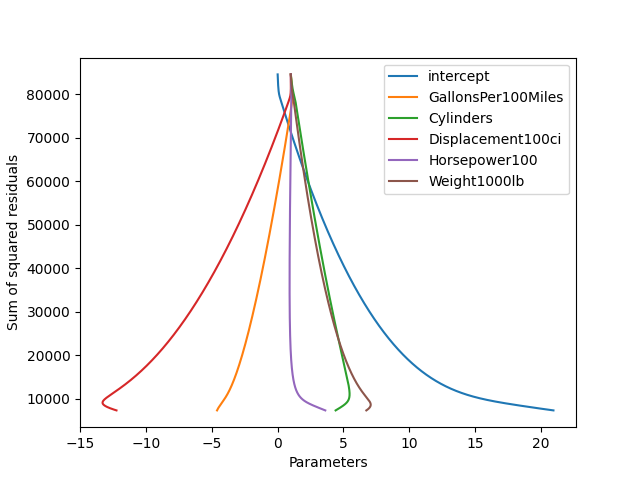

Here


Text(0, 0.5, 'Sum of squared residuals')

In [46]:
dependent_vars = {
    'intercept': intercepts,
    'GallonsPer100Miles': x1s,
    'Cylinders': x2s,
    'Displacement100ci': x3s,
    'Horsepower100': x4s,
    'Weight1000lb': x5s
}

# create 5 subplots vertically with their shared x-axis on the column
# fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(6, sharex='col')
# set figure height to 22
# fig.set_figheight(22)

fig, _ = plt.subplots()

print('Here')

for key in dependent_vars:
    plt.plot(dependent_vars[key], sums_sq_error)
    
plt.legend(dependent_vars.keys())

ax = plt.gca()
ax.set_xlabel('Parameters')
ax.set_ylabel('Sum of squared residuals')

# Make Predictions
# thetas now holds the final values of the parameters

In [47]:
test_x1 = 5.0
test_x2 = 7.5
test_x3 = 2.95
test_x4 = 1.0
test_x5 = 3.0

test_x_values = [test_x1, test_x2, test_x3, test_x4, test_x5]

print('Final thetas:')
for i in range(0, 6):
    print('theta[', i, ']', thetas[i])

predicted_test_y = thetas[0] + sum([(thetas[i + 1] * test_x_values[i]) for i in range(0, 5)])

predicted_test_y

Final thetas:
theta[ 0 ] 20.9727492356835
theta[ 1 ] -4.60931481476971
theta[ 2 ] 4.408234913997859
theta[ 3 ] -12.25671446401023
theta[ 4 ] 3.6217053542533986
theta[ 5 ] 6.7431177334743175


18.681687902665065

# make series for predicted y values

In [48]:
df['predicted_y'] = thetas[0] + sum([(thetas[i] * df['x' + str(i)]) for i in range(1, 6)])
df['predicted_y']

0      21.134454
1      13.335866
2      20.052024
3      18.521214
4      20.355794
         ...    
387    26.319789
388    32.361379
389    26.287936
390    27.865929
391    30.581470
Name: predicted_y, Length: 392, dtype: float64

# make series for differences between real and predicted values of y

In [49]:
df['error'] = abs(df['y'] - df['predicted_y'])
df['error']

0       3.134454
1       1.664134
2       2.052024
3       2.521214
4       3.355794
         ...    
387     0.680211
388    11.638621
389     5.712064
390     0.134071
391     0.418530
Name: error, Length: 392, dtype: float64

# Plots of actual y values against each x values (ax1 - ax5)

<IPython.core.display.Javascript object>


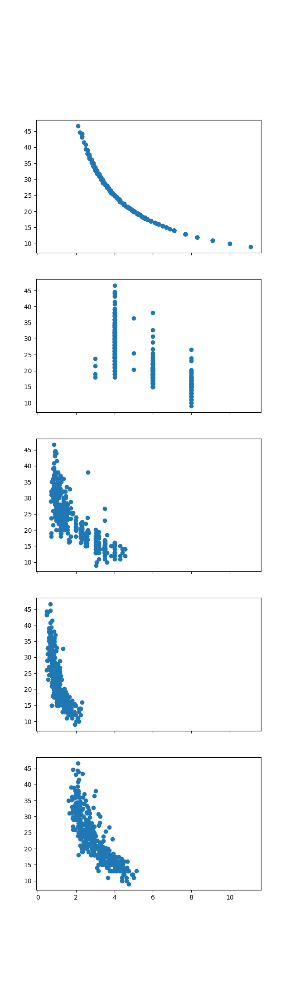

In [50]:
# create 5 subplots vertically with their shared x-axis on the column
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, sharex='col')
# set figure height to 22
fig.set_figheight(22)

ax1.scatter(df['x1'], df['y'])
ax2.scatter(df['x2'], df['y'])
ax3.scatter(df['x3'], df['y'])
ax4.scatter(df['x4'], df['y'])
ax5.scatter(df['x5'], df['y'])

# Plots of predicted y values against each x values (ax6 - ax10)

<IPython.core.display.Javascript object>


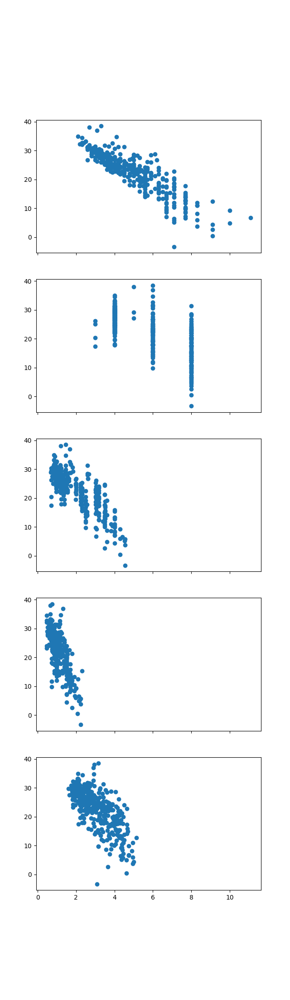

In [51]:
# create 5 subplots vertically with their shared x-axis on the column
fig2, (ax6, ax7, ax8, ax9, ax10) = plt.subplots(5, sharex='col')
# set figure height to 22
fig2.set_figheight(22)

ax6.scatter(df['x1'], df['predicted_y'])
ax7.scatter(df['x2'], df['predicted_y'])
ax8.scatter(df['x3'], df['predicted_y'])
ax9.scatter(df['x4'], df['predicted_y'])
ax10.scatter(df['x5'], df['predicted_y'])